In [1]:
import os
import sys
import pickle
import numpy as np
import matplotlib.pyplot as plt

from tqdm import tqdm
from scipy.linalg import block_diag

module_path = os.path.abspath(os.path.join('../../src'))
if module_path not in sys.path:
    sys.path.append(module_path)
    
module_path = os.path.abspath(os.path.join('../../data'))
if module_path not in sys.path:
    sys.path.append(module_path)
    
from dynamics import Dynamics
from utils import get_form_initial_conditions
from hybrid import Hybrid

In [2]:
# Position estimation error
def position_estimation_error(X_est, X_true):
    return np.linalg.norm(X_est[:3, :, :] - X_true[:3, :, :], axis=0).flatten(), np.linalg.norm(X_est[6:9, :, :] - X_true[6:9, :, :], axis=0).flatten(), np.linalg.norm(X_est[12:15, :, :] - X_true[12:15, :, :], axis=0).flatten(), np.linalg.norm(X_est[18:21, :, :] - X_true[18:21, :, :], axis=0).flatten()

In [3]:
# Simulation parameters
dt = 60.0  # Time step [s]
K = 395  # Duration [min]
M = 1  # Number of Monte-Carlo simulations
N = 4  # Number of satellites
formation = 1
n_x = 6 
n_p = 3  
n = N * n_x
o = 3 + 3 + 2 + 1 
H = 30 # Window size [min]
invalid_rmse = 1e20 # [m]
grad_norm_order_mag = True
grad_norm_tol = 1e-6
max_iterations = 20
dyn = Dynamics()

In [4]:
# Observation noise
r_chief_pos = 1e-1  # [m]
R_chief = np.diag(np.concatenate([r_chief_pos * np.ones(3)])) ** 2
r_deputy_pos = 1e0  # [m]
R_deputies = np.diag(np.concatenate([r_deputy_pos * np.ones(6)])) ** 2
R = block_diag(R_chief, R_deputies)

# Initial deviation noise
p_pos_initial = 1e2  # [m]
p_vel_initial = 1e-2  # [m / s]
P_0 = np.diag(np.concatenate([p_pos_initial * np.ones(3), p_vel_initial * np.ones(3)])) ** 2
P_0 = block_diag(P_0, P_0, P_0, P_0)

In [5]:
def plots(k, algorithm_class):
    iterations = np.arange(0, algorithm_class.iterations + 1)

    fig, axs = plt.subplots(1, 2, figsize=(12, 5))

    # Plot 1
    axs[0].semilogy(iterations, 1 / H * np.array(algorithm_class.cost_values), '.-')
    axs[0].set_xlabel(r'$n$')
    axs[0].set_ylabel(r'$\frac{1}{H}J(x_n)$')
    axs[0].set_title('Normalized Cost Function') 
    axs[0].grid()

    # Plot 2
    axs[1].semilogy(iterations, 1 / H * np.array(algorithm_class.gradient_norm_values), '.-')
    axs[1].set_xlabel(r'$n$')
    axs[1].set_ylabel(r'$\frac{1}{H}||\nabla J(x_n)||_2$')
    axs[1].set_title('Normalized Gradient Norm')
    axs[1].grid()
    
    fig.suptitle(f'Solving MHE problem J(k) with k = {k}', fontsize=14)

    plt.tight_layout()
    plt.show()

In [6]:
# Seed for reproducibility
np.random.seed(42)

# Initial conditions for the state vector and true state vectors
X_initial = get_form_initial_conditions(formation)
with open(f"../../data/tudatpy_form{formation}_ts_{int(dt)}.pkl", "rb") as file:
    X_true = pickle.load(file)[:, :, :K]

# Initial position estimation error
X_est = np.zeros_like(X_true)
X_est[:, :, 0] = X_initial + np.random.multivariate_normal(np.zeros(n), P_0).reshape((n, 1))
for k in range(K - 1):
    X_est[:, :, k + 1] = dyn.f(dt, X_est[:, :, k])
position_estimation_error_1_initial, position_estimation_error_2_initial, position_estimation_error_3_initial, position_estimation_error_4_initial = position_estimation_error(X_est, X_true)

# Algorithm class to use
centralized_newton = Hybrid(H, K, o, R, grad_norm_order_mag, grad_norm_tol, max_iterations)

# Observations
Y = np.zeros((o, 1, K))
for k in range(K):
    Y[:, :, k] = centralized_newton.h(X_true[:, :, k]) + np.random.multivariate_normal(np.zeros(o), R).reshape((o, 1))

Windows:   0%|          | 0/366 [00:00<?, ?it/s]

[Hybrid] Before applying the algorithm
Cost function: 301224484.31091917
Gradient norm: 2089042806.9658494
Global estimation error: 429.5049051950654
Initial conditions estimation errors: 272.4697073631671 m, 173.20827048056321 m, 227.77973283351287 m, 168.3746081658613 m
Position estimation errors: 779.5967223627993 m, 1207.595181126871 m, 483.10528555259594 m, 358.4329736499271 m

[Hybrid] Iteration 1
Cost function: 404974.91577723005 (-99.87%)
Gradient norm: 1572914.432853373 (-99.92%)
Global estimation error: 392.1053681408352 (-8.71%)
Initial conditions estimation errors: 30.420150303708866 m, 178.92273244618085 m, 260.95678316319083 m, 229.5851784363508 m
Position estimation errors: 23.50475044592921 m, 104.75611617544249 m, 184.64566590868483 m, 177.41482032935062 m

[Hybrid] Iteration 2
Cost function: 15704980.45973188 (3778.01%)
Gradient norm: 77015230.09416081 (4796.34%)
Global estimation error: 959.5556988673628 (144.72%)
Initial conditions estimation errors: 30.419301958797

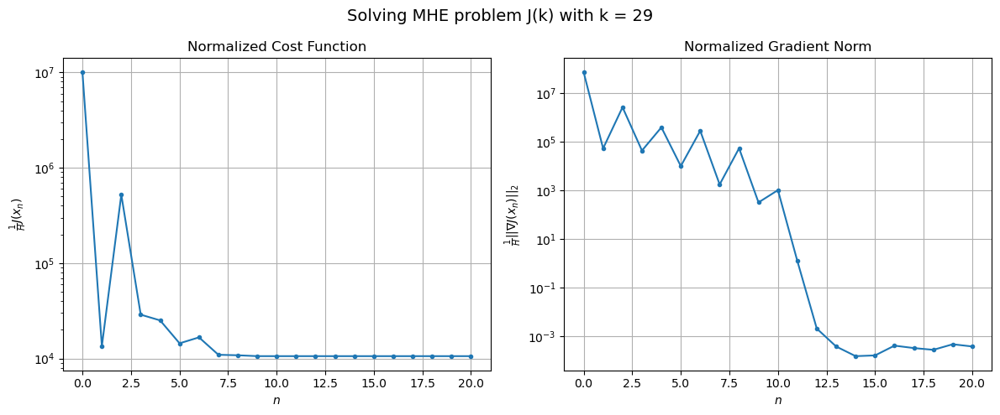

Windows:   0%|          | 1/366 [01:19<8:00:50, 79.04s/it]

[Hybrid] Before applying the algorithm
Cost function: 309964.1664563853
Gradient norm: 2619507.551382956
Global estimation error: 46.845977378848794
Initial conditions estimation errors: 23.648418712075348 m, 23.03902734315846 m, 23.70257038253474 m, 23.29412076420644 m
Position estimation errors: 27.38945315399357 m, 30.263269232944676 m, 26.47570265609594 m, 26.720068166197645 m

[Hybrid] Iteration 1
Cost function: 295681.950933472 (-4.61%)
Gradient norm: 41.89127293016164 (-100.00%)
Global estimation error: 56.776162309046775 (21.20%)
Initial conditions estimation errors: 29.010174051727354 m, 28.54835031014884 m, 27.80309740241807 m, 28.17518631228893 m
Position estimation errors: 23.437314180949887 m, 26.424092197799055 m, 22.567387345781803 m, 22.864502233906983 m

[Hybrid] Iteration 2
Cost function: 295681.95021386613 (-0.00%)
Gradient norm: 0.01290694741008765 (-99.97%)
Global estimation error: 56.752870858182504 (-0.04%)
Initial conditions estimation errors: 29.010175386953197

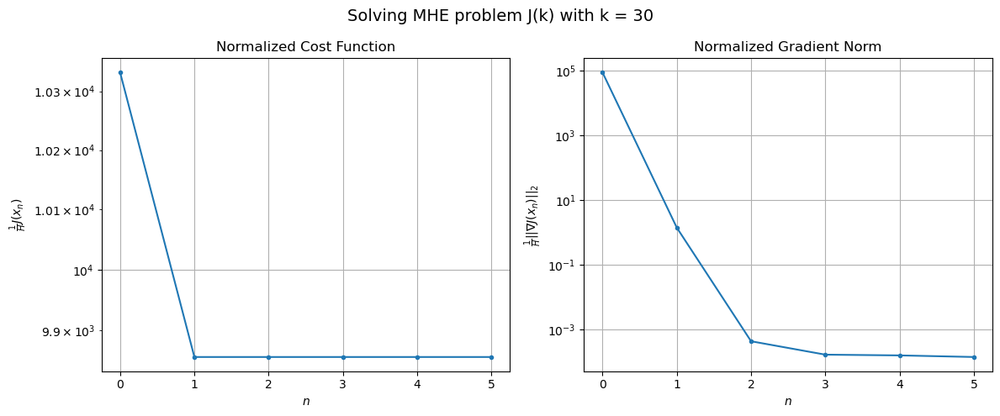

Windows:   1%|          | 2/366 [01:42<4:41:28, 46.40s/it]

[Hybrid] Before applying the algorithm
Cost function: 290767.88292880444
Gradient norm: 2592936.721473741
Global estimation error: 43.579604032487374
Initial conditions estimation errors: 22.78043099860274 m, 22.22842229905307 m, 21.325305139982355 m, 20.767779760580176 m
Position estimation errors: 27.20271189618084 m, 30.143067275982506 m, 26.494575897402612 m, 26.996390978526367 m

[Hybrid] Iteration 1
Cost function: 277310.3149092355 (-4.63%)
Gradient norm: 61.22351800037281 (-100.00%)
Global estimation error: 57.714115352815284 (32.43%)
Initial conditions estimation errors: 27.821463486863376 m, 27.946273987316893 m, 29.46841475290317 m, 30.12367059563418 m
Position estimation errors: 23.14460471743213 m, 25.339780607325935 m, 21.354333919137517 m, 21.534169337329008 m

[Hybrid] Iteration 2
Cost function: 277310.3134649074 (-0.00%)
Gradient norm: 0.05073341155282969 (-99.92%)
Global estimation error: 57.6032083470381 (-0.19%)
Initial conditions estimation errors: 27.8214648340575 

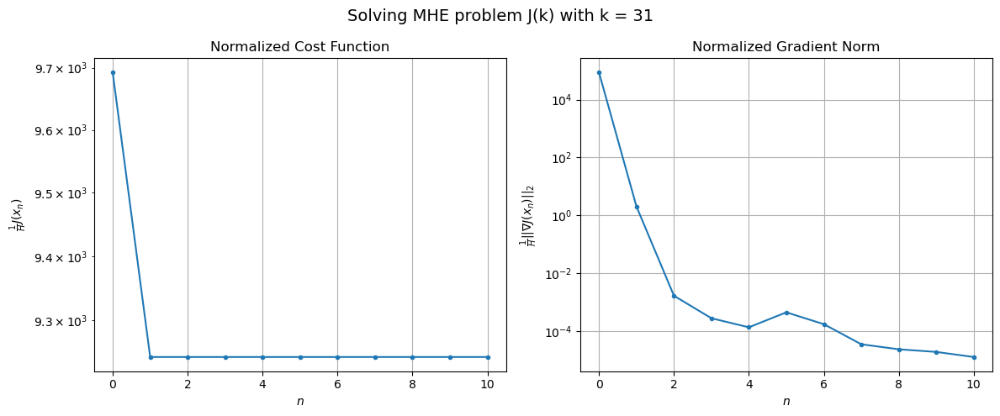

Windows:   1%|          | 3/366 [02:23<4:25:57, 43.96s/it]

[Hybrid] Before applying the algorithm
Cost function: 273824.9925228524
Gradient norm: 2624164.1236078525
Global estimation error: 45.5998239636694
Initial conditions estimation errors: 22.08607518018237 m, 22.160451607008635 m, 23.243200855328304 m, 23.667824624063332 m
Position estimation errors: 26.695855070355204 m, 28.833672224749428 m, 24.9357281754483 m, 25.240079215104423 m

[Hybrid] Iteration 1
Cost function: 261052.63671696253 (-4.66%)
Gradient norm: 101.50228828030431 (-100.00%)
Global estimation error: 59.727287690756526 (30.98%)
Initial conditions estimation errors: 26.87745211050408 m, 25.62569425088381 m, 33.667542165430596 m, 32.47638683908449 m
Position estimation errors: 22.548514032309846 m, 26.011700938192547 m, 18.091562508507902 m, 17.031030953243334 m

[Hybrid] Iteration 2
Cost function: 261052.62560709668 (-0.00%)
Gradient norm: 0.6801547714604399 (-99.33%)
Global estimation error: 59.22275463786086 (-0.84%)
Initial conditions estimation errors: 26.8774533291169

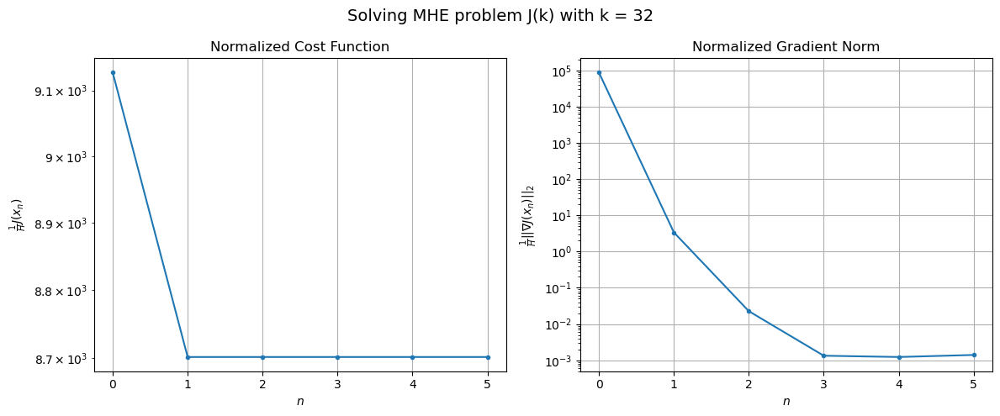

Windows:   1%|          | 4/366 [02:49<3:43:04, 36.97s/it]

[Hybrid] Before applying the algorithm
Cost function: 258016.21382542152
Gradient norm: 2726644.215849355
Global estimation error: 48.339504697321836
Initial conditions estimation errors: 21.56797741004889 m, 20.30020985997696 m, 27.17058407516976 m, 26.85420333348615 m
Position estimation errors: 25.810101226724697 m, 29.371987379364377 m, 21.46491101205494 m, 20.467906886948267 m

[Hybrid] Iteration 1
Cost function: 246112.46408635605 (-4.61%)
Gradient norm: 21.620644576718274 (-100.00%)
Global estimation error: 59.04183837645185 (22.14%)
Initial conditions estimation errors: 26.11667171738034 m, 25.65674232499075 m, 32.351269773903574 m, 33.15024482787511 m
Position estimation errors: 21.66242944940271 m, 24.361127045581256 m, 17.56445238046527 m, 17.22302757307704 m

[Hybrid] Iteration 2
Cost function: 246112.46404314062 (-0.00%)
Gradient norm: 0.0090317899217843 (-99.96%)
Global estimation error: 59.00342550629175 (-0.07%)
Initial conditions estimation errors: 26.116672770878946 m

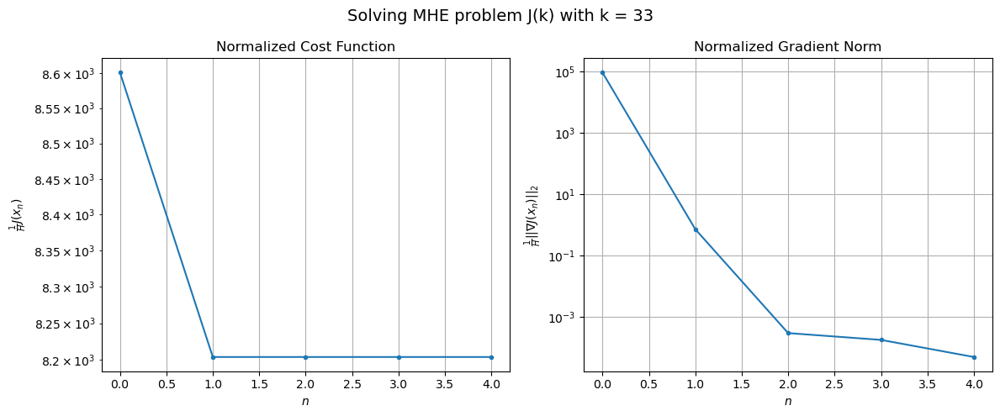

Windows:   1%|▏         | 5/366 [03:09<3:04:24, 30.65s/it]

[Hybrid] Before applying the algorithm
Cost function: 242488.87084428445
Gradient norm: 2869612.8668894772
Global estimation error: 48.870212353762255
Initial conditions estimation errors: 21.13932393575284 m, 20.746580038324065 m, 26.907618494993436 m, 28.052630000625577 m
Position estimation errors: 24.5827395380287 m, 27.465426952995596 m, 20.53101592474192 m, 19.916206266721783 m

[Hybrid] Iteration 1
Cost function: 231381.77127909067 (-4.58%)
Gradient norm: 130.4267465809373 (-100.00%)
Global estimation error: 52.41007369467861 (7.24%)
Initial conditions estimation errors: 25.47912673911682 m, 23.192984474391732 m, 29.24892879053728 m, 26.536336408076618 m
Position estimation errors: 20.467517788205054 m, 25.09225224277286 m, 16.070950533724258 m, 15.439576084974924 m

[Hybrid] Iteration 2
Cost function: 231381.76879576466 (-0.00%)
Gradient norm: 0.015913528688184738 (-99.99%)
Global estimation error: 52.39515103598121 (-0.03%)
Initial conditions estimation errors: 25.479127594391

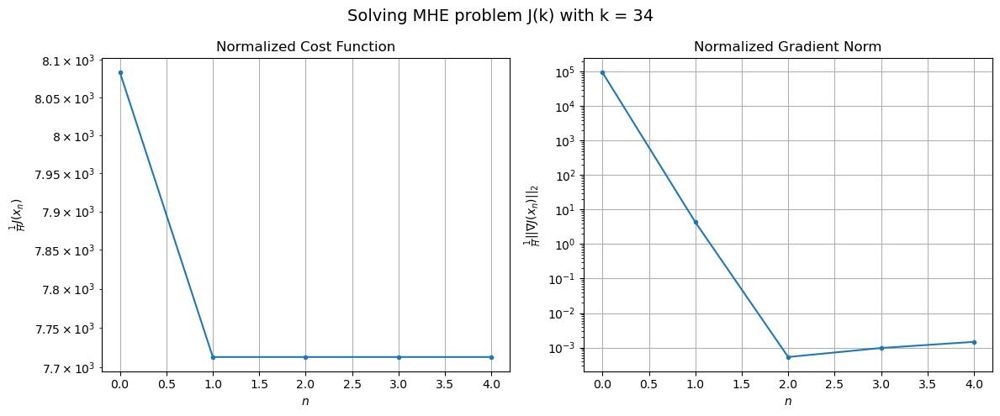

Windows:   2%|▏         | 6/366 [03:32<2:49:16, 28.21s/it]

[Hybrid] Before applying the algorithm
Cost function: 225795.97688166905
Gradient norm: 2992342.046085847
Global estimation error: 42.90796720950212
Initial conditions estimation errors: 20.742018707749864 m, 18.62019314913938 m, 23.733693028057072 m, 22.379268411426292 m
Position estimation errors: 23.02013295250761 m, 27.79344869807687 m, 19.025832287816 m, 17.94440535533679 m

[Hybrid] Iteration 1
Cost function: 215523.90039699926 (-4.55%)
Gradient norm: 84.16685367846796 (-100.00%)
Global estimation error: 48.985723100315575 (14.16%)
Initial conditions estimation errors: 24.881904490486477 m, 23.397451390807934 m, 26.229850662967763 m, 23.345505359054574 m
Position estimation errors: 18.99057621684125 m, 22.93479888883386 m, 18.44526828983908 m, 18.521654433042784 m

[Hybrid] Iteration 2
Cost function: 215523.89995031778 (-0.00%)
Gradient norm: 0.06370698138305815 (-99.92%)
Global estimation error: 48.85603352556477 (-0.26%)
Initial conditions estimation errors: 24.881905159578167 

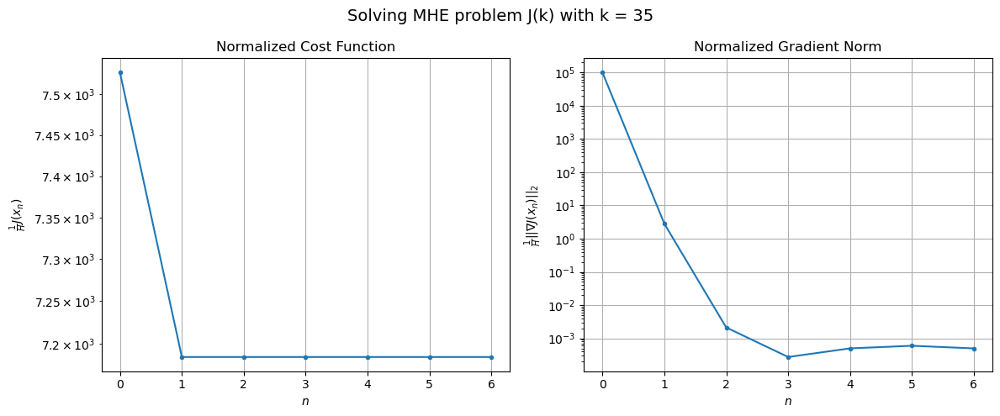

Windows:   2%|▏         | 7/366 [04:02<2:51:08, 28.60s/it]

[Hybrid] Before applying the algorithm
Cost function: 207015.53069206665
Gradient norm: 3180298.5259513482
Global estimation error: 39.45994334170797
Initial conditions estimation errors: 20.30907670602614 m, 19.007237640388034 m, 20.93317975107248 m, 18.57762245750128 m
Position estimation errors: 21.19227727341127 m, 25.24943120984974 m, 21.097782080093527 m, 20.959610332705473 m

[Hybrid] Iteration 1
Cost function: 197686.20292428797 (-4.51%)
Gradient norm: 195.39617455792683 (-99.99%)
Global estimation error: 41.66824423839848 (5.60%)
Initial conditions estimation errors: 24.236530077328332 m, 22.986291357068684 m, 19.34470012149075 m, 15.691293905142745 m
Position estimation errors: 17.320465582655313 m, 22.28040814675286 m, 15.383137039635761 m, 15.205956859979274 m

[Hybrid] Iteration 2
Cost function: 197686.2017788042 (-0.00%)
Gradient norm: 0.005525934965192577 (-100.00%)
Global estimation error: 41.68543956555472 (0.04%)
Initial conditions estimation errors: 24.23653058697359

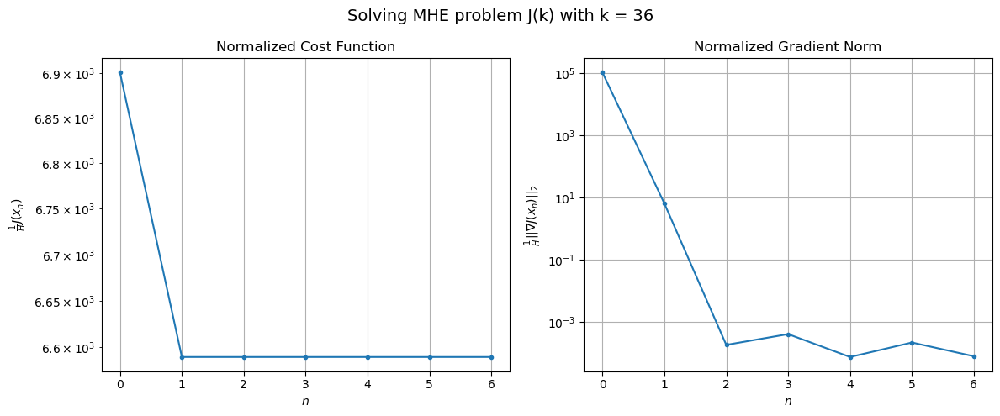

Windows:   2%|▏         | 8/366 [04:30<2:50:00, 28.49s/it]

[Hybrid] Before applying the algorithm
Cost function: 186655.03934671564
Gradient norm: 3307442.3315254906
Global estimation error: 33.11644782460692
Initial conditions estimation errors: 19.760060120410387 m, 18.76587082191996 m, 14.771458571702377 m, 11.655896761937653 m
Position estimation errors: 19.23766123614929 m, 24.090328370479966 m, 17.96746831334743 m, 17.63366707308412 m

[Hybrid] Iteration 1
Cost function: 178471.78047364354 (-4.38%)
Gradient norm: 136.28494023532414 (-100.00%)
Global estimation error: 38.17233142643138 (15.27%)
Initial conditions estimation errors: 23.42208707258012 m, 22.64561524489021 m, 15.773234662932222 m, 12.119647319434108 m
Position estimation errors: 15.603386090350886 m, 21.047136463568147 m, 11.833911075622256 m, 11.491413044207741 m

[Hybrid] Iteration 2
Cost function: 178471.78016329993 (-0.00%)
Gradient norm: 0.08596430759884087 (-99.94%)
Global estimation error: 38.089970192077296 (-0.22%)
Initial conditions estimation errors: 23.4220874365

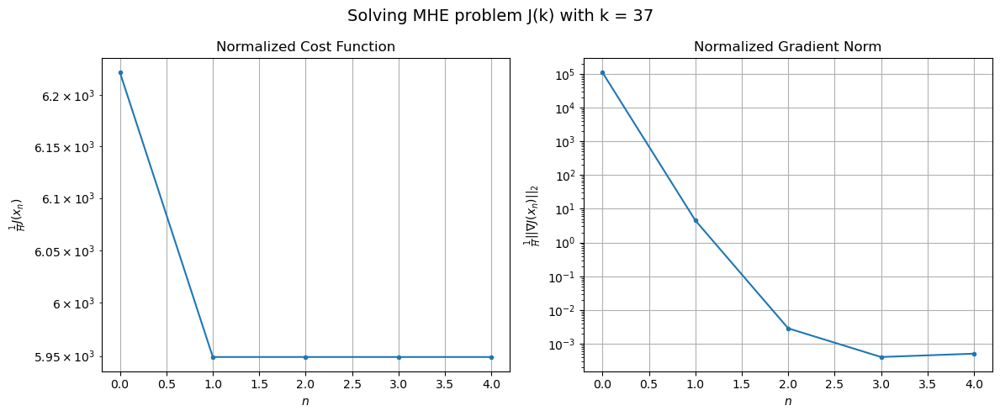

Windows:   2%|▏         | 9/366 [04:52<2:38:09, 26.58s/it]

[Hybrid] Before applying the algorithm
Cost function: 165956.01008045385
Gradient norm: 3560220.2014508136
Global estimation error: 30.422962439230332
Initial conditions estimation errors: 18.988120267028567 m, 18.547060032591762 m, 11.815080092374137 m, 9.021805880454567 m
Position estimation errors: 17.367537800704156 m, 22.51476468985866 m, 14.572495565332682 m, 13.95379335880342 m

[Hybrid] Iteration 1
Cost function: 158787.53942033107 (-4.32%)
Gradient norm: 52.47950626862453 (-100.00%)
Global estimation error: 35.92176856662528 (18.07%)
Initial conditions estimation errors: 22.38243582734348 m, 21.740905623410097 m, 13.29926444787664 m, 11.825190614756501 m
Position estimation errors: 13.97781911582911 m, 19.63770160544826 m, 10.581083525550717 m, 10.495775163868494 m

[Hybrid] Iteration 2
Cost function: 158787.53918840128 (-0.00%)
Gradient norm: 0.10577082478715241 (-99.80%)
Global estimation error: 35.95199872916323 (0.08%)
Initial conditions estimation errors: 22.3824360854152

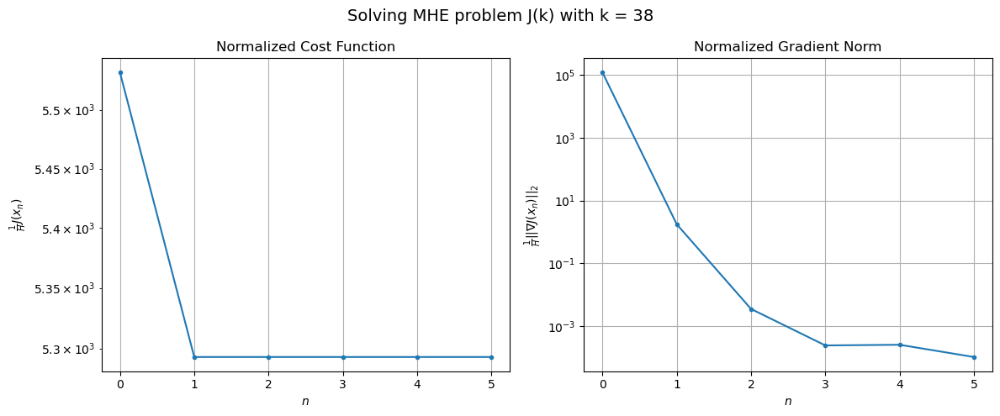

Windows:   3%|▎         | 10/366 [05:16<2:33:08, 25.81s/it]

[Hybrid] Before applying the algorithm
Cost function: 146311.89505420436
Gradient norm: 3650260.4896649686
Global estimation error: 29.712090065579275
Initial conditions estimation errors: 17.96481747755948 m, 17.703479485237693 m, 10.431355504781738 m, 11.739757719529655 m
Position estimation errors: 15.738450095585646 m, 20.943268646547867 m, 13.438614597410394 m, 13.001508305716651 m

[Hybrid] Iteration 1
Cost function: 140122.78564031463 (-4.23%)
Gradient norm: 410.8604819527936 (-99.99%)
Global estimation error: 34.68617514083213 (16.74%)
Initial conditions estimation errors: 21.07967458503572 m, 20.130544995836402 m, 14.283864280856125 m, 12.22642435433773 m
Position estimation errors: 12.64047016696063 m, 16.943655106736003 m, 14.808314077077164 m, 14.804913205105889 m

[Hybrid] Iteration 2
Cost function: 140122.78442398313 (-0.00%)
Gradient norm: 0.008279561872365428 (-100.00%)
Global estimation error: 34.67543037559554 (-0.03%)
Initial conditions estimation errors: 21.07967476

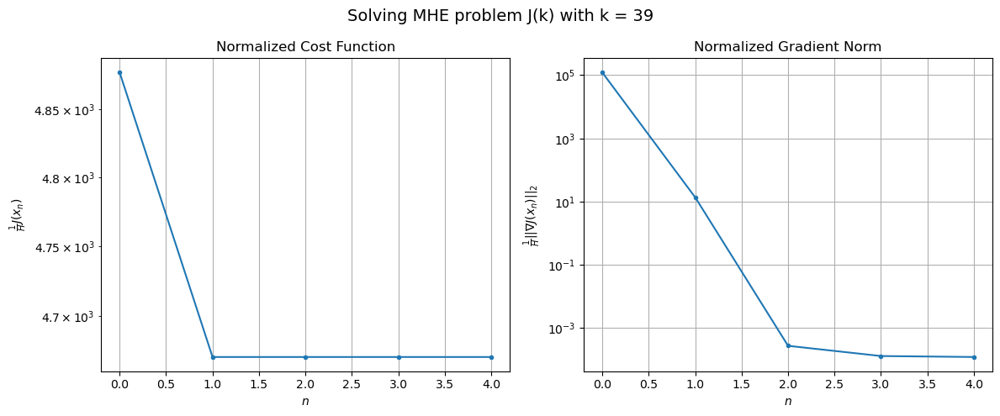

Windows:   3%|▎         | 11/366 [05:37<2:22:31, 24.09s/it]

[Hybrid] Before applying the algorithm
Cost function: 128086.33700065671
Gradient norm: 3775870.6154653365
Global estimation error: 27.255538914021287
Initial conditions estimation errors: 16.704860528707073 m, 16.07524762666876 m, 10.000576489827504 m, 10.264712144049327 m
Position estimation errors: 14.52366733542062 m, 18.463079722948716 m, 16.92868606502641 m, 17.021134326252014 m

[Hybrid] Iteration 1
Cost function: 122938.19924738917 (-4.02%)
Gradient norm: 634.7541968651193 (-99.98%)
Global estimation error: 34.03049568194142 (24.86%)
Initial conditions estimation errors: 19.496739513861456 m, 19.301193026603425 m, 13.42883732014476 m, 15.001856617123725 m
Position estimation errors: 11.765992024961383 m, 16.794740027839538 m, 11.091728647092319 m, 10.931171991986341 m

[Hybrid] Iteration 2
Cost function: 122938.19174210759 (-0.00%)
Gradient norm: 0.71254635050111 (-99.89%)
Global estimation error: 34.264043879680706 (0.69%)
Initial conditions estimation errors: 19.4967396214726

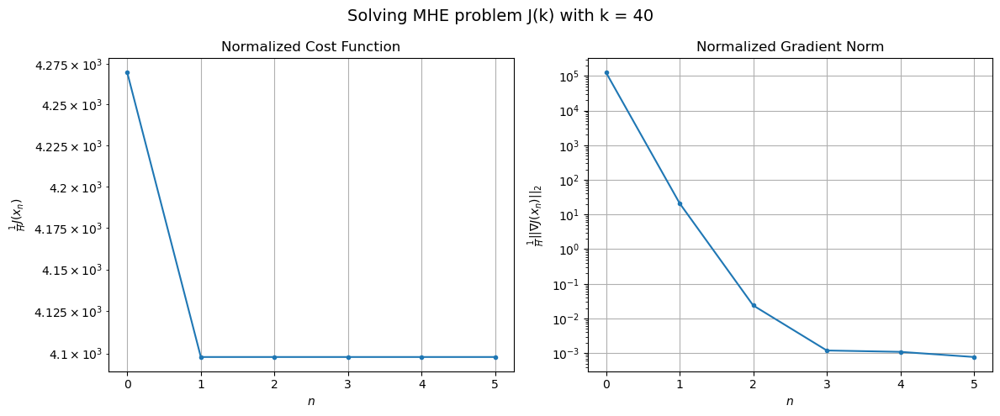

Windows:   3%|▎         | 12/366 [06:04<2:28:15, 25.13s/it]

[Hybrid] Before applying the algorithm
Cost function: 113278.44887300556
Gradient norm: 3983209.6708222525
Global estimation error: 31.11799993048788
Initial conditions estimation errors: 15.239384546293211 m, 15.495022770573101 m, 12.919206069334717 m, 18.140184276651812 m
Position estimation errors: 13.81325877657198 m, 18.31023387350692 m, 13.935508200117521 m, 13.672467613866749 m

[Hybrid] Iteration 1
Cost function: 108919.34522554633 (-3.85%)
Gradient norm: 250.62660027939614 (-99.99%)
Global estimation error: 35.709554103633664 (14.76%)
Initial conditions estimation errors: 17.739796557537584 m, 18.729703580500388 m, 20.678285880937167 m, 13.492633684474344 m
Position estimation errors: 11.328186873585823 m, 15.983596984108273 m, 10.749181118286012 m, 10.959039035301155 m

[Hybrid] Iteration 2
Cost function: 108919.34333261175 (-0.00%)
Gradient norm: 0.06716232760757149 (-99.97%)
Global estimation error: 35.749334693294266 (0.11%)
Initial conditions estimation errors: 17.7397966

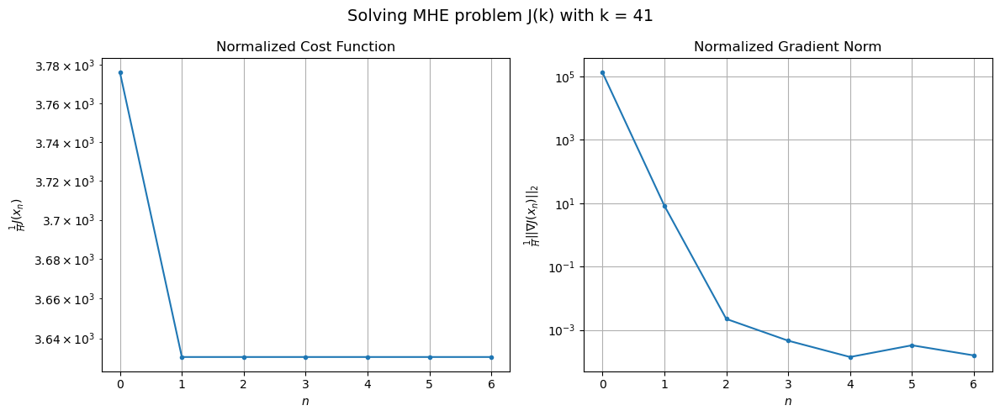

Windows:   4%|▎         | 13/366 [06:33<2:34:23, 26.24s/it]

[Hybrid] Before applying the algorithm
Cost function: 102157.80142579028
Gradient norm: 4161299.381384948
Global estimation error: 34.138901999363405
Initial conditions estimation errors: 13.686371635147877 m, 15.189064609584404 m, 20.639063525746536 m, 17.928921469595146 m
Position estimation errors: 13.511277998784387 m, 17.797758477551415 m, 13.837629935357459 m, 13.665622199562042 m

[Hybrid] Iteration 1
Cost function: 98532.31164958159 (-3.55%)
Gradient norm: 47.74264493079295 (-100.00%)
Global estimation error: 38.75031597175719 (13.51%)
Initial conditions estimation errors: 15.879667923131283 m, 17.548543513791117 m, 19.472521577626548 m, 23.712221825218936 m
Position estimation errors: 11.241861181757825 m, 14.889694227598865 m, 11.382867519487457 m, 11.499958921094949 m

[Hybrid] Iteration 2
Cost function: 98532.31099216657 (-0.00%)
Gradient norm: 0.08078115072355532 (-99.83%)
Global estimation error: 38.4975333030395 (-0.65%)
Initial conditions estimation errors: 15.879667975

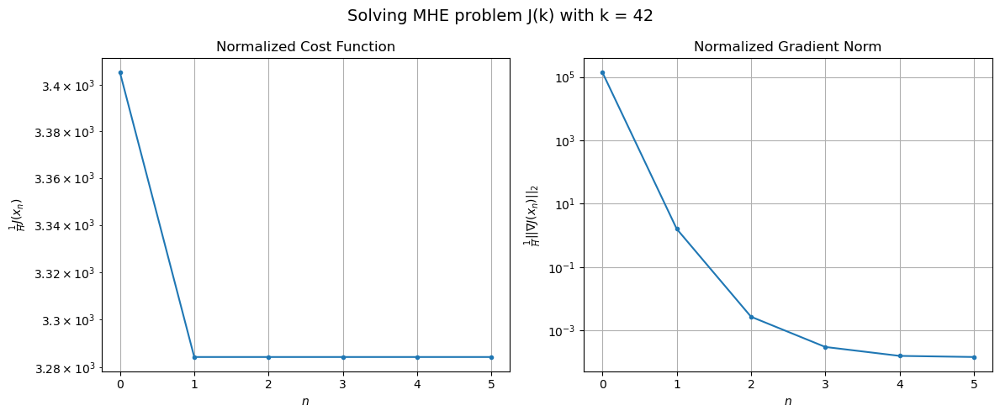

Windows:   4%|▍         | 14/366 [06:56<2:28:24, 25.30s/it]

[Hybrid] Before applying the algorithm
Cost function: 95050.96944852053
Gradient norm: 4271321.856096512
Global estimation error: 38.88918128764735
Initial conditions estimation errors: 12.121453245183151 m, 14.117358837336827 m, 20.91330930186229 m, 26.995431892438077 m
Position estimation errors: 13.505262269238894 m, 16.81803459316239 m, 14.629213778575513 m, 14.659624393479426 m

[Hybrid] Iteration 1
Cost function: 92003.72641576051 (-3.21%)
Gradient norm: 32.830571228443915 (-100.00%)
Global estimation error: 35.62510665158996 (-8.39%)
Initial conditions estimation errors: 14.043966530405486 m, 16.10235792044311 m, 15.26580258416101 m, 24.07414137152 m
Position estimation errors: 11.37628516957534 m, 14.44526214886037 m, 10.9796573467435 m, 10.882631336899188 m

[Hybrid] Iteration 2
Cost function: 92003.72619228392 (-0.00%)
Gradient norm: 0.011066625099598786 (-99.97%)
Global estimation error: 35.56981223374165 (-0.16%)
Initial conditions estimation errors: 14.043966592739784 m, 1

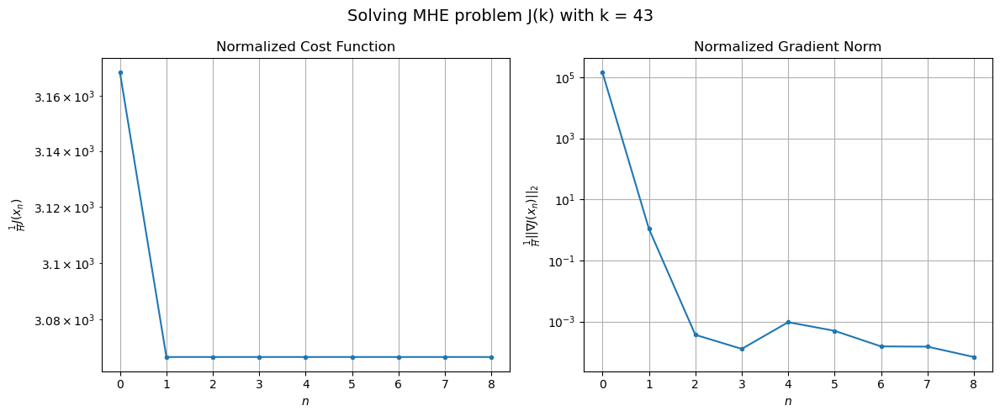

Windows:   4%|▍         | 15/366 [07:31<2:45:32, 28.30s/it]

[Hybrid] Before applying the algorithm
Cost function: 91617.8307175552
Gradient norm: 4482967.3331487235
Global estimation error: 36.75349967770349
Initial conditions estimation errors: 10.682822689443336 m, 13.066754032366314 m, 18.006857120877452 m, 27.234053771897045 m
Position estimation errors: 13.675450525616805 m, 16.41493338438205 m, 13.874036504299658 m, 13.490693406646526 m

[Hybrid] Iteration 1
Cost function: 88886.44031953486 (-2.98%)
Gradient norm: 3562.8074864823975 (-99.92%)
Global estimation error: 34.35364296791543 (-6.53%)
Initial conditions estimation errors: 12.412242723970657 m, 12.028296391229164 m, 17.949727201053484 m, 23.647906436697863 m
Position estimation errors: 11.556561887074245 m, 12.264727831896307 m, 15.278361796374794 m, 16.438434221060437 m

[Hybrid] Iteration 2
Cost function: 88886.19928820718 (-0.00%)
Gradient norm: 5.37171915645803 (-99.85%)
Global estimation error: 33.192665520428754 (-3.38%)
Initial conditions estimation errors: 12.4122427969205

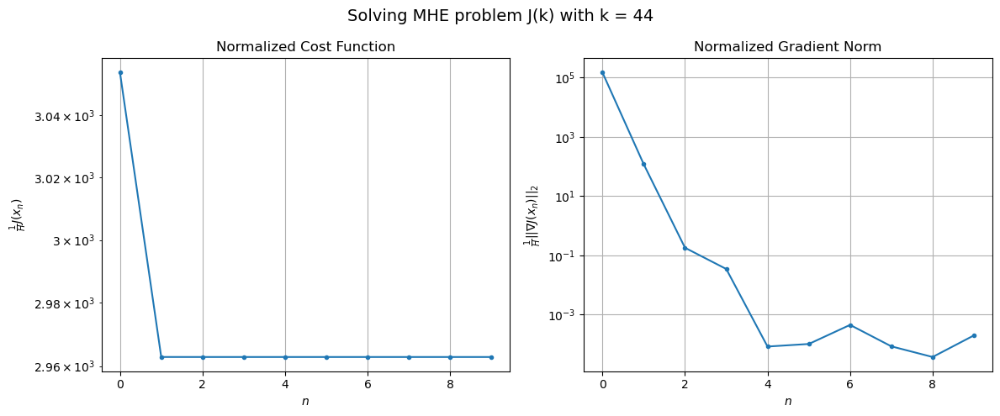

Windows:   4%|▍         | 16/366 [08:09<3:00:44, 30.98s/it]

[Hybrid] Before applying the algorithm
Cost function: 90641.77566409454
Gradient norm: 4523124.837900225
Global estimation error: 27.67989567226
Initial conditions estimation errors: 9.547862049047703 m, 9.37964085113551 m, 14.002573041620723 m, 19.77257789267163 m
Position estimation errors: 13.864285974113907 m, 14.616637820122182 m, 16.57632262510389 m, 17.494143613353177 m

[Hybrid] Iteration 1
Cost function: 88166.47210048012 (-2.73%)
Gradient norm: 323.9729012065558 (-99.99%)
Global estimation error: 40.8269715413512 (47.50%)
Initial conditions estimation errors: 11.12617774513305 m, 9.895170652223959 m, 25.16469706524008 m, 28.49322493501526 m
Position estimation errors: 11.737834631972822 m, 11.599051849298327 m, 16.309574789635043 m, 18.34524532751006 m

[Hybrid] Iteration 2
Cost function: 88166.46980784829 (-0.00%)
Gradient norm: 1.891999819953191 (-99.42%)
Global estimation error: 41.8205775987344 (2.43%)
Initial conditions estimation errors: 11.126177858150182 m, 9.82686709

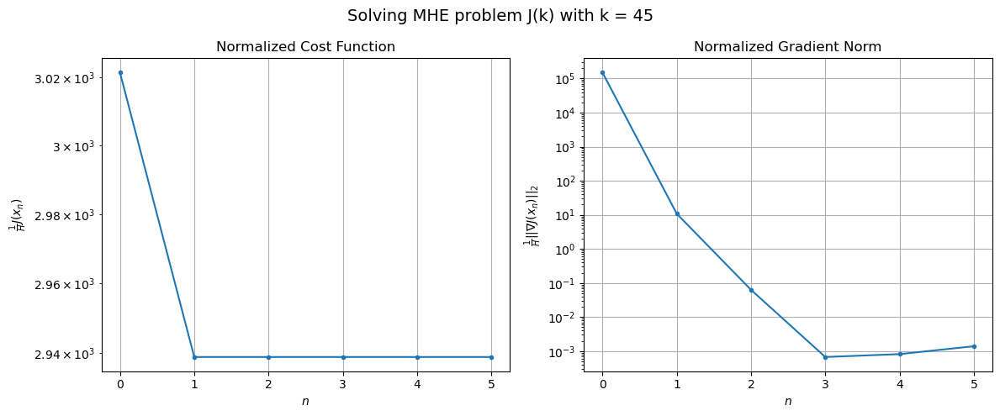

Windows:   5%|▍         | 17/366 [08:35<2:52:27, 29.65s/it]

[Hybrid] Before applying the algorithm
Cost function: 91979.11482205633
Gradient norm: 4752435.834430617
Global estimation error: 38.25579378382278
Initial conditions estimation errors: 8.79880082795409 m, 7.71731347441574 m, 24.366290245613875 m, 27.070398209774936 m
Position estimation errors: 14.060128588574866 m, 13.795996358721318 m, 17.534604641257516 m, 19.37343377188578 m

[Hybrid] Iteration 1
Cost function: 89549.16959246452 (-2.64%)
Gradient norm: 861.0048894278331 (-99.98%)
Global estimation error: 22.910796719389264 (-40.11%)
Initial conditions estimation errors: 10.298149289950079 m, 12.455226646243942 m, 3.699948862977792 m, 15.812080356969194 m
Position estimation errors: 11.83849146623456 m, 11.898728517769504 m, 16.70385548218155 m, 17.550774127228625 m

[Hybrid] Iteration 2
Cost function: 89549.12337674364 (-0.00%)
Gradient norm: 44.69292330934174 (-94.81%)
Global estimation error: 23.343517969896446 (1.89%)
Initial conditions estimation errors: 10.29814943579973 m, 1

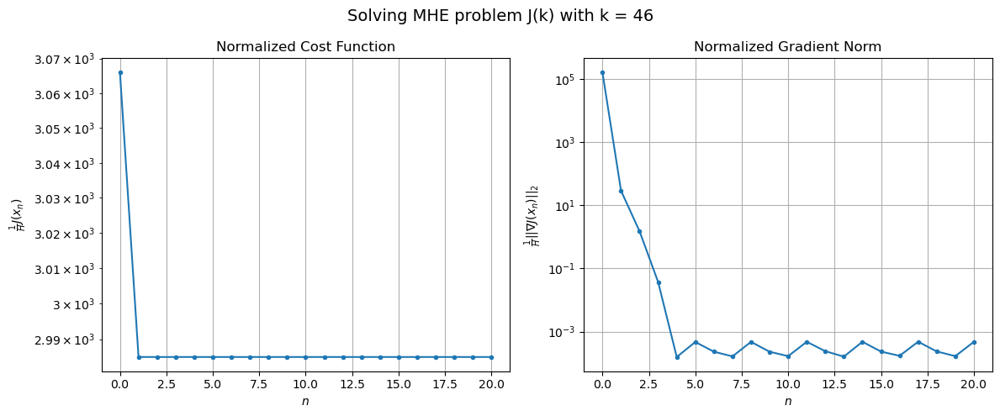

Windows:   5%|▍         | 18/366 [09:57<4:22:11, 45.21s/it]

[Hybrid] Before applying the algorithm
Cost function: 94189.67081781826
Gradient norm: 4782420.461588485
Global estimation error: 20.308064757951986
Initial conditions estimation errors: 8.471268217010323 m, 10.230526094296568 m, 6.671784994124203 m, 13.837354755634186 m
Position estimation errors: 14.19375767729755 m, 14.045866448080421 m, 19.160753193975967 m, 20.550380891943284 m

[Hybrid] Iteration 1
Cost function: 91766.1537030909 (-2.57%)
Gradient norm: 1742.4982456945006 (-99.96%)
Global estimation error: 49.644509987330274 (144.46%)
Initial conditions estimation errors: 9.96945600506956 m, 8.95674588616536 m, 32.81164087052798 m, 34.76141343656258 m
Position estimation errors: 11.916832653420043 m, 11.665107687325333 m, 21.25712339650283 m, 25.044681659330916 m

[Hybrid] Iteration 2
Cost function: 91766.07805260856 (-0.00%)
Gradient norm: 22.60128927017977 (-98.70%)
Global estimation error: 53.677956824665664 (8.12%)
Initial conditions estimation errors: 9.969456173464142 m, 8.

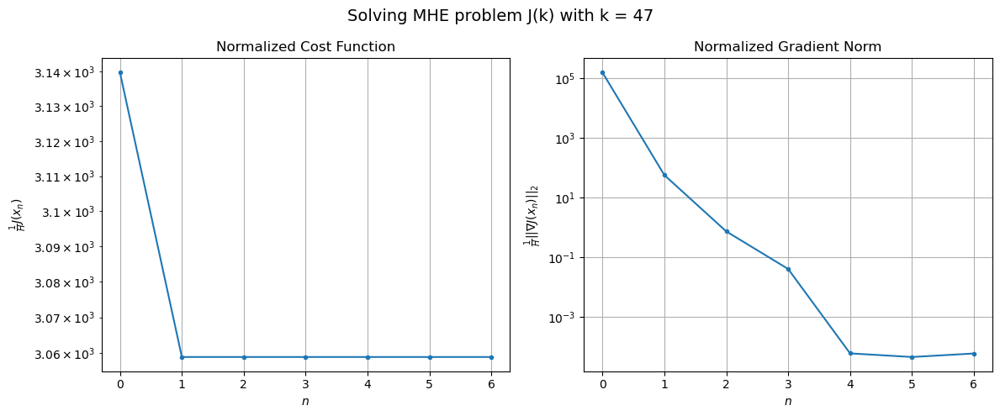

Windows:   5%|▌         | 19/366 [10:26<3:53:20, 40.35s/it]

[Hybrid] Before applying the algorithm
Cost function: 96959.76972230576
Gradient norm: 4895047.097922711
Global estimation error: 53.531335874523776
Initial conditions estimation errors: 8.562879676867166 m, 8.304262326434934 m, 35.42369416288178 m, 38.32073461166148 m
Position estimation errors: 14.327198421620906 m, 14.04569807463623 m, 22.569275113281783 m, 26.01797114300836 m

[Hybrid] Iteration 1
Cost function: 94470.72597986954 (-2.57%)
Gradient norm: 765.3383998383703 (-99.98%)
Global estimation error: 81.7802558420579 (52.77%)
Initial conditions estimation errors: 10.076604030050996 m, 9.714208785074906 m, 53.72917914838041 m, 60.04396795523581 m
Position estimation errors: 11.972770483658582 m, 10.373515259050144 m, 22.63585720469588 m, 27.56786832526297 m

[Hybrid] Iteration 2
Cost function: 94470.70799445626 (-0.00%)
Gradient norm: 20.056023724028794 (-97.38%)
Global estimation error: 77.64232115429807 (-5.06%)
Initial conditions estimation errors: 10.076604185650334 m, 9.78

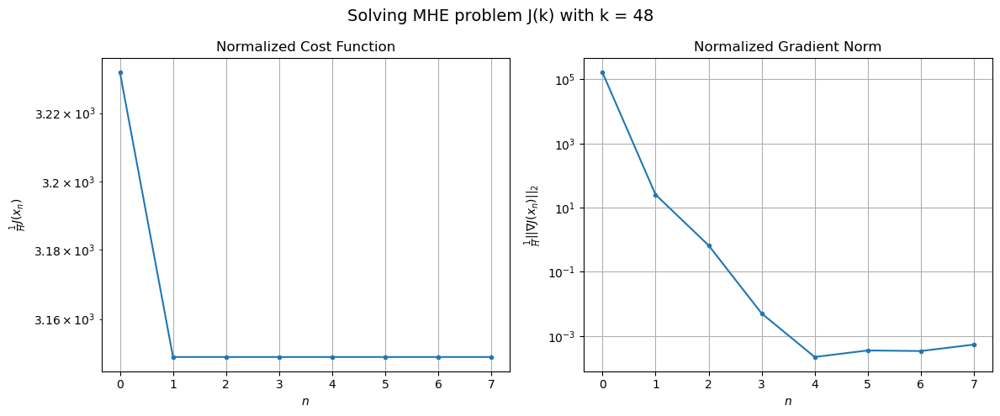

Windows:   5%|▌         | 20/366 [10:58<3:38:56, 37.97s/it]

[Hybrid] Before applying the algorithm
Cost function: 100217.37164299533
Gradient norm: 4997614.649115505
Global estimation error: 76.94476592021047
Initial conditions estimation errors: 8.960279903139696 m, 9.605294975511418 m, 50.300988780091394 m, 56.725267610958724 m
Position estimation errors: 14.427229401925553 m, 12.804360184651076 m, 22.804516804695968 m, 25.878103514460506 m

[Hybrid] Iteration 1
Cost function: 97593.84675391938 (-2.62%)
Gradient norm: 188.96586395231753 (-100.00%)
Global estimation error: 57.53578499489994 (-25.22%)
Initial conditions estimation errors: 10.545620803072506 m, 11.437500652694286 m, 38.01048152259013 m, 40.29317578263023 m
Position estimation errors: 12.002725407390942 m, 11.145267550164021 m, 24.44874792778818 m, 30.117986678087384 m

[Hybrid] Iteration 2
Cost function: 97593.83775927339 (-0.00%)
Gradient norm: 9.521222013661644 (-94.96%)
Global estimation error: 60.62246642253856 (5.36%)
Initial conditions estimation errors: 10.54562095908974 

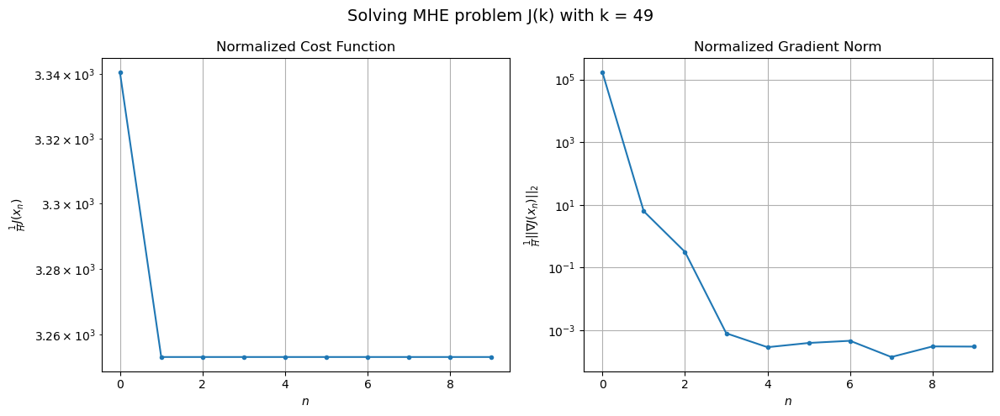

Windows:   6%|▌         | 21/366 [11:41<3:46:41, 39.42s/it]

[Hybrid] Before applying the algorithm
Cost function: 102441.41219461488
Gradient norm: 4800602.448283018
Global estimation error: 60.64127407289136
Initial conditions estimation errors: 9.517009878674793 m, 10.884084875146987 m, 39.67534386253401 m, 43.52230305869533 m
Position estimation errors: 14.478106326390991 m, 13.56399224173887 m, 25.050785554084673 m, 29.691059537303307 m

[Hybrid] Iteration 1
Cost function: 99779.13280020065 (-2.60%)
Gradient norm: 995.0317716727291 (-99.98%)
Global estimation error: 49.03617569293053 (-19.14%)
Initial conditions estimation errors: 11.226639786683386 m, 12.128997137444474 m, 31.708958929539317 m, 33.55494324821615 m
Position estimation errors: 12.105517503325222 m, 10.89798541663963 m, 13.159155625552057 m, 14.123944167029812 m

[Hybrid] Iteration 2
Cost function: 99779.12433762949 (-0.00%)
Gradient norm: 3.564938701485742 (-99.64%)
Global estimation error: 47.154399599657914 (-3.84%)
Initial conditions estimation errors: 11.22663987767108 m

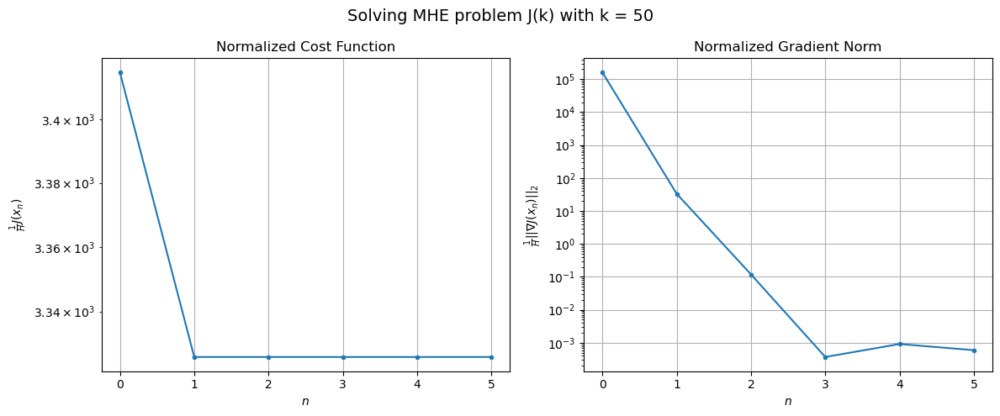

Windows:   6%|▌         | 22/366 [12:09<3:27:29, 36.19s/it]

[Hybrid] Before applying the algorithm
Cost function: 104407.50062193481
Gradient norm: 4757678.515893099
Global estimation error: 45.09257634052615
Initial conditions estimation errors: 10.047370863598413 m, 10.905993587125893 m, 28.896286026421492 m, 31.280184052340598 m
Position estimation errors: 14.589291669971962 m, 13.261941559653737 m, 14.647275667438032 m, 14.222796631632505 m

[Hybrid] Iteration 1
Cost function: 101615.51420710247 (-2.67%)
Gradient norm: 5217.270247472425 (-99.89%)
Global estimation error: 36.392827647728424 (-19.29%)
Initial conditions estimation errors: 11.913872828448863 m, 16.517840487562083 m, 18.69698632872962 m, 23.665858490084883 m
Position estimation errors: 12.237640301001827 m, 10.893457972886091 m, 8.713456328802446 m, 8.656371951624681 m

[Hybrid] Iteration 2
Cost function: 101615.06393365255 (-0.00%)
Gradient norm: 7.604755602065276 (-99.85%)
Global estimation error: 38.13954646080188 (4.80%)
Initial conditions estimation errors: 11.913872803381

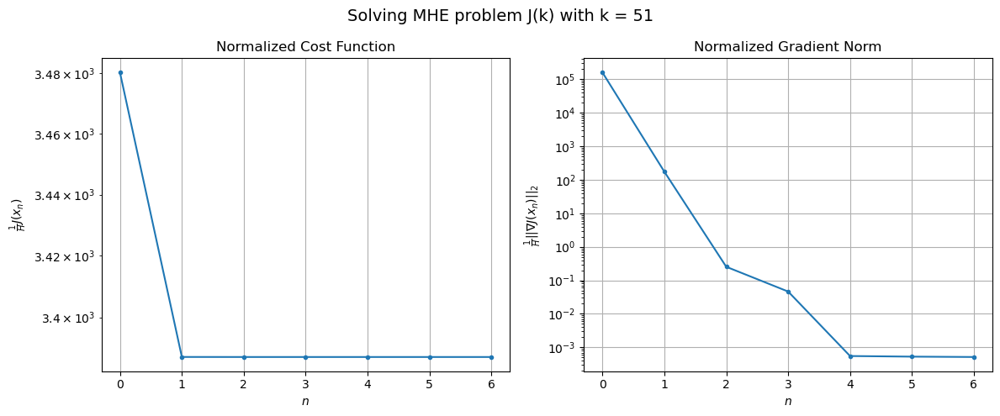

Windows:   6%|▋         | 23/366 [12:40<3:16:56, 34.45s/it]

[Hybrid] Before applying the algorithm
Cost function: 105755.34548456853
Gradient norm: 4681826.890194592
Global estimation error: 39.67646615362676
Initial conditions estimation errors: 10.409546077051115 m, 14.985858957091002 m, 22.478616520852242 m, 27.12913945142037 m
Position estimation errors: 14.724692029397076 m, 13.030854802635897 m, 10.366645470177478 m, 9.43962250997665 m

[Hybrid] Iteration 1
Cost function: 102679.52730120532 (-2.91%)
Gradient norm: 1749.0617704969993 (-99.96%)
Global estimation error: 70.59181315613233 (77.92%)
Initial conditions estimation errors: 12.526056899660508 m, 19.20112111715116 m, 42.24769298376004 m, 51.69852769391309 m
Position estimation errors: 12.360304057770843 m, 11.538029360531077 m, 10.445376575895903 m, 17.475291544689803 m

[Hybrid] Iteration 2
Cost function: 102679.49351657587 (-0.00%)
Gradient norm: 0.977704401357235 (-99.94%)
Global estimation error: 69.76380635764512 (-1.17%)
Initial conditions estimation errors: 12.526056741753985

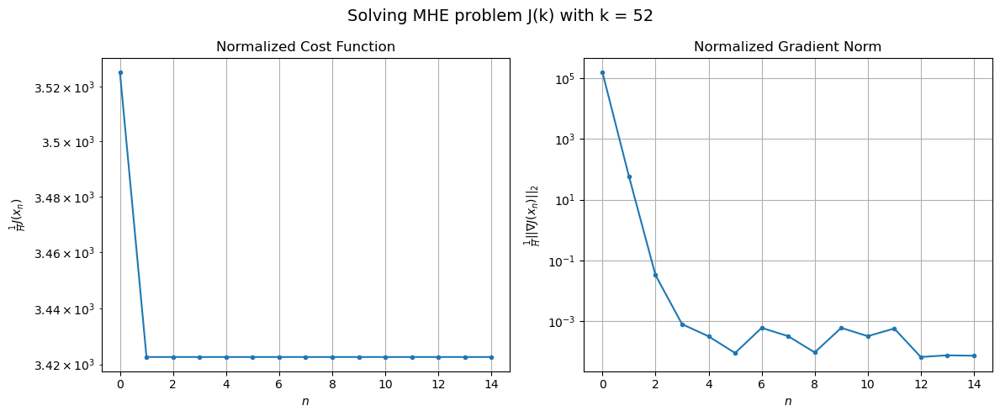

Windows:   7%|▋         | 24/366 [13:39<3:58:31, 41.85s/it]

[Hybrid] Before applying the algorithm
Cost function: 105790.85543414633
Gradient norm: 4490657.391141859
Global estimation error: 72.42839087421356
Initial conditions estimation errors: 10.624522881026438 m, 17.35050915601024 m, 44.50169855696032 m, 53.399780250325655 m
Position estimation errors: 14.845108327778702 m, 13.435470817568897 m, 9.065417242473531 m, 14.27776008735832 m

[Hybrid] Iteration 1
Cost function: 102471.11047721577 (-3.14%)
Gradient norm: 190.81560755959154 (-100.00%)
Global estimation error: 68.18746724616271 (-5.86%)
Initial conditions estimation errors: 13.013567970516231 m, 18.33520751567641 m, 39.89962267486081 m, 50.51733719607677 m
Position estimation errors: 12.517795719186193 m, 10.988381979202936 m, 12.973306044440463 m, 23.635825533438044 m

[Hybrid] Iteration 2
Cost function: 102471.10917835127 (-0.00%)
Gradient norm: 0.33499870109844143 (-99.82%)
Global estimation error: 67.9864880471726 (-0.29%)
Initial conditions estimation errors: 13.01356764550183

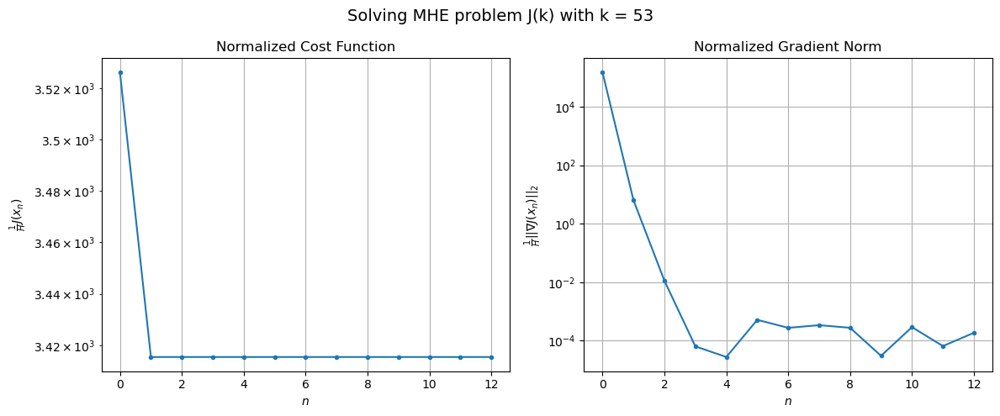

Windows:   7%|▋         | 25/366 [14:29<4:11:06, 44.18s/it]

[Hybrid] Before applying the algorithm
Cost function: 105059.78735358201
Gradient norm: 4314545.783975112
Global estimation error: 70.44617728235936
Initial conditions estimation errors: 10.716221166894666 m, 16.520616572733122 m, 42.427362604554226 m, 52.67634760805713 m
Position estimation errors: 15.007620467082113 m, 12.857915545288442 m, 11.072222663543581 m, 20.918746928936706 m

[Hybrid] Iteration 1
Cost function: 101451.98765212671 (-3.43%)
Gradient norm: 26.05695938547595 (-100.00%)
Global estimation error: 66.47319338988376 (-5.64%)
Initial conditions estimation errors: 13.38273274644201 m, 18.08999309117808 m, 38.78704683301598 m, 49.070218901981264 m
Position estimation errors: 12.691768193501332 m, 11.974824065021624 m, 11.672222270811302 m, 22.958053126808974 m

[Hybrid] Iteration 2
Cost function: 101451.98761208839 (-0.00%)
Gradient norm: 0.1008213217187086 (-99.61%)
Global estimation error: 66.24668265465225 (-0.34%)
Initial conditions estimation errors: 13.382732308943

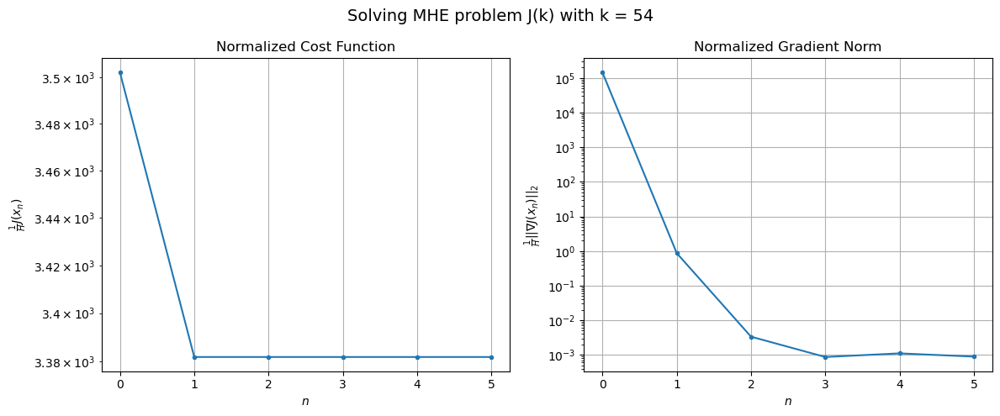

Windows:   7%|▋         | 26/366 [14:56<3:41:10, 39.03s/it]

[Hybrid] Before applying the algorithm
Cost function: 104537.6679770339
Gradient norm: 4277640.98758237
Global estimation error: 68.04729735727376
Initial conditions estimation errors: 10.732006363556177 m, 16.269538228716193 m, 40.91590495038251 m, 50.75855179622634 m
Position estimation errors: 15.202782019101388 m, 13.832493840205807 m, 9.766712650249787 m, 20.029110664869567 m

[Hybrid] Iteration 1
Cost function: 100684.37040271478 (-3.69%)
Gradient norm: 1721.700403992592 (-99.96%)
Global estimation error: 72.82023367263088 (7.01%)
Initial conditions estimation errors: 13.574790135154132 m, 17.15759019217759 m, 39.23382664034457 m, 57.31322946695509 m
Position estimation errors: 12.830157381144573 m, 15.1741221175611 m, 24.535379254597146 m, 44.41584221901034 m

[Hybrid] Iteration 2
Cost function: 100684.35518926725 (-0.00%)
Gradient norm: 5.79734188384316 (-99.66%)
Global estimation error: 73.31513891932703 (0.68%)
Initial conditions estimation errors: 13.574789665778638 m, 17.18

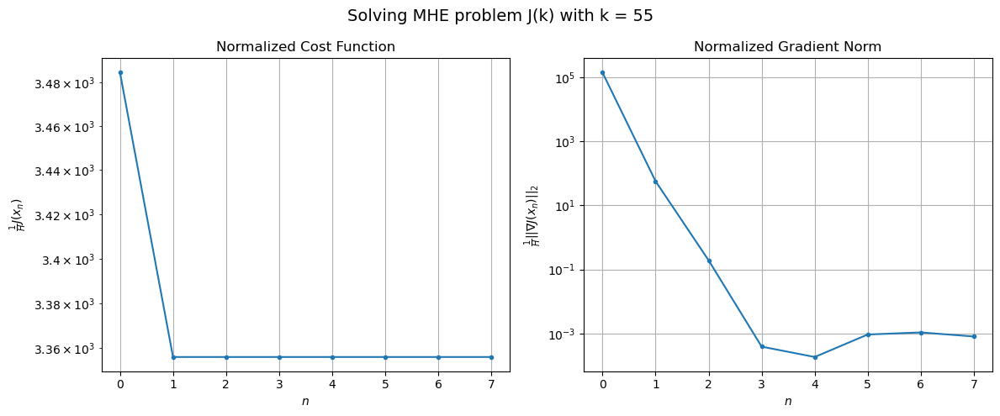

Windows:   7%|▋         | 27/366 [15:27<3:28:16, 36.86s/it]

[Hybrid] Before applying the algorithm
Cost function: 103110.6041782499
Gradient norm: 4124717.60835227
Global estimation error: 76.03804495539008
Initial conditions estimation errors: 10.670193543537255 m, 15.535502762935122 m, 42.77656849881271 m, 59.97262695083422 m
Position estimation errors: 15.368942595732799 m, 16.988286517056967 m, 21.369056192992783 m, 41.1162819124804 m

[Hybrid] Iteration 1
Cost function: 99004.51741905922 (-3.98%)
Gradient norm: 4349.851206219107 (-99.89%)
Global estimation error: 42.43088200301645 (-44.20%)
Initial conditions estimation errors: 13.697117378582844 m, 16.118410244156713 m, 19.75219831290539 m, 31.028904657558623 m
Position estimation errors: 12.95399046012721 m, 11.141320806457948 m, 10.217767246451013 m, 19.012350088399415 m

[Hybrid] Iteration 2
Cost function: 99004.38086220903 (-0.00%)
Gradient norm: 10.41525333760332 (-99.76%)
Global estimation error: 44.03607503195576 (3.78%)
Initial conditions estimation errors: 13.697116977747664 m, 1

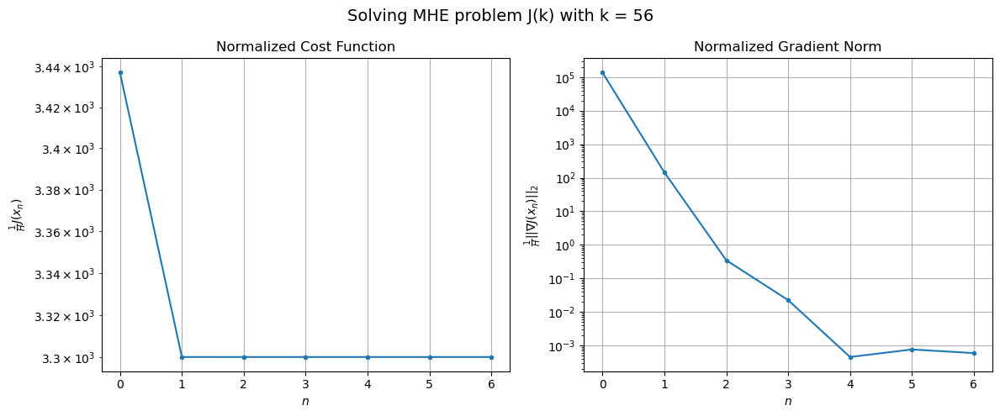

Windows:   8%|▊         | 28/366 [15:58<3:17:16, 35.02s/it]

[Hybrid] Before applying the algorithm
Cost function: 101719.86397549289
Gradient norm: 3990902.661786402
Global estimation error: 41.7515027642345
Initial conditions estimation errors: 10.674349907488908 m, 14.113858670997052 m, 21.244725909370306 m, 31.283932413496252 m
Position estimation errors: 15.51583759607783 m, 13.471907551805272 m, 11.71182851456141 m, 20.20616152894644 m

[Hybrid] Iteration 1
Cost function: 97471.45351846407 (-4.18%)
Gradient norm: 3839.6848562517334 (-99.90%)
Global estimation error: 30.870751462908135 (-26.06%)
Initial conditions estimation errors: 13.750559818208735 m, 13.454819644955606 m, 15.110961921560552 m, 18.828989369511802 m
Position estimation errors: 13.015920056704442 m, 10.81313813758377 m, 16.5800359077593 m, 16.699421710568604 m

[Hybrid] Iteration 2
Cost function: 97471.32973610864 (-0.00%)
Gradient norm: 16.45597551575417 (-99.57%)
Global estimation error: 30.51194523089922 (-1.16%)
Initial conditions estimation errors: 13.75055953641946 m

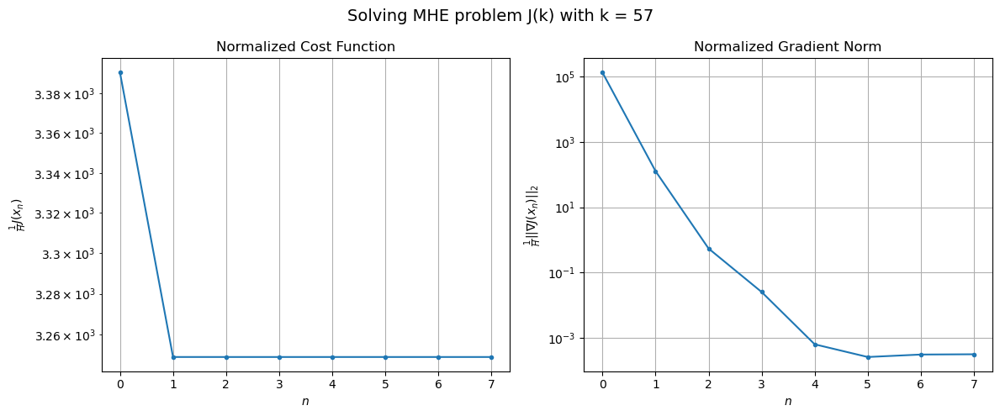

Windows:   8%|▊         | 29/366 [16:29<3:10:36, 33.94s/it]

[Hybrid] Before applying the algorithm
Cost function: 99961.78096837977
Gradient norm: 3977566.646945457
Global estimation error: 25.09744175228088
Initial conditions estimation errors: 10.771967947724256 m, 11.153231354728394 m, 12.008871738450944 m, 15.659500927765635 m
Position estimation errors: 15.58558723510944 m, 13.418865322167726 m, 17.409336796629916 m, 17.351262751216986 m

[Hybrid] Iteration 1
Cost function: 95648.85573976608 (-4.31%)
Gradient norm: 66.66808704228146 (-100.00%)
Global estimation error: 35.876089730888026 (42.95%)
Initial conditions estimation errors: 13.81739775900528 m, 13.919796279772687 m, 18.466670511742468 m, 23.69332183273416 m
Position estimation errors: 13.001675473876116 m, 10.063022341201442 m, 15.986686743706091 m, 15.311918071253976 m

[Hybrid] Iteration 2
Cost function: 95648.8556363801 (-0.00%)
Gradient norm: 0.20502674670098459 (-99.69%)
Global estimation error: 35.732038716214774 (-0.40%)
Initial conditions estimation errors: 13.817397692632

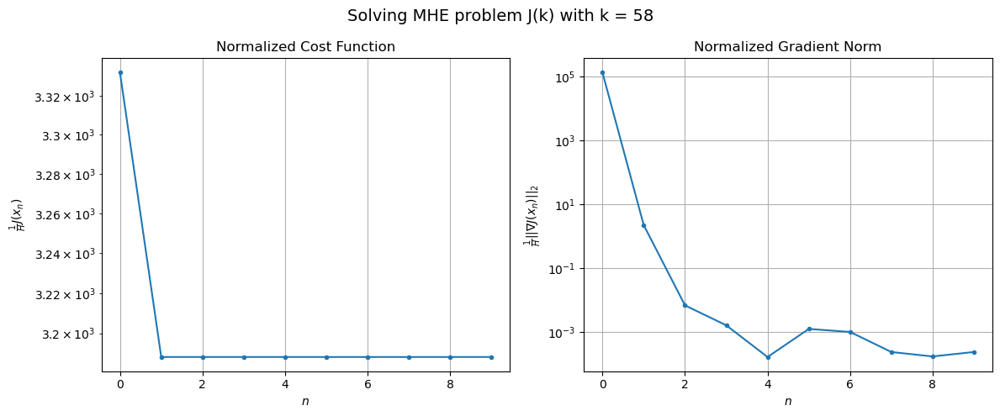

Windows:   8%|▊         | 30/366 [17:11<3:22:15, 36.12s/it]

[Hybrid] Before applying the algorithm
Cost function: 97793.40718622484
Gradient norm: 3926291.538691157
Global estimation error: 31.689834043986618
Initial conditions estimation errors: 10.994814669097824 m, 11.700264926801264 m, 16.905626331171465 m, 21.462673849262277 m
Position estimation errors: 15.564651459934446 m, 12.61711741946951 m, 17.98257655054726 m, 17.177547717712276 m

[Hybrid] Iteration 1
Cost function: 93435.49522592596 (-4.46%)
Gradient norm: 775.6781134106878 (-99.98%)
Global estimation error: 46.86539737227787 (47.89%)
Initial conditions estimation errors: 13.974574627976262 m, 13.248283960547274 m, 26.81124200358523 m, 33.26706443687456 m
Position estimation errors: 12.879937107357733 m, 9.533119512478175 m, 23.136361044545325 m, 25.950381431446612 m

[Hybrid] Iteration 2
Cost function: 93435.49140692281 (-0.00%)
Gradient norm: 2.191781546064908 (-99.72%)
Global estimation error: 46.298945280604755 (-1.21%)
Initial conditions estimation errors: 13.974574740005258 

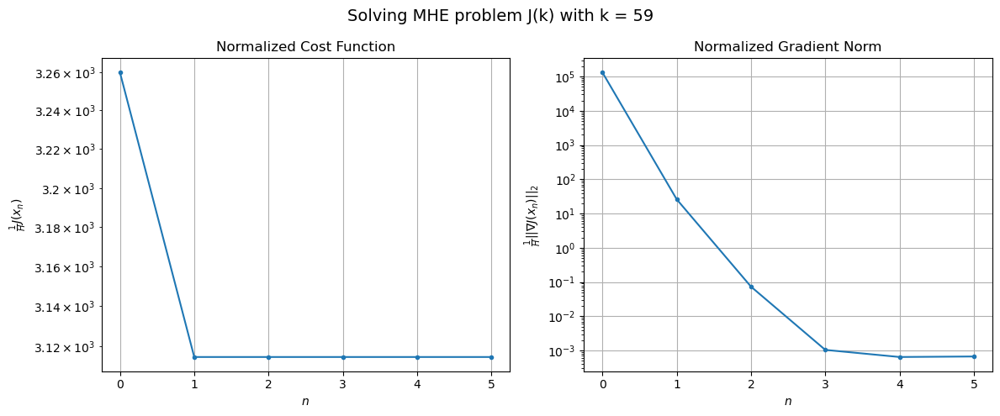

Windows:   8%|▊         | 31/366 [17:35<3:01:48, 32.56s/it]

[Hybrid] Before applying the algorithm
Cost function: 95231.7856930853
Gradient norm: 3989375.718021768
Global estimation error: 44.72630374242269
Initial conditions estimation errors: 11.350630832176536 m, 11.100140554662616 m, 26.007412307969638 m, 32.74129893787968 m
Position estimation errors: 15.427907498953696 m, 12.18922082860385 m, 23.88745181055881 m, 25.570157161880477 m

[Hybrid] Iteration 1
Cost function: 90827.64209026072 (-4.62%)
Gradient norm: 2799.7842005737284 (-99.93%)
Global estimation error: 32.1209031360008 (-28.18%)
Initial conditions estimation errors: 14.24893676018716 m, 15.169663896167098 m, 14.204798701740394 m, 19.92005098083629 m
Position estimation errors: 12.638734155956021 m, 11.92653910594259 m, 10.320724247814544 m, 13.614501086258329 m

[Hybrid] Iteration 2
Cost function: 90827.58807962017 (-0.00%)
Gradient norm: 27.623306335416803 (-99.01%)
Global estimation error: 31.77658570862631 (-1.07%)
Initial conditions estimation errors: 14.248936995496008 m,

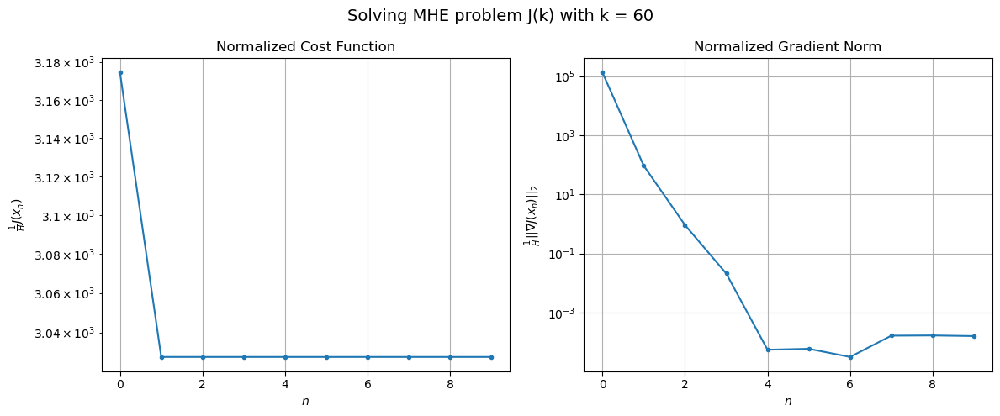

Windows:   9%|▊         | 32/366 [18:14<3:12:38, 34.61s/it]

[Hybrid] Before applying the algorithm
Cost function: 92016.10622567098
Gradient norm: 3929607.8167085424
Global estimation error: 26.15636665286115
Initial conditions estimation errors: 11.78907990221409 m, 13.54240400651567 m, 10.944869310147391 m, 15.555509346861335 m
Position estimation errors: 15.16336373382622 m, 14.413921331944117 m, 12.174060407538583 m, 16.950049069582402 m

[Hybrid] Iteration 1
Cost function: 87656.98506522847 (-4.74%)
Gradient norm: 3076.53939300163 (-99.92%)
Global estimation error: 54.68780920638097 (109.08%)
Initial conditions estimation errors: 14.60810509488249 m, 13.451677575065261 m, 31.73622879834554 m, 39.86490544674404 m
Position estimation errors: 12.32273352995258 m, 10.562900651627533 m, 21.221455482101973 m, 21.66129245228163 m

[Hybrid] Iteration 2
Cost function: 87656.91593853326 (-0.00%)
Gradient norm: 1.7493914767211745 (-99.94%)
Global estimation error: 54.29123228072479 (-0.73%)
Initial conditions estimation errors: 14.608105424353896 m, 

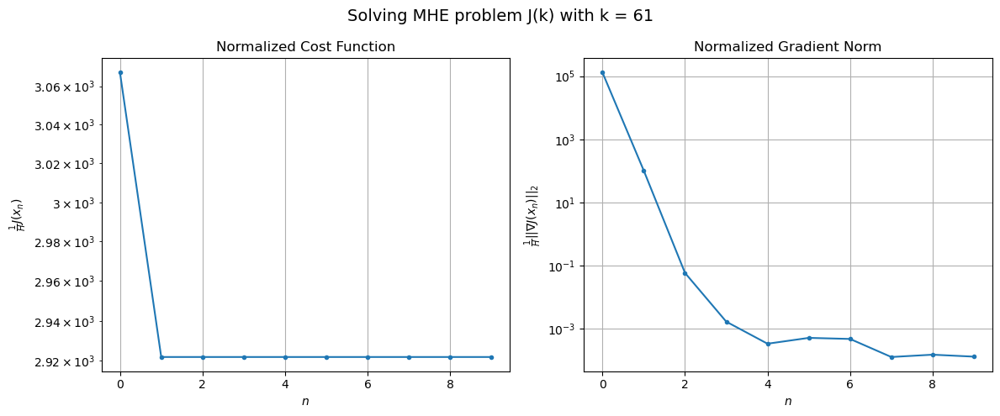

Windows:   9%|▉         | 33/366 [18:53<3:18:38, 35.79s/it]

[Hybrid] Before applying the algorithm
Cost function: 88018.80188622909
Gradient norm: 3927648.9450738844
Global estimation error: 52.055973966601705
Initial conditions estimation errors: 12.236605844093596 m, 11.267387729936008 m, 30.868124638202065 m, 38.474479066173444 m
Position estimation errors: 14.832859015697888 m, 13.146967289919735 m, 22.485357301413334 m, 21.9254966505603 m

[Hybrid] Iteration 1
Cost function: 83676.57348975168 (-4.93%)
Gradient norm: 289.1170982479175 (-99.99%)
Global estimation error: 52.899336455137856 (1.62%)
Initial conditions estimation errors: 15.009535293417843 m, 14.037601263600557 m, 30.57541300759305 m, 37.962255554086205 m
Position estimation errors: 11.950801941295655 m, 11.230396514321695 m, 14.505195290479797 m, 11.665955989198848 m

[Hybrid] Iteration 2
Cost function: 83676.57169591499 (-0.00%)
Gradient norm: 6.586113012857121 (-97.72%)
Global estimation error: 53.69621843309857 (1.51%)
Initial conditions estimation errors: 15.009535675573941

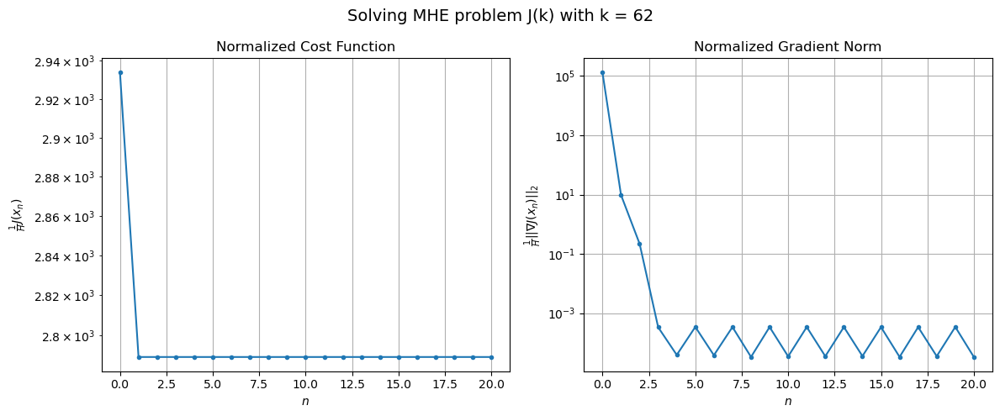

Windows:   9%|▉         | 34/366 [20:10<4:26:27, 48.15s/it]

[Hybrid] Before applying the algorithm
Cost function: 83187.7429358374
Gradient norm: 4015284.3049343275
Global estimation error: 50.43895480871673
Initial conditions estimation errors: 12.618016402899492 m, 11.716195508246692 m, 30.016974342348913 m, 36.69574130824589 m
Position estimation errors: 14.485165046420152 m, 13.679143421553412 m, 17.352162945783082 m, 14.228393380017303 m

[Hybrid] Iteration 1
Cost function: 78850.71928803735 (-5.21%)
Gradient norm: 740.0316811074639 (-99.98%)
Global estimation error: 58.55052772180382 (16.08%)
Initial conditions estimation errors: 15.362831259632458 m, 14.643659887955337 m, 34.89734972349024 m, 41.9508954452661 m
Position estimation errors: 11.578484934372877 m, 11.03790958540286 m, 16.16143023052128 m, 22.491474630288437 m

[Hybrid] Iteration 2
Cost function: 78850.71482035996 (-0.00%)
Gradient norm: 10.24846984152166 (-98.62%)
Global estimation error: 57.49319262146838 (-1.81%)
Initial conditions estimation errors: 15.362831642083027 m, 

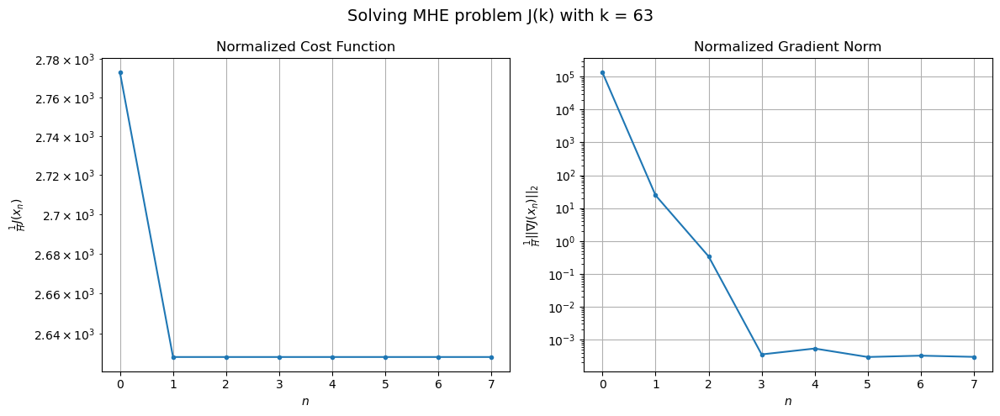

Windows:  10%|▉         | 35/366 [20:41<3:56:43, 42.91s/it]

[Hybrid] Before applying the algorithm
Cost function: 77341.74787816971
Gradient norm: 4093004.5535866083
Global estimation error: 55.27444437205294
Initial conditions estimation errors: 12.826862381050905 m, 12.264778971519547 m, 33.27167129462861 m, 40.41410076435502 m
Position estimation errors: 14.215322282290657 m, 13.73699457800943 m, 16.232658838742815 m, 20.51198049268938 m

[Hybrid] Iteration 1
Cost function: 72907.65531626344 (-5.73%)
Gradient norm: 119.19092353457752 (-100.00%)
Global estimation error: 54.06825985447266 (-2.18%)
Initial conditions estimation errors: 15.599592418645514 m, 16.157364107466048 m, 31.823399056576836 m, 37.49975846913031 m
Position estimation errors: 11.270741356474778 m, 10.762836137942879 m, 8.362557872153692 m, 13.823560880942578 m

[Hybrid] Iteration 2
Cost function: 72907.65515422252 (-0.00%)
Gradient norm: 0.2542327974327566 (-99.79%)
Global estimation error: 54.24194968427903 (0.32%)
Initial conditions estimation errors: 15.599592815327325 

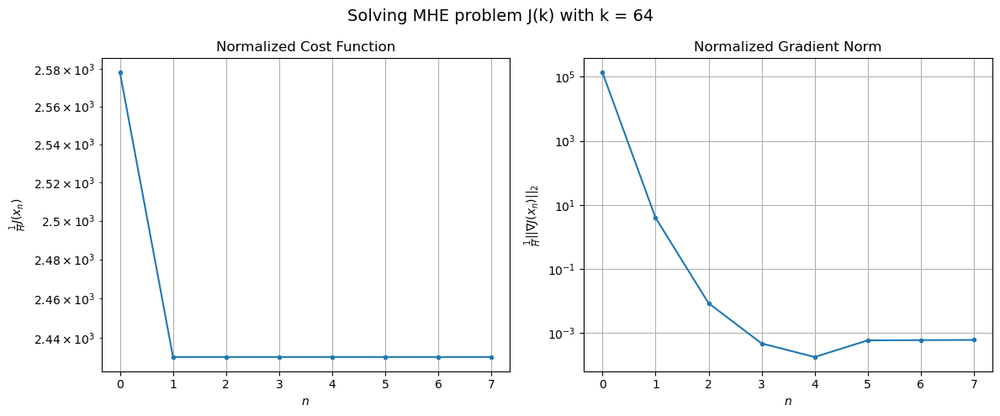

Windows:  10%|▉         | 36/366 [21:12<3:37:43, 39.59s/it]

[Hybrid] Before applying the algorithm
Cost function: 70439.75228060587
Gradient norm: 4190274.2177008013
Global estimation error: 50.896657685949194
Initial conditions estimation errors: 12.816225185170467 m, 13.489241964462064 m, 30.224789241475417 m, 36.47887104400786 m
Position estimation errors: 14.116621930600628 m, 13.517234104065366 m, 9.581462880421048 m, 13.975649205190443 m

[Hybrid] Iteration 1
Cost function: 66044.33534668777 (-6.24%)
Gradient norm: 349.11260111888186 (-99.99%)
Global estimation error: 56.050857798083705 (10.13%)
Initial conditions estimation errors: 15.577665634142647 m, 14.116712991071402 m, 32.993385691012435 m, 40.1395201164179 m
Position estimation errors: 11.181009820656419 m, 12.65925313162199 m, 11.680654779415422 m, 25.695139557975523 m

[Hybrid] Iteration 2
Cost function: 66044.3348046677 (-0.00%)
Gradient norm: 0.46054026458114833 (-99.87%)
Global estimation error: 55.81350414183902 (-0.42%)
Initial conditions estimation errors: 15.5776660116180

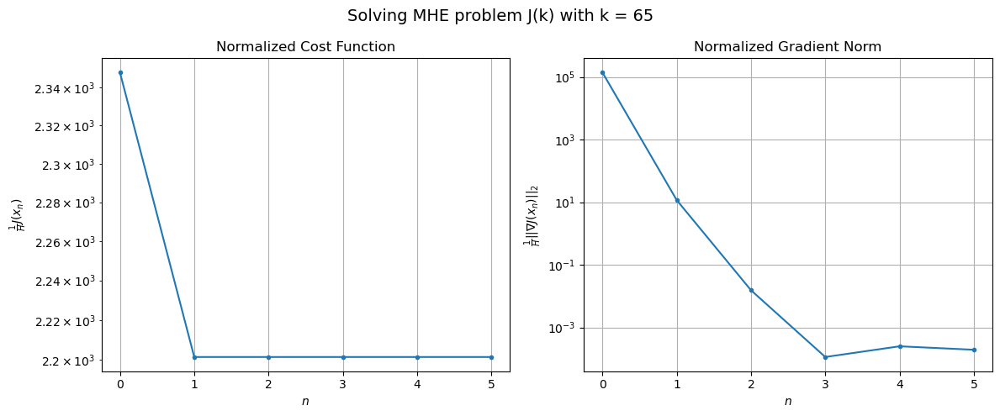

Windows:  10%|█         | 37/366 [21:37<3:11:43, 34.97s/it]

[Hybrid] Before applying the algorithm
Cost function: 64030.34610356087
Gradient norm: 4431739.408148777
Global estimation error: 52.84834771208404
Initial conditions estimation errors: 12.50257367333452 m, 11.253147280630866 m, 31.09956261749422 m, 39.27859748854625 m
Position estimation errors: 14.354423664017133 m, 15.595520332008995 m, 11.496323106641446 m, 24.52480263450161 m

[Hybrid] Iteration 1
Cost function: 59583.18167816906 (-6.95%)
Gradient norm: 383.5422247279313 (-99.99%)
Global estimation error: 65.07776897770749 (23.14%)
Initial conditions estimation errors: 15.259240234358167 m, 11.649904668784034 m, 37.68865158462083 m, 49.458133746460305 m
Position estimation errors: 11.376005653643995 m, 13.483954214775558 m, 15.140103110322986 m, 33.69842266529097 m

[Hybrid] Iteration 2
Cost function: 59583.18050936365 (-0.00%)
Gradient norm: 1.0182602883495708 (-99.73%)
Global estimation error: 65.4982697255027 (0.65%)
Initial conditions estimation errors: 15.259240582031962 m, 1

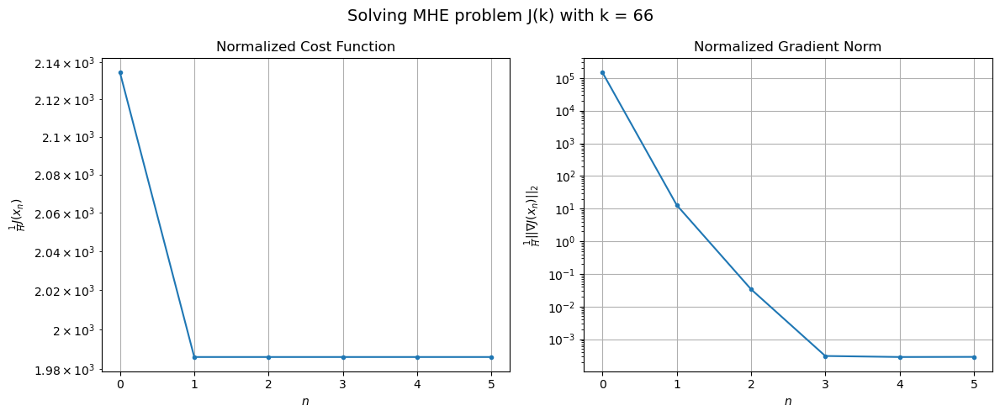

Windows:  10%|█         | 38/366 [22:03<2:57:30, 32.47s/it]

[Hybrid] Before applying the algorithm
Cost function: 59472.243303567506
Gradient norm: 4885472.957520282
Global estimation error: 63.350036025823044
Initial conditions estimation errors: 11.910524461780492 m, 8.571110450630098 m, 36.353870017648624 m, 49.76232307564994 m
Position estimation errors: 14.968050709100437 m, 16.879649569050244 m, 15.247226234654178 m, 32.68737284198883 m

[Hybrid] Iteration 1
Cost function: 54898.95717814817 (-7.69%)
Gradient norm: 3577.496929551488 (-99.93%)
Global estimation error: 38.098904161421885 (-39.86%)
Initial conditions estimation errors: 14.650096560150583 m, 12.553243194994163 m, 21.669026710589893 m, 24.693229211442663 m
Position estimation errors: 11.880884249850943 m, 13.1250400635513 m, 4.467308023740401 m, 5.373654226701408 m

[Hybrid] Iteration 2
Cost function: 54898.87509022728 (-0.00%)
Gradient norm: 34.83612883601527 (-99.03%)
Global estimation error: 36.17641535909795 (-5.05%)
Initial conditions estimation errors: 14.650096867419787 

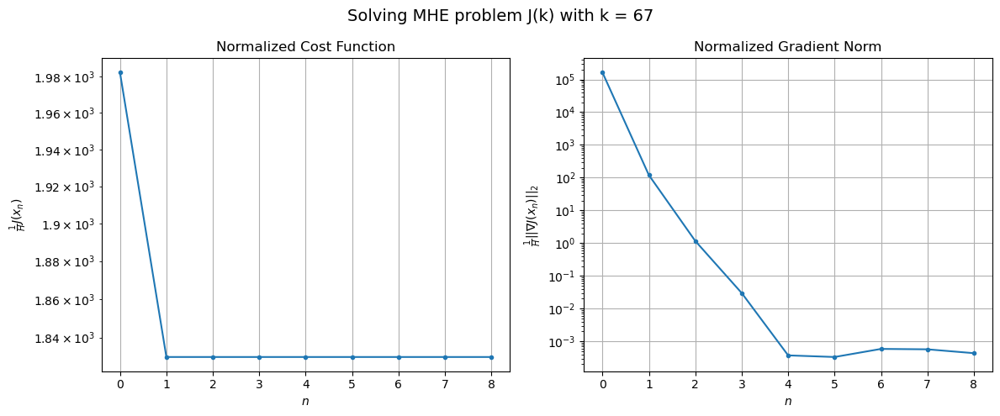

Windows:  11%|█         | 39/366 [22:40<3:03:34, 33.68s/it]

[Hybrid] Before applying the algorithm
Cost function: 57345.14563109213
Gradient norm: 5274791.611451198
Global estimation error: 28.998051378337507
Initial conditions estimation errors: 11.111161003498824 m, 9.378526533718485 m, 16.9021013303656 m, 18.541195798922928 m
Position estimation errors: 15.917663610200583 m, 16.89032207720625 m, 7.385691709175923 m, 6.890426659678806 m

[Hybrid] Iteration 1
Cost function: 52700.46385782186 (-8.10%)
Gradient norm: 1357.2803037278738 (-99.97%)
Global estimation error: 22.801948678413414 (-21.37%)
Initial conditions estimation errors: 13.814431960189495 m, 11.640866670414695 m, 11.056998192276989 m, 8.443975027651529 m
Position estimation errors: 12.732025075635384 m, 14.575445582284516 m, 12.22294288542144 m, 25.54656042031947 m

[Hybrid] Iteration 2
Cost function: 52700.44778616846 (-0.00%)
Gradient norm: 20.851828039996903 (-98.46%)
Global estimation error: 22.599205042923955 (-0.89%)
Initial conditions estimation errors: 13.814432231192498 

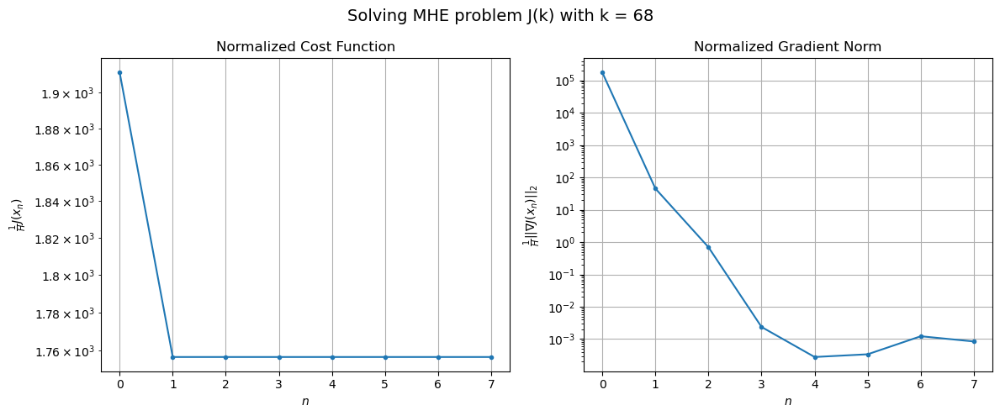

Windows:  11%|█         | 40/366 [23:15<3:05:31, 34.15s/it]

[Hybrid] Before applying the algorithm
Cost function: 57611.054004576166
Gradient norm: 5737475.386698422
Global estimation error: 17.135703153823734
Initial conditions estimation errors: 10.212668683953648 m, 8.371127861050597 m, 7.144885436951058 m, 8.257547819246703 m
Position estimation errors: 17.179495430992457 m, 18.683691921927306 m, 12.676141975553135 m, 25.437733309505333 m

[Hybrid] Iteration 1
Cost function: 52664.20896298421 (-8.59%)
Gradient norm: 129.58839130675273 (-100.00%)
Global estimation error: 20.47093946720618 (19.46%)
Initial conditions estimation errors: 12.95477095692364 m, 9.76720443825135 m, 10.37406498017175 m, 6.942093819720806 m
Position estimation errors: 13.81903790965314 m, 16.595791557126212 m, 11.479472529866152 m, 20.604570357341554 m

[Hybrid] Iteration 2
Cost function: 52664.208839326595 (-0.00%)
Gradient norm: 0.061317183865594656 (-99.95%)
Global estimation error: 20.497683533377835 (0.13%)
Initial conditions estimation errors: 12.95477119485460

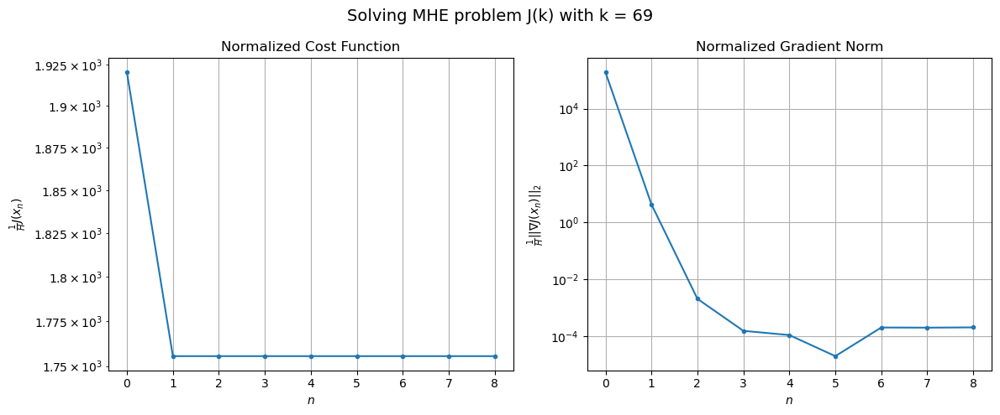

Windows:  11%|█         | 41/366 [23:50<3:06:51, 34.50s/it]

[Hybrid] Before applying the algorithm
Cost function: 61586.79577891463
Gradient norm: 6244429.95429759
Global estimation error: 14.8215983725682
Initial conditions estimation errors: 9.417905846134135 m, 6.69724921932791 m, 6.9241452511427655 m, 6.178012230155704 m
Position estimation errors: 18.59616297172248 m, 21.116825963307996 m, 9.973372978269168 m, 17.587768995011253 m

[Hybrid] Iteration 1
Cost function: 56348.692440896935 (-8.51%)
Gradient norm: 91.4950478537181 (-100.00%)
Global estimation error: 19.275942624708946 (30.05%)
Initial conditions estimation errors: 12.161068753514506 m, 9.370893084208808 m, 8.15484885888957 m, 8.326776818520056 m
Position estimation errors: 15.048259072725482 m, 15.934662305774022 m, 10.080934657410104 m, 19.7815365828301 m

[Hybrid] Iteration 2
Cost function: 56348.692207569125 (-0.00%)
Gradient norm: 0.3128752968954425 (-99.66%)
Global estimation error: 19.299073721798557 (0.12%)
Initial conditions estimation errors: 12.161068960925778 m, 9.37

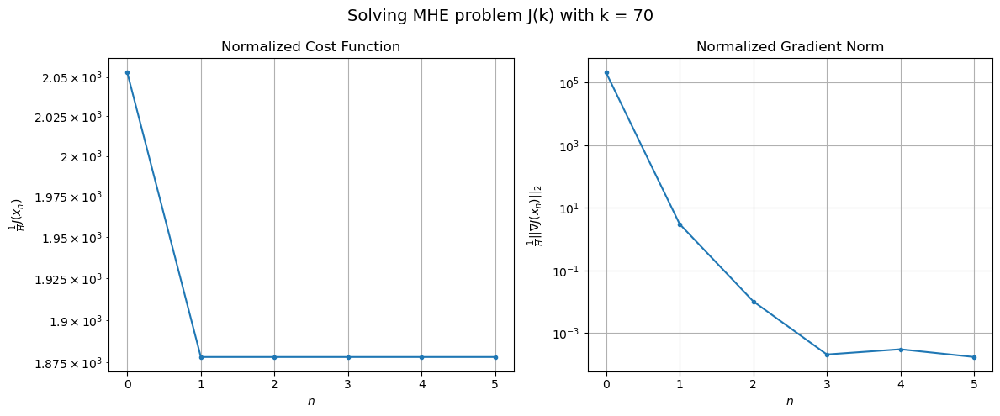

Windows:  11%|█▏        | 42/366 [24:19<2:56:17, 32.65s/it]

[Hybrid] Before applying the algorithm
Cost function: 69098.71314410403
Gradient norm: 6691203.318084586
Global estimation error: 15.400722169371425
Initial conditions estimation errors: 8.779588191100645 m, 6.353798820650059 m, 5.697599529732715 m, 9.340843255398232 m
Position estimation errors: 20.086553359223444 m, 20.85147047630728 m, 11.099946046309132 m, 18.152845396204384 m

[Hybrid] Iteration 1
Cost function: 63535.28484817874 (-8.05%)
Gradient norm: 1935.2776194779117 (-99.97%)
Global estimation error: 34.795685437831914 (125.94%)
Initial conditions estimation errors: 11.518116372457087 m, 15.476053071652636 m, 14.017216733081842 m, 25.338818876083437 m
Position estimation errors: 16.351714579706737 m, 13.717286044048945 m, 18.18431015465726 m, 43.6631557535726 m

[Hybrid] Iteration 2
Cost function: 63535.25465267178 (-0.00%)
Gradient norm: 26.00870205876519 (-98.66%)
Global estimation error: 36.82391734724785 (5.83%)
Initial conditions estimation errors: 11.518116549981402 m,

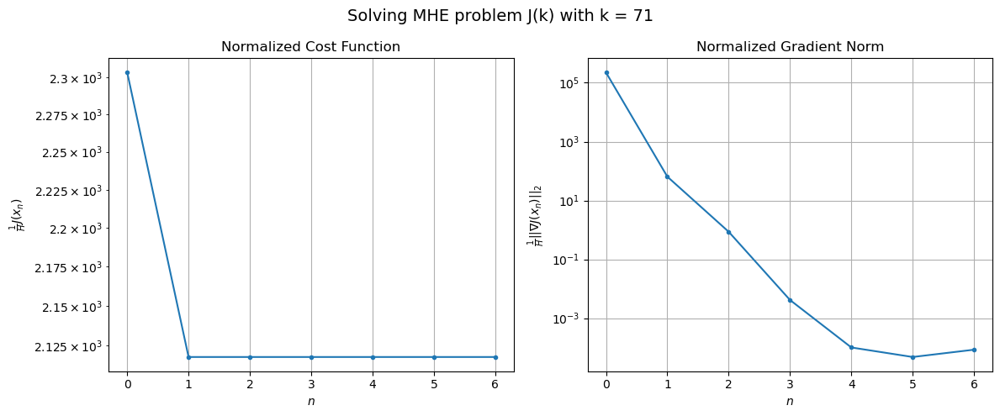

Windows:  12%|█▏        | 43/366 [24:49<2:52:19, 32.01s/it]

[Hybrid] Before applying the algorithm
Cost function: 79947.03574043348
Gradient norm: 6963559.0732859075
Global estimation error: 39.78770112682821
Initial conditions estimation errors: 8.348713651796466 m, 12.680410876327588 m, 17.170126961840317 m, 32.52278775728419 m
Position estimation errors: 21.587628255326532 m, 18.538764522665282 m, 19.84011462186506 m, 43.10363280530133 m

[Hybrid] Iteration 1
Cost function: 74090.50067671832 (-7.33%)
Gradient norm: 930.3113472015842 (-99.99%)
Global estimation error: 28.96500058989908 (-27.20%)
Initial conditions estimation errors: 11.102134620480232 m, 12.417500236198814 m, 11.355867910110875 m, 20.797724923472856 m
Position estimation errors: 17.717989624993354 m, 16.445981110454557 m, 14.615934781808258 m, 27.45549650972655 m

[Hybrid] Iteration 2
Cost function: 74090.49578142585 (-0.00%)
Gradient norm: 0.589118226073161 (-99.94%)
Global estimation error: 28.708172009482137 (-0.89%)
Initial conditions estimation errors: 11.10213481886888 

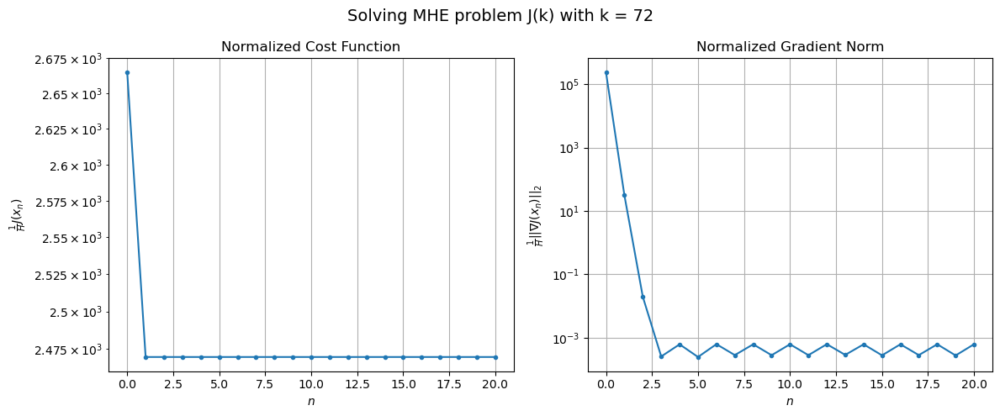

Windows:  12%|█▏        | 44/366 [26:14<4:17:12, 47.93s/it]

[Hybrid] Before applying the algorithm
Cost function: 94537.75017563853
Gradient norm: 7247879.434162591
Global estimation error: 29.01085524452037
Initial conditions estimation errors: 8.176429112585096 m, 9.4092794111372 m, 11.772620015990316 m, 23.401552262987135 m
Position estimation errors: 23.08126215750104 m, 21.787255716340532 m, 18.043602370198926 m, 26.86246315369401 m

[Hybrid] Iteration 1
Cost function: 88198.85971996908 (-6.71%)
Gradient norm: 318.33167901834076 (-100.00%)
Global estimation error: 25.367025186457997 (-12.56%)
Initial conditions estimation errors: 10.98108916867625 m, 11.011667738902247 m, 9.468189328353423 m, 17.66310751670763 m
Position estimation errors: 19.041658334867268 m, 18.774877292623394 m, 15.222450752048264 m, 18.403679654762154 m

[Hybrid] Iteration 2
Cost function: 88198.85924545035 (-0.00%)
Gradient norm: 0.01380921015954692 (-100.00%)
Global estimation error: 25.35327991197646 (-0.05%)
Initial conditions estimation errors: 10.98108937101889 

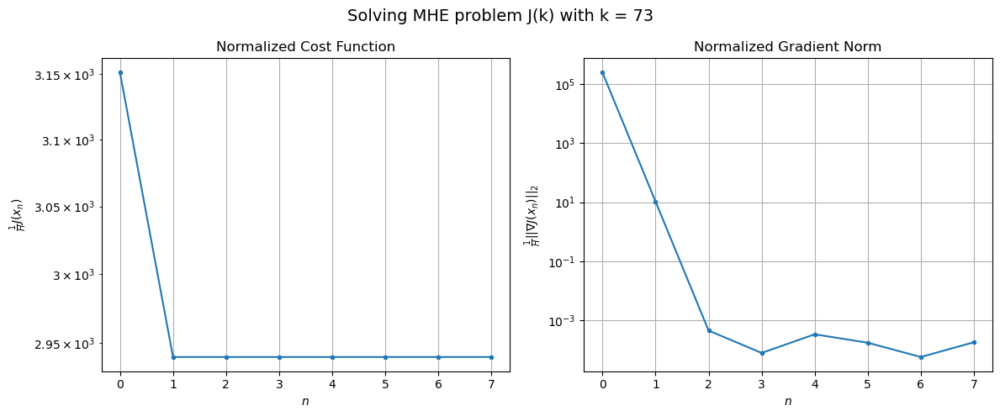

Windows:  12%|█▏        | 45/366 [26:45<3:49:02, 42.81s/it]

[Hybrid] Before applying the algorithm
Cost function: 112006.47800110346
Gradient norm: 7265997.154627269
Global estimation error: 24.638004573656765
Initial conditions estimation errors: 8.309493544174128 m, 8.348861811889865 m, 8.831500712232137 m, 19.755387475123943 m
Position estimation errors: 24.42725678525933 m, 24.177661967615506 m, 20.057335400827125 m, 22.073373011448925 m

[Hybrid] Iteration 1
Cost function: 105229.6380865513 (-6.05%)
Gradient norm: 763.9257035128877 (-99.99%)
Global estimation error: 20.88951568501383 (-15.21%)
Initial conditions estimation errors: 11.191946111073376 m, 12.535896769672735 m, 8.41211636753373 m, 9.120929898582737 m
Position estimation errors: 20.28337555089337 m, 20.268453380329625 m, 21.66934046350499 m, 21.10545279803704 m

[Hybrid] Iteration 2
Cost function: 105229.63422175939 (-0.00%)
Gradient norm: 1.0572844790261895 (-99.86%)
Global estimation error: 20.819626013501303 (-0.33%)
Initial conditions estimation errors: 11.191946344926652 m

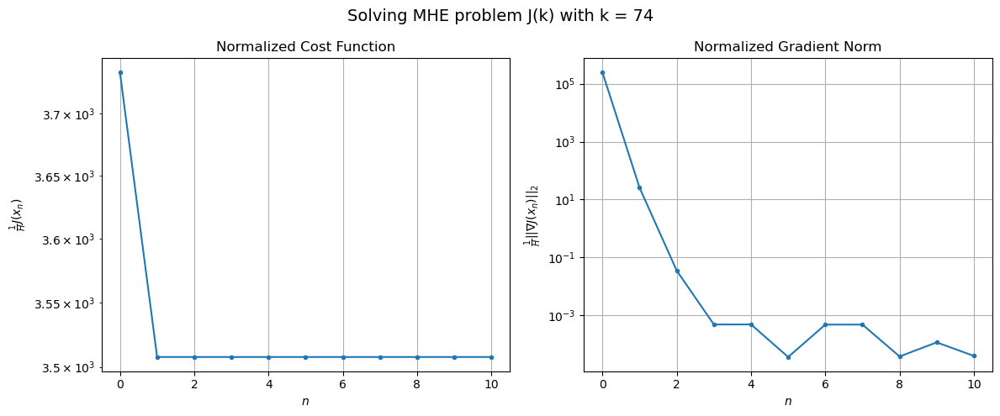

Windows:  13%|█▎        | 46/366 [27:28<3:48:33, 42.85s/it]

[Hybrid] Before applying the algorithm
Cost function: 131564.1436558394
Gradient norm: 7099721.512102026
Global estimation error: 16.72865908108832
Initial conditions estimation errors: 8.746666607653856 m, 10.05843602818424 m, 6.189054884083742 m, 7.991334912408108 m
Position estimation errors: 25.601760292324006 m, 25.668506979118156 m, 27.165591796036136 m, 27.31580379000797 m

[Hybrid] Iteration 1
Cost function: 124402.87802487916 (-5.44%)
Gradient norm: 1551.182000981785 (-99.98%)
Global estimation error: 34.500008562331395 (106.23%)
Initial conditions estimation errors: 11.720758455641334 m, 15.253092763447409 m, 12.996850501178686 m, 25.5203660092305 m
Position estimation errors: 21.40710148284765 m, 19.465010894719192 m, 22.944855742532607 m, 25.68089829860267 m

[Hybrid] Iteration 2
Cost function: 124402.8620624588 (-0.00%)
Gradient norm: 2.705684650057916 (-99.83%)
Global estimation error: 35.08405515860901 (1.69%)
Initial conditions estimation errors: 11.720758698520854 m, 1

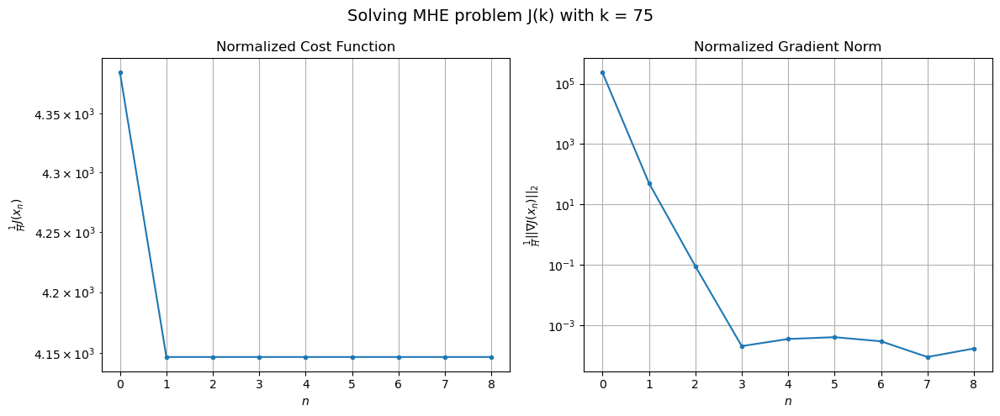

Windows:  13%|█▎        | 47/366 [28:04<3:37:14, 40.86s/it]

[Hybrid] Before applying the algorithm
Cost function: 152739.21589282274
Gradient norm: 6859249.872356786
Global estimation error: 35.57947324269221
Initial conditions estimation errors: 9.444144583457367 m, 12.980781141103636 m, 13.741769937830746 m, 28.62450175741516 m
Position estimation errors: 26.619938449464627 m, 24.430177405916183 m, 28.379596973796087 m, 30.04422050836031 m

[Hybrid] Iteration 1
Cost function: 145151.82001462227 (-4.97%)
Gradient norm: 7997.715246256483 (-99.88%)
Global estimation error: 22.614208354937116 (-36.44%)
Initial conditions estimation errors: 12.54802829370912 m, 10.798295819638179 m, 12.65137828871347 m, 8.79110714646065 m
Position estimation errors: 22.403783939975163 m, 27.702074729510553 m, 32.73741193575073 m, 59.31116031104218 m

[Hybrid] Iteration 2
Cost function: 145151.53296215838 (-0.00%)
Gradient norm: 20.511905063594543 (-99.74%)
Global estimation error: 22.669357661692036 (0.24%)
Initial conditions estimation errors: 12.548028559203724 

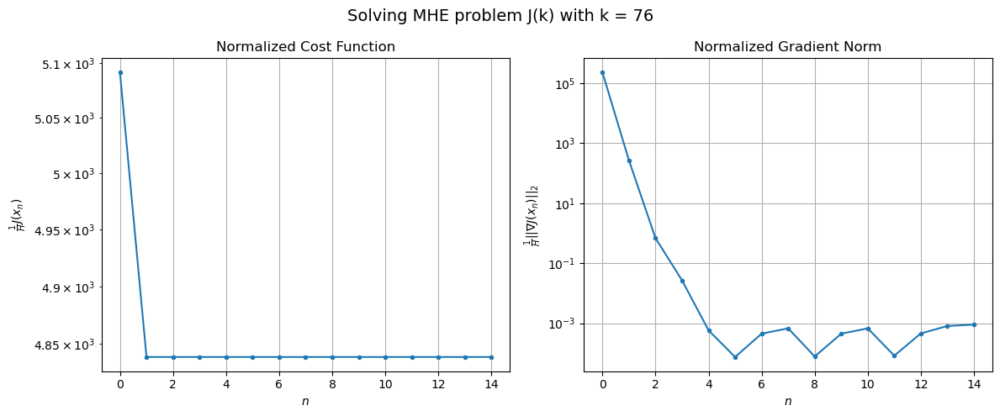

Windows:  13%|█▎        | 48/366 [29:00<3:59:40, 45.22s/it]

[Hybrid] Before applying the algorithm
Cost function: 175078.95950214943
Gradient norm: 6387075.165097387
Global estimation error: 18.79674430705821
Initial conditions estimation errors: 10.36947216901728 m, 9.016656844635387 m, 9.975241780354349 m, 8.061153133627553 m
Position estimation errors: 27.525049227214826 m, 32.5570842685317 m, 37.741760893121516 m, 61.76131121390081 m

[Hybrid] Iteration 1
Cost function: 167033.0964044349 (-4.60%)
Gradient norm: 539.2079482957142 (-99.99%)
Global estimation error: 25.759609736243195 (37.04%)
Initial conditions estimation errors: 13.636800144778647 m, 11.30102593866495 m, 16.528468254620734 m, 8.757061848437612 m
Position estimation errors: 23.303546937923926 m, 30.65985747231061 m, 34.83301303654251 m, 71.66540773461291 m

[Hybrid] Iteration 2
Cost function: 167033.09493776358 (-0.00%)
Gradient norm: 0.8600925526139434 (-99.84%)
Global estimation error: 25.854415394481645 (0.37%)
Initial conditions estimation errors: 13.636800522471178 m, 11

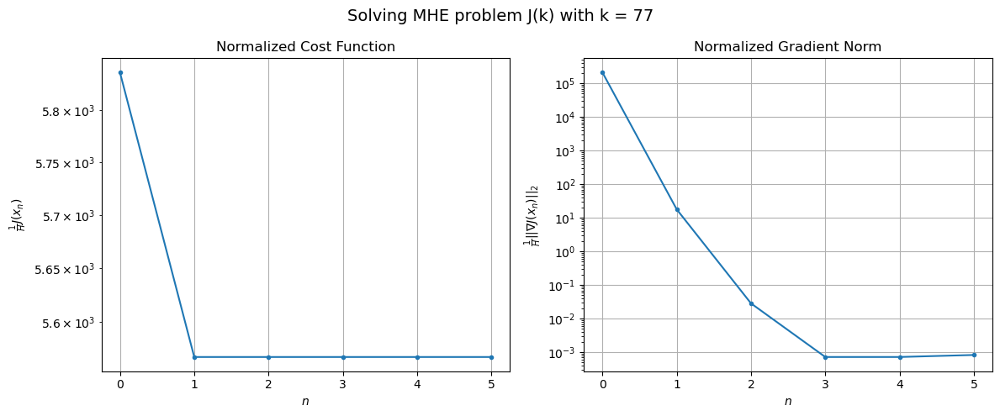

Windows:  13%|█▎        | 49/366 [29:25<3:27:53, 39.35s/it]

[Hybrid] Before applying the algorithm
Cost function: 198068.0579397863
Gradient norm: 5792597.715320667
Global estimation error: 22.70062595503571
Initial conditions estimation errors: 11.481909698603976 m, 9.404750844904997 m, 15.25717575480003 m, 7.889782690300771 m
Position estimation errors: 28.35122101305043 m, 35.996423130803436 m, 39.949504265947574 m, 76.6116607099636 m

[Hybrid] Iteration 1
Cost function: 189548.4481229191 (-4.30%)
Gradient norm: 66.68828261582651 (-100.00%)
Global estimation error: 33.510317798722745 (47.62%)
Initial conditions estimation errors: 14.950217978457896 m, 11.877458774878493 m, 21.989702574757263 m, 16.577258089264003 m
Position estimation errors: 24.150287711418986 m, 32.8325761971364 m, 34.16523662898014 m, 72.60094112932876 m

[Hybrid] Iteration 2
Cost function: 189548.44798854517 (-0.00%)
Gradient norm: 0.21868298355173654 (-99.67%)
Global estimation error: 33.40680014610079 (-0.31%)
Initial conditions estimation errors: 14.950218406079884 m,

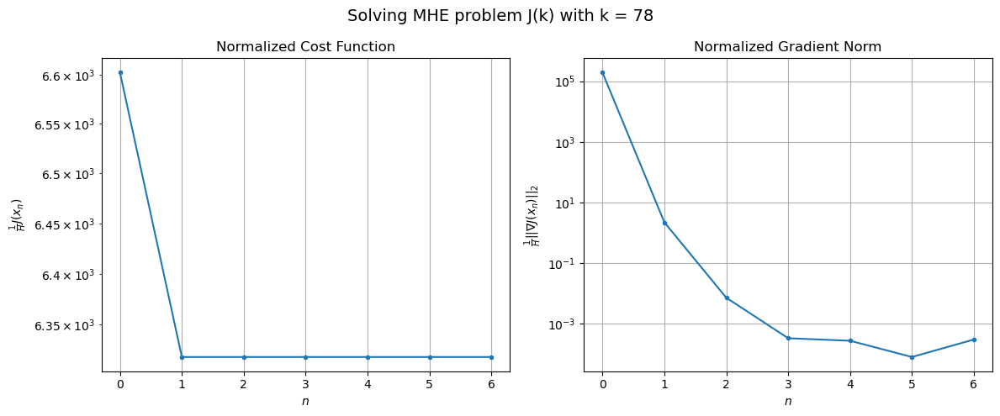

Windows:  14%|█▎        | 50/366 [29:53<3:08:44, 35.84s/it]

[Hybrid] Before applying the algorithm
Cost function: 220735.45249745494
Gradient norm: 5246987.992221275
Global estimation error: 31.44067840595573
Initial conditions estimation errors: 12.731585220692981 m, 10.066279944585487 m, 20.53814017334321 m, 17.414721429664915 m
Position estimation errors: 29.125667217943796 m, 37.92136500923304 m, 38.7346240318717 m, 75.87536239522817 m

[Hybrid] Iteration 1
Cost function: 211604.8102080647 (-4.14%)
Gradient norm: 2559.6819245517054 (-99.95%)
Global estimation error: 45.70174430112644 (45.36%)
Initial conditions estimation errors: 16.426065357102086 m, 12.637444129030436 m, 32.302213166003945 m, 24.81301389156924 m
Position estimation errors: 24.91992988857721 m, 38.315132026234366 m, 39.62771134875038 m, 104.25103944208769 m

[Hybrid] Iteration 2
Cost function: 211604.7720977677 (-0.00%)
Gradient norm: 35.320164695124994 (-98.62%)
Global estimation error: 44.98510885581329 (-1.57%)
Initial conditions estimation errors: 16.42606584499732 m, 

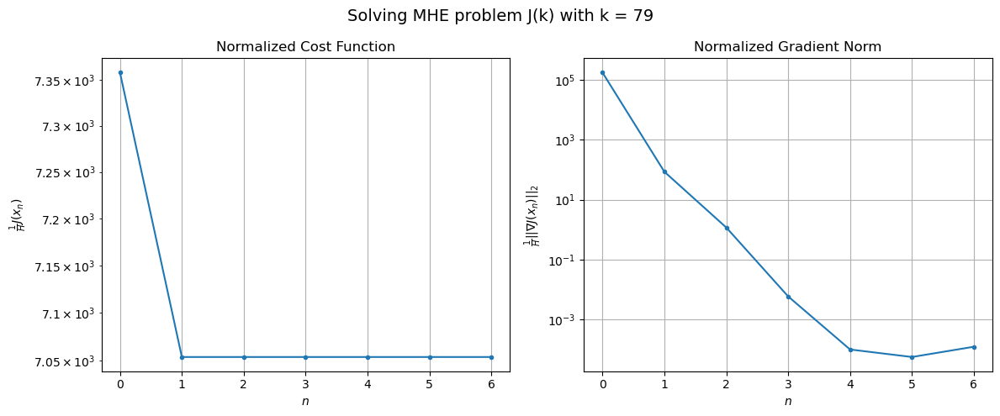

Windows:  14%|█▍        | 51/366 [30:22<2:58:15, 33.95s/it]

[Hybrid] Before applying the algorithm
Cost function: 242745.22760024332
Gradient norm: 4616597.601225882
Global estimation error: 44.8131426119636
Initial conditions estimation errors: 14.058729456290594 m, 11.136273941936626 m, 30.233935621907733 m, 27.793042233808695 m
Position estimation errors: 29.813152878105964 m, 42.52002150397635 m, 42.89269418768992 m, 102.16320454487052 m

[Hybrid] Iteration 1
Cost function: 232887.36679903173 (-4.06%)
Gradient norm: 11093.081546344458 (-99.76%)
Global estimation error: 44.311131362886634 (-1.12%)
Initial conditions estimation errors: 17.987986209743593 m, 20.883352631113812 m, 19.8897931268129 m, 28.428558312296015 m
Position estimation errors: 25.575273832970062 m, 24.81691650464533 m, 26.409524508270074 m, 29.97836185698056 m

[Hybrid] Iteration 2
Cost function: 232886.87884140547 (-0.00%)
Gradient norm: 2.414381014268487 (-99.98%)
Global estimation error: 44.37656750926401 (0.15%)
Initial conditions estimation errors: 17.987986836574795 

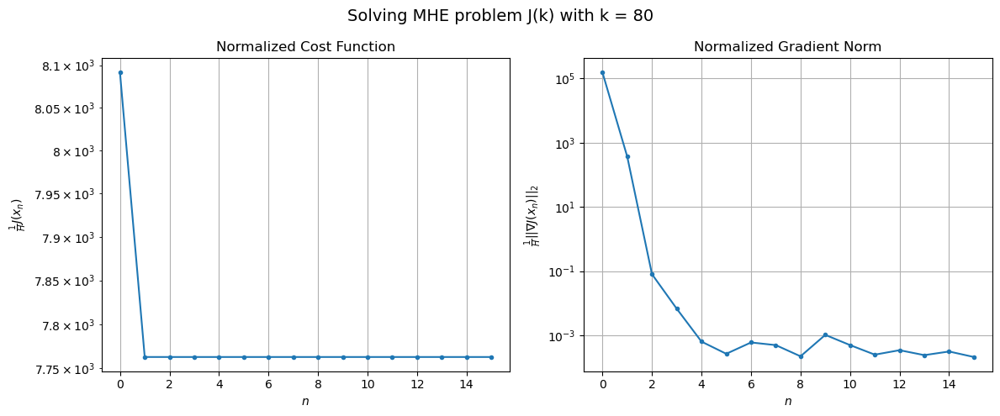

Windows:  14%|█▍        | 52/366 [31:23<3:38:52, 41.82s/it]

[Hybrid] Before applying the algorithm
Cost function: 263281.5994704813
Gradient norm: 3927453.286988531
Global estimation error: 39.83585301783547
Initial conditions estimation errors: 15.411072302263623 m, 18.60553725641499 m, 17.56288406394199 m, 26.358401248864563 m
Position estimation errors: 30.39007076927591 m, 29.08605799834321 m, 30.753911390715388 m, 32.738279267069764 m

[Hybrid] Iteration 1
Cost function: 252924.85679683846 (-3.93%)
Gradient norm: 229.86141927009194 (-99.99%)
Global estimation error: 44.09851319912074 (10.70%)
Initial conditions estimation errors: 19.500501549529048 m, 24.11961503081055 m, 18.152575634852923 m, 25.556349324854278 m
Position estimation errors: 26.150903023980632 m, 21.8695794213522 m, 25.97671708681894 m, 22.044156508750092 m

[Hybrid] Iteration 2
Cost function: 252924.85444617792 (-0.00%)
Gradient norm: 5.502712509169804 (-97.61%)
Global estimation error: 44.031353295790865 (-0.15%)
Initial conditions estimation errors: 19.500502259954423 m

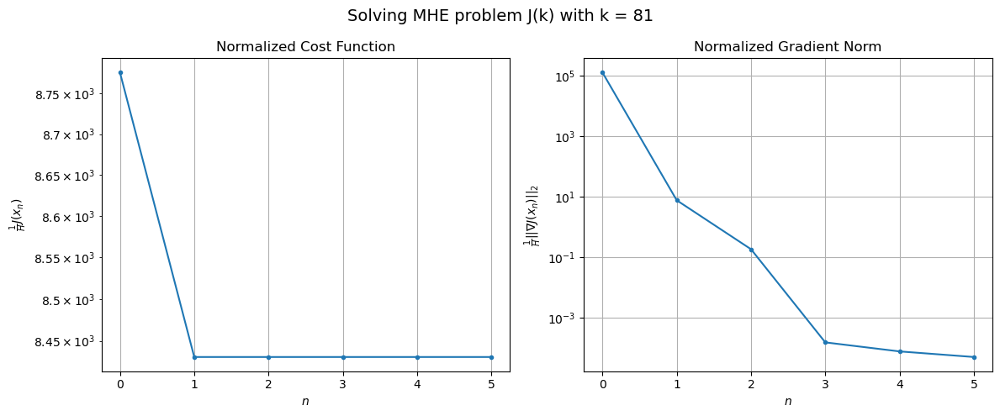

Windows:  14%|█▍        | 53/366 [31:48<3:11:52, 36.78s/it]

[Hybrid] Before applying the algorithm
Cost function: 280967.63907053764
Gradient norm: 3345249.8675386035
Global estimation error: 38.48111492810406
Initial conditions estimation errors: 16.685552335987033 m, 21.171484118837892 m, 15.956239888725378 m, 22.35049435620238 m
Position estimation errors: 30.91830707744929 m, 26.566021190381495 m, 30.86366585050806 m, 27.532623538370732 m

[Hybrid] Iteration 1
Cost function: 269927.03743659955 (-3.93%)
Gradient norm: 92.13604639530574 (-100.00%)
Global estimation error: 50.667225573843425 (31.67%)
Initial conditions estimation errors: 20.975246672001084 m, 26.64645052220407 m, 21.424327097657827 m, 30.954130181175447 m
Position estimation errors: 26.646464309117437 m, 20.255749496290367 m, 23.819726316605497 m, 15.344893076855929 m

[Hybrid] Iteration 2
Cost function: 269927.035341905 (-0.00%)
Gradient norm: 4.34879933129823 (-95.28%)
Global estimation error: 50.58657595906372 (-0.16%)
Initial conditions estimation errors: 20.97524748840223

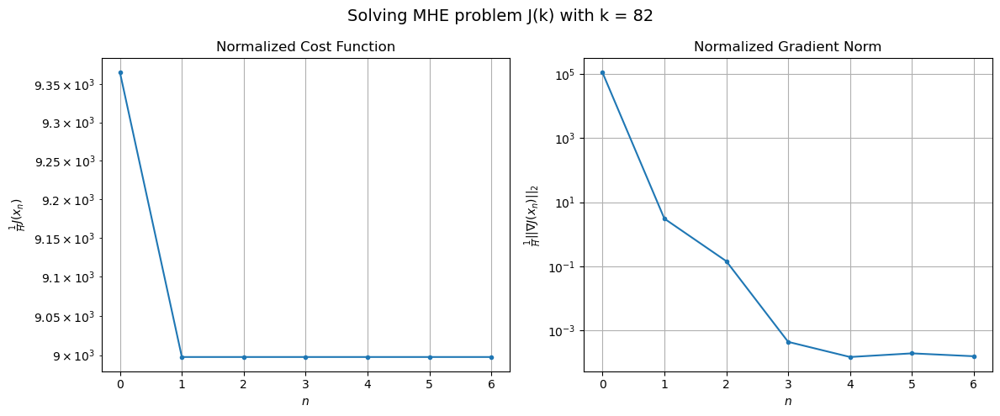

Windows:  15%|█▍        | 54/366 [32:15<2:57:02, 34.05s/it]

[Hybrid] Before applying the algorithm
Cost function: 297092.05939526804
Gradient norm: 2988034.5336730303
Global estimation error: 44.36355774831752
Initial conditions estimation errors: 17.910502153223145 m, 23.399634343954315 m, 18.87593334344834 m, 27.266863020707788 m
Position estimation errors: 31.41237577003193 m, 24.998080241185892 m, 28.711752820547844 m, 20.38667845243709 m

[Hybrid] Iteration 1
Cost function: 285238.9375040156 (-3.99%)
Gradient norm: 23.07470583528153 (-100.00%)
Global estimation error: 49.304365864797035 (11.14%)
Initial conditions estimation errors: 22.379767764366097 m, 27.55686414965506 m, 21.490267388362422 m, 26.624024167794136 m
Position estimation errors: 27.049517758612478 m, 21.171154937740635 m, 26.440727571276934 m, 20.4238005863183 m

[Hybrid] Iteration 2
Cost function: 285238.9374914139 (-0.00%)
Gradient norm: 0.00316364540586566 (-99.99%)
Global estimation error: 49.31977573560599 (0.03%)
Initial conditions estimation errors: 22.37976869405748

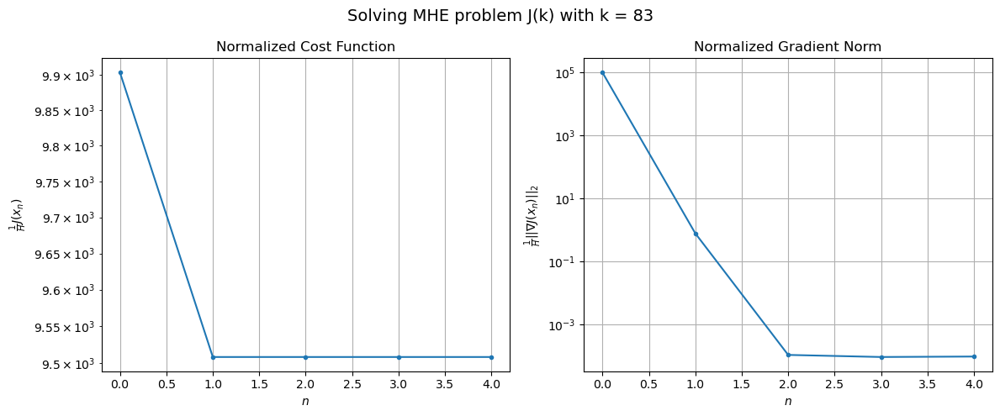

Windows:  15%|█▌        | 55/366 [32:38<2:39:12, 30.72s/it]

[Hybrid] Before applying the algorithm
Cost function: 310704.9305743777
Gradient norm: 2860495.8785816156
Global estimation error: 42.59255841445195
Initial conditions estimation errors: 19.07263906796823 m, 24.164464711478853 m, 18.43818055303346 m, 22.944654473773305 m
Position estimation errors: 31.858340343197842 m, 25.681250721571466 m, 31.346466200077884 m, 24.79516096248902 m

[Hybrid] Iteration 1
Cost function: 298104.4796680875 (-4.06%)
Gradient norm: 76.43700232433999 (-100.00%)
Global estimation error: 53.117737953314624 (24.71%)
Initial conditions estimation errors: 23.670774954765278 m, 28.234799669281344 m, 24.832866872830486 m, 29.108353094770905 m
Position estimation errors: 27.382618084524992 m, 22.689885262020443 m, 26.378617025821374 m, 23.876892416126093 m

[Hybrid] Iteration 2
Cost function: 298104.479434435 (-0.00%)
Gradient norm: 0.2746459834157038 (-99.64%)
Global estimation error: 53.16222962245404 (0.08%)
Initial conditions estimation errors: 23.67077597956837

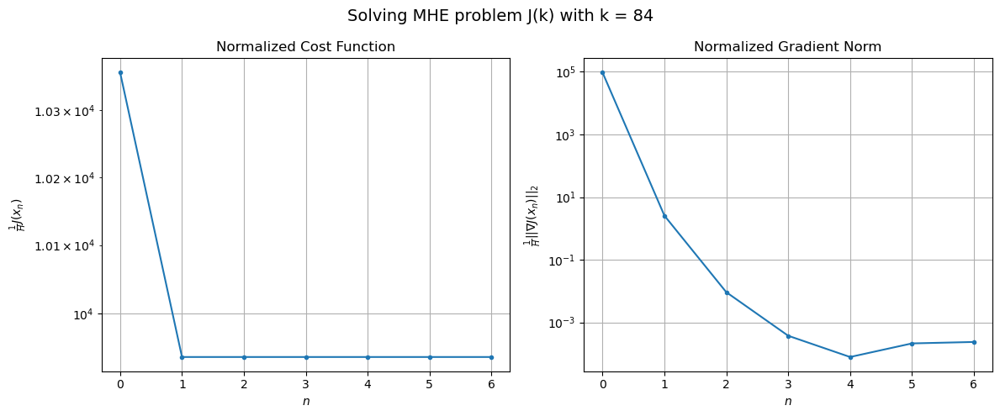

Windows:  15%|█▌        | 56/366 [33:11<2:41:34, 31.27s/it]

[Hybrid] Before applying the algorithm
Cost function: 321832.4673146171
Gradient norm: 2977617.0592309707
Global estimation error: 46.19145851302844
Initial conditions estimation errors: 20.142070719648196 m, 24.693915468057387 m, 21.476885086792514 m, 25.62976728755919 m
Position estimation errors: 32.26586140890299 m, 27.27209351132879 m, 31.219273123886286 m, 28.077594420209184 m

[Hybrid] Iteration 1
Cost function: 308428.2026733552 (-4.16%)
Gradient norm: 16.307762207183846 (-100.00%)
Global estimation error: 51.591633271196415 (11.69%)
Initial conditions estimation errors: 24.863437855675436 m, 28.256457504613106 m, 25.185492789313297 m, 24.7133717836923 m
Position estimation errors: 27.652189730533106 m, 23.686651960515213 m, 27.939082532664074 m, 27.248172654574983 m

[Hybrid] Iteration 2
Cost function: 308428.20261693647 (-0.00%)
Gradient norm: 0.05064394063001232 (-99.69%)
Global estimation error: 51.563703748120986 (-0.05%)
Initial conditions estimation errors: 24.8634389323

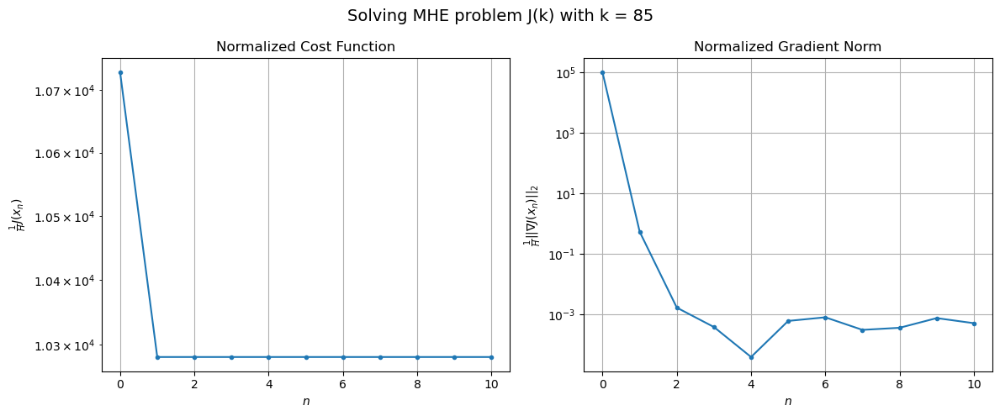

Windows:  16%|█▌        | 57/366 [33:58<3:04:46, 35.88s/it]

[Hybrid] Before applying the algorithm
Cost function: 330670.5937614199
Gradient norm: 3252060.282472483
Global estimation error: 44.14131081230934
Initial conditions estimation errors: 21.122051268226937 m, 24.423626823395068 m, 21.55078623727656 m, 21.00823834746242 m
Position estimation errors: 32.61311358619838 m, 28.520293439024964 m, 32.92479937833228 m, 32.31112279506585 m

[Hybrid] Iteration 1
Cost function: 316582.8760823602 (-4.26%)
Gradient norm: 43.302893603450286 (-100.00%)
Global estimation error: 51.62250425911712 (16.95%)
Initial conditions estimation errors: 25.928317365016643 m, 27.948486718068324 m, 27.732917804984535 m, 21.032169029109713 m
Position estimation errors: 27.863461924070023 m, 25.172408373422968 m, 27.945385714415565 m, 32.51495818930837 m

[Hybrid] Iteration 2
Cost function: 316582.8760145661 (-0.00%)
Gradient norm: 0.04706144294675533 (-99.89%)
Global estimation error: 51.636612701520264 (0.03%)
Initial conditions estimation errors: 25.92831845861482 

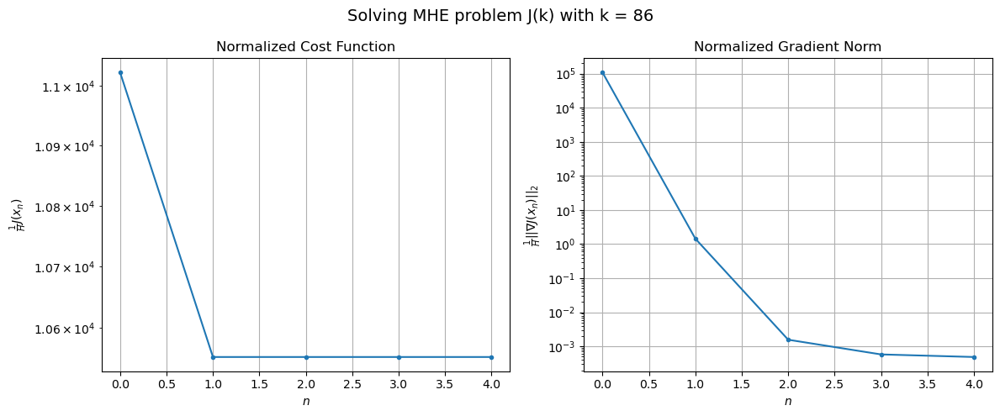

Windows:  16%|█▌        | 58/366 [34:20<2:44:18, 32.01s/it]

[Hybrid] Before applying the algorithm
Cost function: 335990.75908889755
Gradient norm: 3545694.164783965
Global estimation error: 43.82599841961622
Initial conditions estimation errors: 21.97669831290855 m, 23.933140969621114 m, 23.648979850902883 m, 17.482951311270725 m
Position estimation errors: 32.872986449391206 m, 30.139364656802254 m, 32.84448680918509 m, 37.750381244577774 m

[Hybrid] Iteration 1
Cost function: 321206.78341208876 (-4.40%)
Gradient norm: 15.18182979747043 (-100.00%)
Global estimation error: 55.70160214743498 (27.10%)
Initial conditions estimation errors: 26.866868597058897 m, 28.363239193349873 m, 29.491710553834526 m, 26.581632827643364 m
Position estimation errors: 27.974516149022012 m, 26.45069860372232 m, 27.28550335091241 m, 31.19698725953026 m

[Hybrid] Iteration 2
Cost function: 321206.78339379624 (-0.00%)
Gradient norm: 0.01086066700661626 (-99.93%)
Global estimation error: 55.72701781774155 (0.05%)
Initial conditions estimation errors: 26.8668696582294

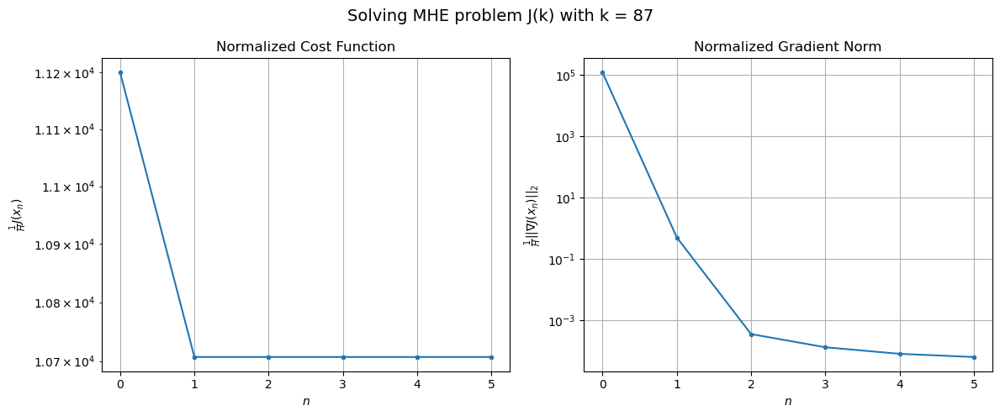

Windows:  16%|█▌        | 59/366 [34:45<2:32:19, 29.77s/it]

[Hybrid] Before applying the algorithm
Cost function: 339669.6785538763
Gradient norm: 3903398.774244624
Global estimation error: 47.541388107871974
Initial conditions estimation errors: 22.713419040597227 m, 24.192377609215566 m, 25.26403121460902 m, 22.819293704828155 m
Position estimation errors: 32.98044198033761 m, 31.49444351838682 m, 32.105195436136604 m, 36.253856787027466 m

[Hybrid] Iteration 1
Cost function: 324430.9307630653 (-4.49%)
Gradient norm: 48.01488764058459 (-100.00%)
Global estimation error: 54.50858782778869 (14.66%)
Initial conditions estimation errors: 27.627356554084592 m, 27.354515078786072 m, 31.030601864452844 m, 22.28730201694552 m
Position estimation errors: 27.954271076175864 m, 28.224690890735513 m, 27.33039270573526 m, 36.85700308096395 m

[Hybrid] Iteration 2
Cost function: 324430.93072574463 (-0.00%)
Gradient norm: 0.007715167781024462 (-99.98%)
Global estimation error: 54.48293066294474 (-0.05%)
Initial conditions estimation errors: 27.6273575249471

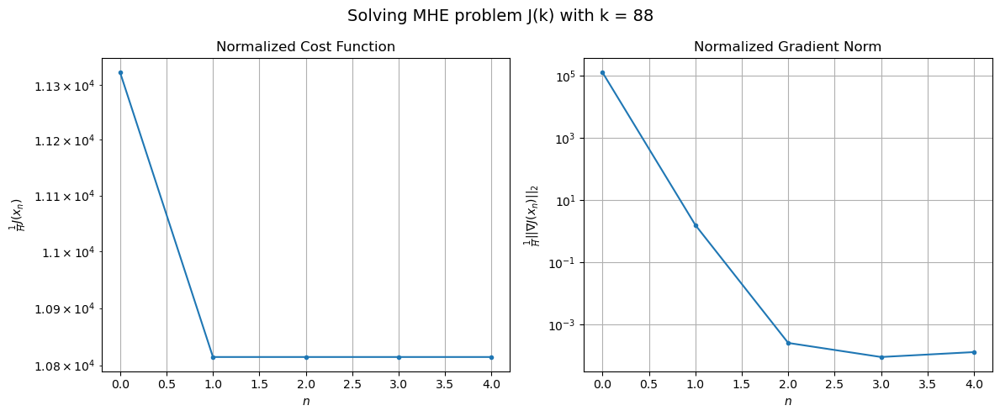

Windows:  16%|█▋        | 60/366 [35:06<2:18:34, 27.17s/it]

[Hybrid] Before applying the algorithm
Cost function: 340900.15756782086
Gradient norm: 4197567.29929081
Global estimation error: 46.02387983182286
Initial conditions estimation errors: 23.289267465176366 m, 23.016911449264626 m, 26.45373088350187 m, 18.606625621232926 m
Position estimation errors: 32.90897607855298 m, 33.32078142800096 m, 31.911205073000293 m, 42.258175276886966 m

[Hybrid] Iteration 1
Cost function: 325245.6214354743 (-4.59%)
Gradient norm: 136.93092857628665 (-100.00%)
Global estimation error: 52.82609879923881 (14.78%)
Initial conditions estimation errors: 28.227824948676716 m, 27.135904486859946 m, 30.094787576290255 m, 18.753838352082877 m
Position estimation errors: 27.766444603298154 m, 27.07163249548242 m, 27.847774175451118 m, 32.570721560198905 m

[Hybrid] Iteration 2
Cost function: 325245.62117347575 (-0.00%)
Gradient norm: 0.08450723791546536 (-99.94%)
Global estimation error: 52.844257894279195 (0.03%)
Initial conditions estimation errors: 28.227825788847

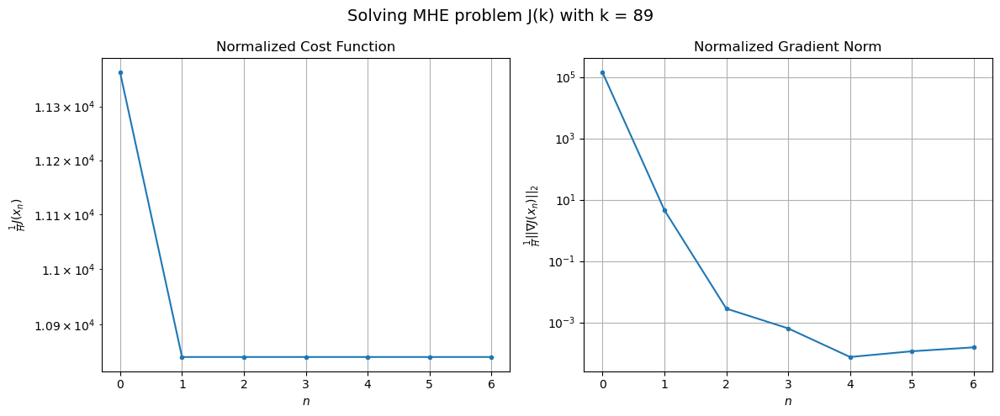

Windows:  17%|█▋        | 61/366 [35:34<2:19:44, 27.49s/it]

[Hybrid] Before applying the algorithm
Cost function: 338903.5981225457
Gradient norm: 4342111.285789683
Global estimation error: 43.98021573257053
Initial conditions estimation errors: 23.718979769106262 m, 22.55014030658298 m, 25.328344077944045 m, 14.886558998302592 m
Position estimation errors: 32.64359628876565 m, 32.17928587399982 m, 32.49721654185457 m, 38.10895835661075 m

[Hybrid] Iteration 1
Cost function: 323182.2584386695 (-4.64%)
Gradient norm: 146.53823000639386 (-100.00%)
Global estimation error: 50.08043043385485 (13.87%)
Initial conditions estimation errors: 28.6342962159028 m, 25.98381124897841 m, 28.90099621129827 m, 13.32931604671473 m
Position estimation errors: 27.447316775678715 m, 25.57394599303233 m, 29.456660854600702 m, 30.297872237105068 m

[Hybrid] Iteration 2
Cost function: 323182.2582521971 (-0.00%)
Gradient norm: 0.019284193229683232 (-99.99%)
Global estimation error: 50.10586758277157 (0.05%)
Initial conditions estimation errors: 28.634296876622646 m, 2

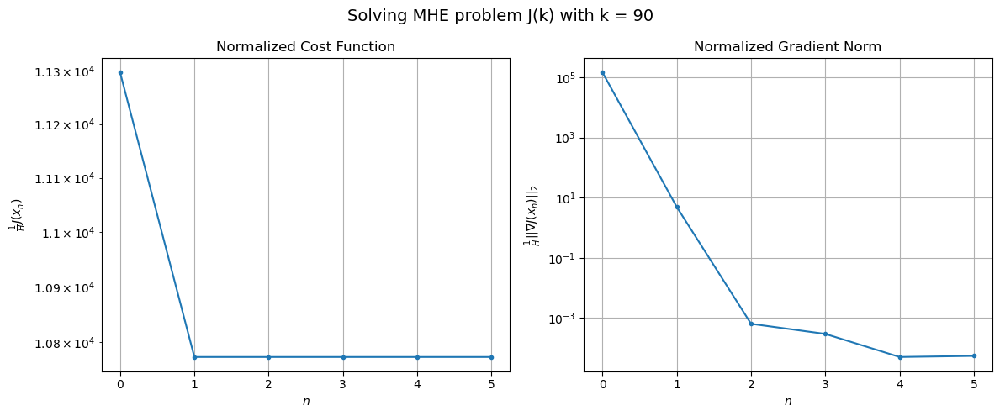

Windows:  17%|█▋        | 62/366 [35:59<2:15:25, 26.73s/it]

[Hybrid] Before applying the algorithm
Cost function: 334424.2777627956
Gradient norm: 4438218.657773248
Global estimation error: 41.16029272029431
Initial conditions estimation errors: 23.959874773737223 m, 21.0794732023008 m, 23.9526835122936 m, 10.098994123764617 m
Position estimation errors: 32.248648724598745 m, 30.745951847556764 m, 34.08430927291424 m, 36.410372562901216 m

[Hybrid] Iteration 1
Cost function: 318523.8193840691 (-4.75%)
Gradient norm: 341.7557356084681 (-99.99%)
Global estimation error: 55.62043180473749 (35.13%)
Initial conditions estimation errors: 28.87459173561657 m, 26.165554996468764 m, 33.24858313242668 m, 21.673833958030897 m
Position estimation errors: 26.98549164791217 m, 28.134422837597548 m, 25.6639800636206 m, 36.66698586334256 m

[Hybrid] Iteration 2
Cost function: 318523.81848596805 (-0.00%)
Gradient norm: 0.028811559223804212 (-99.99%)
Global estimation error: 55.50830015439709 (-0.20%)
Initial conditions estimation errors: 28.87459217535169 m, 26

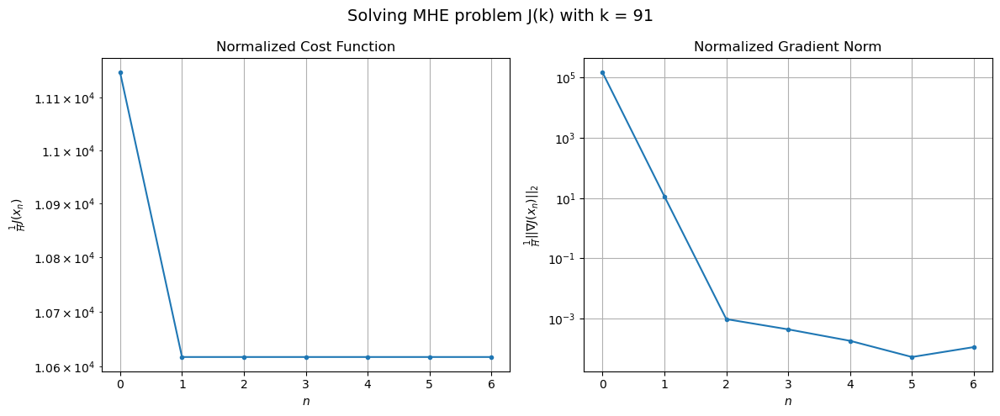

Windows:  17%|█▋        | 63/366 [36:28<2:17:30, 27.23s/it]

[Hybrid] Before applying the algorithm
Cost function: 326773.4832691417
Gradient norm: 4389700.872254414
Global estimation error: 45.91370283417003
Initial conditions estimation errors: 24.031601821609332 m, 21.255944059465637 m, 27.990538235605385 m, 17.18239399432928 m
Position estimation errors: 31.72658963414024 m, 33.13682421675803 m, 29.93618953269563 m, 42.03715109019034 m

[Hybrid] Iteration 1
Cost function: 311020.4807849253 (-4.82%)
Gradient norm: 80.09981658374976 (-100.00%)
Global estimation error: 58.82445768960802 (28.12%)
Initial conditions estimation errors: 28.904348918405397 m, 27.560353109222213 m, 33.23725786317142 m, 27.577761453590885 m
Position estimation errors: 26.462666727775506 m, 26.79692915524669 m, 24.67718045088821 m, 30.373772012488008 m

[Hybrid] Iteration 2
Cost function: 311020.4806891665 (-0.00%)
Gradient norm: 0.028883442063641858 (-99.96%)
Global estimation error: 58.810557336184914 (-0.02%)
Initial conditions estimation errors: 28.904349096734567 

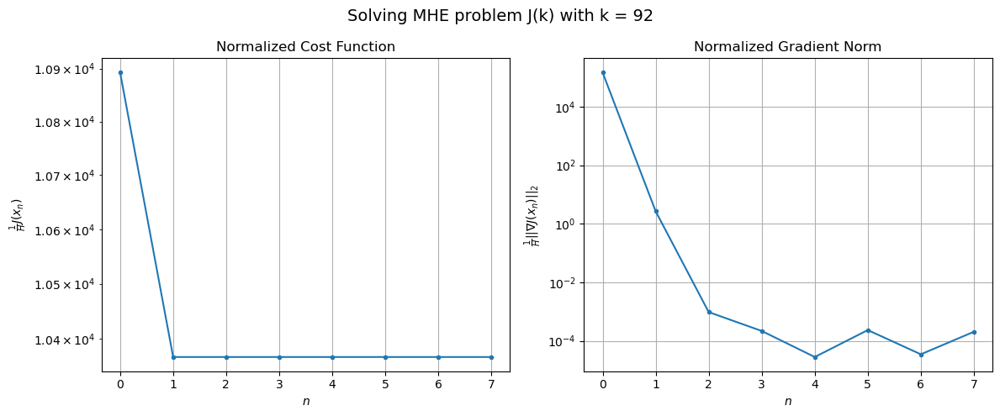

Windows:  17%|█▋        | 64/366 [37:00<2:24:40, 28.74s/it]

[Hybrid] Before applying the algorithm
Cost function: 317525.53489197337
Gradient norm: 4233653.367746962
Global estimation error: 48.60864614936636
Initial conditions estimation errors: 23.90111875843458 m, 22.447268334354995 m, 27.896094857777364 m, 22.570595155196422 m
Position estimation errors: 31.16797606827812 m, 31.64569587998818 m, 28.993345573976473 m, 35.110698784940695 m

[Hybrid] Iteration 1
Cost function: 302088.73448375985 (-4.86%)
Gradient norm: 38.24167663387759 (-100.00%)
Global estimation error: 62.86707391600059 (29.33%)
Initial conditions estimation errors: 28.711669516017388 m, 28.890767367258565 m, 33.12547908450974 m, 34.581765202169265 m
Position estimation errors: 25.94327877292469 m, 25.60197616573881 m, 23.63307836082273 m, 25.31310654950071 m

[Hybrid] Iteration 2
Cost function: 302088.73434354784 (-0.00%)
Gradient norm: 0.03949841568440839 (-99.90%)
Global estimation error: 62.68764135963165 (-0.29%)
Initial conditions estimation errors: 28.711669413691705

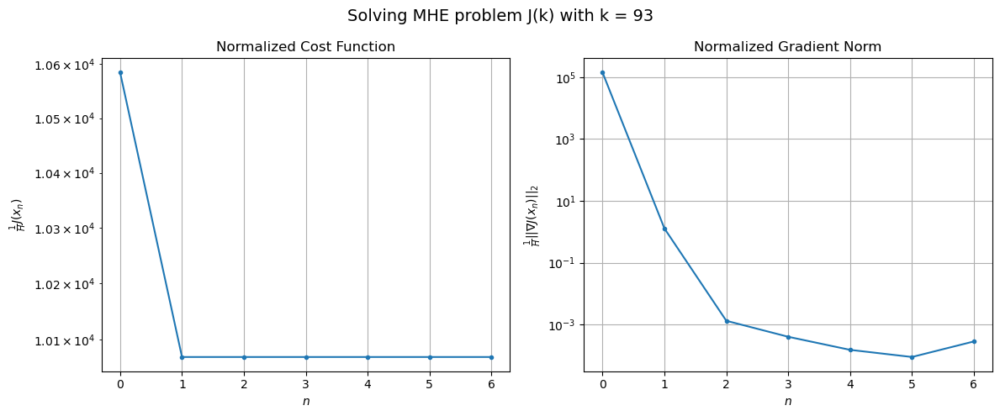

Windows:  18%|█▊        | 65/366 [37:29<2:24:03, 28.72s/it]

[Hybrid] Before applying the algorithm
Cost function: 307360.7333570502
Gradient norm: 3933492.7250763397
Global estimation error: 52.136174279966795
Initial conditions estimation errors: 23.580876603240508 m, 23.57829659517155 m, 27.67708918603971 m, 28.985003095705697 m
Position estimation errors: 30.6314651771107 m, 30.337041982370845 m, 28.051712577806807 m, 29.68082645666952 m

[Hybrid] Iteration 1
Cost function: 292231.40478405356 (-4.92%)
Gradient norm: 159.18273432345202 (-100.00%)
Global estimation error: 65.66601711893362 (25.95%)
Initial conditions estimation errors: 28.345571935199672 m, 29.965894836433183 m, 32.854307814224036 m, 39.12996428500827 m
Position estimation errors: 25.469243207687285 m, 23.04322672102493 m, 22.707740515388053 m, 16.143620726050308 m

[Hybrid] Iteration 2
Cost function: 292231.40460142685 (-0.00%)
Gradient norm: 0.041208741196385415 (-99.97%)
Global estimation error: 65.77847725142236 (0.17%)
Initial conditions estimation errors: 28.345571566829

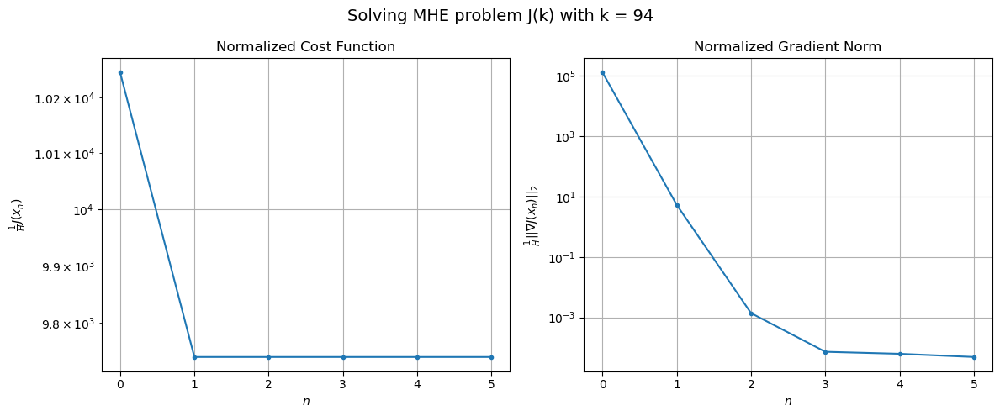

Windows:  18%|█▊        | 66/366 [37:53<2:17:38, 27.53s/it]

[Hybrid] Before applying the algorithm
Cost function: 297165.022482967
Gradient norm: 3544391.623463305
Global estimation error: 54.826913709798724
Initial conditions estimation errors: 23.143578651186292 m, 24.524828539804464 m, 27.386468055320503 m, 33.44909557552321 m
Position estimation errors: 30.13159225286796 m, 27.641271724051794 m, 27.087089290205686 m, 20.02156883282659 m

[Hybrid] Iteration 1
Cost function: 282655.4147823043 (-4.88%)
Gradient norm: 13.704552429162385 (-100.00%)
Global estimation error: 62.446796947829796 (13.90%)
Initial conditions estimation errors: 27.834305622801423 m, 29.357511900151373 m, 30.123717396968487 m, 36.81728298369928 m
Position estimation errors: 25.108129837753257 m, 22.899242818642907 m, 23.53542095520141 m, 15.898795947417506 m

[Hybrid] Iteration 2
Cost function: 282655.4147774537 (-0.00%)
Gradient norm: 0.005719636821666823 (-99.96%)
Global estimation error: 62.43612612868365 (-0.02%)
Initial conditions estimation errors: 27.834305016616

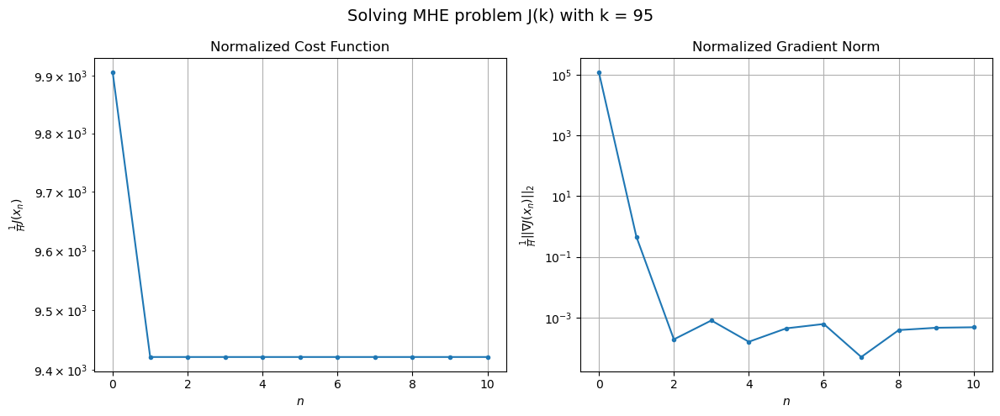

Windows:  18%|█▊        | 67/366 [38:37<2:41:38, 32.44s/it]

[Hybrid] Before applying the algorithm
Cost function: 287628.2905256192
Gradient norm: 3210639.308956325
Global estimation error: 51.58205073497419
Initial conditions estimation errors: 22.64022481574523 m, 23.91041160012154 m, 24.78200076839319 m, 31.019939312547788 m
Position estimation errors: 29.727051642149924 m, 27.395631721604413 m, 28.020059779598704 m, 20.0394159338111 m

[Hybrid] Iteration 1
Cost function: 273579.38385461527 (-4.88%)
Gradient norm: 530.1713148953787 (-99.98%)
Global estimation error: 69.06251344884328 (33.89%)
Initial conditions estimation errors: 27.282853247552904 m, 30.816211225555715 m, 30.440762376160553 m, 46.356889370399365 m
Position estimation errors: 24.825880544341352 m, 25.17406763481065 m, 19.836392167067192 m, 21.427950907394376 m

[Hybrid] Iteration 2
Cost function: 273579.3816862781 (-0.00%)
Gradient norm: 0.18944175441977254 (-99.96%)
Global estimation error: 69.45906819551924 (0.57%)
Initial conditions estimation errors: 27.282852463598118 m

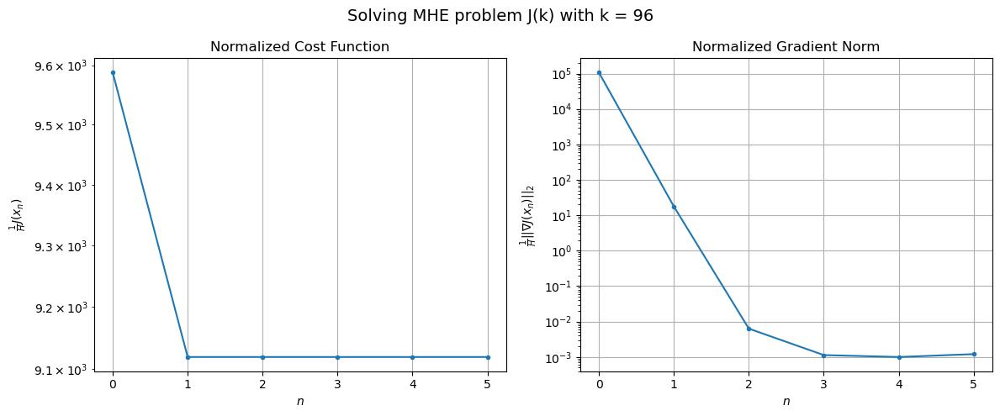

Windows:  19%|█▊        | 68/366 [39:06<2:35:08, 31.24s/it]

[Hybrid] Before applying the algorithm
Cost function: 279177.09928892547
Gradient norm: 2928880.394164621
Global estimation error: 59.40016367749778
Initial conditions estimation errors: 22.151526512572502 m, 25.790109314518016 m, 24.99351968357097 m, 41.80730371795407 m
Position estimation errors: 29.40902364098265 m, 29.433405001334755 m, 24.271985481756627 m, 24.39732854027719 m

[Hybrid] Iteration 1
Cost function: 265528.7216489568 (-4.89%)
Gradient norm: 13.116396583728656 (-100.00%)
Global estimation error: 71.32080542928207 (20.07%)
Initial conditions estimation errors: 26.765806325756024 m, 30.539034650934067 m, 30.440466263439948 m, 50.10946942142655 m
Position estimation errors: 24.624762806075143 m, 25.02665473853516 m, 19.033056248875624 m, 18.17192571085924 m

[Hybrid] Iteration 2
Cost function: 265528.72161444504 (-0.00%)
Gradient norm: 0.022015744924883666 (-99.83%)
Global estimation error: 71.45557521690066 (0.19%)
Initial conditions estimation errors: 26.76580542963905

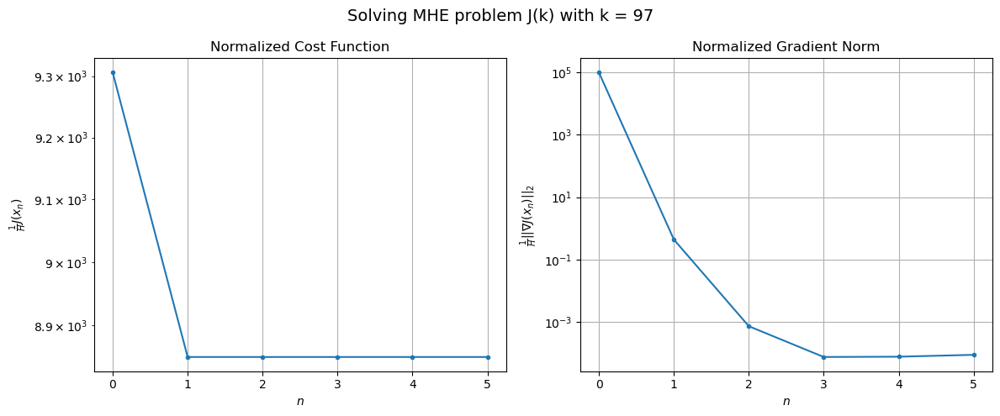

Windows:  19%|█▉        | 69/366 [39:29<2:23:02, 28.90s/it]

[Hybrid] Before applying the algorithm
Cost function: 271618.79636485525
Gradient norm: 2755542.6942747002
Global estimation error: 61.60881583939901
Initial conditions estimation errors: 21.71608274904798 m, 25.523803216912384 m, 24.918462563663905 m, 45.2949427267749 m
Position estimation errors: 29.235110740975248 m, 29.29981608555363 m, 23.485983589944976 m, 21.30070188300794 m

[Hybrid] Iteration 1
Cost function: 258344.0968479183 (-4.89%)
Gradient norm: 175.34720185129189 (-99.99%)
Global estimation error: 75.79701936449686 (23.03%)
Initial conditions estimation errors: 26.3154756454456 m, 31.618608578448814 m, 28.08576998082097 m, 57.13234059709504 m
Position estimation errors: 24.5694022569509 m, 26.27366200606874 m, 19.68432916900369 m, 19.94480468713904 m

[Hybrid] Iteration 2
Cost function: 258344.09651591972 (-0.00%)
Gradient norm: 0.02343861580370546 (-99.99%)
Global estimation error: 75.63097660304228 (-0.22%)
Initial conditions estimation errors: 26.315474696669042 m, 31

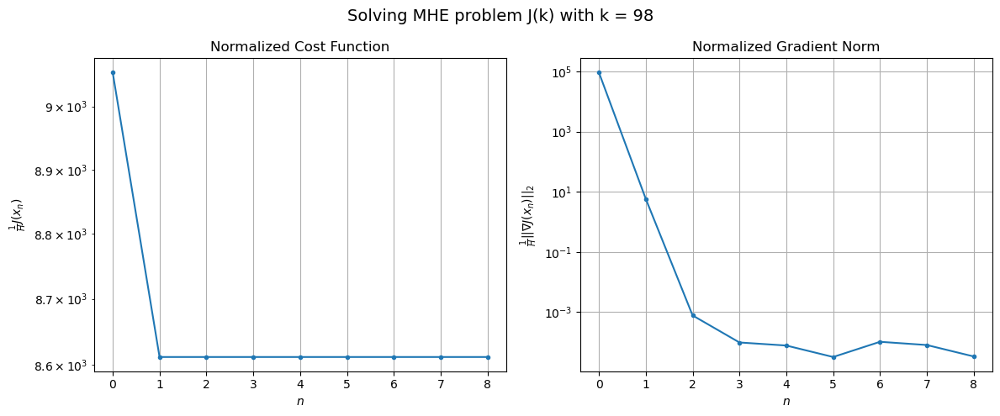

Windows:  19%|█▉        | 70/366 [40:10<2:39:34, 32.35s/it]

[Hybrid] Before applying the algorithm
Cost function: 266732.9360839138
Gradient norm: 2732980.2678978797
Global estimation error: 66.54477603583524
Initial conditions estimation errors: 21.33908626233272 m, 26.771913403921587 m, 22.522745779330805 m, 52.42910875079592 m
Position estimation errors: 29.30060912564947 m, 30.62202086280007 m, 24.417786853919264 m, 22.971894781399495 m

[Hybrid] Iteration 1
Cost function: 253637.9268590418 (-4.91%)
Gradient norm: 351.75215357621244 (-99.99%)
Global estimation error: 60.48703027207365 (-9.10%)
Initial conditions estimation errors: 25.930884752833308 m, 28.169357610606873 m, 25.654781029160223 m, 39.17341600838182 m
Position estimation errors: 24.69634622905397 m, 23.6526342372638 m, 24.007839255374897 m, 21.212721821965996 m

[Hybrid] Iteration 2
Cost function: 253637.92466599512 (-0.00%)
Gradient norm: 0.0692018055826423 (-99.98%)
Global estimation error: 60.32932852046309 (-0.26%)
Initial conditions estimation errors: 25.930883792636898 m

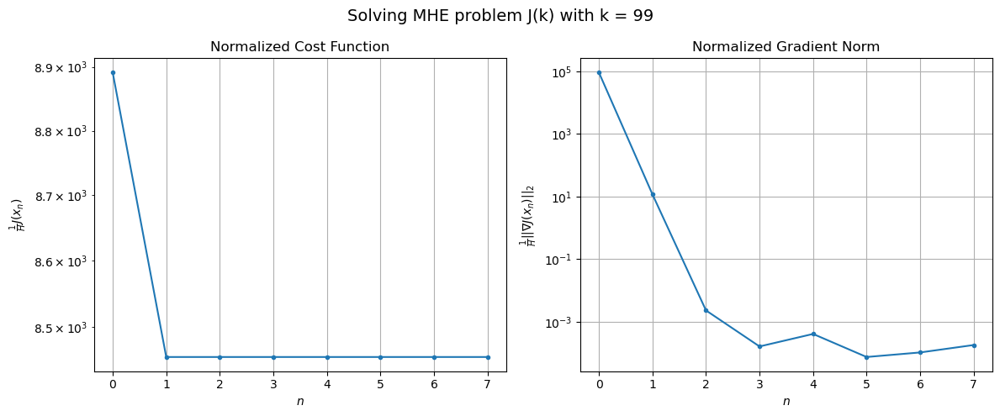

Windows:  19%|█▉        | 71/366 [40:47<2:46:33, 33.88s/it]

[Hybrid] Before applying the algorithm
Cost function: 263375.632698394
Gradient norm: 2805001.6534596034
Global estimation error: 50.66565413599653
Initial conditions estimation errors: 21.018110449258597 m, 23.15351369358201 m, 20.511900346659115 m, 34.181778619264605 m
Position estimation errors: 29.615439663824034 m, 28.4213047271175 m, 28.9589605686404 m, 25.39903079477343 m

[Hybrid] Iteration 1
Cost function: 250366.2083286388 (-4.94%)
Gradient norm: 35.50675442038034 (-100.00%)
Global estimation error: 63.74081189212027 (25.81%)
Initial conditions estimation errors: 25.617751985456728 m, 29.35815084594346 m, 25.346351881997425 m, 43.61479838840155 m
Position estimation errors: 25.05488542801677 m, 23.953019956331293 m, 23.01802904402371 m, 20.482922008119903 m

[Hybrid] Iteration 2
Cost function: 250366.20820373722 (-0.00%)
Gradient norm: 0.18512327808906187 (-99.48%)
Global estimation error: 64.08478142569126 (0.54%)
Initial conditions estimation errors: 25.617751031590462 m, 2

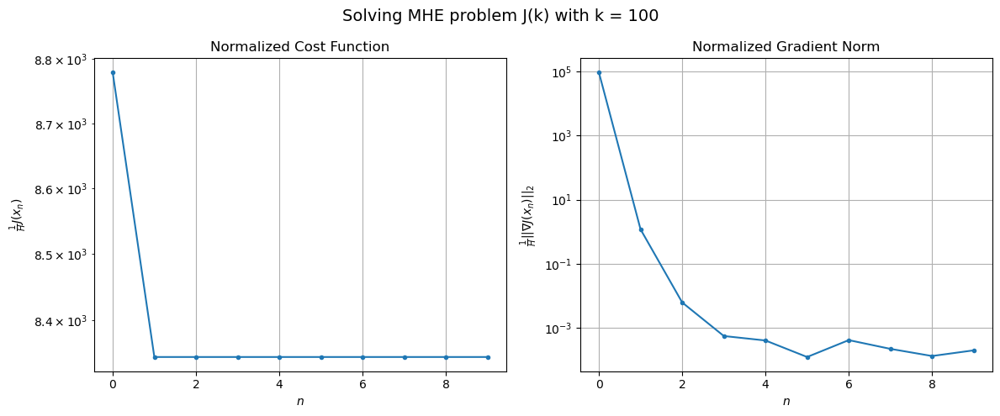

Windows:  20%|█▉        | 72/366 [41:26<2:54:02, 35.52s/it]

[Hybrid] Before applying the algorithm
Cost function: 263751.4531868792
Gradient norm: 2974943.7201127466
Global estimation error: 54.73543434172355
Initial conditions estimation errors: 20.777800286861034 m, 24.61268499106498 m, 20.110685033463046 m, 39.420766500349046 m
Position estimation errors: 30.170764519966852 m, 28.896072445536042 m, 28.026839571923716 m, 24.561818543339122 m

[Hybrid] Iteration 1
Cost function: 250647.82736939978 (-4.97%)
Gradient norm: 416.6442370012426 (-99.99%)
Global estimation error: 80.11911501957815 (46.38%)
Initial conditions estimation errors: 25.369782083894105 m, 35.1783055544449 m, 25.343429985434394 m, 62.41483272816012 m
Position estimation errors: 25.5899527391953 m, 23.529855082936468 m, 18.25884977803103 m, 17.63002856800756 m

[Hybrid] Iteration 2
Cost function: 250647.82451230087 (-0.00%)
Gradient norm: 0.11028476366219454 (-99.97%)
Global estimation error: 79.83052989396384 (-0.36%)
Initial conditions estimation errors: 25.369781166613517 

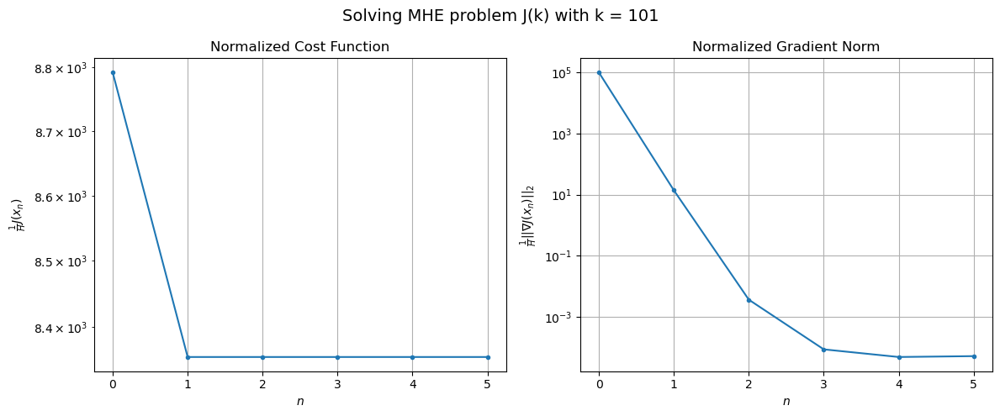

Windows:  20%|█▉        | 73/366 [41:50<2:36:38, 32.08s/it]

[Hybrid] Before applying the algorithm
Cost function: 266434.48117066093
Gradient norm: 3220456.6335421056
Global estimation error: 71.15576278800951
Initial conditions estimation errors: 20.61419178498729 m, 30.362510575818803 m, 19.663109615090697 m, 57.7030983692177 m
Position estimation errors: 30.864757128836214 m, 28.2735534228019 m, 23.409536529125415 m, 21.42321015164291 m

[Hybrid] Iteration 1
Cost function: 253219.70401102272 (-4.96%)
Gradient norm: 23.146358299573738 (-100.00%)
Global estimation error: 76.54021774317424 (7.57%)
Initial conditions estimation errors: 25.19519945690469 m, 34.22245859672893 m, 22.706509778980074 m, 59.47109881716226 m
Position estimation errors: 26.25783335910538 m, 24.25865792656138 m, 21.019056339052 m, 17.47952411649496 m

[Hybrid] Iteration 2
Cost function: 253219.7040020274 (-0.00%)
Gradient norm: 0.01565349096955245 (-99.93%)
Global estimation error: 76.48832536553658 (-0.07%)
Initial conditions estimation errors: 25.195198575138146 m, 34.

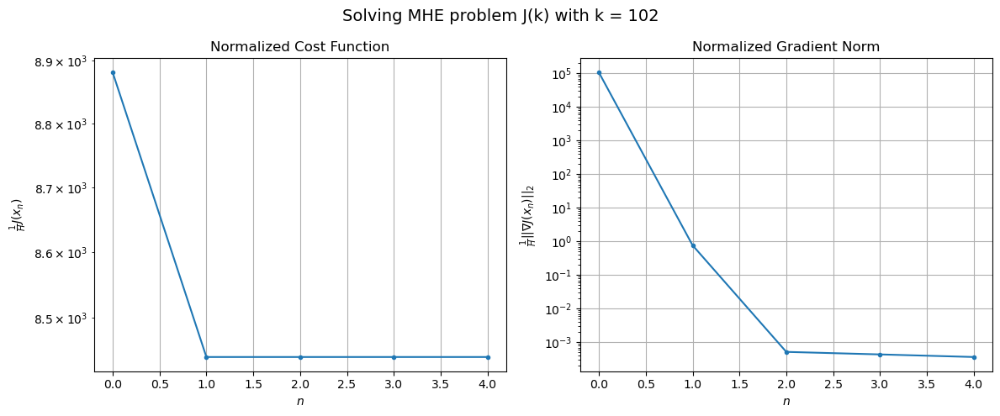

Windows:  20%|██        | 74/366 [42:14<2:24:07, 29.61s/it]

[Hybrid] Before applying the algorithm
Cost function: 271497.40802546433
Gradient norm: 3485545.3206819543
Global estimation error: 67.83563380567631
Initial conditions estimation errors: 20.529902777812303 m, 29.501543458031144 m, 17.20768943075943 m, 54.89736473675254 m
Position estimation errors: 31.650049210703152 m, 29.199969495044517 m, 26.26886466849962 m, 21.58341516002465 m

[Hybrid] Iteration 1
Cost function: 258022.68009440298 (-4.96%)
Gradient norm: 5161.260020930052 (-99.85%)
Global estimation error: 45.47188895881253 (-32.97%)
Initial conditions estimation errors: 25.10335616421955 m, 16.046998532521464 m, 33.09345191843857 m, 9.208617981586082 m
Position estimation errors: 26.97047574987526 m, 21.820797114160065 m, 36.10300406693774 m, 28.103575668301552 m

[Hybrid] Iteration 2
Cost function: 258022.24046829736 (-0.00%)
Gradient norm: 0.9654840604526136 (-99.98%)
Global estimation error: 45.56111791180724 (0.20%)
Initial conditions estimation errors: 25.103355354147524 m

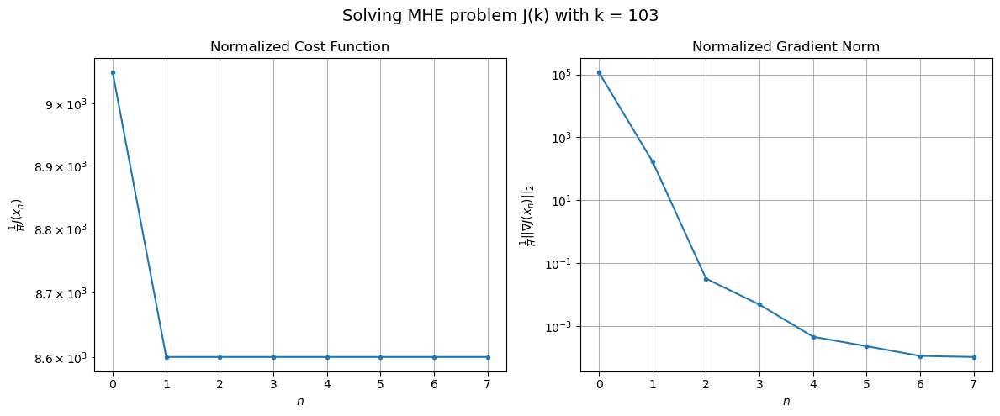

Windows:  20%|██        | 75/366 [42:44<2:23:47, 29.65s/it]

[Hybrid] Before applying the algorithm
Cost function: 278449.86529623537
Gradient norm: 3702100.822018967
Global estimation error: 39.213403051572485
Initial conditions estimation errors: 20.532606735871692 m, 11.446538900832365 m, 29.8388803429399 m, 9.7309990808305 m
Position estimation errors: 32.47774080614145 m, 28.088008438044625 m, 41.34842645185544 m, 34.94224462909909 m

[Hybrid] Iteration 1
Cost function: 264645.19505881035 (-4.96%)
Gradient norm: 1270.4775299296111 (-99.97%)
Global estimation error: 46.35283330813596 (18.21%)
Initial conditions estimation errors: 25.10354094259937 m, 21.438868356353122 m, 26.75726980163879 m, 18.5146010767685 m
Position estimation errors: 27.701169338342677 m, 27.627181648112522 m, 29.839906645331368 m, 30.09415579353332 m

[Hybrid] Iteration 2
Cost function: 264645.1775894674 (-0.00%)
Gradient norm: 4.754008879289511 (-99.63%)
Global estimation error: 47.10618320882197 (1.63%)
Initial conditions estimation errors: 25.10354024384718 m, 21.97

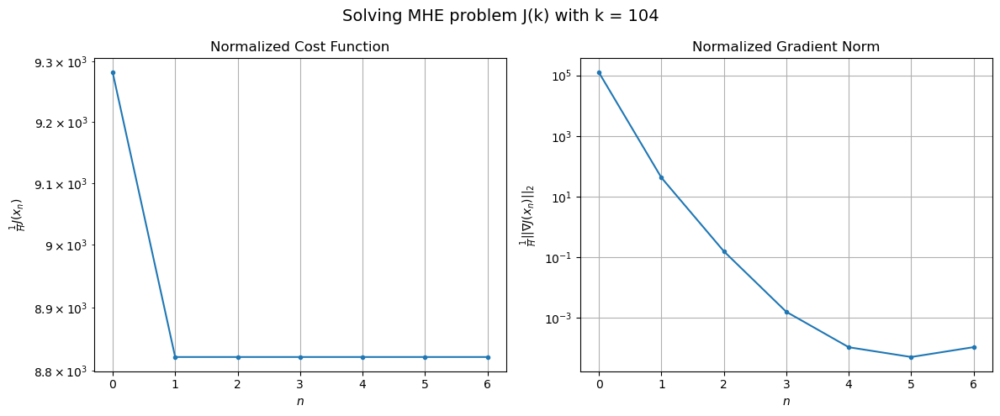

Windows:  21%|██        | 76/366 [43:13<2:22:59, 29.58s/it]

[Hybrid] Before applying the algorithm
Cost function: 288943.763795823
Gradient norm: 3909286.489875013
Global estimation error: 38.24697876673761
Initial conditions estimation errors: 20.63329920869389 m, 17.372916909331025 m, 22.079939606752642 m, 15.739445698303859 m
Position estimation errors: 33.38273974495169 m, 33.71583382259556 m, 34.95385282531935 m, 35.62284644857705 m

[Hybrid] Iteration 1
Cost function: 274605.39108401164 (-4.96%)
Gradient norm: 211.4579640306506 (-99.99%)
Global estimation error: 56.983894415271365 (48.99%)
Initial conditions estimation errors: 25.232111805195313 m, 27.064800128887164 m, 23.847359602527238 m, 36.183904455542645 m
Position estimation errors: 28.465160254237457 m, 26.270967589586757 m, 28.50945776517075 m, 22.36640056939282 m

[Hybrid] Iteration 2
Cost function: 274605.3895965496 (-0.00%)
Gradient norm: 0.9177814173280917 (-99.57%)
Global estimation error: 56.66837589077302 (-0.55%)
Initial conditions estimation errors: 25.232111262298062 m,

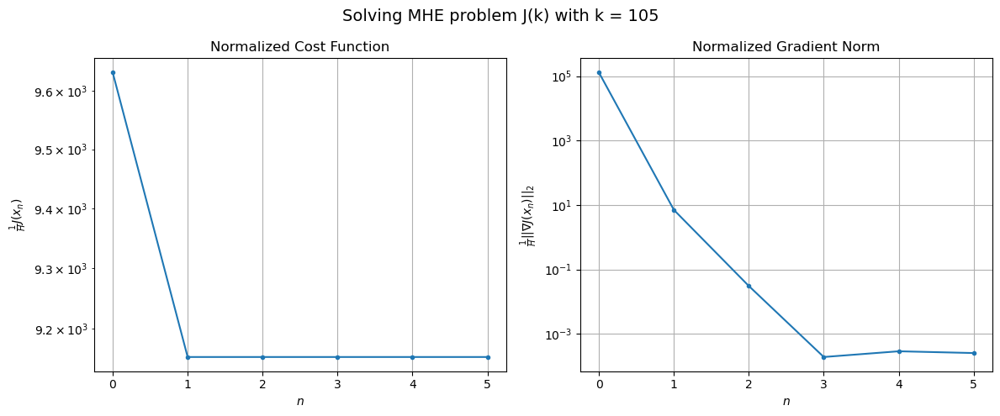

Windows:  21%|██        | 77/366 [43:38<2:15:53, 28.21s/it]

[Hybrid] Before applying the algorithm
Cost function: 302521.7487193644
Gradient norm: 4094169.3523619166
Global estimation error: 47.697616229889185
Initial conditions estimation errors: 20.85917454272958 m, 22.240987048222973 m, 19.714478216529514 m, 30.929098175888946 m
Position estimation errors: 34.4162807621271 m, 32.08758517756522 m, 34.53884384858241 m, 27.758669508307722 m

[Hybrid] Iteration 1
Cost function: 287699.5867473444 (-4.90%)
Gradient norm: 7.537396645219773 (-100.00%)
Global estimation error: 54.793090118017474 (14.88%)
Initial conditions estimation errors: 25.482661570037145 m, 25.15820388873187 m, 23.76647275885724 m, 33.98686868928477 m
Position estimation errors: 29.36277544063327 m, 27.226086169252287 m, 29.345641933595143 m, 22.567235785366847 m

[Hybrid] Iteration 2
Cost function: 287699.5867438735 (-0.00%)
Gradient norm: 0.004471720674945117 (-99.94%)
Global estimation error: 54.80193323763107 (0.02%)
Initial conditions estimation errors: 25.48266122511051 m

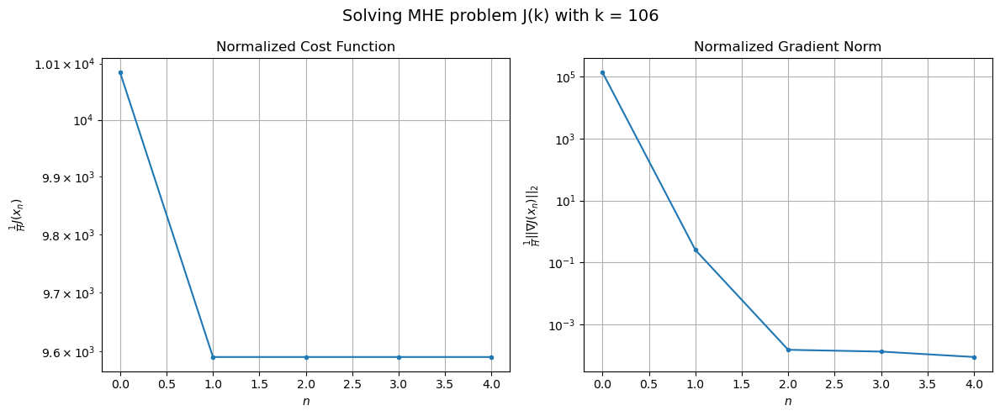

Windows:  21%|██▏       | 78/366 [43:58<2:03:03, 25.64s/it]

[Hybrid] Before applying the algorithm
Cost function: 319158.5330425247
Gradient norm: 4229353.029244278
Global estimation error: 45.85190673762692
Initial conditions estimation errors: 21.182005430585008 m, 20.569866382531195 m, 19.526316638230163 m, 29.14271500971105 m
Position estimation errors: 35.64636507850392 m, 33.59938134940402 m, 35.61718764685639 m, 28.495943856270426 m

[Hybrid] Iteration 1
Cost function: 303496.1553805375 (-4.91%)
Gradient norm: 150.8874184830098 (-100.00%)
Global estimation error: 52.43583844153699 (14.36%)
Initial conditions estimation errors: 25.910325649260525 m, 23.193139041278286 m, 26.214565783104394 m, 29.206478437315166 m
Position estimation errors: 30.411985610734764 m, 27.302715079288028 m, 32.64967196626581 m, 21.22711427145873 m

[Hybrid] Iteration 2
Cost function: 303496.15513531346 (-0.00%)
Gradient norm: 0.125087668457467 (-99.92%)
Global estimation error: 52.57807101288813 (0.27%)
Initial conditions estimation errors: 25.910325520950753 m,

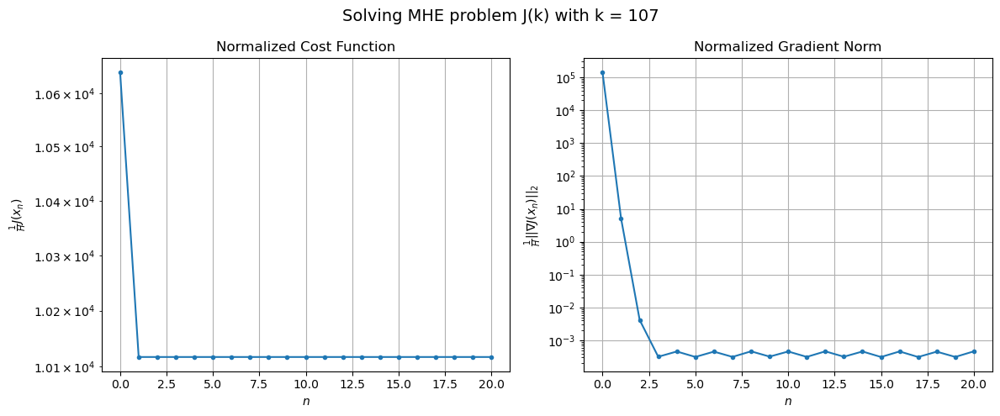

Windows:  22%|██▏       | 79/366 [45:20<3:23:36, 42.57s/it]

[Hybrid] Before applying the algorithm
Cost function: 338338.2542784783
Gradient norm: 4389346.684164554
Global estimation error: 43.55194182164605
Initial conditions estimation errors: 21.630619129364856 m, 18.64367987760152 m, 22.130183502452024 m, 24.321393447462853 m
Position estimation errors: 37.00763284634618 m, 34.18898118556551 m, 39.0207101761786 m, 27.70830619393436 m

[Hybrid] Iteration 1
Cost function: 321605.6371950447 (-4.95%)
Gradient norm: 130.10093833258261 (-100.00%)
Global estimation error: 48.15356092217993 (10.57%)
Initial conditions estimation errors: 26.504345409265326 m, 21.372919969026256 m, 25.804820895760987 m, 22.216372720468435 m
Position estimation errors: 31.563679359467205 m, 32.087486395185216 m, 32.86886756766058 m, 27.096345166126948 m

[Hybrid] Iteration 2
Cost function: 321605.6363131845 (-0.00%)
Gradient norm: 1.2898280641168784 (-99.01%)
Global estimation error: 48.08370648225854 (-0.15%)
Initial conditions estimation errors: 26.504345507163368 m

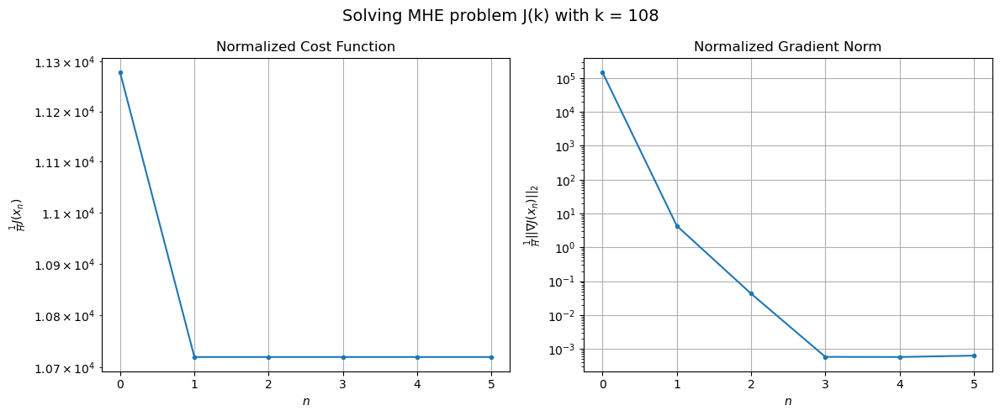

Windows:  22%|██▏       | 80/366 [45:47<3:00:01, 37.77s/it]

[Hybrid] Before applying the algorithm
Cost function: 359143.76444774173
Gradient norm: 4502945.43048684
Global estimation error: 39.238222780959916
Initial conditions estimation errors: 22.184870366933787 m, 16.733820817599113 m, 21.806894802583756 m, 17.084585252486203 m
Position estimation errors: 38.36727099133672 m, 39.02325565310508 m, 39.77784630299566 m, 33.85284678304977 m

[Hybrid] Iteration 1
Cost function: 341438.34592314117 (-4.93%)
Gradient norm: 2447.13713439136 (-99.95%)
Global estimation error: 55.78317704021437 (42.17%)
Initial conditions estimation errors: 27.212452124025543 m, 29.3446690778252 m, 19.07112876803812 m, 33.85857138852905 m
Position estimation errors: 32.7494419002833 m, 39.26631354514493 m, 26.93628801714581 m, 43.0275959192072 m

[Hybrid] Iteration 2
Cost function: 341438.3146105823 (-0.00%)
Gradient norm: 0.21901741170027594 (-99.99%)
Global estimation error: 55.90487740560064 (0.22%)
Initial conditions estimation errors: 27.212452462345873 m, 29.389

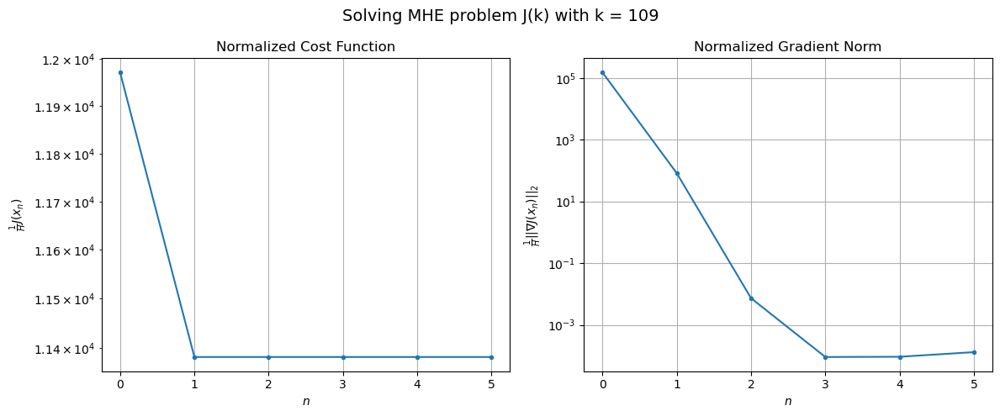

Windows:  22%|██▏       | 81/366 [46:12<2:41:08, 33.92s/it]

[Hybrid] Before applying the algorithm
Cost function: 382750.054338501
Gradient norm: 4603736.761587738
Global estimation error: 47.871503470452645
Initial conditions estimation errors: 22.809451244917856 m, 25.44398172648209 m, 14.205186209739503 m, 30.367797711828533 m
Position estimation errors: 39.63227884474113 m, 45.67392023051966 m, 34.29236574768643 m, 49.021478890798825 m

[Hybrid] Iteration 1
Cost function: 363648.5857374705 (-4.99%)
Gradient norm: 128.24796312597562 (-100.00%)
Global estimation error: 56.13925319187365 (17.27%)
Initial conditions estimation errors: 28.0520942975499 m, 30.6605833775026 m, 19.159330689254748 m, 32.51952923332817 m
Position estimation errors: 33.7826014488256 m, 42.223664989201666 m, 27.42111945537175 m, 49.8684987211172 m

[Hybrid] Iteration 2
Cost function: 363648.5856786014 (-0.00%)
Gradient norm: 0.018911189598071042 (-99.99%)
Global estimation error: 56.183919235243096 (0.08%)
Initial conditions estimation errors: 28.052094878184285 m, 30.

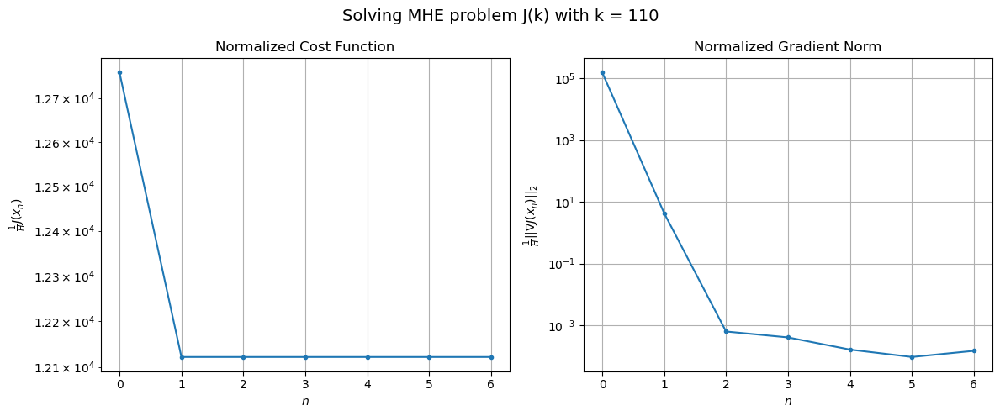

Windows:  22%|██▏       | 82/366 [46:40<2:32:06, 32.14s/it]

[Hybrid] Before applying the algorithm
Cost function: 406773.1097053727
Gradient norm: 4556074.896856112
Global estimation error: 48.20751931324019
Initial conditions estimation errors: 23.53955265213671 m, 26.8237648736525 m, 14.17200734024021 m, 29.145689993230548 m
Position estimation errors: 40.63496233371134 m, 48.61400558962905 m, 34.794255726191224 m, 56.130377617351186 m

[Hybrid] Iteration 1
Cost function: 386583.67085218534 (-4.96%)
Gradient norm: 255.50108050406334 (-99.99%)
Global estimation error: 63.37922256953985 (31.47%)
Initial conditions estimation errors: 28.973172834235793 m, 35.92722102794956 m, 19.270175139378924 m, 38.927516545900104 m
Position estimation errors: 34.62502915917058 m, 43.88194569710878 m, 27.314075734952798 m, 56.15948655797134 m

[Hybrid] Iteration 2
Cost function: 386583.670444102 (-0.00%)
Gradient norm: 0.27658198387880084 (-99.89%)
Global estimation error: 63.344710417524524 (-0.05%)
Initial conditions estimation errors: 28.973173642052828 m, 

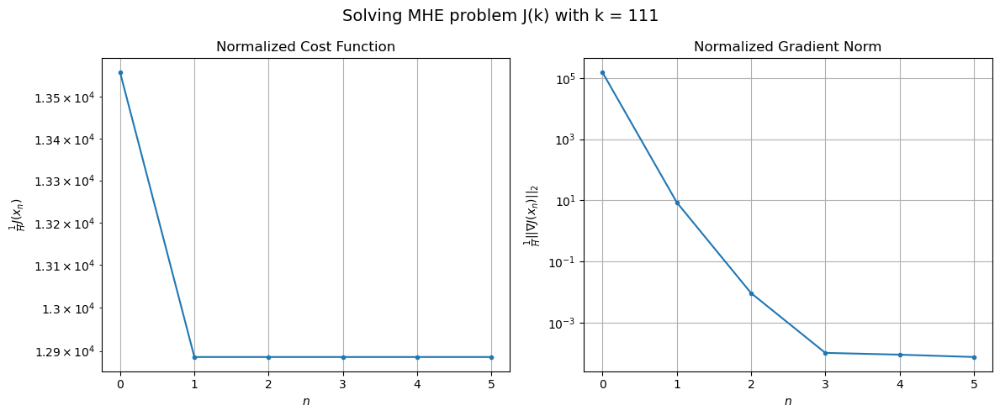

Windows:  23%|██▎       | 83/366 [47:05<2:22:09, 30.14s/it]

[Hybrid] Before applying the algorithm
Cost function: 430421.66887451155
Gradient norm: 4532411.213840473
Global estimation error: 55.60572190055552
Initial conditions estimation errors: 24.34030237230427 m, 32.05868969546793 m, 14.320541497147328 m, 35.59052261859319 m
Position estimation errors: 41.386825342595046 m, 49.832669662296155 m, 34.72055155070287 m, 61.75119995016499 m

[Hybrid] Iteration 1
Cost function: 409371.09961420955 (-4.89%)
Gradient norm: 398.1161358326107 (-99.99%)
Global estimation error: 72.85564204003016 (31.02%)
Initial conditions estimation errors: 29.925430493800967 m, 40.229471690336055 m, 22.276303800716942 m, 47.93476920185982 m
Position estimation errors: 35.25492085087653 m, 39.868578459184455 m, 30.159582662316968 m, 43.96511554713409 m

[Hybrid] Iteration 2
Cost function: 409371.09817493585 (-0.00%)
Gradient norm: 2.2868206349348603 (-99.43%)
Global estimation error: 72.95909752320243 (0.14%)
Initial conditions estimation errors: 29.925431498604322 m,

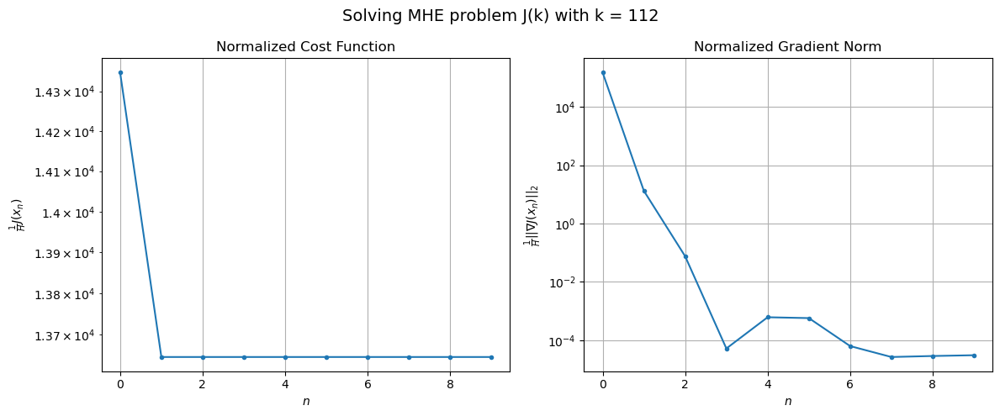

Windows:  23%|██▎       | 84/366 [47:44<2:33:25, 32.64s/it]

[Hybrid] Before applying the algorithm
Cost function: 451841.5226660713
Gradient norm: 4363395.849946666
Global estimation error: 64.56687722189007
Initial conditions estimation errors: 25.172896178488855 m, 35.9403644863304 m, 17.66869067909839 m, 43.94643297529838 m
Position estimation errors: 41.91825808553081 m, 45.44944208808973 m, 37.52062515257904 m, 48.657689580782645 m

[Hybrid] Iteration 1
Cost function: 429743.95888715814 (-4.89%)
Gradient norm: 106.88212869990033 (-100.00%)
Global estimation error: 69.18837365839117 (7.16%)
Initial conditions estimation errors: 30.954335567453118 m, 38.22155082452729 m, 25.906650427590996 m, 41.19211480739523 m
Position estimation errors: 35.66449362606453 m, 38.864373165378 m, 32.3556497321559 m, 44.58465471254525 m

[Hybrid] Iteration 2
Cost function: 429743.9584202234 (-0.00%)
Gradient norm: 0.6059369070017694 (-99.43%)
Global estimation error: 69.22192791089459 (0.05%)
Initial conditions estimation errors: 30.95433674847741 m, 38.178616

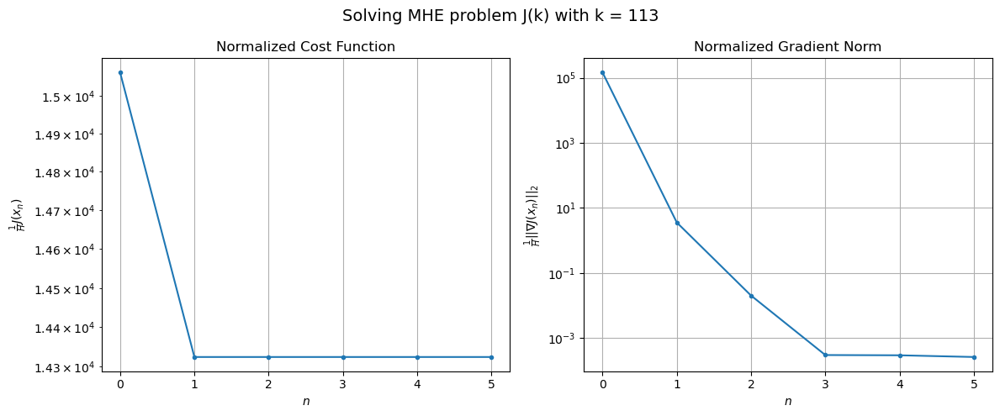

Windows:  23%|██▎       | 85/366 [48:09<2:22:34, 30.44s/it]

[Hybrid] Before applying the algorithm
Cost function: 470742.13193277596
Gradient norm: 4231403.356236579
Global estimation error: 60.18070063496295
Initial conditions estimation errors: 26.0851762627656 m, 33.661194003771605 m, 21.027651664850758 m, 36.95964580062296 m
Position estimation errors: 42.26291765775159 m, 44.76191853050199 m, 39.402432040702784 m, 50.01334670811523 m

[Hybrid] Iteration 1
Cost function: 447724.9587103938 (-4.89%)
Gradient norm: 2925.278505900482 (-99.93%)
Global estimation error: 77.0427636984858 (28.02%)
Initial conditions estimation errors: 32.038332355950544 m, 37.37760708957141 m, 37.567432102437316 m, 45.83339735768405 m
Position estimation errors: 35.91611031316831 m, 29.474191606986683 m, 39.3397959217339 m, 18.528881725620153 m

[Hybrid] Iteration 2
Cost function: 447724.92697085894 (-0.00%)
Gradient norm: 7.375595357105002 (-99.75%)
Global estimation error: 77.31001792702465 (0.35%)
Initial conditions estimation errors: 32.03833368221865 m, 37.275

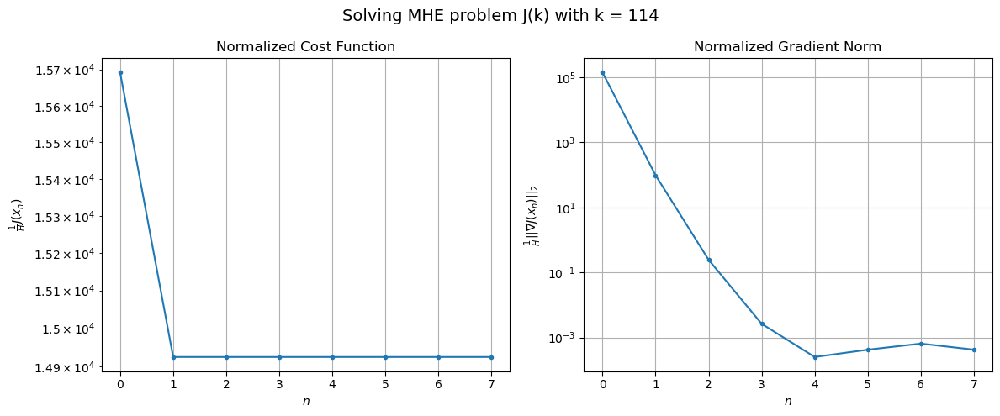

Windows:  23%|██▎       | 86/366 [48:40<2:23:25, 30.73s/it]

[Hybrid] Before applying the algorithm
Cost function: 487245.8221644929
Gradient norm: 4064919.7453416595
Global estimation error: 66.73285997012155
Initial conditions estimation errors: 27.040978371159486 m, 31.8649741791479 m, 33.24488848864232 m, 40.01783424161405 m
Position estimation errors: 42.49937878676259 m, 35.34001873461555 m, 45.92559112404224 m, 22.782947288336505 m

[Hybrid] Iteration 1
Cost function: 463215.9167938066 (-4.93%)
Gradient norm: 733.4968310300679 (-99.98%)
Global estimation error: 79.7500705505283 (19.51%)
Initial conditions estimation errors: 33.16406976151301 m, 40.00769989251816 m, 34.79635887358691 m, 49.48515561673223 m
Position estimation errors: 36.05223928888682 m, 33.0673327663705 m, 35.496467335510324 m, 26.99297286654785 m

[Hybrid] Iteration 2
Cost function: 463215.91205099964 (-0.00%)
Gradient norm: 14.402933001736086 (-98.04%)
Global estimation error: 79.4776557109918 (-0.34%)
Initial conditions estimation errors: 33.1640712021918 m, 40.2181199

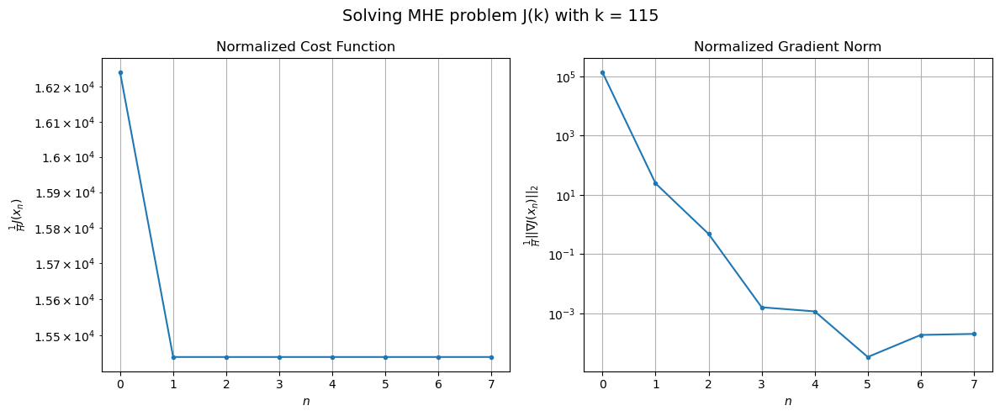

Windows:  24%|██▍       | 87/366 [49:13<2:25:47, 31.35s/it]

[Hybrid] Before applying the algorithm
Cost function: 499264.15353343956
Gradient norm: 3920361.91072794
Global estimation error: 69.1128473227409
Initial conditions estimation errors: 27.99838001301632 m, 35.0220710570982 m, 28.965560879506786 m, 43.89867335434163 m
Position estimation errors: 42.6462574717622 m, 39.80707292520137 m, 41.76650181123245 m, 34.42080114739846 m

[Hybrid] Iteration 1
Cost function: 474502.13700668834 (-4.96%)
Gradient norm: 6085.480902214248 (-99.84%)
Global estimation error: 87.18642817644455 (26.15%)
Initial conditions estimation errors: 34.251167216356755 m, 35.44958212152109 m, 48.7000981994146 m, 52.91417458277571 m
Position estimation errors: 36.149660095357234 m, 22.63234599267404 m, 44.7415822127518 m, 13.497943384627698 m

[Hybrid] Iteration 2
Cost function: 474502.0049072515 (-0.00%)
Gradient norm: 20.415547568324865 (-99.66%)
Global estimation error: 86.68769026057966 (-0.57%)
Initial conditions estimation errors: 34.25116872052608 m, 35.7167855

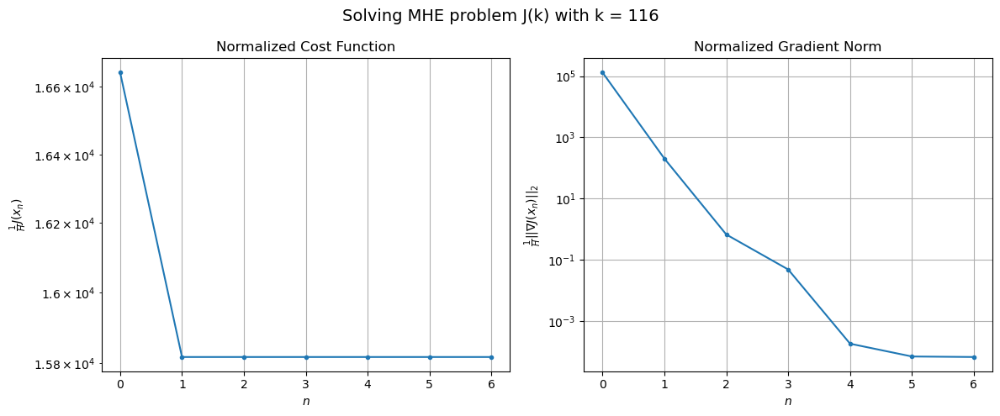

Windows:  24%|██▍       | 88/366 [49:41<2:20:15, 30.27s/it]

[Hybrid] Before applying the algorithm
Cost function: 507222.70431930374
Gradient norm: 3885106.374640633
Global estimation error: 74.34012830035643
Initial conditions estimation errors: 28.861771282581408 m, 29.48854800250646 m, 42.74627822430292 m, 44.683184727973035 m
Position estimation errors: 42.741794803336504 m, 30.103580669633892 m, 49.87714032407956 m, 5.850962923271127 m

[Hybrid] Iteration 1
Cost function: 481902.3780445846 (-4.99%)
Gradient norm: 2899.046685126043 (-99.93%)
Global estimation error: 93.55109783862122 (25.84%)
Initial conditions estimation errors: 35.20636133197581 m, 31.76886248982379 m, 57.30074956071707 m, 56.74169975194517 m
Position estimation errors: 36.215020994522504 m, 16.885711036188315 m, 48.58462787060508 m, 39.066126687478565 m

[Hybrid] Iteration 2
Cost function: 481902.3479829123 (-0.00%)
Gradient norm: 28.461076469191458 (-99.02%)
Global estimation error: 92.7394403644365 (-0.87%)
Initial conditions estimation errors: 35.20636285405132 m, 32.

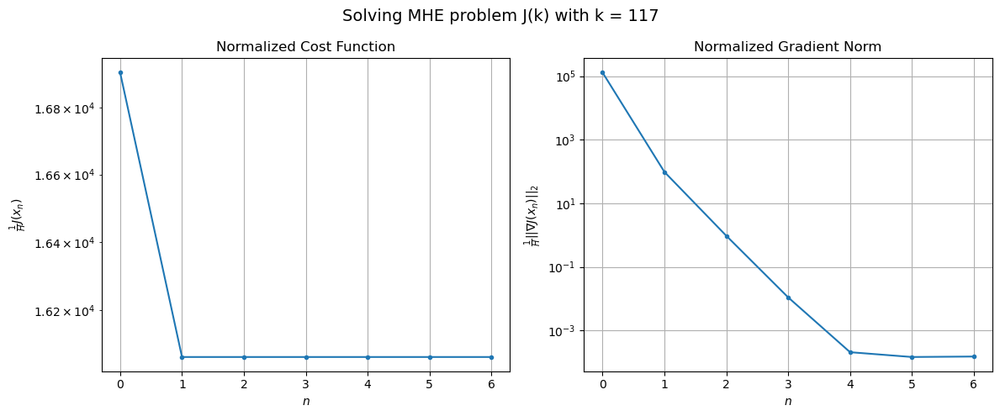

Windows:  24%|██▍       | 89/366 [50:09<2:17:20, 29.75s/it]

[Hybrid] Before applying the algorithm
Cost function: 510969.6848711068
Gradient norm: 4034581.7636926016
Global estimation error: 79.22907022471182
Initial conditions estimation errors: 29.556045983902052 m, 25.02322885394887 m, 51.23883641780951 m, 46.39012785495394 m
Position estimation errors: 42.763602282894276 m, 24.56132890331046 m, 52.986349170984816 m, 29.12267256926103 m

[Hybrid] Iteration 1
Cost function: 484967.0273945589 (-5.09%)
Gradient norm: 513.59093939212 (-99.99%)
Global estimation error: 99.72103698345234 (25.86%)
Initial conditions estimation errors: 35.99467690306637 m, 30.629918882383457 m, 60.42270609701455 m, 63.71421253139333 m
Position estimation errors: 36.183856450714394 m, 16.785790434352535 m, 45.2000897225619 m, 52.27451074055179 m

[Hybrid] Iteration 2
Cost function: 484967.0258115845 (-0.00%)
Gradient norm: 2.091853353014059 (-99.59%)
Global estimation error: 100.06660254647196 (0.35%)
Initial conditions estimation errors: 35.99467838055179 m, 30.6057

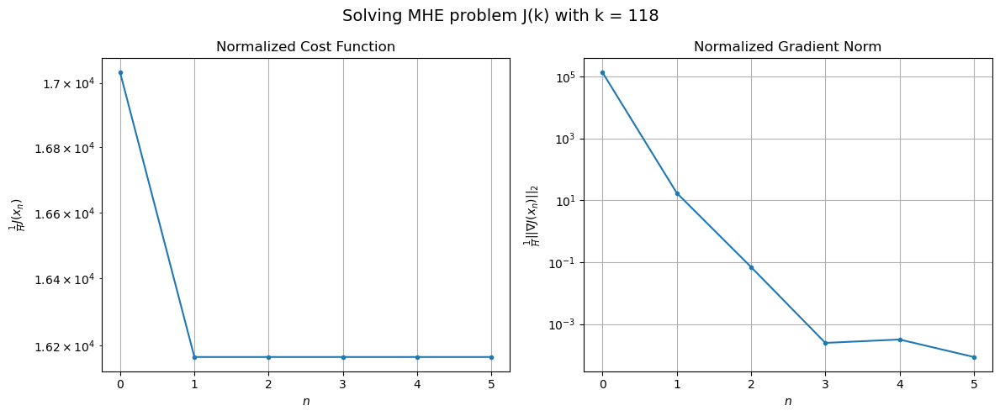

Windows:  25%|██▍       | 90/366 [50:33<2:08:59, 28.04s/it]

[Hybrid] Before applying the algorithm
Cost function: 510175.84194457
Gradient norm: 4388511.007729799
Global estimation error: 85.59901265101264
Initial conditions estimation errors: 30.079925351735266 m, 23.238507344747603 m, 55.256412982766484 m, 53.188507383506575 m
Position estimation errors: 42.62830679099874 m, 23.660381037358484 m, 49.80167266657775 m, 47.09504053877791 m

[Hybrid] Iteration 1
Cost function: 483943.8466178201 (-5.14%)
Gradient norm: 2698.206586767008 (-99.94%)
Global estimation error: 88.3916207079308 (3.26%)
Initial conditions estimation errors: 36.52484287078163 m, 33.68775967397418 m, 51.952849226002606 m, 51.42942557305431 m
Position estimation errors: 36.01983270292842 m, 23.789452010494877 m, 37.632218664555296 m, 24.380367695988138 m

[Hybrid] Iteration 2
Cost function: 483943.8212754179 (-0.00%)
Gradient norm: 3.003200909082533 (-99.89%)
Global estimation error: 88.137791307008 (-0.29%)
Initial conditions estimation errors: 36.52484421535643 m, 33.80313

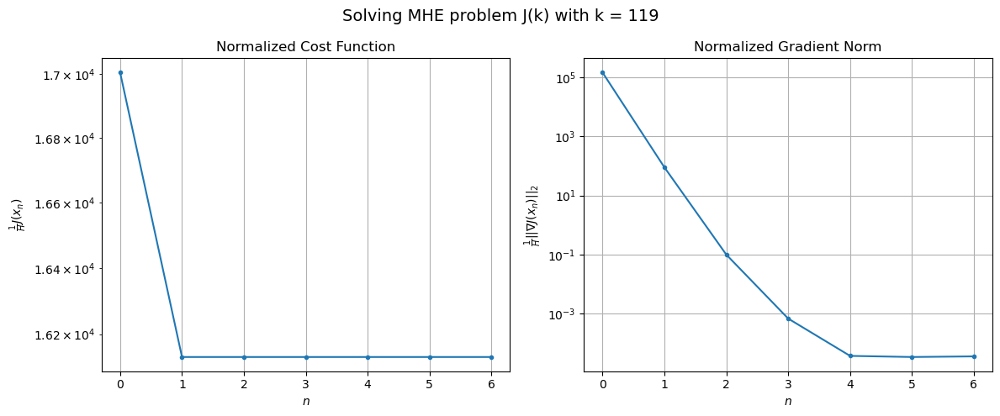

Windows:  25%|██▍       | 91/366 [51:03<2:10:03, 28.38s/it]

[Hybrid] Before applying the algorithm
Cost function: 506783.5517822012
Gradient norm: 4718909.432587103
Global estimation error: 74.12832334453282
Initial conditions estimation errors: 30.380430873306018 m, 26.883898914272333 m, 45.82046444009717 m, 41.82959910905405 m
Position estimation errors: 42.28070909200843 m, 30.80333102288902 m, 42.56318437639519 m, 18.830082994133342 m

[Hybrid] Iteration 1
Cost function: 480512.4345148343 (-5.18%)
Gradient norm: 138.25756032498575 (-100.00%)
Global estimation error: 86.50026285423287 (16.69%)
Initial conditions estimation errors: 36.804581137931265 m, 30.92612351887915 m, 54.963160772918535 m, 46.37103484657361 m
Position estimation errors: 35.66152552579186 m, 23.620698297624113 m, 36.571759298008544 m, 30.01890626686844 m

[Hybrid] Iteration 2
Cost function: 480512.4344041056 (-0.00%)
Gradient norm: 0.02560100163580662 (-99.98%)
Global estimation error: 86.4825236769695 (-0.02%)
Initial conditions estimation errors: 36.804582279342725 m, 

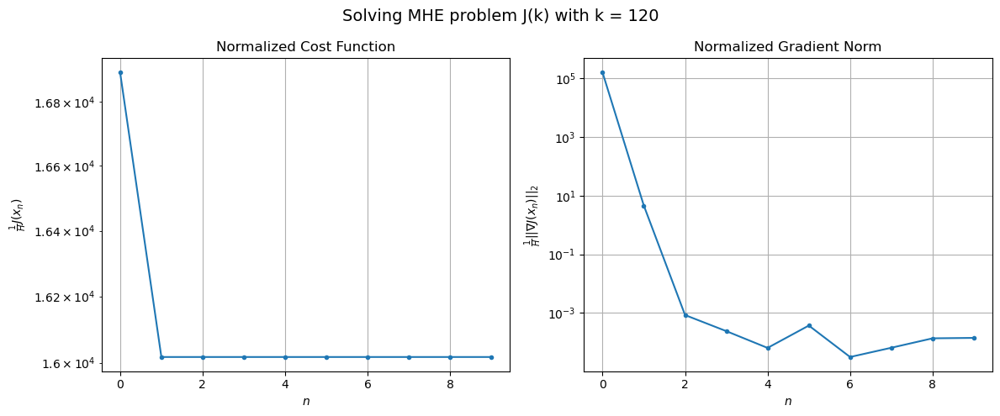

Windows:  25%|██▌       | 92/366 [51:42<2:23:58, 31.53s/it]

[Hybrid] Before applying the algorithm
Cost function: 498652.54351016483
Gradient norm: 5064467.480291527
Global estimation error: 72.237526732718
Initial conditions estimation errors: 30.482796682821302 m, 23.74157610109227 m, 48.95284630284653 m, 36.45472346380564 m
Position estimation errors: 41.63828281789768 m, 30.393568458317425 m, 40.90224358771446 m, 26.306602364111413 m

[Hybrid] Iteration 1
Cost function: 472663.5496862963 (-5.21%)
Gradient norm: 1437.2129650654642 (-99.97%)
Global estimation error: 81.75697573326921 (13.18%)
Initial conditions estimation errors: 36.84561450155985 m, 33.48701573661989 m, 47.84300497675165 m, 43.77447611940822 m
Position estimation errors: 35.03694818070324 m, 28.372252880679834 m, 33.30466006415594 m, 14.09221175292963 m

[Hybrid] Iteration 2
Cost function: 472663.54021831165 (-0.00%)
Gradient norm: 4.7722039688774 (-99.67%)
Global estimation error: 81.3375235601174 (-0.51%)
Initial conditions estimation errors: 36.84561537891414 m, 33.567319

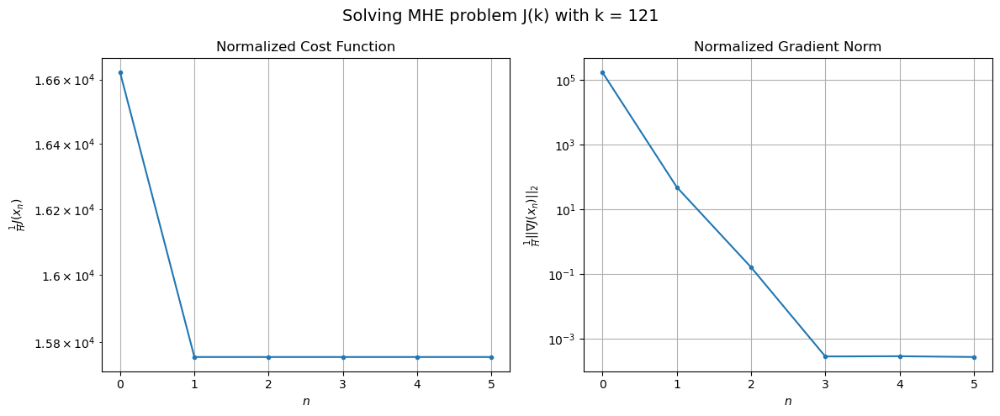

Windows:  25%|██▌       | 93/366 [52:05<2:12:21, 29.09s/it]

[Hybrid] Before applying the algorithm
Cost function: 487267.0798954026
Gradient norm: 5365719.941402665
Global estimation error: 67.26552915194624
Initial conditions estimation errors: 30.412750768876517 m, 26.67426977311545 m, 41.193011166983304 m, 34.51482600170755 m
Position estimation errors: 40.595512884106036 m, 34.680156665231614 m, 38.00538134651166 m, 15.582181279918233 m

[Hybrid] Iteration 1
Cost function: 461969.07591774274 (-5.19%)
Gradient norm: 286.23583504611304 (-99.99%)
Global estimation error: 75.17449897752587 (11.76%)
Initial conditions estimation errors: 36.657254184751565 m, 30.9611131773751 m, 45.9927598119756 m, 35.120705419636224 m
Position estimation errors: 34.046508248924276 m, 30.587698660072544 m, 32.55252155542182 m, 13.397350972783842 m

[Hybrid] Iteration 2
Cost function: 461969.07517100073 (-0.00%)
Gradient norm: 1.4092623047619102 (-99.51%)
Global estimation error: 74.94456983022324 (-0.31%)
Initial conditions estimation errors: 36.6572547346135 m, 

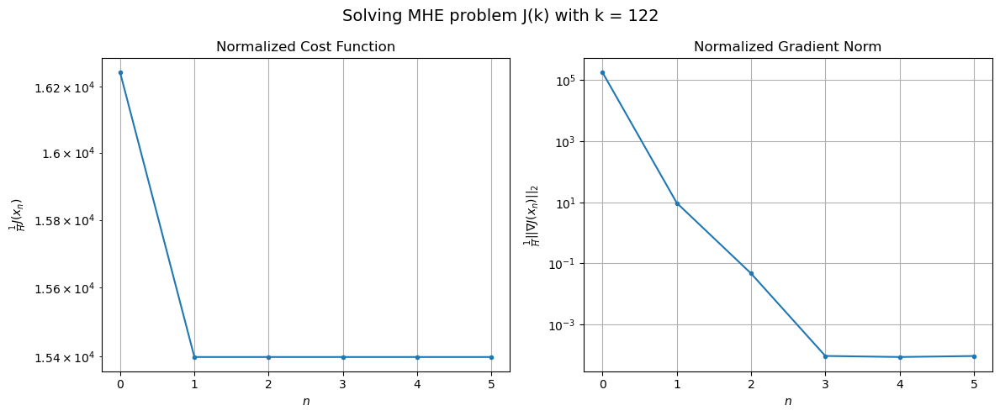

Windows:  26%|██▌       | 94/366 [52:32<2:08:36, 28.37s/it]

[Hybrid] Before applying the algorithm
Cost function: 470916.87436198676
Gradient norm: 5484248.256804841
Global estimation error: 61.3552108085379
Initial conditions estimation errors: 30.169304119068435 m, 24.133636422966166 m, 39.534833111353144 m, 26.622944827053548 m
Position estimation errors: 39.035165732077985 m, 36.20107092987162 m, 36.7216657670781 m, 19.615085848665665 m

[Hybrid] Iteration 1
Cost function: 446752.94890669704 (-5.13%)
Gradient norm: 1225.5903821605577 (-99.98%)
Global estimation error: 71.79412041959682 (17.01%)
Initial conditions estimation errors: 36.26155459150059 m, 33.36112829610897 m, 40.29478154409088 m, 33.208507174614994 m
Position estimation errors: 32.61177076072446 m, 32.300789507939015 m, 31.46280546221872 m, 27.722220247934036 m

[Hybrid] Iteration 2
Cost function: 446752.9443792559 (-0.00%)
Gradient norm: 0.23662777740406057 (-99.98%)
Global estimation error: 71.67927026311884 (-0.16%)
Initial conditions estimation errors: 36.26155479109715 m,

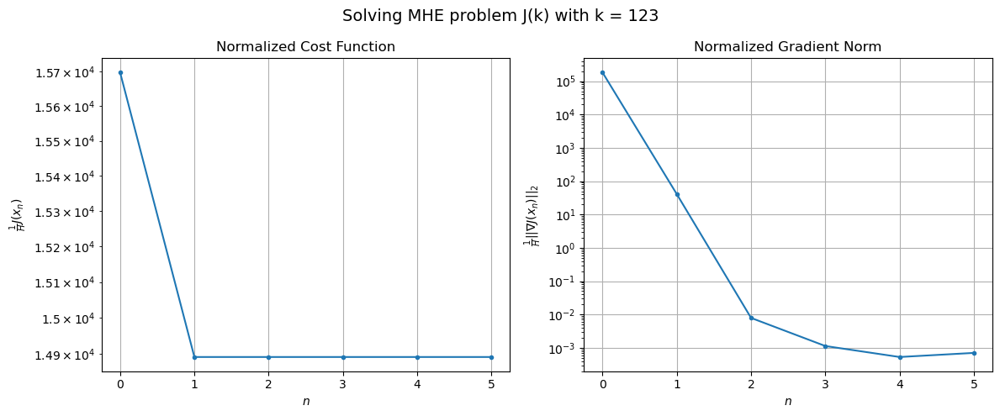

Windows:  26%|██▌       | 95/366 [52:59<2:06:11, 27.94s/it]

[Hybrid] Before applying the algorithm
Cost function: 449439.53588056576
Gradient norm: 5368877.170544546
Global estimation error: 58.50904320748416
Initial conditions estimation errors: 29.747336242780687 m, 26.68888163174762 m, 33.85022165937662 m, 26.080995258144288 m
Position estimation errors: 36.88720019142935 m, 36.81336974350966 m, 35.512476374560435 m, 33.05313801445699 m

[Hybrid] Iteration 1
Cost function: 426718.60019980697 (-5.06%)
Gradient norm: 958.1040114314595 (-99.98%)
Global estimation error: 66.86039794333402 (14.27%)
Initial conditions estimation errors: 35.662941522409646 m, 34.070371938322694 m, 35.63760113570312 m, 27.705379892697763 m
Position estimation errors: 30.644611834652732 m, 33.63204888514743 m, 30.7102730145788 m, 44.70516230983853 m

[Hybrid] Iteration 2
Cost function: 426718.5965212071 (-0.00%)
Gradient norm: 2.6269311828182493 (-99.73%)
Global estimation error: 66.60174954880411 (-0.39%)
Initial conditions estimation errors: 35.662941362687334 m, 3

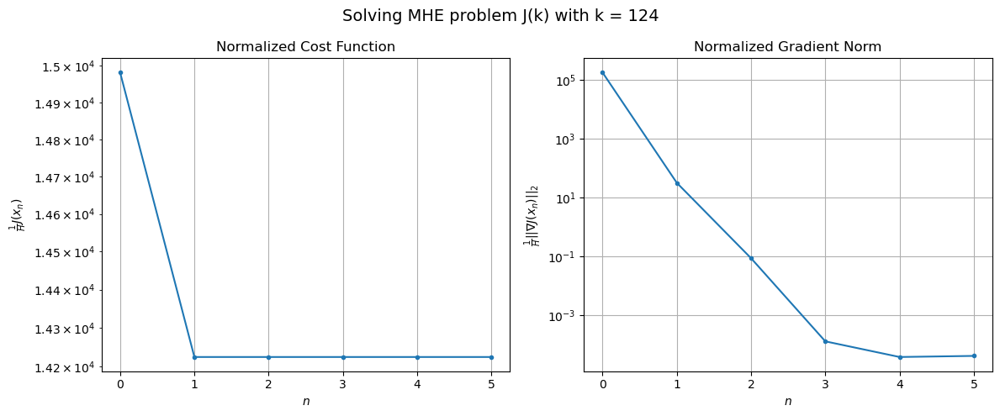

Windows:  26%|██▌       | 96/366 [53:25<2:03:25, 27.43s/it]

[Hybrid] Before applying the algorithm
Cost function: 421377.83815816056
Gradient norm: 5072743.643757592
Global estimation error: 54.125826805057486
Initial conditions estimation errors: 29.139927673940797 m, 27.726219155226854 m, 29.09532909333612 m, 21.56716352657578 m
Position estimation errors: 34.0948757691835 m, 37.22862998952591 m, 34.61709581828723 m, 49.348935807930744 m

[Hybrid] Iteration 1
Cost function: 400774.13219166745 (-4.89%)
Gradient norm: 174.8017290642437 (-100.00%)
Global estimation error: 62.52588611982097 (15.52%)
Initial conditions estimation errors: 34.80430956252785 m, 34.3557195370152 m, 34.068837199709805 m, 18.897031744401577 m
Position estimation errors: 28.158075847610053 m, 31.68870309004256 m, 29.424082378351002 m, 53.799517293916985 m

[Hybrid] Iteration 2
Cost function: 400774.1316998971 (-0.00%)
Gradient norm: 0.37116529430189515 (-99.79%)
Global estimation error: 62.43909941623383 (-0.14%)
Initial conditions estimation errors: 34.804309092744084 m

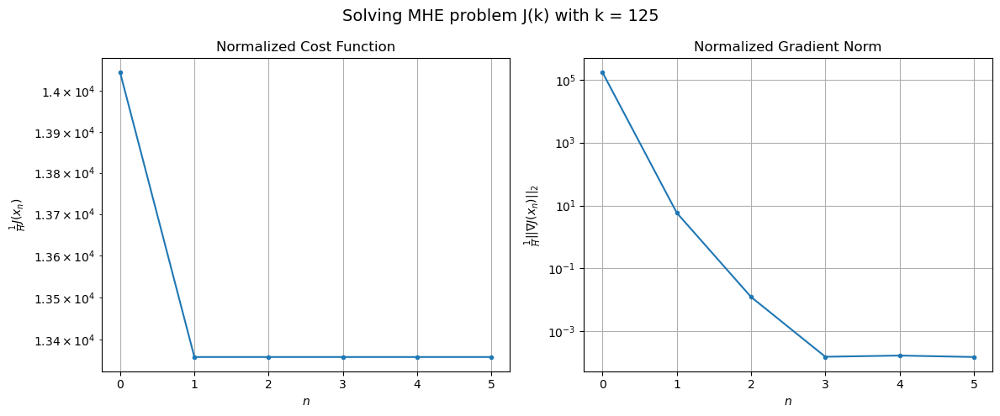

Windows:  27%|██▋       | 97/366 [53:52<2:02:14, 27.27s/it]

[Hybrid] Before applying the algorithm
Cost function: 386858.9329553225
Gradient norm: 4752458.056056784
Global estimation error: 50.41197354786139
Initial conditions estimation errors: 28.306809540853674 m, 28.124538010145304 m, 27.669342459666776 m, 13.545000416665667 m
Position estimation errors: 30.734730354770626 m, 34.2862311378074 m, 32.57696987805156 m, 57.004374653770675 m

[Hybrid] Iteration 1
Cost function: 368757.6784557229 (-4.68%)
Gradient norm: 1345.553522939945 (-99.97%)
Global estimation error: 58.94760871138974 (16.93%)
Initial conditions estimation errors: 33.66330896199571 m, 35.266159968198124 m, 27.11345492566237 m, 19.045214799531358 m
Position estimation errors: 25.19185683887695 m, 32.17339250198737 m, 31.545018280283177 m, 73.39603485217785 m

[Hybrid] Iteration 2
Cost function: 368757.671357869 (-0.00%)
Gradient norm: 2.490676209907784 (-99.81%)
Global estimation error: 58.77901100876001 (-0.29%)
Initial conditions estimation errors: 33.66330824851468 m, 35.3

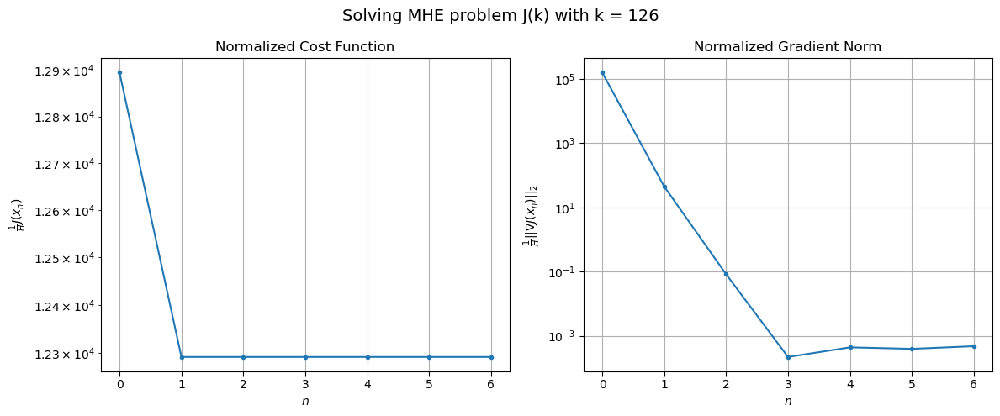

Windows:  27%|██▋       | 98/366 [54:29<2:14:48, 30.18s/it]

[Hybrid] Before applying the algorithm
Cost function: 348735.61634755303
Gradient norm: 4397199.922474469
Global estimation error: 47.791421448698124
Initial conditions estimation errors: 27.259651757619963 m, 29.44239691055175 m, 20.826728668982515 m, 15.501251733276792 m
Position estimation errors: 26.937933973373717 m, 33.77497600621528 m, 34.476825428473504 m, 75.57579101160191 m

[Hybrid] Iteration 1
Cost function: 332993.08005406224 (-4.51%)
Gradient norm: 947.6288630358989 (-99.98%)
Global estimation error: 59.286900316527216 (24.05%)
Initial conditions estimation errors: 32.30601274940261 m, 33.20203902513088 m, 28.829961139477483 m, 23.18781283953692 m
Position estimation errors: 21.803973881563586 m, 26.287687094720603 m, 26.389318937778285 m, 50.866682812251234 m

[Hybrid] Iteration 2
Cost function: 332993.07546895253 (-0.00%)
Gradient norm: 2.421973706519617 (-99.74%)
Global estimation error: 59.06941032606577 (-0.37%)
Initial conditions estimation errors: 32.30601186850464

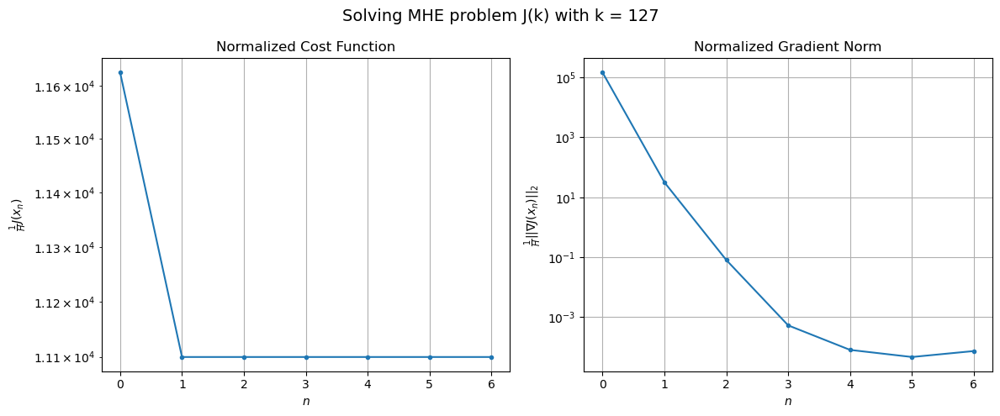

Windows:  27%|██▋       | 99/366 [54:56<2:11:00, 29.44s/it]

[Hybrid] Before applying the algorithm
Cost function: 307876.708831826
Gradient norm: 3932396.975137083
Global estimation error: 47.7771628851914
Initial conditions estimation errors: 26.068369696947602 m, 27.343085768104977 m, 22.55603166868997 m, 18.618346325230373 m
Position estimation errors: 22.85356535992933 m, 27.300381525650945 m, 28.41200282503589 m, 52.48943265020286 m

[Hybrid] Iteration 1
Cost function: 294778.93881813553 (-4.25%)
Gradient norm: 313.5618498767299 (-99.99%)
Global estimation error: 60.38716874429538 (26.39%)
Initial conditions estimation errors: 30.730601547956056 m, 32.30739088459874 m, 29.45790278873357 m, 28.118751632437117 m
Position estimation errors: 18.231665088760344 m, 19.828177562523106 m, 20.938909809856955 m, 35.505145937898355 m

[Hybrid] Iteration 2
Cost function: 294778.9384737125 (-0.00%)
Gradient norm: 0.07549737471340717 (-99.98%)
Global estimation error: 60.35799345980677 (-0.05%)
Initial conditions estimation errors: 30.7306005769698 m, 3

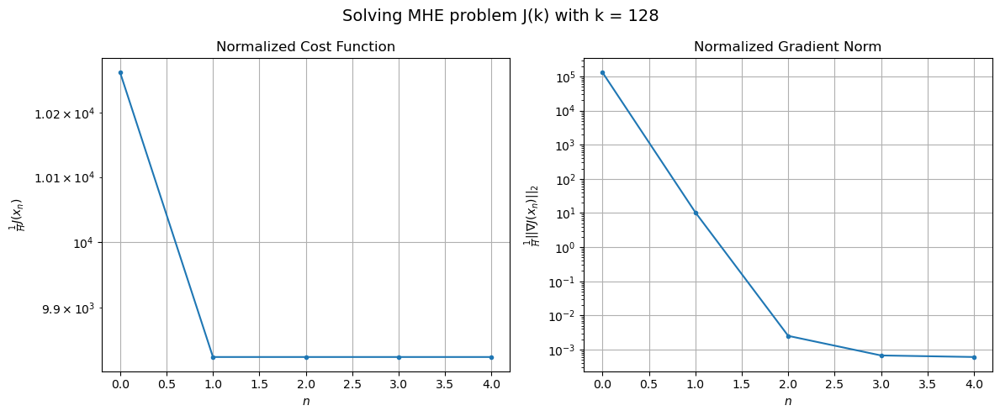

Windows:  27%|██▋       | 100/366 [55:24<2:08:30, 28.99s/it]

[Hybrid] Before applying the algorithm
Cost function: 265146.3991665137
Gradient norm: 3406402.217619191
Global estimation error: 49.01750705001242
Initial conditions estimation errors: 24.7061621557342 m, 26.409423859815313 m, 23.484066481230993 m, 23.30937918012486 m
Position estimation errors: 18.777009853455954 m, 20.26805184603691 m, 21.883387285672917 m, 35.54576414890307 m

[Hybrid] Iteration 1
Cost function: 254532.788483518 (-4.00%)
Gradient norm: 8.274915975139377 (-100.00%)
Global estimation error: 55.94060759736163 (14.12%)
Initial conditions estimation errors: 28.981588861746438 m, 30.186309087942043 m, 27.557047477425865 m, 24.875242706827013 m
Position estimation errors: 14.739907730387108 m, 16.52928706963964 m, 18.180240369124206 m, 33.37851246281756 m

[Hybrid] Iteration 2
Cost function: 254532.7884821629 (-0.00%)
Gradient norm: 0.02541699913456934 (-99.69%)
Global estimation error: 55.93439801130353 (-0.01%)
Initial conditions estimation errors: 28.98158787170229 m, 

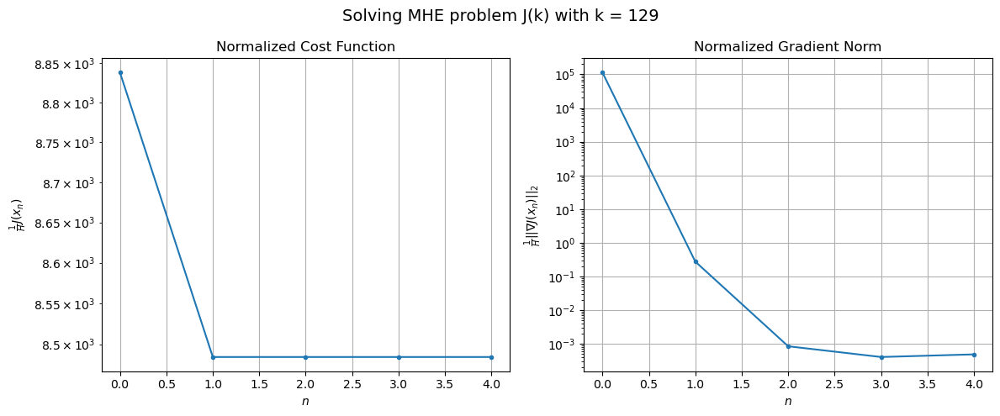

Windows:  28%|██▊       | 101/366 [55:49<2:02:30, 27.74s/it]

[Hybrid] Before applying the algorithm
Cost function: 224191.20514676793
Gradient norm: 2864624.238819391
Global estimation error: 45.044978043984266
Initial conditions estimation errors: 23.167323130557396 m, 24.480011629711484 m, 21.84257778298314 m, 20.394191368004506 m
Position estimation errors: 14.985919265296626 m, 16.699028388904487 m, 18.834935968007006 m, 32.882677289458414 m

[Hybrid] Iteration 1
Cost function: 215861.07425619807 (-3.72%)
Gradient norm: 19.401689376797897 (-100.00%)
Global estimation error: 54.419373285907994 (20.81%)
Initial conditions estimation errors: 27.020491484509055 m, 29.019783240927374 m, 24.522127024344556 m, 28.068564668721685 m
Position estimation errors: 11.574400564554336 m, 13.302489902698275 m, 16.08998280261238 m, 30.388227733283316 m

[Hybrid] Iteration 2
Cost function: 215861.07424887025 (-0.00%)
Gradient norm: 0.005499276205858133 (-99.97%)
Global estimation error: 54.41639131394764 (-0.01%)
Initial conditions estimation errors: 27.02049

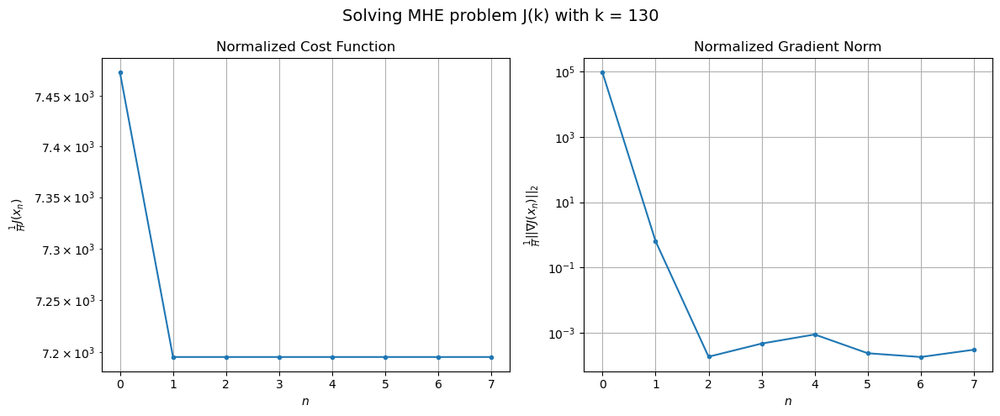

Windows:  28%|██▊       | 102/366 [56:23<2:10:20, 29.62s/it]

[Hybrid] Before applying the algorithm
Cost function: 186157.01734049257
Gradient norm: 2291563.000941958
Global estimation error: 44.011358834906495
Initial conditions estimation errors: 21.376409453055903 m, 23.47516720045832 m, 19.071585886904817 m, 23.77412180908921 m
Position estimation errors: 11.695239181165258 m, 13.314681983793504 m, 16.53660002715386 m, 29.363008448156545 m

[Hybrid] Iteration 1
Cost function: 179649.24658230934 (-3.50%)
Gradient norm: 150.70237565948875 (-99.99%)
Global estimation error: 53.42036583814044 (21.38%)
Initial conditions estimation errors: 24.845375315768248 m, 28.19790855223096 m, 21.36467861877505 m, 31.382164081999917 m
Position estimation errors: 8.966325501171672 m, 10.358918316797249 m, 14.766108617423482 m, 32.364691699581364 m

[Hybrid] Iteration 2
Cost function: 179649.24644727432 (-0.00%)
Gradient norm: 0.02305175860661314 (-99.98%)
Global estimation error: 53.40803471746541 (-0.02%)
Initial conditions estimation errors: 24.845374486863

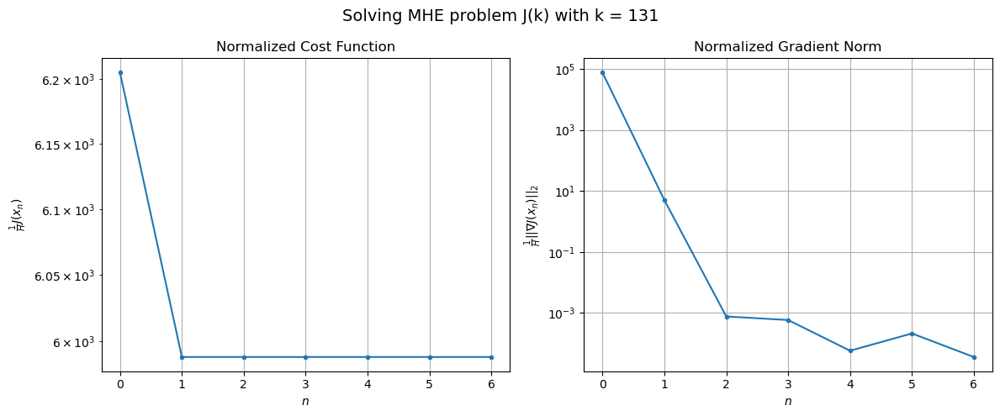

Windows:  28%|██▊       | 103/366 [56:50<2:05:52, 28.72s/it]

[Hybrid] Before applying the algorithm
Cost function: 152878.85985865444
Gradient norm: 1666039.8411667976
Global estimation error: 43.795819242799254
Initial conditions estimation errors: 19.340013629636058 m, 22.809516425022814 m, 16.261714224605004 m, 27.55525452799561 m
Position estimation errors: 9.127659493918367 m, 10.279148876737699 m, 14.996181697111258 m, 30.65480318146039 m

[Hybrid] Iteration 1
Cost function: 148119.5330959365 (-3.11%)
Gradient norm: 239.67152253717134 (-99.99%)
Global estimation error: 46.31424761185787 (5.75%)
Initial conditions estimation errors: 22.373343285391694 m, 24.23187169102809 m, 20.66983547284924 m, 25.099520258575215 m
Position estimation errors: 7.2899198034982025 m, 8.292904035354493 m, 11.874984555983472 m, 20.94062576948553 m

[Hybrid] Iteration 2
Cost function: 148119.53278378988 (-0.00%)
Gradient norm: 0.02074925892526637 (-99.99%)
Global estimation error: 46.305289570777084 (-0.02%)
Initial conditions estimation errors: 22.3733426125206

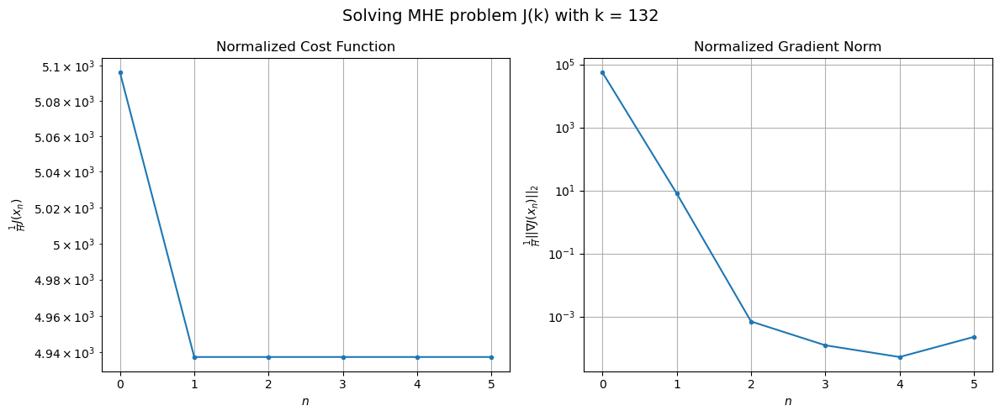

Windows:  28%|██▊       | 104/366 [57:15<2:00:56, 27.70s/it]

[Hybrid] Before applying the algorithm
Cost function: 126179.70945465566
Gradient norm: 986229.2181992709
Global estimation error: 36.43122803664906
Initial conditions estimation errors: 17.053851376371767 m, 18.972429831949253 m, 15.544513289530224 m, 20.851567546035746 m
Position estimation errors: 7.70541277078666 m, 8.509208093885945 m, 12.219692966257247 m, 19.721649953382293 m

[Hybrid] Iteration 1
Cost function: 122803.4309568081 (-2.68%)
Gradient norm: 125.75001813625184 (-99.99%)
Global estimation error: 41.10050895428735 (12.82%)
Initial conditions estimation errors: 19.656485217306674 m, 20.712902558093468 m, 18.75706860480465 m, 22.847146785847958 m
Position estimation errors: 6.783172073804148 m, 7.317133598106539 m, 9.358864523854699 m, 12.127492409409749 m

[Hybrid] Iteration 2
Cost function: 122803.43088081382 (-0.00%)
Gradient norm: 0.02585748271648067 (-99.98%)
Global estimation error: 41.084175609740704 (-0.04%)
Initial conditions estimation errors: 19.65648471904648

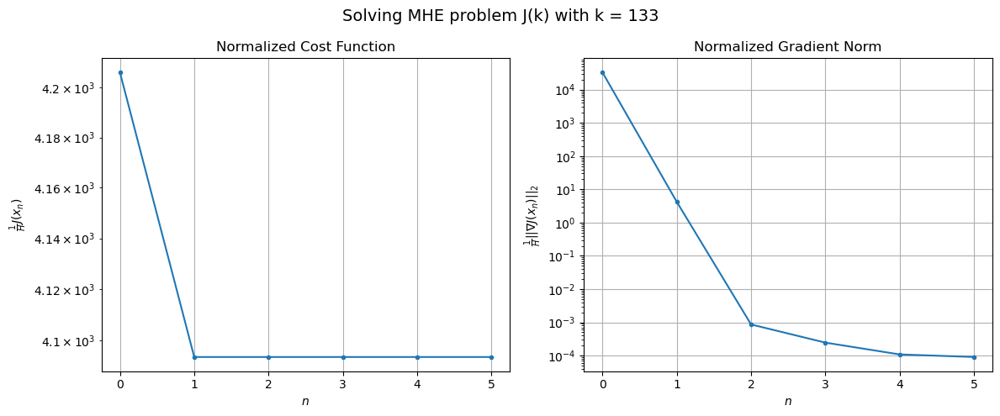

Windows:  29%|██▊       | 105/366 [57:40<1:57:29, 27.01s/it]

[Hybrid] Before applying the algorithm
Cost function: 106839.29828408793
Gradient norm: 932698.4654161568
Global estimation error: 31.519569545499305
Initial conditions estimation errors: 14.668918930415389 m, 15.714639771949061 m, 13.924659502916041 m, 18.36939904854326 m
Position estimation errors: 7.659145026173743 m, 8.038285219805282 m, 9.809826049106439 m, 11.460581196059138 m

[Hybrid] Iteration 1
Cost function: 104492.54109534681 (-2.20%)
Gradient norm: 9.288037582256107 (-100.00%)
Global estimation error: 34.738055334221684 (10.21%)
Initial conditions estimation errors: 16.851879530131814 m, 17.654638335949603 m, 15.86418776057383 m, 18.95684619926743 m
Position estimation errors: 7.33259224947476 m, 7.927900886892109 m, 9.279758344983808 m, 12.879826824555321 m

[Hybrid] Iteration 2
Cost function: 104492.54106194577 (-0.00%)
Gradient norm: 0.010202503375243326 (-99.89%)
Global estimation error: 34.70607676172162 (-0.09%)
Initial conditions estimation errors: 16.85187920308152

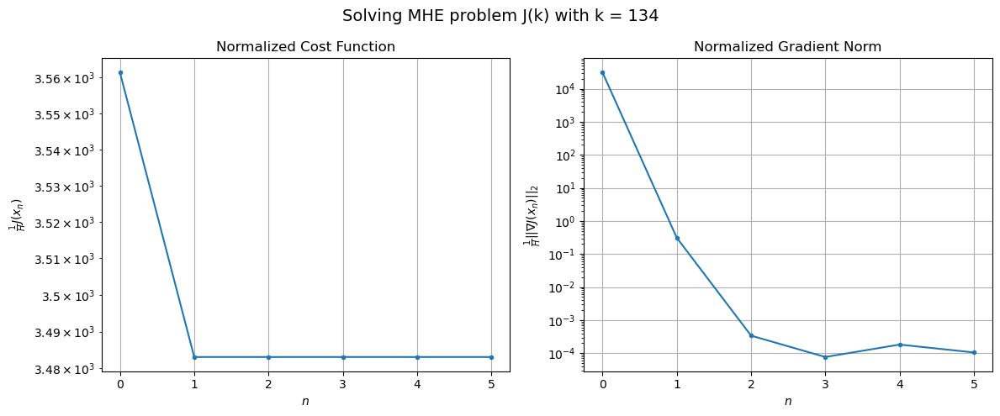

Windows:  29%|██▉       | 106/366 [58:08<1:58:23, 27.32s/it]

[Hybrid] Before applying the algorithm
Cost function: 93709.53423148829
Gradient norm: 1463651.5089009514
Global estimation error: 26.270456579395077
Initial conditions estimation errors: 12.397334314282386 m, 13.151010292677226 m, 11.694835103185879 m, 15.0567125195352 m
Position estimation errors: 8.771288546369187 m, 8.963580910984854 m, 9.836970657565717 m, 12.13854458740861 m

[Hybrid] Iteration 1
Cost function: 92073.31583796305 (-1.75%)
Gradient norm: 66.39147510237619 (-100.00%)
Global estimation error: 30.111013551323516 (14.62%)
Initial conditions estimation errors: 14.206328313198672 m, 15.453328653185368 m, 13.214654251338855 m, 17.070475388646116 m
Position estimation errors: 8.62344246437278 m, 8.74411860403818 m, 9.366959662076697 m, 15.588714305705249 m

[Hybrid] Iteration 2
Cost function: 92073.31581802218 (-0.00%)
Gradient norm: 0.013285995421450921 (-99.98%)
Global estimation error: 30.11521365242464 (0.01%)
Initial conditions estimation errors: 14.20632813180063 m, 

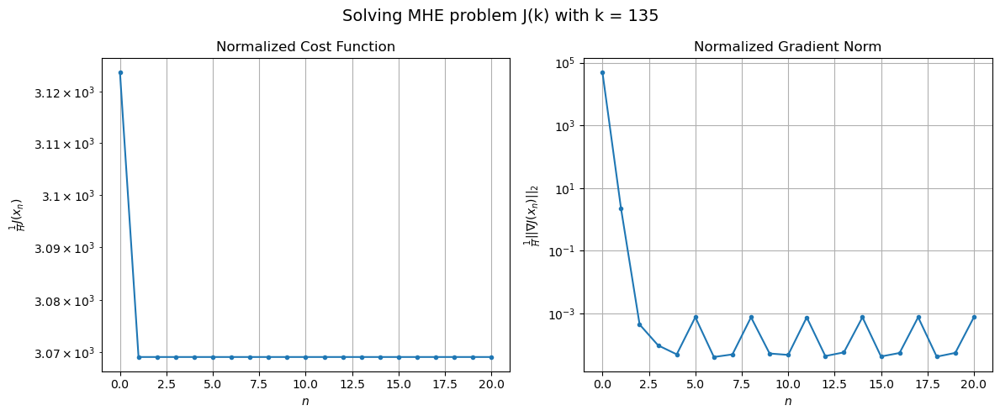

Windows:  29%|██▉       | 107/366 [59:25<3:01:28, 42.04s/it]

[Hybrid] Before applying the algorithm
Cost function: 87776.58465299306
Gradient norm: 2343507.461707532
Global estimation error: 23.186162707487394
Initial conditions estimation errors: 10.444055633881707 m, 11.562222277434053 m, 9.942373213261712 m, 13.99889928017019 m
Position estimation errors: 10.607822817578375 m, 10.293548360396223 m, 10.235762070068768 m, 14.74874855592784 m

[Hybrid] Iteration 1
Cost function: 86569.13764943453 (-1.38%)
Gradient norm: 346.80376082839916 (-99.99%)
Global estimation error: 22.617983078282275 (-2.45%)
Initial conditions estimation errors: 11.832675559892621 m, 11.04459420446709 m, 12.084064651612833 m, 10.175298715876954 m
Position estimation errors: 10.189980739753357 m, 9.653393123497928 m, 10.603569925877427 m, 7.7940077861813775 m

[Hybrid] Iteration 2
Cost function: 86569.13710034138 (-0.00%)
Gradient norm: 0.012573816522037451 (-100.00%)
Global estimation error: 22.608925916707044 (-0.04%)
Initial conditions estimation errors: 11.8326754833

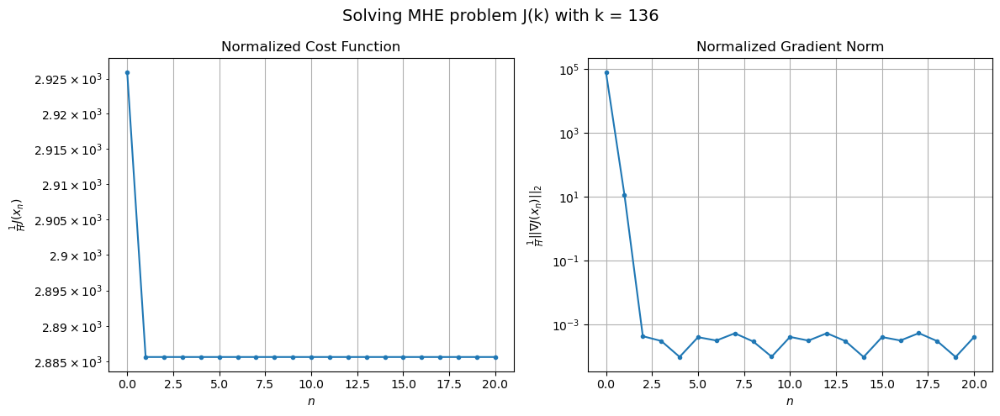

Windows:  30%|██▉       | 108/366 [1:00:44<3:48:01, 53.03s/it]

[Hybrid] Before applying the algorithm
Cost function: 87332.47874042805
Gradient norm: 3046459.266013104
Global estimation error: 16.927363678570018
Initial conditions estimation errors: 8.827817604536815 m, 7.992133703365807 m, 8.889923961268343 m, 8.10478370579295 m
Position estimation errors: 12.66571705429397 m, 11.797743582457771 m, 12.413204727834932 m, 9.556262031821218 m

[Hybrid] Iteration 1
Cost function: 86236.36988266195 (-1.26%)
Gradient norm: 724.9338979665605 (-99.98%)
Global estimation error: 18.831732793795087 (11.25%)
Initial conditions estimation errors: 9.915887612429783 m, 7.649821152857083 m, 10.587909550663207 m, 9.255828023144376 m
Position estimation errors: 11.902456173087863 m, 11.300418360943752 m, 14.590734294895253 m, 18.100443987083278 m

[Hybrid] Iteration 2
Cost function: 86236.36768274549 (-0.00%)
Gradient norm: 0.16473993850603375 (-99.98%)
Global estimation error: 18.771794444669567 (-0.32%)
Initial conditions estimation errors: 9.915887576605806 m, 

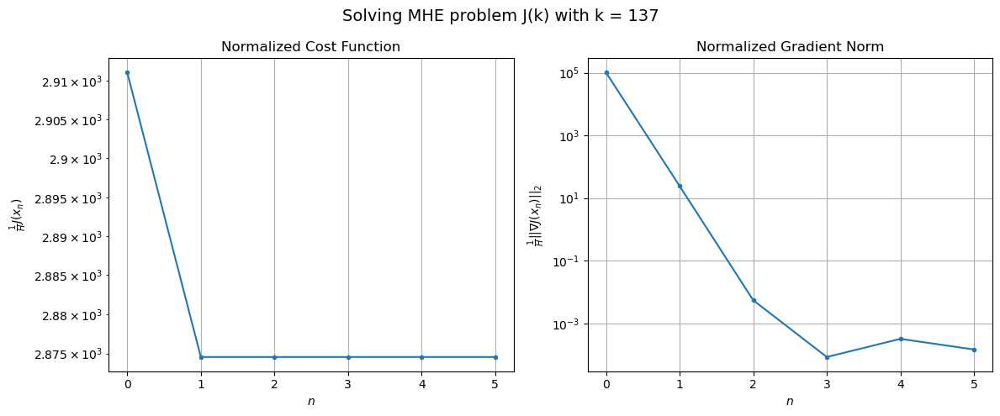

Windows:  30%|██▉       | 109/366 [1:01:09<3:11:12, 44.64s/it]

[Hybrid] Before applying the algorithm
Cost function: 92418.81447876706
Gradient norm: 3918254.858979735
Global estimation error: 16.752280704661068
Initial conditions estimation errors: 7.656582214533711 m, 6.115610915620166 m, 7.383608333615557 m, 11.405474660341063 m
Position estimation errors: 14.80845355142356 m, 13.997195932801219 m, 17.073250109947683 m, 19.846357572644806 m

[Hybrid] Iteration 1
Cost function: 91118.53157690461 (-1.41%)
Gradient norm: 30.392273628243146 (-100.00%)
Global estimation error: 16.98056370129421 (1.36%)
Initial conditions estimation errors: 8.497133560684423 m, 7.270381444480068 m, 8.274990018369909 m, 9.736131052223318 m
Position estimation errors: 13.560772379285158 m, 12.655335338966212 m, 15.157774115942509 m, 17.55296536770364 m

[Hybrid] Iteration 2
Cost function: 91118.53155295114 (-0.00%)
Gradient norm: 0.010499440340878236 (-99.97%)
Global estimation error: 16.96064614791797 (-0.12%)
Initial conditions estimation errors: 8.497133490342076 m,

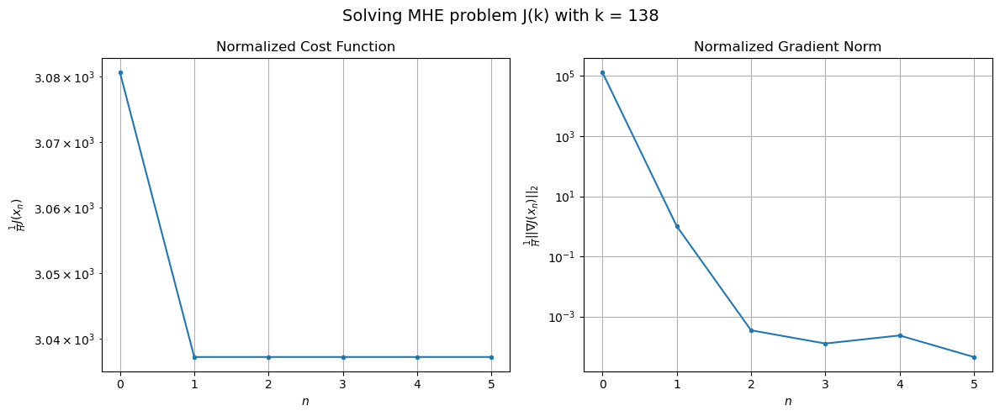

Windows:  30%|███       | 110/366 [1:01:33<2:44:17, 38.50s/it]

[Hybrid] Before applying the algorithm
Cost function: 101839.01618674099
Gradient norm: 4570189.977656634
Global estimation error: 15.629252942898598
Initial conditions estimation errors: 6.993843165848564 m, 6.520768153607346 m, 6.08346272834091 m, 10.762000885131814 m
Position estimation errors: 16.81577864851229 m, 15.731484437250602 m, 18.24468847748742 m, 19.96026600988134 m

[Hybrid] Iteration 1
Cost function: 100125.19786783523 (-1.68%)
Gradient norm: 60.265060030146984 (-100.00%)
Global estimation error: 14.733997850999573 (-5.73%)
Initial conditions estimation errors: 7.7602108020083564 m, 7.21419515132685 m, 7.043657746470352 m, 7.429782814503132 m
Position estimation errors: 15.10598704712118 m, 14.86435104800016 m, 18.475637983040077 m, 25.63045640741023 m

[Hybrid] Iteration 2
Cost function: 100125.19764750173 (-0.00%)
Gradient norm: 0.11187576768714069 (-99.81%)
Global estimation error: 14.722648066732374 (-0.08%)
Initial conditions estimation errors: 7.760210643309212 m,

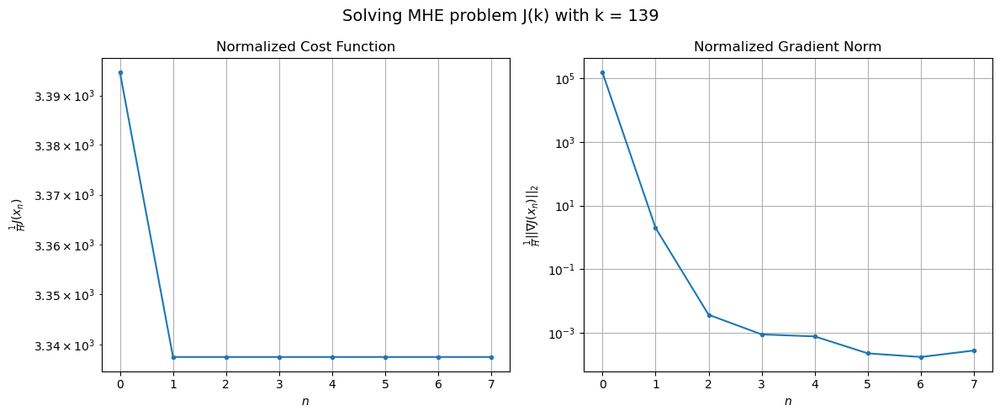

Windows:  30%|███       | 111/366 [1:02:06<2:36:46, 36.89s/it]

[Hybrid] Before applying the algorithm
Cost function: 114700.83582344983
Gradient norm: 5098016.882356572
Global estimation error: 13.647312043236179
Initial conditions estimation errors: 7.024413172485194 m, 7.1377802812672435 m, 5.673532883112838 m, 7.332198318305852 m
Position estimation errors: 18.62891731380293 m, 18.385526150982223 m, 22.12223495475984 m, 28.340602679331525 m

[Hybrid] Iteration 1
Cost function: 112457.10436596579 (-1.96%)
Gradient norm: 73.80185447673273 (-100.00%)
Global estimation error: 21.13828815478898 (54.89%)
Initial conditions estimation errors: 7.866701770106177 m, 8.57634127856727 m, 7.591359674125908 m, 15.929588395024792 m
Position estimation errors: 16.493115368011583 m, 15.812579301067858 m, 18.03753144629299 m, 19.709582969792987 m

[Hybrid] Iteration 2
Cost function: 112457.1039519446 (-0.00%)
Gradient norm: 0.28435294153068286 (-99.61%)
Global estimation error: 21.178137827577174 (0.19%)
Initial conditions estimation errors: 7.866701568533311 m,

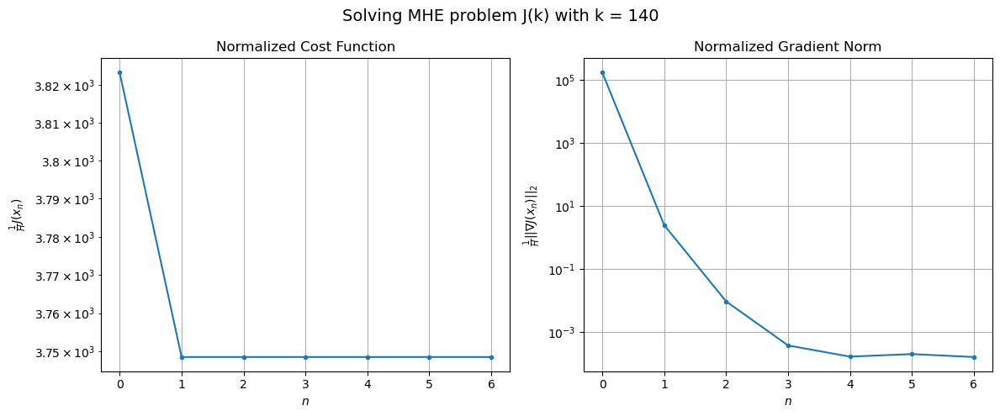

Windows:  31%|███       | 112/366 [1:02:35<2:25:37, 34.40s/it]

[Hybrid] Before applying the algorithm
Cost function: 129836.76957431539
Gradient norm: 5551711.380800595
Global estimation error: 22.131491604076455
Initial conditions estimation errors: 7.756268395379045 m, 8.885337718018286 m, 7.402795917022895 m, 17.20133381429848 m
Position estimation errors: 20.199711890521915 m, 19.46923076932236 m, 21.612126331103116 m, 22.673571693506332 m

[Hybrid] Iteration 1
Cost function: 126950.77714355967 (-2.22%)
Gradient norm: 17.249220483918883 (-100.00%)
Global estimation error: 29.81229539414479 (34.71%)
Initial conditions estimation errors: 8.812224528693081 m, 11.15428972522495 m, 9.424895663943218 m, 24.451255962923916 m
Position estimation errors: 17.671979951572332 m, 16.082076652003714 m, 18.94341273632642 m, 18.401187421347757 m

[Hybrid] Iteration 2
Cost function: 126950.77702299651 (-0.00%)
Gradient norm: 0.12971304548259677 (-99.25%)
Global estimation error: 30.044339180846908 (0.78%)
Initial conditions estimation errors: 8.812224376394818

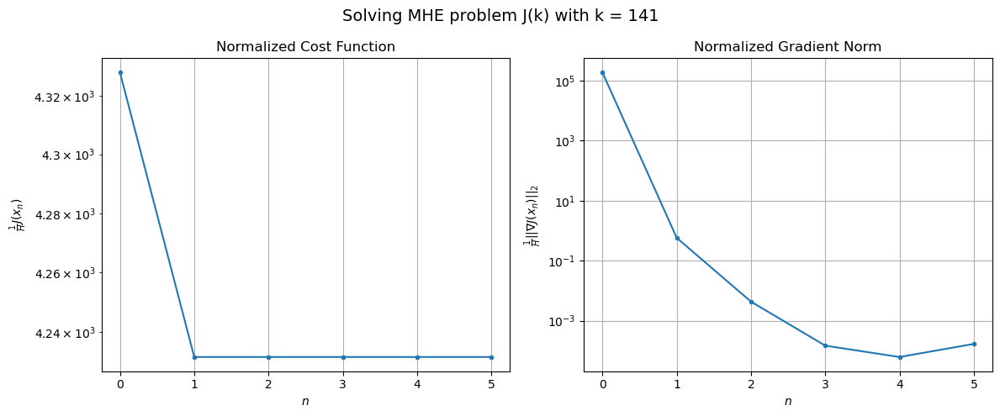

Windows:  31%|███       | 113/366 [1:02:59<2:12:22, 31.39s/it]

[Hybrid] Before applying the algorithm
Cost function: 146058.98532322329
Gradient norm: 5793933.699759427
Global estimation error: 30.950442855409634
Initial conditions estimation errors: 8.997369043205982 m, 11.47379011719803 m, 9.562005798572407 m, 25.571302820511626 m
Position estimation errors: 21.480304406856476 m, 19.672738152456308 m, 22.63959615940095 m, 21.477545037688575 m

[Hybrid] Iteration 1
Cost function: 142404.37973796102 (-2.50%)
Gradient norm: 166.68051768023685 (-100.00%)
Global estimation error: 38.95913968409884 (25.88%)
Initial conditions estimation errors: 10.406434897339617 m, 14.466876148059752 m, 11.155756253964205 m, 32.79898567349622 m
Position estimation errors: 18.593088736991852 m, 16.72100619024679 m, 21.483598697709976 m, 24.08162753142949 m

[Hybrid] Iteration 2
Cost function: 142404.37957145573 (-0.00%)
Gradient norm: 0.05801110497136135 (-99.97%)
Global estimation error: 38.84058710021621 (-0.30%)
Initial conditions estimation errors: 10.406434893172

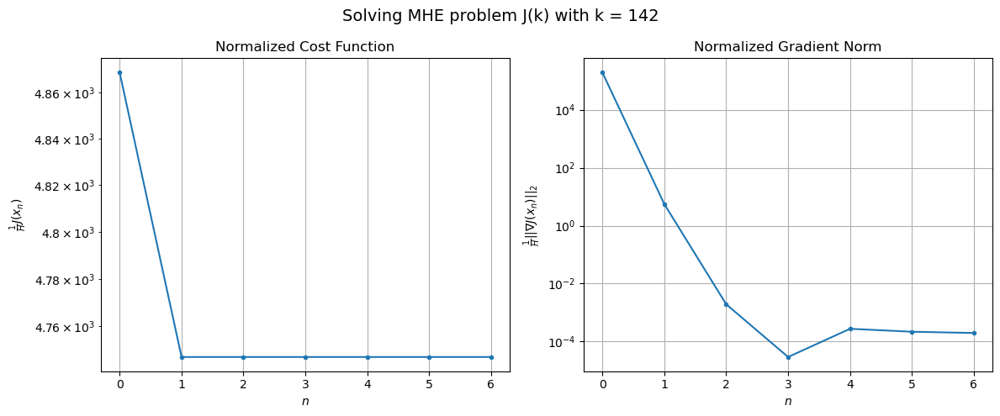

Windows:  31%|███       | 114/366 [1:03:29<2:09:47, 30.90s/it]

[Hybrid] Before applying the algorithm
Cost function: 162072.28128344295
Gradient norm: 5968824.795284434
Global estimation error: 40.037061382626426
Initial conditions estimation errors: 10.540248536325766 m, 14.587984924590527 m, 11.556540006475474 m, 33.84525640759837 m
Position estimation errors: 22.443604546471043 m, 20.340830639006384 m, 25.070734835085155 m, 26.46826993511553 m

[Hybrid] Iteration 1
Cost function: 157602.13391198855 (-2.76%)
Gradient norm: 76.81977816029139 (-100.00%)
Global estimation error: 43.76923483880041 (9.32%)
Initial conditions estimation errors: 12.317980350413615 m, 16.167533459076743 m, 13.699824525827687 m, 36.262019835837656 m
Position estimation errors: 19.24686146367484 m, 16.621146655680075 m, 20.5203455099058 m, 17.792974251704962 m

[Hybrid] Iteration 2
Cost function: 157602.13387288025 (-0.00%)
Gradient norm: 0.007680794345962051 (-99.99%)
Global estimation error: 43.83638358469152 (0.15%)
Initial conditions estimation errors: 12.317980529108

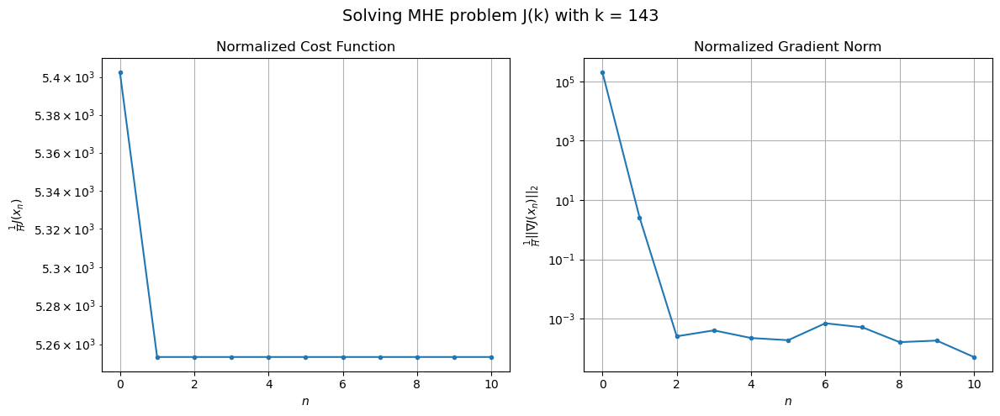

Windows:  31%|███▏      | 115/366 [1:04:09<2:20:59, 33.70s/it]

[Hybrid] Before applying the algorithm
Cost function: 176486.18416261426
Gradient norm: 5988568.1579974415
Global estimation error: 43.56480192923633
Initial conditions estimation errors: 12.112049191707385 m, 15.822218197182716 m, 13.686540352057072 m, 36.24253465098681 m
Position estimation errors: 23.097499991101067 m, 20.155282173147146 m, 24.087004085311534 m, 20.562756342997602 m

[Hybrid] Iteration 1
Cost function: 171181.20251342808 (-3.01%)
Gradient norm: 1363.1469219093428 (-99.98%)
Global estimation error: 63.99172095165843 (46.89%)
Initial conditions estimation errors: 14.301820330258806 m, 21.050010826403025 m, 16.699785748524825 m, 56.28860838366198 m
Position estimation errors: 19.65964936883912 m, 17.117902649851093 m, 27.5100396328184 m, 34.397544718416434 m

[Hybrid] Iteration 2
Cost function: 171181.19224772297 (-0.00%)
Gradient norm: 1.733109619713281 (-99.87%)
Global estimation error: 64.81497590412877 (1.29%)
Initial conditions estimation errors: 14.30182068995051

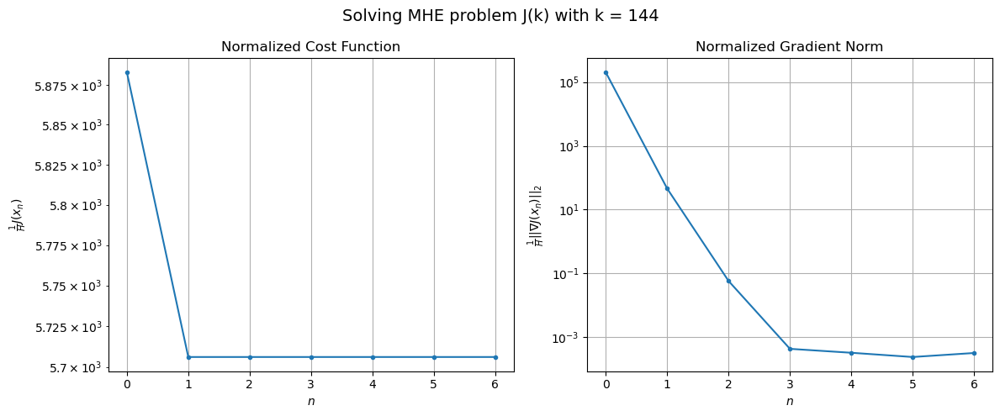

Windows:  32%|███▏      | 116/366 [1:04:37<2:13:56, 32.15s/it]

[Hybrid] Before applying the algorithm
Cost function: 188593.59360416754
Gradient norm: 5940793.417984171
Global estimation error: 65.53319392593704
Initial conditions estimation errors: 13.564496166046013 m, 20.363240010525978 m, 17.15113381169722 m, 58.32474386078916 m
Position estimation errors: 23.498909807319222 m, 20.553974139885128 m, 31.034850562588556 m, 35.86033864872754 m

[Hybrid] Iteration 1
Cost function: 182479.15990123383 (-3.24%)
Gradient norm: 2662.0401095855127 (-99.96%)
Global estimation error: 38.47339976468209 (-41.29%)
Initial conditions estimation errors: 16.16059433377813 m, 18.15492494400833 m, 16.528363384195373 m, 24.824259974329873 m
Position estimation errors: 19.87216109416739 m, 17.26215123251993 m, 20.484443694509018 m, 14.012049173097795 m

[Hybrid] Iteration 2
Cost function: 182479.08093237487 (-0.00%)
Gradient norm: 83.36170397828741 (-96.87%)
Global estimation error: 43.23624141389729 (12.38%)
Initial conditions estimation errors: 16.160594784276995

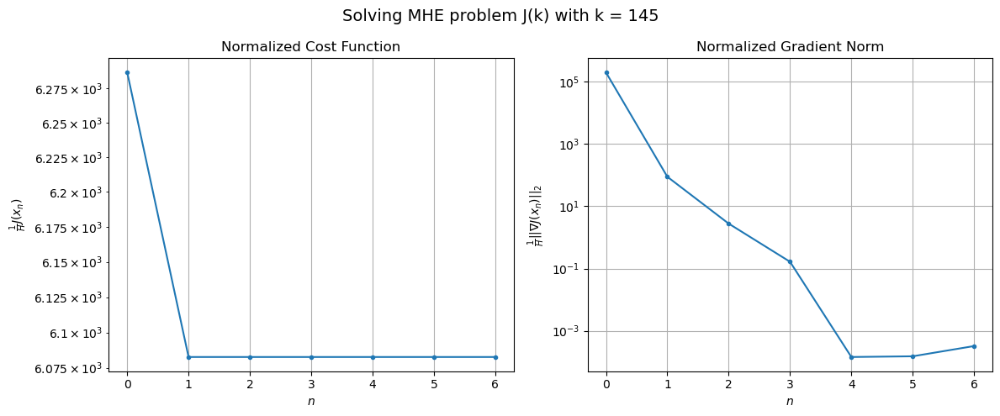

Windows:  32%|███▏      | 117/366 [1:05:05<2:08:05, 30.87s/it]

[Hybrid] Before applying the algorithm
Cost function: 197052.5166920712
Gradient norm: 5764256.263385531
Global estimation error: 41.85343931197487
Initial conditions estimation errors: 14.801981014609577 m, 17.671955713018978 m, 15.90866155650143 m, 31.100180631814904 m
Position estimation errors: 23.706861911563355 m, 20.869851219802428 m, 25.84190814520458 m, 20.286336101881528 m

[Hybrid] Iteration 1
Cost function: 190235.02894157678 (-3.46%)
Gradient norm: 95.09944855055728 (-100.00%)
Global estimation error: 49.64114138869678 (18.61%)
Initial conditions estimation errors: 17.771749871496638 m, 21.452831809001726 m, 19.56909172494392 m, 36.12793611472385 m
Position estimation errors: 19.95897458631737 m, 16.898110132587597 m, 22.487540928364457 m, 21.253638111591247 m

[Hybrid] Iteration 2
Cost function: 190235.02888828027 (-0.00%)
Gradient norm: 0.19711299666785578 (-99.79%)
Global estimation error: 49.41677235432317 (-0.45%)
Initial conditions estimation errors: 17.7717504940666

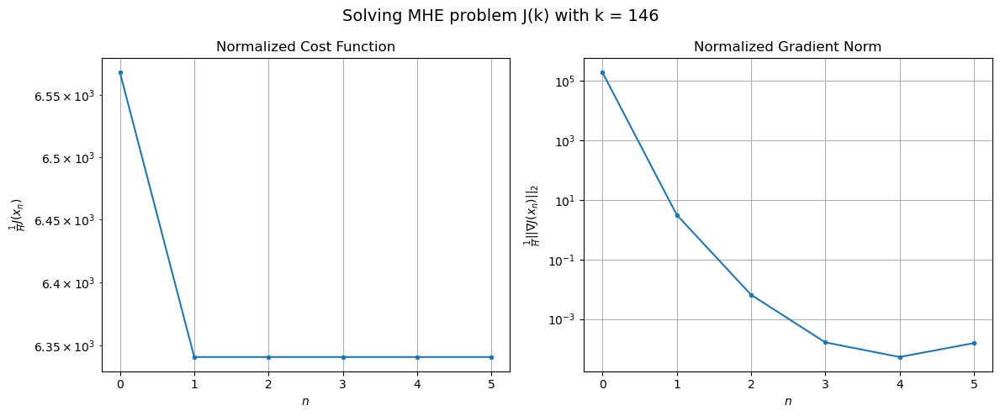

Windows:  32%|███▏      | 118/366 [1:05:33<2:03:12, 29.81s/it]

[Hybrid] Before applying the algorithm
Cost function: 202186.4922742
Gradient norm: 5693309.711458623
Global estimation error: 45.98721402665043
Initial conditions estimation errors: 15.764388061475112 m, 19.254086139997966 m, 18.00053165099981 m, 34.22805602960413 m
Position estimation errors: 23.79715866838212 m, 20.52301779212775 m, 26.03400942294583 m, 23.773561124403223 m

[Hybrid] Iteration 1
Cost function: 194502.1132278531 (-3.80%)
Gradient norm: 2644.7228878247874 (-99.95%)
Global estimation error: 89.57030780590289 (94.77%)
Initial conditions estimation errors: 19.12622743414339 m, 27.130804751050242 m, 27.9232143702744 m, 78.3660147236941 m
Position estimation errors: 19.90489000323474 m, 15.945285657620143 m, 27.99482398369697 m, 38.778112053452986 m

[Hybrid] Iteration 2
Cost function: 194502.03902648462 (-0.00%)
Gradient norm: 38.470639953115246 (-98.55%)
Global estimation error: 93.81102984198371 (4.73%)
Initial conditions estimation errors: 19.12622807976731 m, 27.65553

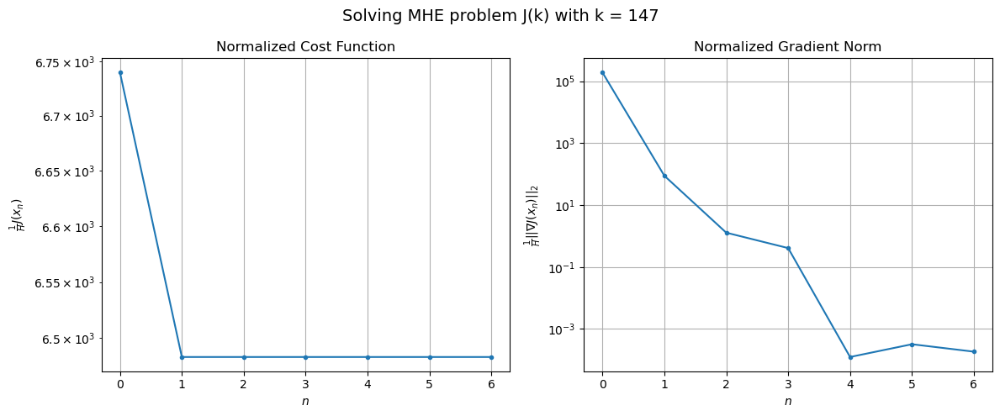

Windows:  33%|███▎      | 119/366 [1:06:00<1:59:59, 29.15s/it]

[Hybrid] Before applying the algorithm
Cost function: 204210.5250770653
Gradient norm: 5707679.844854786
Global estimation error: 94.89560224954963
Initial conditions estimation errors: 16.47949396570903 m, 25.221653142593734 m, 28.16975177312975 m, 85.4629966633574 m
Position estimation errors: 23.744331813307376 m, 19.273708725321512 m, 32.12348591187034 m, 42.109184687173034 m

[Hybrid] Iteration 1
Cost function: 195761.35122223492 (-4.14%)
Gradient norm: 796.6600813933131 (-99.99%)
Global estimation error: 114.52734077986241 (20.69%)
Initial conditions estimation errors: 20.173783016582426 m, 30.677237021158568 m, 34.5165357785631 m, 102.84470272848056 m
Position estimation errors: 19.736940593285198 m, 15.640720574612963 m, 33.215557742103435 m, 54.22560900984835 m

[Hybrid] Iteration 2
Cost function: 195761.34772891973 (-0.00%)
Gradient norm: 3.1038816961746694 (-99.61%)
Global estimation error: 113.08763592228985 (-1.26%)
Initial conditions estimation errors: 20.173783672755235 

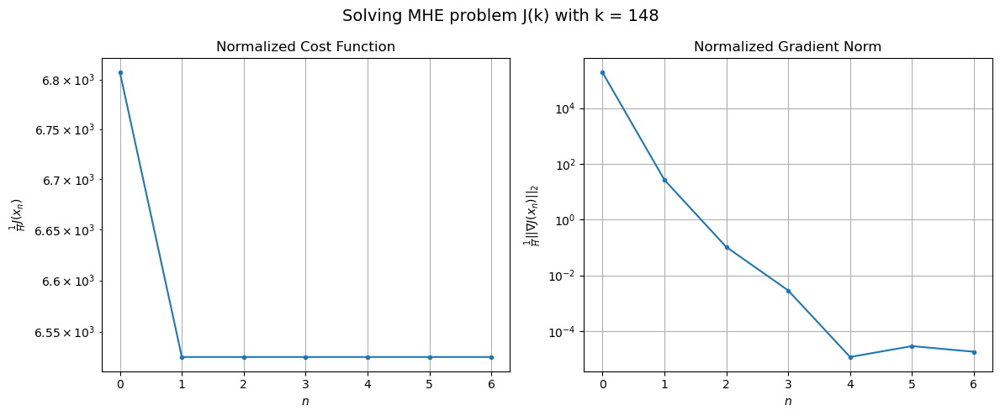

Windows:  33%|███▎      | 120/366 [1:06:30<2:00:09, 29.31s/it]

[Hybrid] Before applying the algorithm
Cost function: 202210.3404234646
Gradient norm: 5510592.283146979
Global estimation error: 111.56836575237342
Initial conditions estimation errors: 16.91531592333384 m, 27.1487834635548 m, 33.0282455117237 m, 101.6535078162794 m
Position estimation errors: 23.56876749595102 m, 18.971609500832074 m, 35.076751989490624 m, 51.46968544679675 m

[Hybrid] Iteration 1
Cost function: 193237.4913875097 (-4.44%)
Gradient norm: 10272.77606425418 (-99.81%)
Global estimation error: 48.03088631276284 (-56.95%)
Initial conditions estimation errors: 20.875061541851608 m, 23.401013113362172 m, 23.04075454622825 m, 28.15478450223349 m
Position estimation errors: 19.515056244805784 m, 14.989745140445574 m, 17.0353181773287 m, 13.634006054385669 m

[Hybrid] Iteration 2
Cost function: 193236.52799989085 (-0.00%)
Gradient norm: 33.22031738152843 (-99.68%)
Global estimation error: 51.67699537939994 (7.59%)
Initial conditions estimation errors: 20.875062106980163 m, 23.9

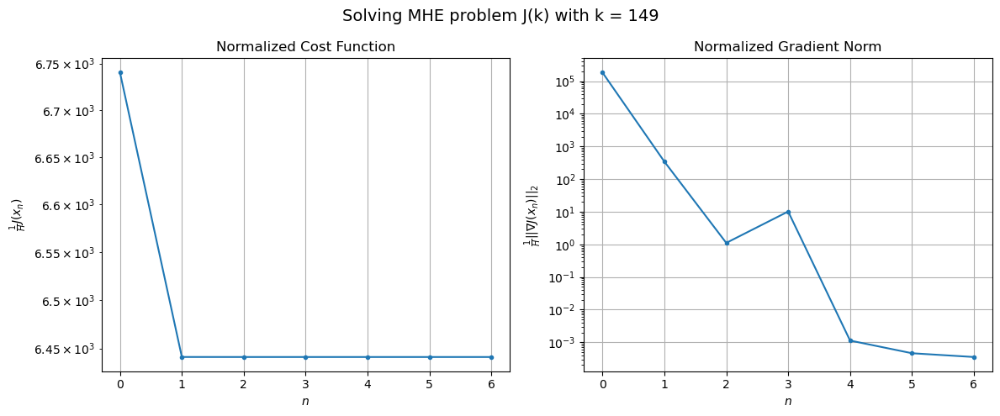

Windows:  33%|███▎      | 121/366 [1:07:01<2:01:26, 29.74s/it]

[Hybrid] Before applying the algorithm
Cost function: 198449.36550239165
Gradient norm: 5492636.798634417
Global estimation error: 55.761594755180546
Initial conditions estimation errors: 17.066100513056185 m, 21.253746406576024 m, 22.65794642561778 m, 43.04622200342282 m
Position estimation errors: 23.32881534932974 m, 18.468201583937134 m, 23.434926551117645 m, 21.328252103201592 m

[Hybrid] Iteration 1
Cost function: 189069.83581088265 (-4.73%)
Gradient norm: 567.7748330977139 (-99.99%)
Global estimation error: 41.503255346305856 (-25.57%)
Initial conditions estimation errors: 21.21159305837576 m, 21.413832287061695 m, 20.772266749342414 m, 19.558210436794287 m
Position estimation errors: 19.24182954860705 m, 16.372854307092677 m, 17.085170811536194 m, 14.296295249981265 m

[Hybrid] Iteration 2
Cost function: 189069.82626042984 (-0.00%)
Gradient norm: 13.406969227241728 (-97.64%)
Global estimation error: 40.18532708863574 (-3.18%)
Initial conditions estimation errors: 21.21159360783

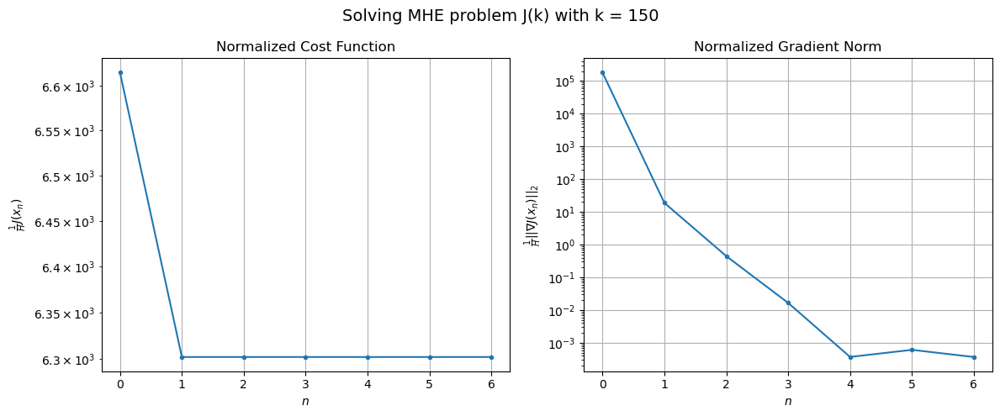

Windows:  33%|███▎      | 122/366 [1:07:33<2:04:26, 30.60s/it]

[Hybrid] Before applying the algorithm
Cost function: 193019.9207390517
Gradient norm: 5412984.243429845
Global estimation error: 31.432094523072337
Initial conditions estimation errors: 16.95315322315707 m, 16.727144624213473 m, 15.781596983588512 m, 13.102848726101522 m
Position estimation errors: 23.029562002060167 m, 20.20603780861457 m, 20.409321609021102 m, 17.219933060802255 m

[Hybrid] Iteration 1
Cost function: 183469.35985724497 (-4.95%)
Gradient norm: 10931.218720154558 (-99.80%)
Global estimation error: 80.7825746999993 (157.01%)
Initial conditions estimation errors: 21.197520459346983 m, 16.396497393872465 m, 15.972108658039348 m, 74.51499695833832 m
Position estimation errors: 18.937857260846716 m, 15.16352334743482 m, 12.885361644473353 m, 37.22722250995845 m

[Hybrid] Iteration 2
Cost function: 183468.30961658692 (-0.00%)
Gradient norm: 2.141619672532158 (-99.98%)
Global estimation error: 80.97321489125422 (0.24%)
Initial conditions estimation errors: 21.19752098717333 

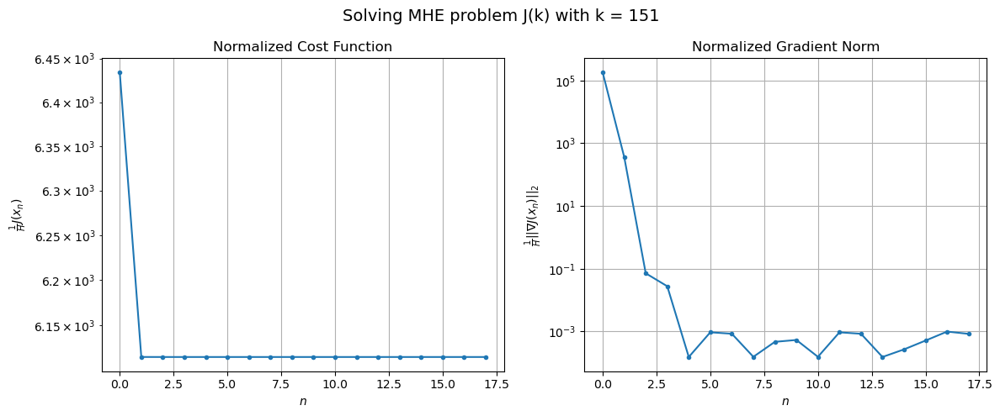

Windows:  34%|███▎      | 123/366 [1:08:43<2:51:12, 42.27s/it]

[Hybrid] Before applying the algorithm
Cost function: 186344.59505254508
Gradient norm: 5223289.27066381
Global estimation error: 86.04663585391656
Initial conditions estimation errors: 16.661195529331987 m, 12.014258270268444 m, 13.922599592822158 m, 82.390539711953 m
Position estimation errors: 22.690878053085523 m, 19.488480447405546 m, 15.686992855861677 m, 26.316602480414154 m

[Hybrid] Iteration 1
Cost function: 176964.49535088576 (-5.03%)
Gradient norm: 9414.619662770769 (-99.82%)
Global estimation error: 39.084669439876514 (-54.58%)
Initial conditions estimation errors: 20.919789879403655 m, 19.620831323096528 m, 16.721381482122013 m, 20.624311234179988 m
Position estimation errors: 18.673154728690808 m, 17.51775693025385 m, 16.993272303712367 m, 20.87173638742459 m

[Hybrid] Iteration 2
Cost function: 176963.80986093642 (-0.00%)
Gradient norm: 37.305148032861034 (-99.60%)
Global estimation error: 39.26299850029223 (0.46%)
Initial conditions estimation errors: 20.9197904065312 

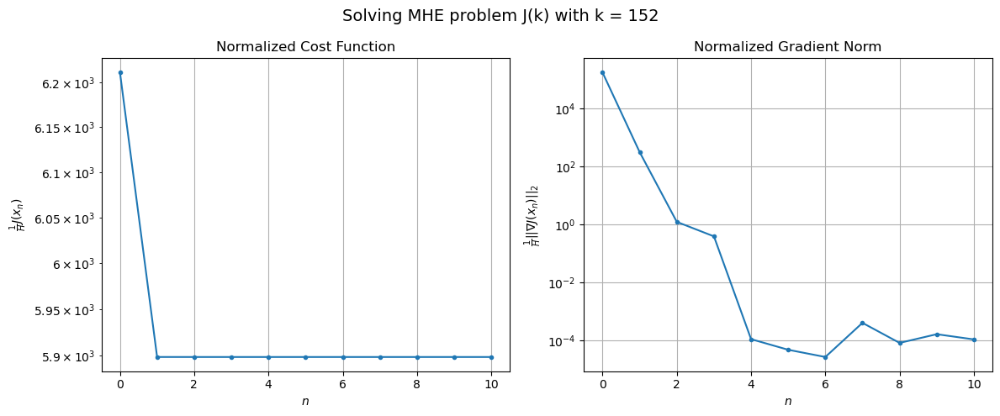

Windows:  34%|███▍      | 124/366 [1:09:25<2:51:02, 42.41s/it]

[Hybrid] Before applying the algorithm
Cost function: 179603.86121721737
Gradient norm: 5131594.230279883
Global estimation error: 31.387900610922276
Initial conditions estimation errors: 16.318264299672283 m, 15.2317439175875 m, 13.001371137315669 m, 17.82830800688879 m
Position estimation errors: 22.395763073321646 m, 21.709131127563058 m, 21.877603880667404 m, 30.950549880406342 m

[Hybrid] Iteration 1
Cost function: 170366.14687102605 (-5.14%)
Gradient norm: 580.5455189430388 (-99.99%)
Global estimation error: 36.364151771872 (15.85%)
Initial conditions estimation errors: 20.57343209431236 m, 19.304686880039444 m, 16.894429218154148 m, 15.522977546872491 m
Position estimation errors: 18.429662256442562 m, 17.15472704678871 m, 16.914632285815618 m, 11.279982614606123 m

[Hybrid] Iteration 2
Cost function: 170366.145558183 (-0.00%)
Gradient norm: 1.00176012398078 (-99.83%)
Global estimation error: 36.31160206440206 (-0.14%)
Initial conditions estimation errors: 20.573432531987677 m, 

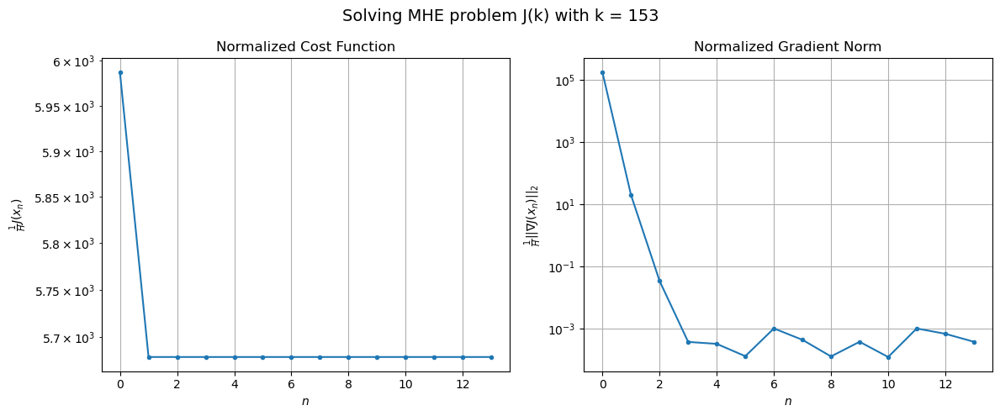

Windows:  34%|███▍      | 125/366 [1:10:20<3:04:49, 46.02s/it]

[Hybrid] Before applying the algorithm
Cost function: 173685.8333786571
Gradient norm: 5106061.923823285
Global estimation error: 29.188293415296425
Initial conditions estimation errors: 16.095760714380553 m, 14.901008424549 m, 12.319492500502786 m, 14.800300266730204 m
Position estimation errors: 22.130848963556403 m, 20.76165971980315 m, 20.82409003393378 m, 15.282424968495716 m

[Hybrid] Iteration 1
Cost function: 164653.4039612468 (-5.20%)
Gradient norm: 5290.731516472419 (-99.90%)
Global estimation error: 41.25208376247541 (41.33%)
Initial conditions estimation errors: 20.311580196429823 m, 19.182528161859675 m, 18.78221473698578 m, 23.84093002547413 m
Position estimation errors: 18.218638164297293 m, 12.277018503547884 m, 11.24346872120651 m, 47.8529677287604 m

[Hybrid] Iteration 2
Cost function: 164653.3047789848 (-0.00%)
Gradient norm: 33.532659836435265 (-99.37%)
Global estimation error: 40.81871521389923 (-1.05%)
Initial conditions estimation errors: 20.31158066784586 m, 19.

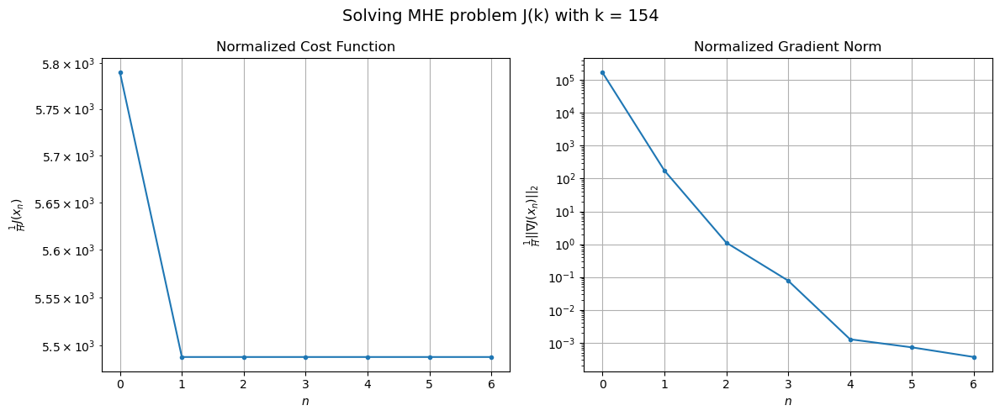

Windows:  34%|███▍      | 126/366 [1:10:51<2:46:40, 41.67s/it]

[Hybrid] Before applying the algorithm
Cost function: 168661.08768987932
Gradient norm: 5123690.254790014
Global estimation error: 39.30240176649975
Initial conditions estimation errors: 16.058760895239473 m, 14.655787263313046 m, 14.236449522830592 m, 29.48376998247812 m
Position estimation errors: 21.90086413927422 m, 16.655766084684604 m, 16.153735298796562 m, 36.45218300945523 m

[Hybrid] Iteration 1
Cost function: 159766.85405118018 (-5.27%)
Gradient norm: 5001.792594724729 (-99.90%)
Global estimation error: 35.63829786400563 (-9.32%)
Initial conditions estimation errors: 20.227886169691775 m, 18.631930687202903 m, 17.593009844000992 m, 14.291058225389648 m
Position estimation errors: 18.005128622550536 m, 18.015187532437675 m, 19.2967583713226 m, 12.552460520642125 m

[Hybrid] Iteration 2
Cost function: 159766.73855442126 (-0.00%)
Gradient norm: 19.37659877394265 (-99.61%)
Global estimation error: 35.82178444052716 (0.51%)
Initial conditions estimation errors: 20.22788665187494 m

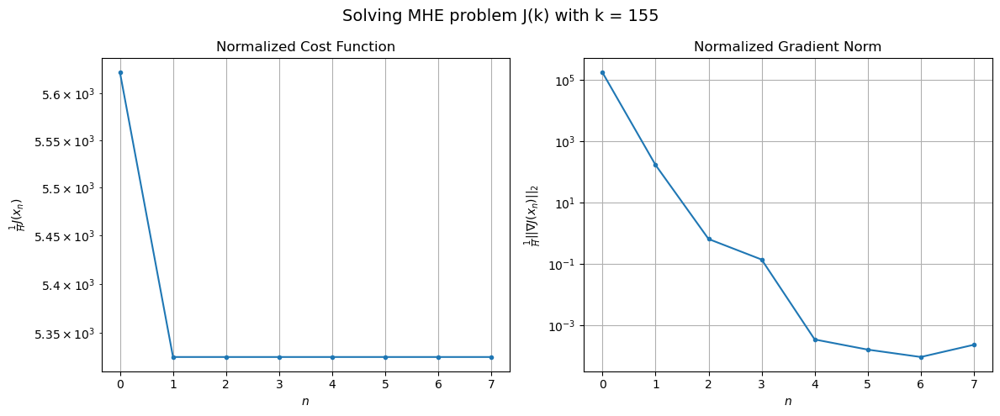

Windows:  35%|███▍      | 127/366 [1:11:28<2:39:49, 40.12s/it]

[Hybrid] Before applying the algorithm
Cost function: 162537.18604900266
Gradient norm: 5023437.573619077
Global estimation error: 28.20203582333814
Initial conditions estimation errors: 16.196176852966673 m, 14.634061373536952 m, 13.690787897585096 m, 11.464138281556215 m
Position estimation errors: 21.652011943063037 m, 22.230092801674285 m, 23.528353604583625 m, 20.627732716989144 m

[Hybrid] Iteration 1
Cost function: 153801.99125174736 (-5.37%)
Gradient norm: 3824.241974826752 (-99.92%)
Global estimation error: 42.82923652264485 (51.87%)
Initial conditions estimation errors: 20.336688535200032 m, 18.07665168484162 m, 19.892056747188796 m, 26.425039618268208 m
Position estimation errors: 17.803071865476568 m, 24.749632310635768 m, 25.456657956354086 m, 64.68559766935198 m

[Hybrid] Iteration 2
Cost function: 153801.94032350235 (-0.00%)
Gradient norm: 79.34222222139302 (-97.93%)
Global estimation error: 41.76598259047833 (-2.48%)
Initial conditions estimation errors: 20.336689014027

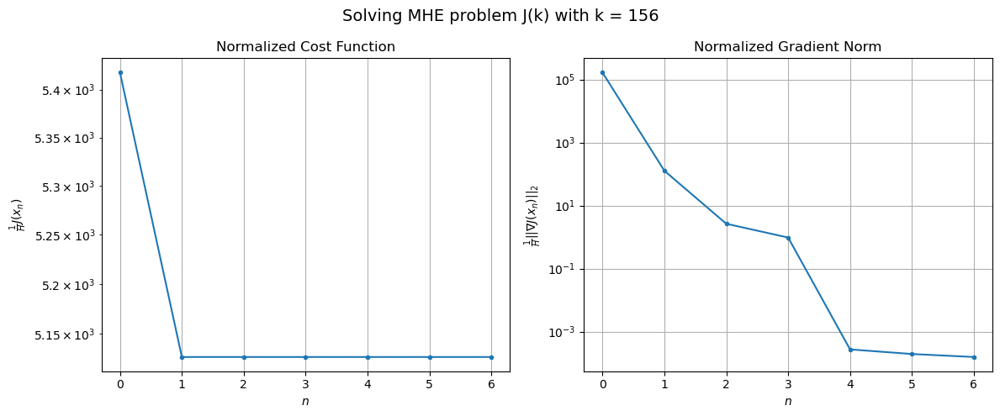

Windows:  35%|███▍      | 128/366 [1:12:01<2:31:06, 38.09s/it]

[Hybrid] Before applying the algorithm
Cost function: 156350.28899211704
Gradient norm: 5071554.123156719
Global estimation error: 34.12436862542572
Initial conditions estimation errors: 16.44013048163852 m, 14.648153564148775 m, 16.35498187273183 m, 20.30080848076581 m
Position estimation errors: 21.397362283175568 m, 26.68082474763076 m, 27.1933681054769 m, 55.991678820155876 m

[Hybrid] Iteration 1
Cost function: 342038.2972415411 (118.76%)
Gradient norm: 7595437.365825258 (49.77%)
Global estimation error: 686.3803112380997 (1911.41%)
Initial conditions estimation errors: 20.54609486270747 m, 36.928972113221064 m, 308.8466216231218 m, 611.5046945243117 m
Position estimation errors: 17.559686789833997 m, 269.1445029379863 m, 279.91339860346966 m, 2063.3691295494095 m

[Hybrid] Iteration 2
Cost function: 147914.3765070881 (-56.76%)
Gradient norm: 6257.713919319293 (-99.92%)
Global estimation error: 684.4148780963714 (-0.29%)
Initial conditions estimation errors: 20.54609920792832 m, 3

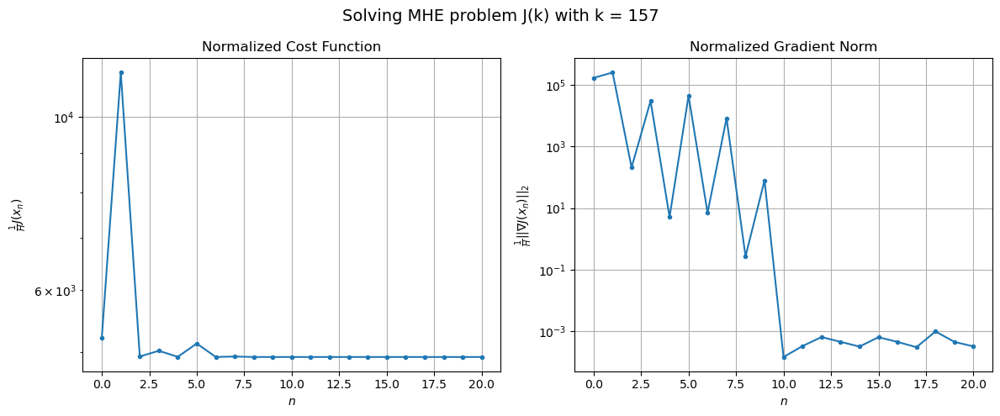

Windows:  35%|███▌      | 129/366 [1:13:20<3:18:32, 50.26s/it]

[Hybrid] Before applying the algorithm
Cost function: 149657.5379100311
Gradient norm: 5075541.73353628
Global estimation error: 31.95820272517889
Initial conditions estimation errors: 16.661605507633208 m, 14.62474458543591 m, 12.262954689616139 m, 19.478925986866315 m
Position estimation errors: 21.097842723771763 m, 18.87603971046736 m, 19.283335873280897 m, 17.426940025845834 m

[Hybrid] Iteration 1
Cost function: 141196.5337347133 (-5.65%)
Gradient norm: 185743.7027778902 (-96.34%)
Global estimation error: 117.35245620969519 (267.21%)
Initial conditions estimation errors: 20.726747667603156 m, 17.649040906032205 m, 51.29595623896294 m, 101.97596186423185 m
Position estimation errors: 17.25842424546398 m, 57.24166194703781 m, 57.237424360781176 m, 306.10043879862565 m

[Hybrid] Iteration 2
Cost function: 141075.7188983936 (-0.09%)
Gradient norm: 43.81526956018642 (-99.98%)
Global estimation error: 116.86001268589071 (-0.42%)
Initial conditions estimation errors: 20.726748324504403 

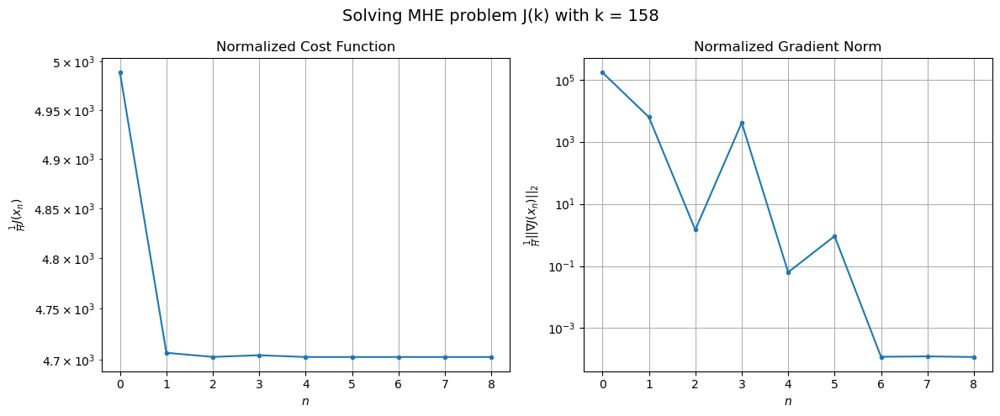

Windows:  36%|███▌      | 130/366 [1:13:55<3:00:15, 45.83s/it]

[Hybrid] Before applying the algorithm
Cost function: 141212.98145326693
Gradient norm: 5271663.879755479
Global estimation error: 30.328442001769428
Initial conditions estimation errors: 16.74378599879279 m, 14.540654340121625 m, 15.3243653995799 m, 13.898648249428486 m
Position estimation errors: 20.785589889978308 m, 23.782431446672177 m, 24.190009461819162 m, 37.76735408831762 m

[Hybrid] Iteration 1
Cost function: 132596.4486640452 (-6.10%)
Gradient norm: 23.894665680576132 (-100.00%)
Global estimation error: 36.90033606733242 (21.67%)
Initial conditions estimation errors: 20.782630684982003 m, 17.938388409240673 m, 17.748371677825876 m, 17.11438953119322 m
Position estimation errors: 16.92023160854369 m, 19.260384886027314 m, 20.385352524821155 m, 33.29057803538528 m

[Hybrid] Iteration 2
Cost function: 132596.44863361912 (-0.00%)
Gradient norm: 0.5302963445896332 (-97.78%)
Global estimation error: 36.84947909618131 (-0.14%)
Initial conditions estimation errors: 20.78263132314291

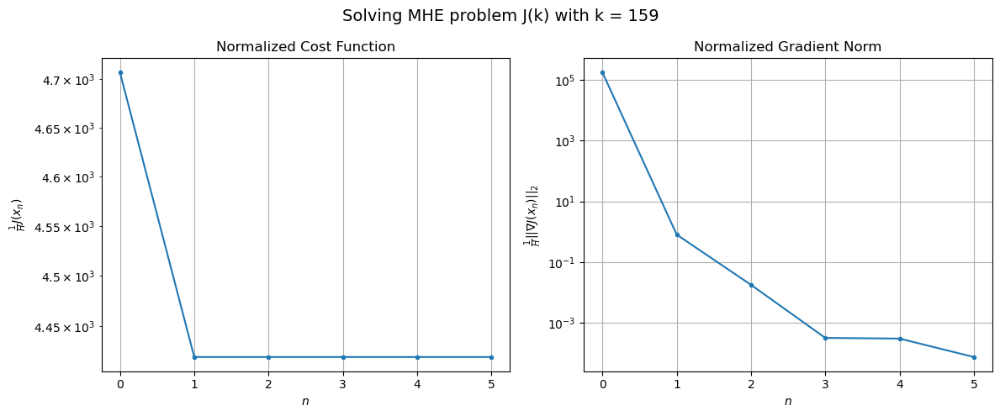

Windows:  36%|███▌      | 131/366 [1:14:22<2:36:21, 39.92s/it]

[Hybrid] Before applying the algorithm
Cost function: 131882.80229455736
Gradient norm: 5370660.586766631
Global estimation error: 28.90199115343825
Initial conditions estimation errors: 16.626607538109315 m, 14.068287778669587 m, 13.96904323838304 m, 12.876630006199472 m
Position estimation errors: 20.519169376412076 m, 22.640234946890907 m, 23.73559022931952 m, 35.6737937632982 m

[Hybrid] Iteration 1
Cost function: 123494.63351074031 (-6.36%)
Gradient norm: 3603.0272778100716 (-99.93%)
Global estimation error: 50.396297529164734 (74.37%)
Initial conditions estimation errors: 20.559570748504267 m, 18.488480238147016 m, 23.98261999168587 m, 34.64209327478094 m
Position estimation errors: 16.661871550507556 m, 24.380271275668925 m, 23.628040346780494 m, 71.5817624269681 m

[Hybrid] Iteration 2
Cost function: 123494.57211348288 (-0.00%)
Gradient norm: 43.65075159205325 (-98.79%)
Global estimation error: 52.05221016353114 (3.29%)
Initial conditions estimation errors: 20.5595713942885 m, 

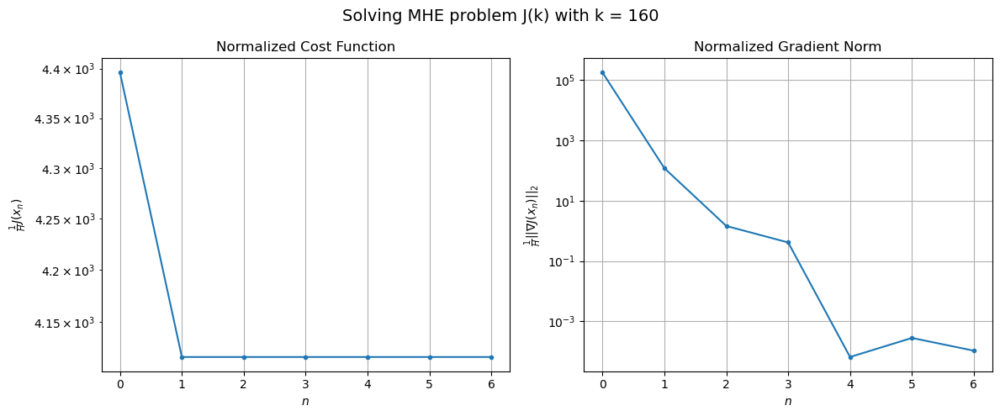

Windows:  36%|███▌      | 132/366 [1:14:52<2:24:07, 36.95s/it]

[Hybrid] Before applying the algorithm
Cost function: 123851.43801893189
Gradient norm: 5769552.969751063
Global estimation error: 48.66919721229891
Initial conditions estimation errors: 16.22780567245021 m, 14.83612128892583 m, 21.911366185750197 m, 37.484754682610465 m
Position estimation errors: 20.443243660872874 m, 28.42829168834418 m, 27.174979348156263 m, 78.12935981613573 m

[Hybrid] Iteration 1
Cost function: 115615.07279404774 (-6.65%)
Gradient norm: 532.5398469513026 (-99.99%)
Global estimation error: 62.86100984194036 (29.16%)
Initial conditions estimation errors: 20.02680147275037 m, 18.03542939376465 m, 27.43185945627526 m, 49.72545873160896 m
Position estimation errors: 16.52933584534874 m, 27.816697734612884 m, 25.779642775117633 m, 91.25868121912178 m

[Hybrid] Iteration 2
Cost function: 115615.07109541837 (-0.00%)
Gradient norm: 5.48700817456683 (-98.97%)
Global estimation error: 63.50579914643284 (1.03%)
Initial conditions estimation errors: 20.026802104338028 m, 18.

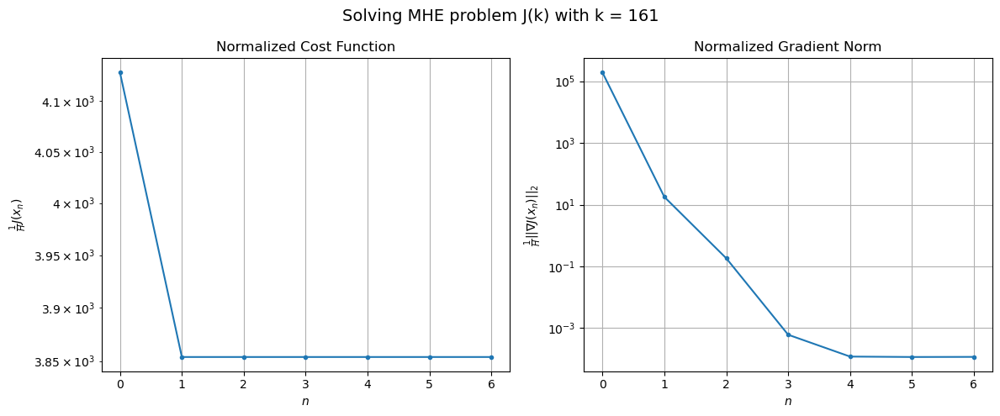

Windows:  36%|███▋      | 133/366 [1:15:23<2:17:02, 35.29s/it]

[Hybrid] Before applying the algorithm
Cost function: 116644.973973548
Gradient norm: 6245543.18713158
Global estimation error: 61.38214873865772
Initial conditions estimation errors: 15.57503563046139 m, 14.426062050157286 m, 24.802911085938504 m, 51.97947728891788 m
Position estimation errors: 20.55209666806915 m, 30.945885280556443 m, 28.375396949534494 m, 90.94880932486306 m

[Hybrid] Iteration 1
Cost function: 108397.88954113163 (-7.07%)
Gradient norm: 132.00689553616894 (-100.00%)
Global estimation error: 74.74302511635462 (21.77%)
Initial conditions estimation errors: 19.28087787125084 m, 17.486967725856562 m, 30.432848589547753 m, 63.10932076986879 m
Position estimation errors: 16.54815015461939 m, 30.643033844446336 m, 24.621315498723423 m, 92.33134765896179 m

[Hybrid] Iteration 2
Cost function: 108397.88933250397 (-0.00%)
Gradient norm: 1.088467312630703 (-99.18%)
Global estimation error: 75.08514849353558 (0.46%)
Initial conditions estimation errors: 19.28087847525205 m, 17

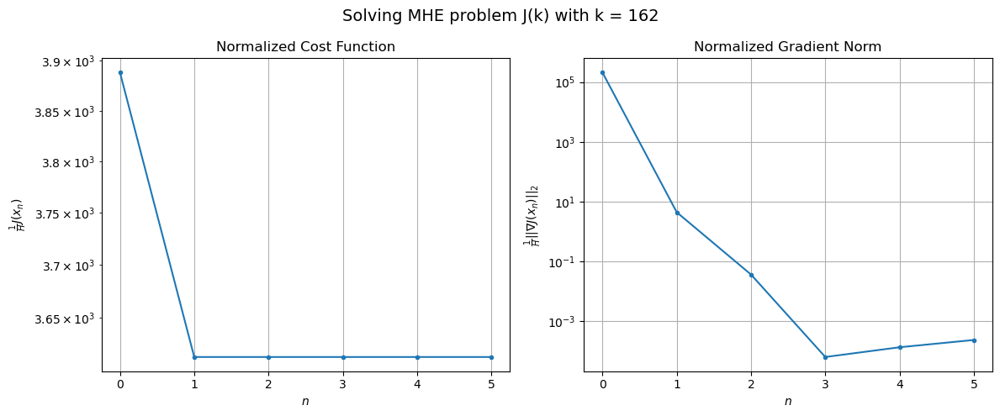

Windows:  37%|███▋      | 134/366 [1:15:49<2:05:46, 32.53s/it]

[Hybrid] Before applying the algorithm
Cost function: 111210.09986443326
Gradient norm: 6606222.587266066
Global estimation error: 73.98307739643323
Initial conditions estimation errors: 14.79541599016126 m, 13.887297151779098 m, 27.425549029417148 m, 65.6471627583216 m
Position estimation errors: 20.79076822065326 m, 33.44776288956151 m, 27.177371517408073 m, 90.31956918838084 m

[Hybrid] Iteration 1
Cost function: 103342.05687478324 (-7.07%)
Gradient norm: 10490.725794841268 (-99.84%)
Global estimation error: 32.76108554231979 (-55.72%)
Initial conditions estimation errors: 18.30616747013691 m, 13.246499815467164 m, 17.424609549926416 m, 16.095394179650793 m
Position estimation errors: 16.77608420401195 m, 21.46721288206254 m, 19.06546841371682 m, 27.72457392991027 m

[Hybrid] Iteration 2
Cost function: 103341.36522652041 (-0.00%)
Gradient norm: 348.3566662607254 (-96.68%)
Global estimation error: 36.50102033185685 (11.42%)
Initial conditions estimation errors: 18.30616799670203 m, 1

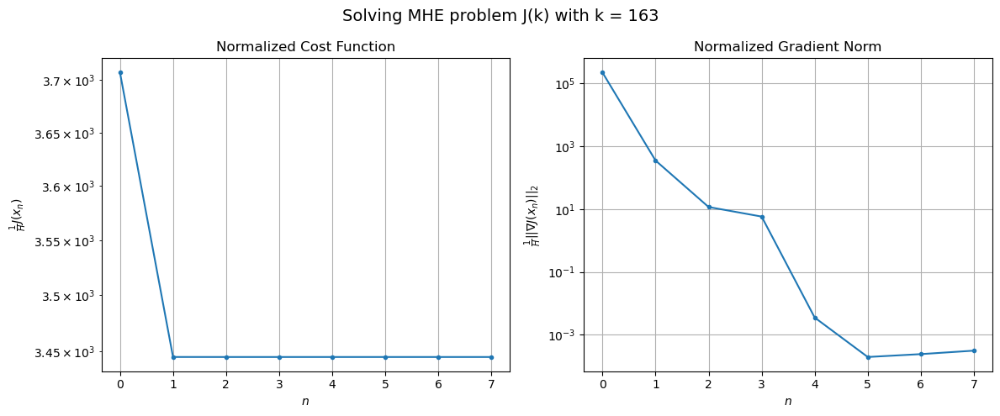

Windows:  37%|███▋      | 135/366 [1:16:21<2:04:51, 32.43s/it]

[Hybrid] Before applying the algorithm
Cost function: 109252.4018311569
Gradient norm: 7160637.31854463
Global estimation error: 33.69923523831398
Initial conditions estimation errors: 13.890394157067137 m, 9.569479224339128 m, 16.293416718881865 m, 24.199731144462937 m
Position estimation errors: 21.176714733270465 m, 27.91342605966111 m, 23.806535103953006 m, 48.894485177485485 m

[Hybrid] Iteration 1
Cost function: 101678.07119765524 (-6.93%)
Gradient norm: 25.355836730842398 (-100.00%)
Global estimation error: 44.03753090410246 (30.68%)
Initial conditions estimation errors: 17.18836990801533 m, 13.775280353580401 m, 20.55138098906255 m, 32.120498243241684 m
Position estimation errors: 17.088736511636117 m, 24.02147816016805 m, 19.952714916290773 m, 47.01062321645458 m

[Hybrid] Iteration 2
Cost function: 101678.07113142018 (-0.00%)
Gradient norm: 0.31228494194747325 (-98.77%)
Global estimation error: 44.26474671349075 (0.52%)
Initial conditions estimation errors: 17.188370410449256

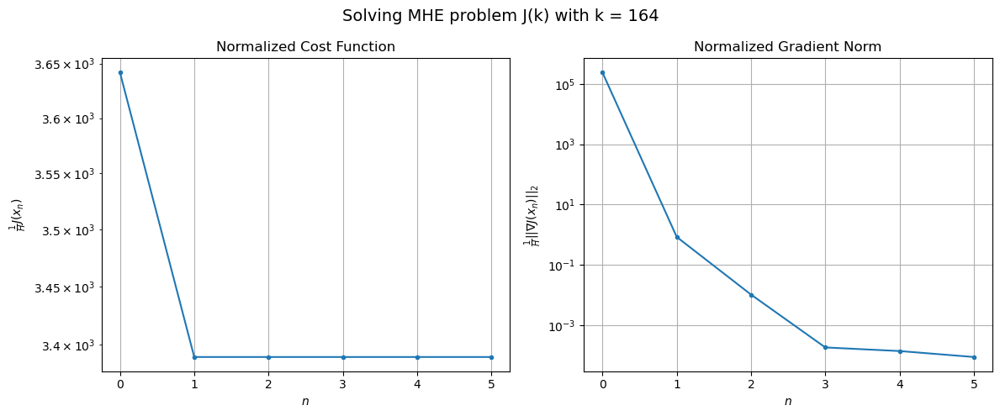

Windows:  37%|███▋      | 136/366 [1:16:46<1:55:41, 30.18s/it]

[Hybrid] Before applying the algorithm
Cost function: 110117.83072625296
Gradient norm: 7639666.312102725
Global estimation error: 39.157909297326185
Initial conditions estimation errors: 12.933731541294984 m, 9.980471083577214 m, 16.950214097200718 m, 31.29098287850935 m
Position estimation errors: 21.557781989257755 m, 27.2263936123984 m, 23.246873545761538 m, 47.72683228334746 m

[Hybrid] Iteration 1
Cost function: 102649.97695224463 (-6.78%)
Gradient norm: 245.92779194435235 (-100.00%)
Global estimation error: 49.46184718352631 (26.31%)
Initial conditions estimation errors: 16.081008222124996 m, 12.744950173353384 m, 20.513383164970183 m, 40.05777505560088 m
Position estimation errors: 17.37452521028 m, 25.109112135988234 m, 20.121249388485154 m, 55.0607563034925 m

[Hybrid] Iteration 2
Cost function: 102649.9764123418 (-0.00%)
Gradient norm: 1.282362939840417 (-99.48%)
Global estimation error: 49.853453770639334 (0.79%)
Initial conditions estimation errors: 16.081008670427494 m, 1

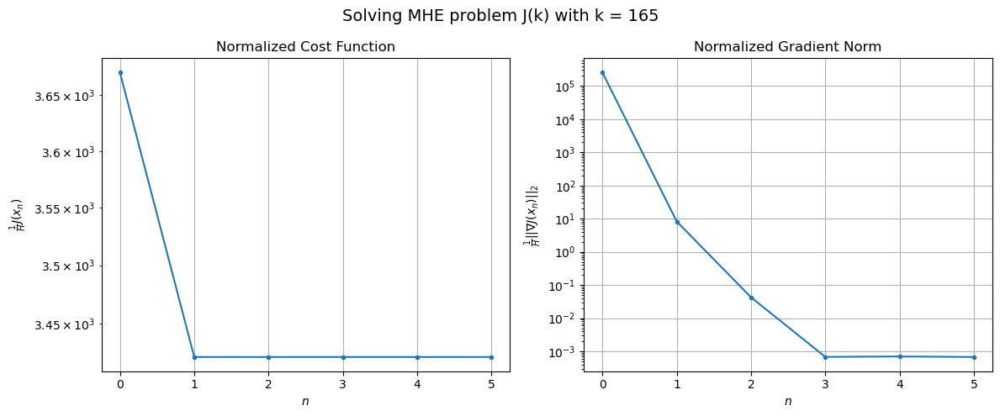

Windows:  37%|███▋      | 137/366 [1:17:14<1:52:06, 29.37s/it]

[Hybrid] Before applying the algorithm
Cost function: 113757.62864723615
Gradient norm: 7987111.913972578
Global estimation error: 46.597399628222355
Initial conditions estimation errors: 12.04904825966847 m, 9.287444237529778 m, 17.285086973858714 m, 40.51042103959526 m
Position estimation errors: 21.817098345906402 m, 28.029626210071765 m, 22.781408583781474 m, 55.216525530747965 m

[Hybrid] Iteration 1
Cost function: 106673.47141359342 (-6.23%)
Gradient norm: 6753.402971188141 (-99.92%)
Global estimation error: 29.279836688038017 (-37.16%)
Initial conditions estimation errors: 14.972495492491035 m, 12.459041666581527 m, 12.862936045675763 m, 17.675713945269212 m
Position estimation errors: 17.610839551101915 m, 17.094103533342356 m, 17.943143795149776 m, 21.63316780976124 m

[Hybrid] Iteration 2
Cost function: 106673.285353384 (-0.00%)
Gradient norm: 15.90130441019745 (-99.76%)
Global estimation error: 30.39876518507793 (3.82%)
Initial conditions estimation errors: 14.97249588006772

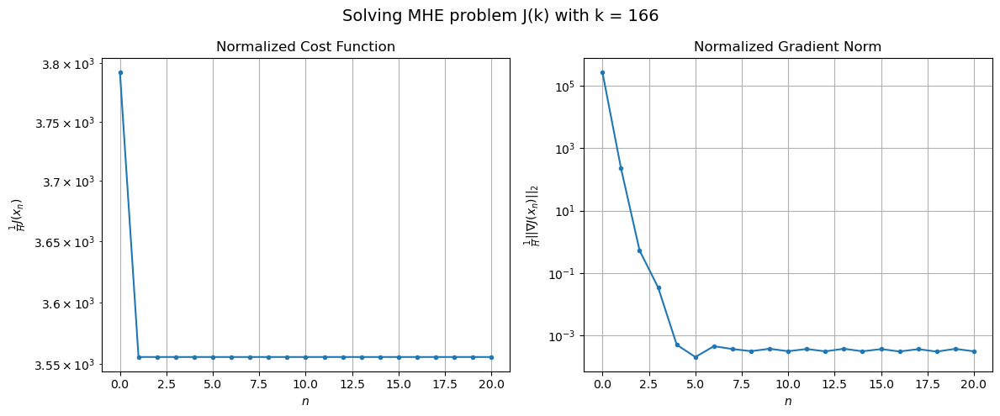

Windows:  38%|███▊      | 138/366 [1:18:33<2:48:41, 44.39s/it]

[Hybrid] Before applying the algorithm
Cost function: 119549.64865458282
Gradient norm: 8247249.848278566
Global estimation error: 23.18458506210628
Initial conditions estimation errors: 11.227917103257315 m, 8.867468844929151 m, 9.712323622510045 m, 15.442907089936247 m
Position estimation errors: 21.904123604302825 m, 21.366206868556304 m, 21.872828496384873 m, 25.17336584013618 m

[Hybrid] Iteration 1
Cost function: 112590.68529190372 (-5.82%)
Gradient norm: 525.4581633888739 (-99.99%)
Global estimation error: 22.438631889937582 (-3.22%)
Initial conditions estimation errors: 14.008980333950541 m, 11.627642376976565 m, 9.851204004843192 m, 8.658735445698403 m
Position estimation errors: 17.627780813370535 m, 15.82578335593177 m, 18.116804487204842 m, 27.817985332206113 m

[Hybrid] Iteration 2
Cost function: 112590.68389390246 (-0.00%)
Gradient norm: 0.12377253877146518 (-99.98%)
Global estimation error: 22.398926354415007 (-0.18%)
Initial conditions estimation errors: 14.008980662608

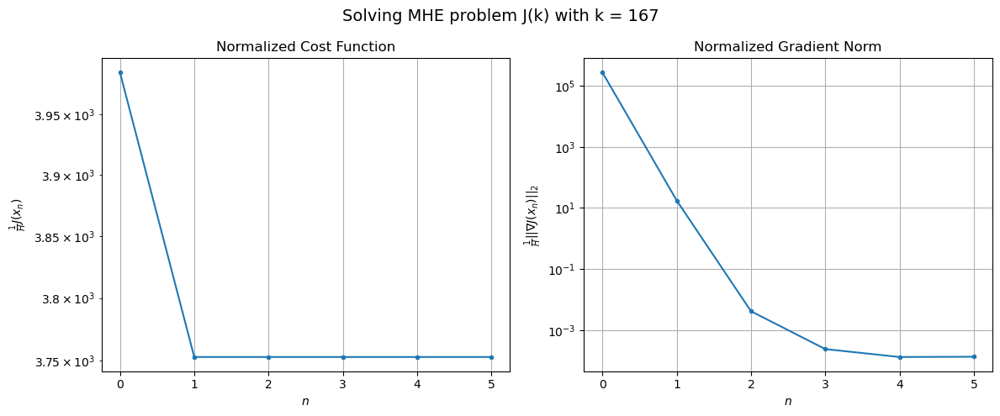

Windows:  38%|███▊      | 139/366 [1:18:57<2:24:08, 38.10s/it]

[Hybrid] Before applying the algorithm
Cost function: 125934.81384824293
Gradient norm: 8127985.100118489
Global estimation error: 16.174616272546366
Initial conditions estimation errors: 10.599400596593382 m, 8.11400102900658 m, 6.887772074305977 m, 5.998192963843669 m
Position estimation errors: 21.59743538452091 m, 19.70865603189262 m, 21.707786932430384 m, 30.382261336771354 m

[Hybrid] Iteration 1
Cost function: 119471.34905220194 (-5.13%)
Gradient norm: 497.87637804697783 (-99.99%)
Global estimation error: 21.87999079931266 (35.27%)
Initial conditions estimation errors: 13.224388361852066 m, 12.226940616017954 m, 9.430658348242197 m, 8.08711855084898 m
Position estimation errors: 17.42290490297194 m, 15.069596978937135 m, 16.911062232106996 m, 15.147777961214196 m

[Hybrid] Iteration 2
Cost function: 119471.34666837529 (-0.00%)
Gradient norm: 6.168050717249009 (-98.76%)
Global estimation error: 21.83166563457011 (-0.22%)
Initial conditions estimation errors: 13.224388609912006 m,

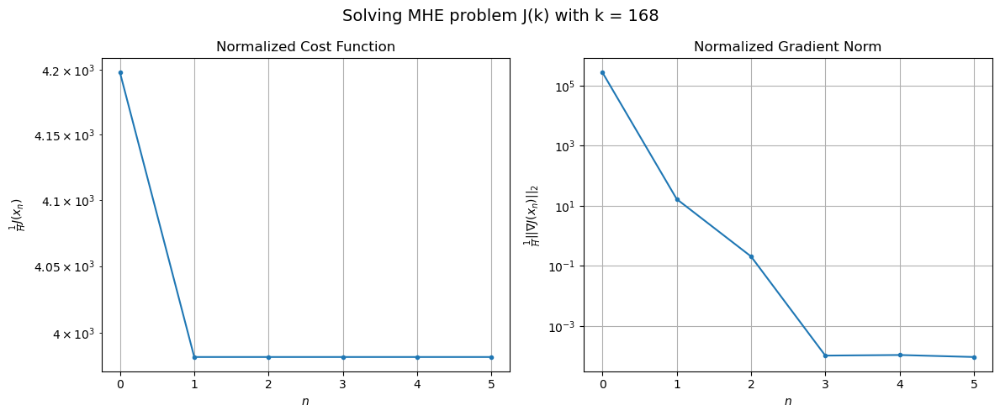

Windows:  38%|███▊      | 140/366 [1:19:22<2:08:45, 34.18s/it]

[Hybrid] Before applying the algorithm
Cost function: 132742.91295200848
Gradient norm: 7941497.639451002
Global estimation error: 17.148441311335652
Initial conditions estimation errors: 10.171030371216652 m, 9.067056696676392 m, 6.686428709501617 m, 7.9806044574727855 m
Position estimation errors: 20.94015151618825 m, 18.341997563943604 m, 19.57763980057965 m, 18.414789409416684 m

[Hybrid] Iteration 1
Cost function: 126725.49444258488 (-4.53%)
Gradient norm: 33.70319175666045 (-100.00%)
Global estimation error: 20.16146061159648 (17.57%)
Initial conditions estimation errors: 12.691282503253985 m, 9.919005092736663 m, 9.527270321959369 m, 7.499987740283937 m
Position estimation errors: 16.89661386847381 m, 14.890825836182021 m, 16.00588136778935 m, 14.960360080118075 m

[Hybrid] Iteration 2
Cost function: 126725.4943354887 (-0.00%)
Gradient norm: 0.310439780419429 (-99.08%)
Global estimation error: 20.15047545890753 (-0.05%)
Initial conditions estimation errors: 12.691282623887405 m,

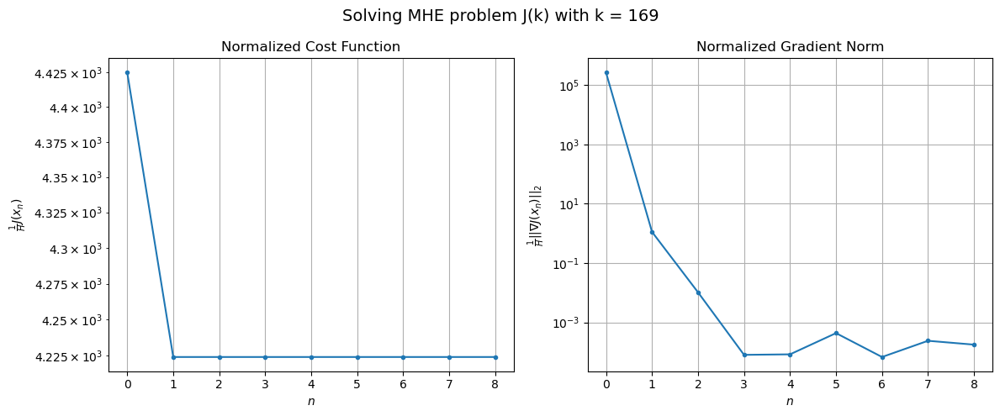

Windows:  39%|███▊      | 141/366 [1:20:00<2:13:02, 35.48s/it]

[Hybrid] Before applying the algorithm
Cost function: 138723.2499976013
Gradient norm: 7479723.590900337
Global estimation error: 16.319873072289145
Initial conditions estimation errors: 9.957989020243243 m, 7.388639288136038 m, 7.216647354773712 m, 7.777988604198948 m
Position estimation errors: 19.89279766521381 m, 17.617521339423774 m, 18.49103941498525 m, 16.89221970651407 m

[Hybrid] Iteration 1
Cost function: 133203.65379563504 (-3.98%)
Gradient norm: 2020.7822150767277 (-99.97%)
Global estimation error: 28.016805586632778 (71.67%)
Initial conditions estimation errors: 12.435446815763083 m, 10.259158534970878 m, 9.595051708835488 m, 20.80795968269796 m
Position estimation errors: 16.06796728918686 m, 17.228607003610662 m, 17.253650414576743 m, 39.15753161471576 m

[Hybrid] Iteration 2
Cost function: 133203.63425512752 (-0.00%)
Gradient norm: 12.590828075174365 (-99.38%)
Global estimation error: 27.348102302084467 (-2.39%)
Initial conditions estimation errors: 12.435446785540332 m

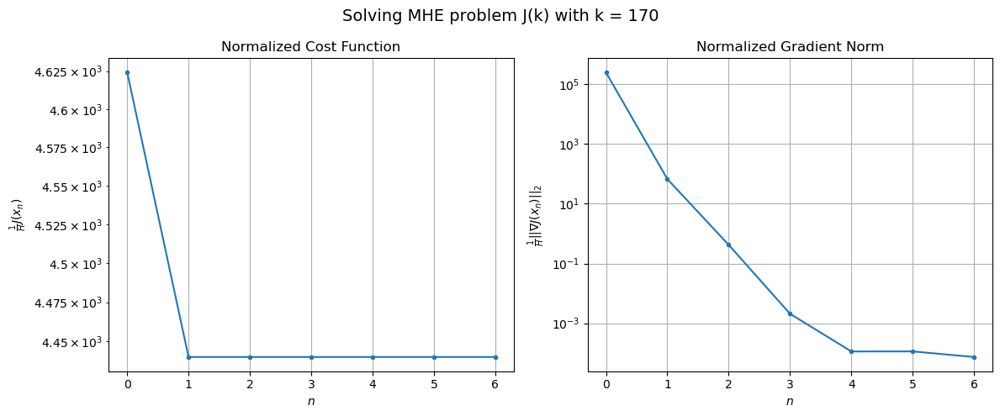

Windows:  39%|███▉      | 142/366 [1:20:27<2:02:54, 32.92s/it]

[Hybrid] Before applying the algorithm
Cost function: 143011.05343374214
Gradient norm: 6764539.9200421
Global estimation error: 28.008781206409928
Initial conditions estimation errors: 9.936249432687685 m, 7.7139894360063135 m, 8.023521702742867 m, 23.70377370900651 m
Position estimation errors: 18.536069543316856 m, 19.162824642605532 m, 19.174262046862925 m, 35.757475753425425 m

[Hybrid] Iteration 1
Cost function: 138154.67582306947 (-3.40%)
Gradient norm: 389.67390640662524 (-99.99%)
Global estimation error: 28.635281307833647 (2.24%)
Initial conditions estimation errors: 12.401334150359082 m, 10.385674997385939 m, 10.164309132609018 m, 21.330617721038426 m
Position estimation errors: 15.065311504973172 m, 19.13575369491592 m, 17.099216103163016 m, 51.80798517068831 m

[Hybrid] Iteration 2
Cost function: 138154.67364075093 (-0.00%)
Gradient norm: 7.512464764617667 (-98.07%)
Global estimation error: 28.945096906952816 (1.08%)
Initial conditions estimation errors: 12.401333969542364

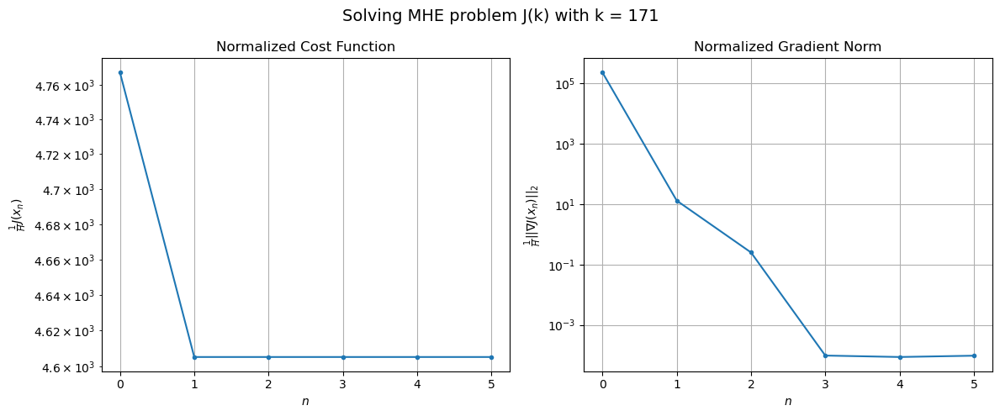

Windows:  39%|███▉      | 143/366 [1:20:51<1:52:45, 30.34s/it]

[Hybrid] Before applying the algorithm
Cost function: 145090.5788945914
Gradient norm: 5882958.697094271
Global estimation error: 30.804096803823242
Initial conditions estimation errors: 10.026071339861854 m, 7.900615538573637 m, 8.93876833926665 m, 26.571316728786066 m
Position estimation errors: 17.052145021425122 m, 21.33510313591429 m, 19.101640800542878 m, 52.149106806911085 m

[Hybrid] Iteration 1
Cost function: 140832.30349582474 (-2.93%)
Gradient norm: 260.41234368392196 (-100.00%)
Global estimation error: 23.611562060592334 (-23.35%)
Initial conditions estimation errors: 12.534133238663227 m, 12.034362091177522 m, 12.198977683733133 m, 10.331849202235002 m
Position estimation errors: 13.989187732923135 m, 19.75073813403423 m, 15.527388005692927 m, 50.113731058543436 m

[Hybrid] Iteration 2
Cost function: 140832.30228341452 (-0.00%)
Gradient norm: 0.08702701775450805 (-99.97%)
Global estimation error: 23.56970099272308 (-0.18%)
Initial conditions estimation errors: 12.534132893

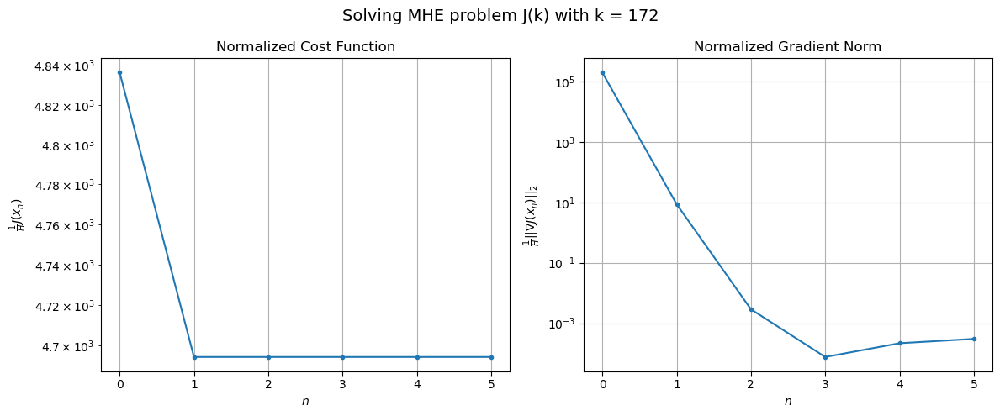

Windows:  39%|███▉      | 144/366 [1:21:16<1:46:07, 28.68s/it]

[Hybrid] Before applying the algorithm
Cost function: 145108.84811872477
Gradient norm: 4983061.8630000325
Global estimation error: 21.388178848061404
Initial conditions estimation errors: 10.170338129965803 m, 9.355488973057364 m, 10.39048955201225 m, 12.590419396849796 m
Position estimation errors: 15.571644128717336 m, 21.41240459047625 m, 16.703105739402993 m, 49.56458543880076 m

[Hybrid] Iteration 1
Cost function: 141300.21715234773 (-2.62%)
Gradient norm: 168.71272516727143 (-100.00%)
Global estimation error: 27.39761207417309 (28.10%)
Initial conditions estimation errors: 12.76368338983195 m, 11.8231795264183 m, 13.65523733917722 m, 16.169386401835688 m
Position estimation errors: 12.9178948332793 m, 20.964130767069662 m, 15.95019517018347 m, 57.70234036171016 m

[Hybrid] Iteration 2
Cost function: 141300.21704639698 (-0.00%)
Gradient norm: 0.009250862005066699 (-99.99%)
Global estimation error: 27.396247227544954 (-0.00%)
Initial conditions estimation errors: 12.76368290847082

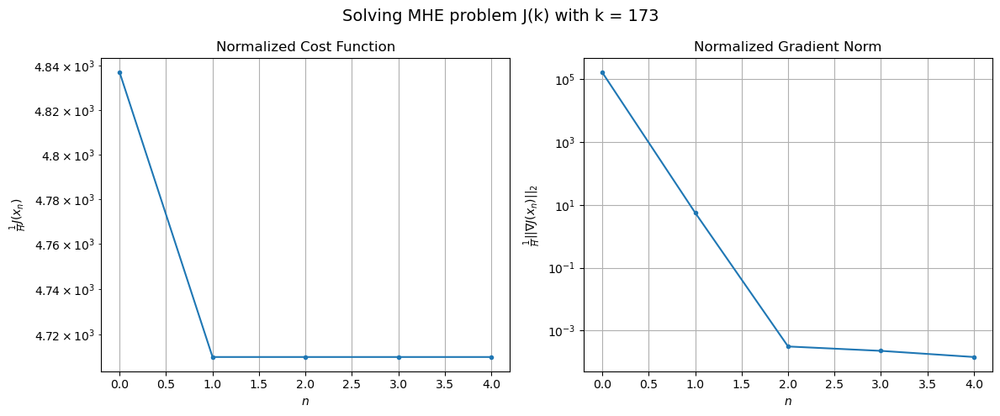

Windows:  40%|███▉      | 145/366 [1:21:34<1:33:42, 25.44s/it]

[Hybrid] Before applying the algorithm
Cost function: 142948.17448284727
Gradient norm: 4045828.800429466
Global estimation error: 26.805979930687727
Initial conditions estimation errors: 10.328155592439645 m, 9.327678783776827 m, 11.770133273630128 m, 19.655370095701244 m
Position estimation errors: 14.190391347478826 m, 22.30807347021211 m, 16.69699165498306 m, 56.604583728706864 m

[Hybrid] Iteration 1
Cost function: 139501.05639838596 (-2.41%)
Gradient norm: 2180.8620885493706 (-99.95%)
Global estimation error: 28.701659207443633 (7.07%)
Initial conditions estimation errors: 13.00570478229478 m, 12.45535459573972 m, 12.380560484354014 m, 18.60677189124174 m
Position estimation errors: 11.959333403100924 m, 13.576764367681905 m, 11.141617728871548 m, 24.90314182108473 m

[Hybrid] Iteration 2
Cost function: 139500.99560586674 (-0.00%)
Gradient norm: 171.23586360826877 (-92.15%)
Global estimation error: 28.559685367173383 (-0.49%)
Initial conditions estimation errors: 13.0057043265283

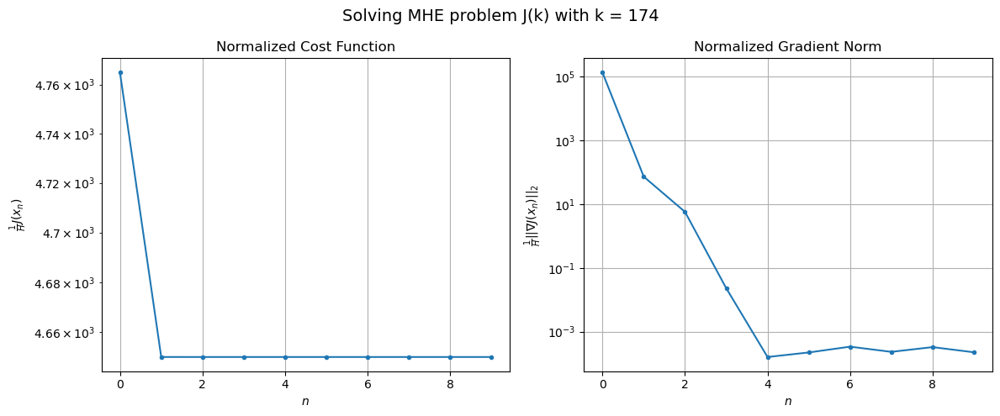

Windows:  40%|███▉      | 146/366 [1:22:14<1:49:10, 29.77s/it]

[Hybrid] Before applying the algorithm
Cost function: 139263.1524347499
Gradient norm: 3013210.67023895
Global estimation error: 24.851788730290643
Initial conditions estimation errors: 10.476839294379527 m, 10.273239669186973 m, 9.786149312956738 m, 17.507987720331386 m
Position estimation errors: 13.020131246625835 m, 12.726225825065775 m, 11.867518533039613 m, 16.659240702067173 m

[Hybrid] Iteration 1
Cost function: 136207.46280888963 (-2.19%)
Gradient norm: 735.4287817224895 (-99.98%)
Global estimation error: 27.688270236072892 (11.41%)
Initial conditions estimation errors: 13.162955999350183 m, 14.104837948049994 m, 12.376607792148105 m, 15.531903886421096 m
Position estimation errors: 11.20817120914551 m, 8.942343509754009 m, 12.757984745439796 m, 10.792809760490922 m

[Hybrid] Iteration 2
Cost function: 136207.4607122271 (-0.00%)
Gradient norm: 0.4134603244351659 (-99.94%)
Global estimation error: 27.663579717801095 (-0.09%)
Initial conditions estimation errors: 13.162955420359

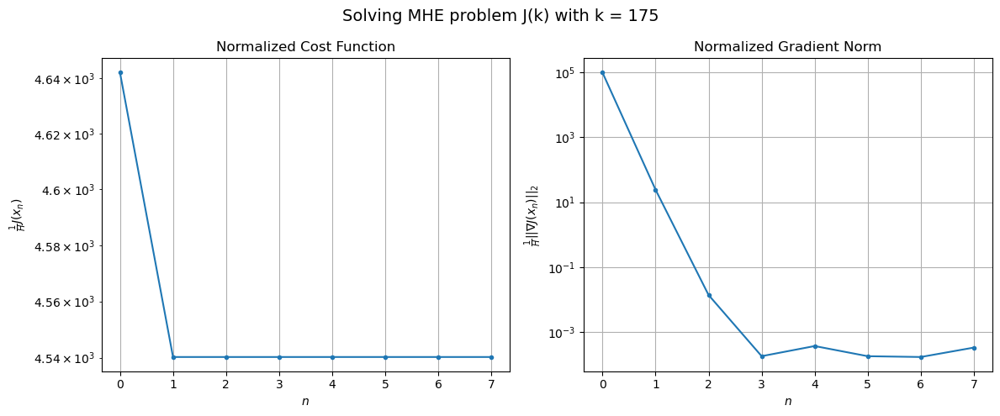

Windows:  40%|████      | 147/366 [1:22:45<1:50:04, 30.16s/it]

[Hybrid] Before applying the algorithm
Cost function: 134472.75033279875
Gradient norm: 2101272.1503607444
Global estimation error: 22.827253170155494
Initial conditions estimation errors: 10.583238000977016 m, 11.872979078305049 m, 9.982729521840579 m, 12.978703403873249 m
Position estimation errors: 12.166696902918748 m, 8.888094585034407 m, 14.018791073065364 m, 10.362421045548919 m

[Hybrid] Iteration 1
Cost function: 131644.38535009098 (-2.10%)
Gradient norm: 31.746854082671394 (-100.00%)
Global estimation error: 28.505296550777583 (24.87%)
Initial conditions estimation errors: 13.27045934808277 m, 14.637623937983609 m, 11.74429604050752 m, 16.859659891060925 m
Position estimation errors: 10.681392947464797 m, 6.8851610419314895 m, 11.920372212753849 m, 6.926354229301356 m

[Hybrid] Iteration 2
Cost function: 131644.3853132849 (-0.00%)
Gradient norm: 0.0637549320827495 (-99.80%)
Global estimation error: 28.542375215180872 (0.13%)
Initial conditions estimation errors: 13.2704588282

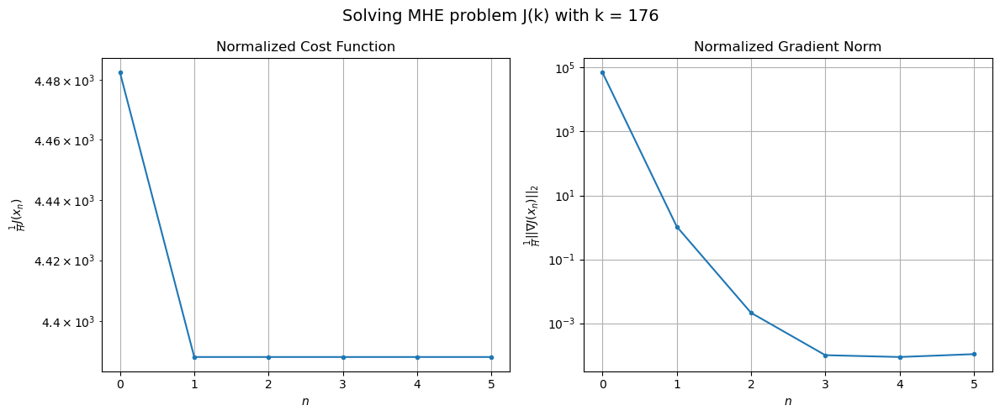

Windows:  40%|████      | 148/366 [1:23:10<1:43:40, 28.53s/it]

[Hybrid] Before applying the algorithm
Cost function: 129173.78950147766
Gradient norm: 1276379.6758256813
Global estimation error: 24.278331854124275
Initial conditions estimation errors: 10.70337320526995 m, 12.545714790096302 m, 9.575085975698956 m, 15.026269367802032 m
Position estimation errors: 11.69460150524916 m, 6.893008953775792 m, 13.453512451847573 m, 6.9056241451424025 m

[Hybrid] Iteration 1
Cost function: 126557.82995960963 (-2.03%)
Gradient norm: 180.87576958493767 (-99.99%)
Global estimation error: 25.394866476875105 (4.60%)
Initial conditions estimation errors: 13.337014500295528 m, 12.765875469646 m, 12.559463776705677 m, 12.09565724558795 m
Position estimation errors: 10.46879184910481 m, 8.863998593479275 m, 12.146804656115778 m, 14.038241697338384 m

[Hybrid] Iteration 2
Cost function: 126557.82932734245 (-0.00%)
Gradient norm: 0.5125716771981425 (-99.72%)
Global estimation error: 25.372882599716664 (-0.09%)
Initial conditions estimation errors: 13.33701409559127 

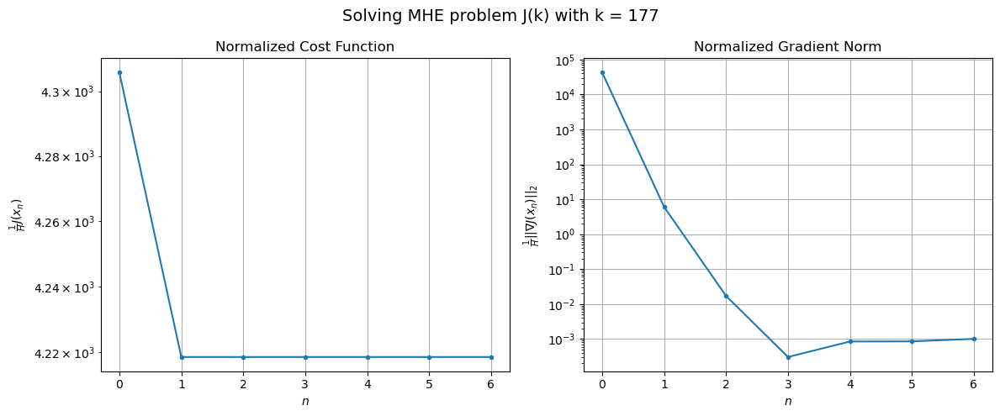

Windows:  41%|████      | 149/366 [1:23:40<1:45:08, 29.07s/it]

[Hybrid] Before applying the algorithm
Cost function: 124515.94503543542
Gradient norm: 1163901.857205494
Global estimation error: 20.362343111453452
Initial conditions estimation errors: 10.824166697652691 m, 10.254144753542702 m, 9.933440119134696 m, 9.676378218880826 m
Position estimation errors: 11.710556212161949 m, 9.778319858611189 m, 13.727005116511666 m, 15.1977319614243 m

[Hybrid] Iteration 1
Cost function: 122076.88581377687 (-1.96%)
Gradient norm: 1013.5303655232971 (-99.91%)
Global estimation error: 25.67812932391953 (26.11%)
Initial conditions estimation errors: 13.322043778176967 m, 12.030809315809647 m, 13.37997389115914 m, 12.574330662899357 m
Position estimation errors: 10.582525931751709 m, 15.34443858717652 m, 10.476422589080544 m, 33.04412128922623 m

[Hybrid] Iteration 2
Cost function: 122076.88183097339 (-0.00%)
Gradient norm: 0.22433570949168102 (-99.98%)
Global estimation error: 25.635044111208217 (-0.17%)
Initial conditions estimation errors: 13.3220435025044

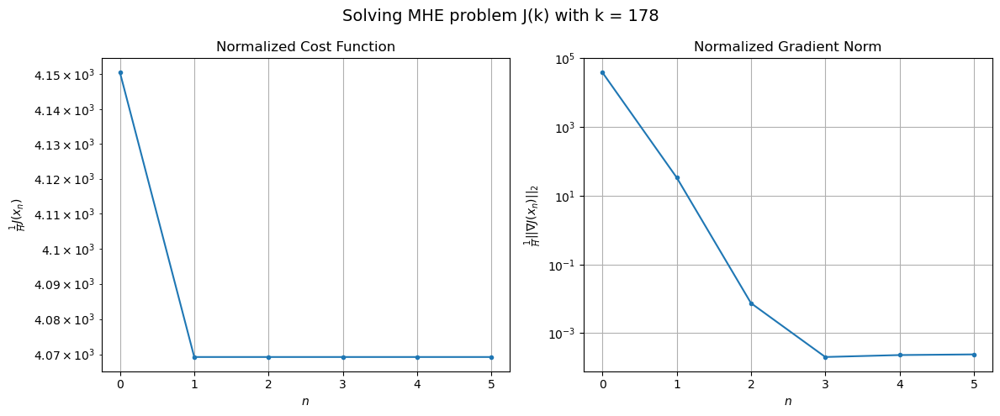

Windows:  41%|████      | 150/366 [1:24:05<1:39:40, 27.69s/it]

[Hybrid] Before applying the algorithm
Cost function: 120537.14809858636
Gradient norm: 1878710.457824557
Global estimation error: 21.48341983953106
Initial conditions estimation errors: 10.885372445864245 m, 9.672173684548122 m, 10.831066583193342 m, 11.496646733943887 m
Position estimation errors: 12.172660379493706 m, 16.708766572782864 m, 11.521048970470098 m, 33.719080190368295 m

[Hybrid] Iteration 1
Cost function: 118053.88826707151 (-2.06%)
Gradient norm: 9.212711316421208 (-100.00%)
Global estimation error: 28.04562275481856 (30.55%)
Initial conditions estimation errors: 13.29440114499766 m, 11.952173592287668 m, 15.023450608414036 m, 15.5320838098079 m
Position estimation errors: 10.957885137373736 m, 15.891831366472811 m, 10.415891725786807 m, 30.84480693059958 m

[Hybrid] Iteration 2
Cost function: 118053.88824968577 (-0.00%)
Gradient norm: 0.009759425744918384 (-99.89%)
Global estimation error: 28.045299284986967 (-0.00%)
Initial conditions estimation errors: 13.2944010256

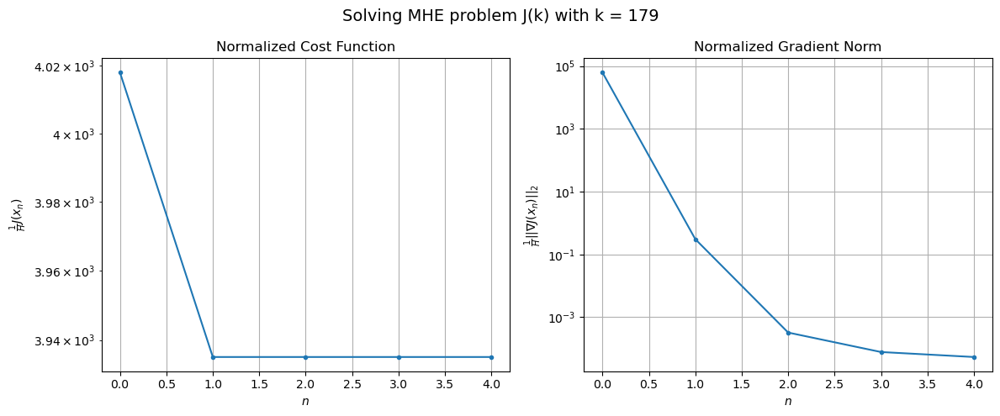

Windows:  41%|████▏     | 151/366 [1:24:26<1:32:57, 25.94s/it]

[Hybrid] Before applying the algorithm
Cost function: 117831.94902622627
Gradient norm: 2740390.5613094275
Global estimation error: 24.06701134087922
Initial conditions estimation errors: 10.941267894607273 m, 9.574689278533667 m, 12.426432001766518 m, 14.608508457042527 m
Position estimation errors: 12.925519461200965 m, 17.52037706969127 m, 11.391225086837977 m, 31.69190114134053 m

[Hybrid] Iteration 1
Cost function: 115370.76107653228 (-2.09%)
Gradient norm: 89.77549536431393 (-100.00%)
Global estimation error: 26.202049172442138 (8.87%)
Initial conditions estimation errors: 13.16185766308554 m, 10.178080799638883 m, 15.811106798050671 m, 12.63792361851972 m
Position estimation errors: 11.537183958764958 m, 19.875693343653943 m, 10.503435102412134 m, 37.78140330771702 m

[Hybrid] Iteration 2
Cost function: 115370.7606461278 (-0.00%)
Gradient norm: 0.49575213109827837 (-99.45%)
Global estimation error: 26.170616065619058 (-0.12%)
Initial conditions estimation errors: 13.161857715463

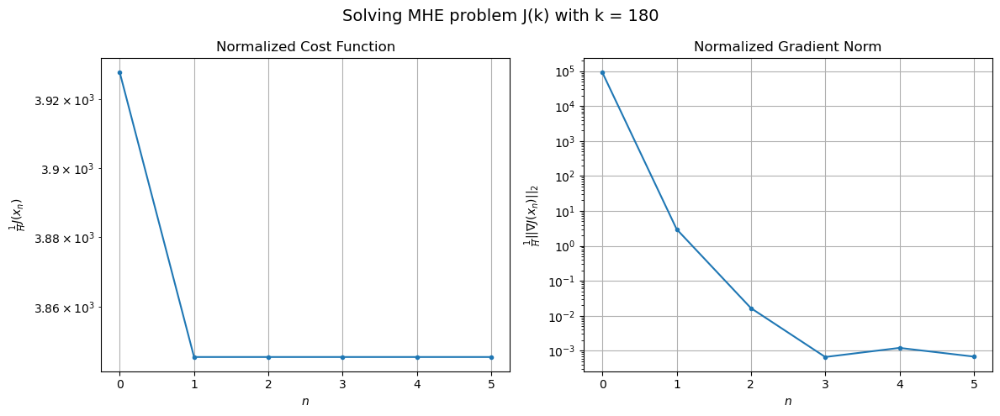

Windows:  42%|████▏     | 152/366 [1:24:55<1:35:12, 26.69s/it]

[Hybrid] Before applying the algorithm
Cost function: 116095.38163193715
Gradient norm: 3528394.8037114087
Global estimation error: 22.342978895672548
Initial conditions estimation errors: 10.889598329729148 m, 7.979420688308073 m, 13.080383959136151 m, 12.07674172254904 m
Position estimation errors: 13.833683270649201 m, 21.64128440321225 m, 11.162938468988095 m, 38.57614670639539 m

[Hybrid] Iteration 1
Cost function: 113484.97339304035 (-2.25%)
Gradient norm: 42.01959096925691 (-100.00%)
Global estimation error: 24.483325061625152 (9.58%)
Initial conditions estimation errors: 12.99597413809544 m, 9.119085805216326 m, 15.105532935082381 m, 10.917539562959453 m
Position estimation errors: 12.212635373272816 m, 19.653779919166233 m, 10.094723340224489 m, 34.142637610745616 m

[Hybrid] Iteration 2
Cost function: 113484.97335917389 (-0.00%)
Gradient norm: 0.033713600540975386 (-99.92%)
Global estimation error: 24.461924403659143 (-0.09%)
Initial conditions estimation errors: 12.995974308

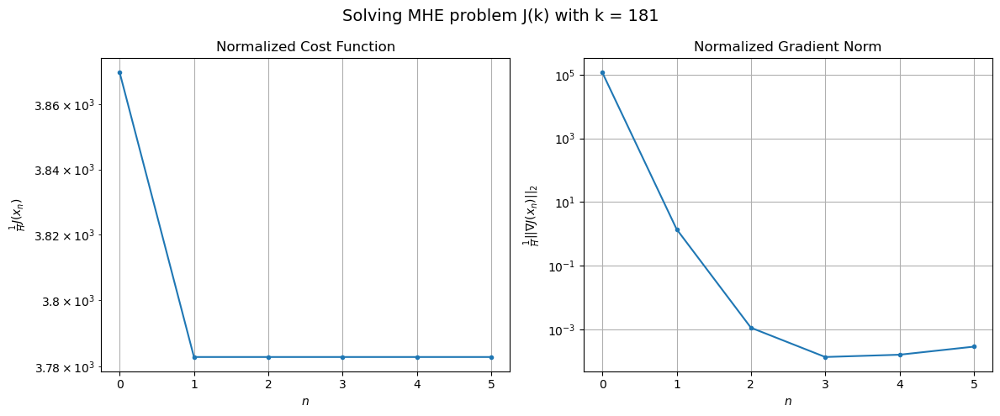

Windows:  42%|████▏     | 153/366 [1:25:21<1:34:36, 26.65s/it]

[Hybrid] Before applying the algorithm
Cost function: 115704.5860902366
Gradient norm: 4220989.652493204
Global estimation error: 20.74021473991699
Initial conditions estimation errors: 10.784834801795181 m, 7.250900388030714 m, 12.538031172153811 m, 10.200818806887332 m
Position estimation errors: 14.763827224949022 m, 21.92580558737199 m, 11.25902352281033 m, 35.89802695674032 m

[Hybrid] Iteration 1
Cost function: 112919.20107672171 (-2.41%)
Gradient norm: 1150.0662344322768 (-99.97%)
Global estimation error: 21.727716180310765 (4.76%)
Initial conditions estimation errors: 12.744882591249239 m, 8.28640380859009 m, 12.613124059330833 m, 9.049655777661815 m
Position estimation errors: 12.856713811016713 m, 13.390244029039378 m, 13.952058178371315 m, 16.758066967430807 m

[Hybrid] Iteration 2
Cost function: 112919.1933633238 (-0.00%)
Gradient norm: 2.4546808750005695 (-99.79%)
Global estimation error: 21.623792248457864 (-0.48%)
Initial conditions estimation errors: 12.744882892739797 

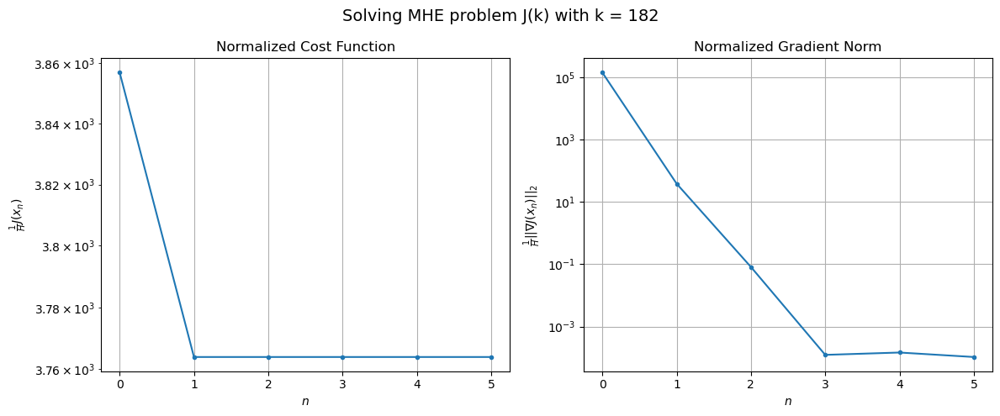

Windows:  42%|████▏     | 154/366 [1:25:49<1:35:29, 27.03s/it]

[Hybrid] Before applying the algorithm
Cost function: 116688.31482969294
Gradient norm: 4753344.531660991
Global estimation error: 17.807664381534735
Initial conditions estimation errors: 10.593108970569558 m, 6.607226824589432 m, 10.139206763749966 m, 7.643999910473125 m
Position estimation errors: 15.576092548811586 m, 15.830133780988096 m, 16.383742700736832 m, 18.82606141175682 m

[Hybrid] Iteration 1
Cost function: 113797.96210133434 (-2.48%)
Gradient norm: 94.9941691669391 (-100.00%)
Global estimation error: 28.502111111912892 (60.06%)
Initial conditions estimation errors: 12.386388015925013 m, 9.989844907234085 m, 12.4700426128521 m, 20.090746236849764 m
Position estimation errors: 13.422222469937278 m, 12.421956049042768 m, 13.158619978074112 m, 10.952987028105147 m

[Hybrid] Iteration 2
Cost function: 113797.96163931186 (-0.00%)
Gradient norm: 0.08598238924873744 (-99.91%)
Global estimation error: 28.314453938572225 (-0.66%)
Initial conditions estimation errors: 12.38638831793

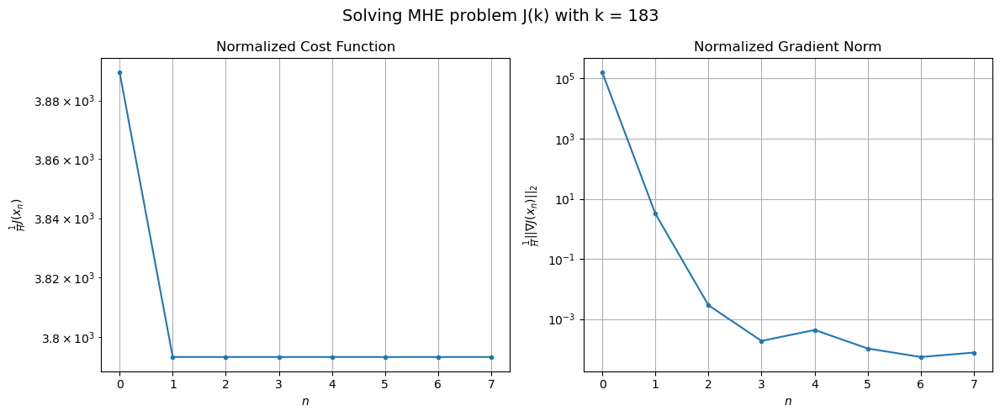

Windows:  42%|████▏     | 155/366 [1:26:20<1:38:54, 28.13s/it]

[Hybrid] Before applying the algorithm
Cost function: 119462.47449913957
Gradient norm: 5187266.971561046
Global estimation error: 24.249335314783355
Initial conditions estimation errors: 10.3096003720111 m, 8.004072912186516 m, 10.307826523016182 m, 17.646979569137027 m
Position estimation errors: 16.217512424297237 m, 15.166902643545177 m, 15.60663248544449 m, 13.200646491611428 m

[Hybrid] Iteration 1
Cost function: 116454.83489822673 (-2.52%)
Gradient norm: 260.5667889828334 (-99.99%)
Global estimation error: 32.328186340620945 (33.32%)
Initial conditions estimation errors: 11.931041886071547 m, 12.141137077961343 m, 8.367831287643195 m, 26.178677232707155 m
Position estimation errors: 13.821093006304302 m, 11.775456535304674 m, 16.897177084567076 m, 15.633048950042642 m

[Hybrid] Iteration 2
Cost function: 116454.83434298793 (-0.00%)
Gradient norm: 0.07180396048873017 (-99.97%)
Global estimation error: 32.40998625032129 (0.25%)
Initial conditions estimation errors: 11.931042168040

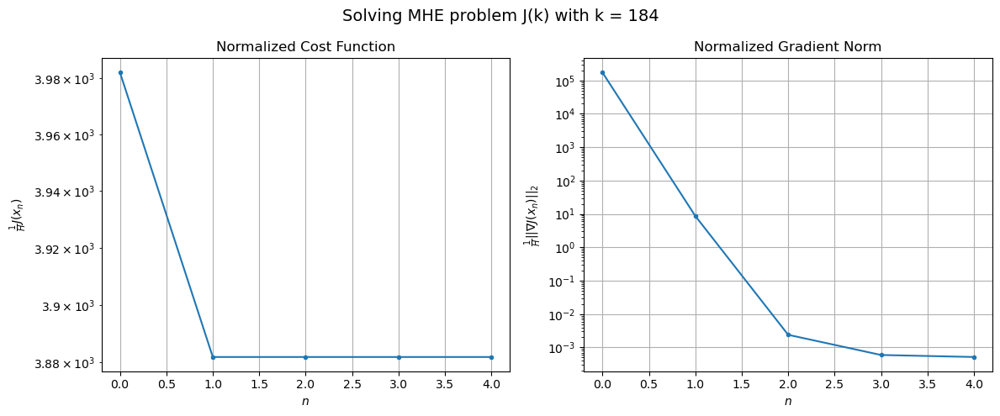

Windows:  43%|████▎     | 156/366 [1:26:46<1:36:00, 27.43s/it]

[Hybrid] Before applying the algorithm
Cost function: 123198.05757569983
Gradient norm: 5313793.410300636
Global estimation error: 28.542814135481496
Initial conditions estimation errors: 9.970957284684413 m, 10.424374968243772 m, 7.552691844649543 m, 23.44250354967762 m
Position estimation errors: 16.58720699845342 m, 14.529337383495543 m, 20.080774460719994 m, 16.195892122259714 m

[Hybrid] Iteration 1
Cost function: 120161.3859147361 (-2.46%)
Gradient norm: 72.54413436059177 (-100.00%)
Global estimation error: 38.38735306995624 (34.49%)
Initial conditions estimation errors: 11.486730303066 m, 13.754525711380696 m, 8.272745074793887 m, 32.92425567107449 m
Position estimation errors: 14.06602720902912 m, 11.653022773788686 m, 18.540925909604848 m, 22.357211678473536 m

[Hybrid] Iteration 2
Cost function: 120161.38576554616 (-0.00%)
Gradient norm: 0.08855884614451819 (-99.88%)
Global estimation error: 38.03099005688708 (-0.93%)
Initial conditions estimation errors: 11.48673048893646 m,

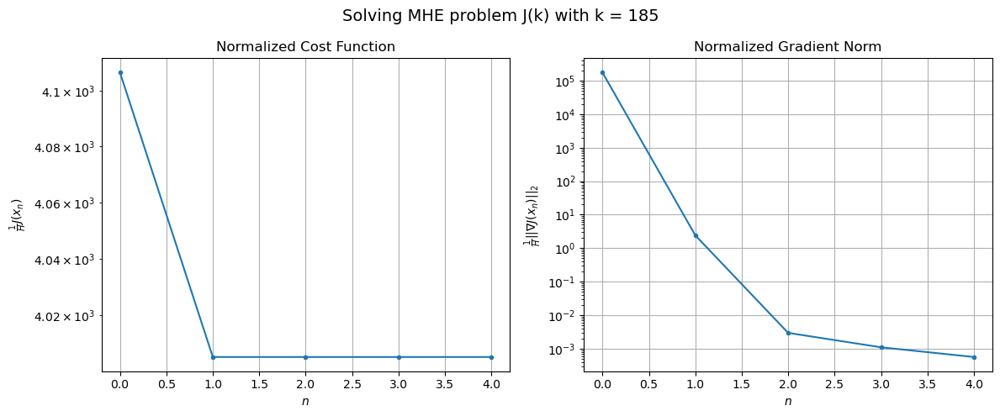

Windows:  43%|████▎     | 157/366 [1:27:11<1:33:32, 26.85s/it]

[Hybrid] Before applying the algorithm
Cost function: 127673.10507542362
Gradient norm: 5422945.420114798
Global estimation error: 33.79552463172388
Initial conditions estimation errors: 9.69492131091938 m, 11.745317430291184 m, 7.717573270972158 m, 29.165407989552516 m
Position estimation errors: 16.738677967017296 m, 14.06139105440721 m, 21.72087922969799 m, 21.863007983149707 m

[Hybrid] Iteration 1
Cost function: 124580.55787449368 (-2.42%)
Gradient norm: 381.5145312630699 (-99.99%)
Global estimation error: 55.651632328494486 (64.67%)
Initial conditions estimation errors: 11.139185855823717 m, 18.480801704162833 m, 9.817815148572954 m, 50.34959748648282 m
Position estimation errors: 14.085368344940036 m, 12.395436803990059 m, 16.07078184737763 m, 21.93688859500482 m

[Hybrid] Iteration 2
Cost function: 124580.55537840431 (-0.00%)
Gradient norm: 0.5163000485066105 (-99.86%)
Global estimation error: 54.719409274889024 (-1.68%)
Initial conditions estimation errors: 11.139185886778918 

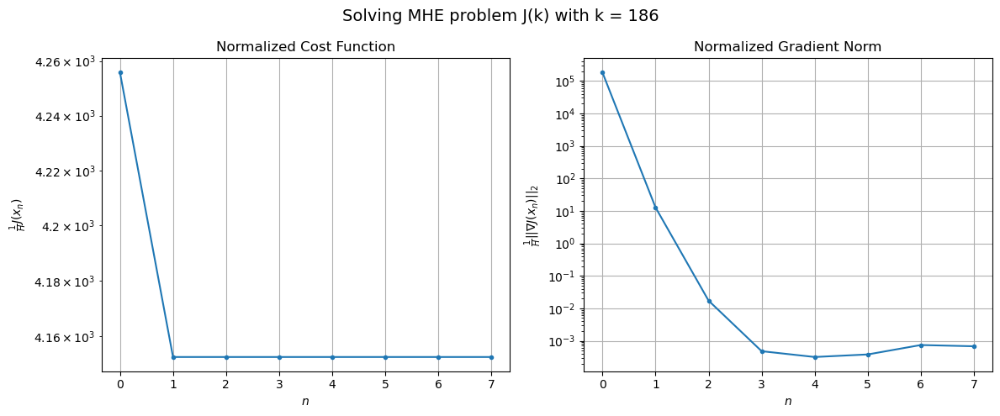

Windows:  43%|████▎     | 158/366 [1:27:53<1:48:09, 31.20s/it]

[Hybrid] Before applying the algorithm
Cost function: 132334.16709079884
Gradient norm: 5264185.526106617
Global estimation error: 51.16574008619416
Initial conditions estimation errors: 9.582976294142723 m, 16.487572112543347 m, 9.620555826237736 m, 46.49401690104574 m
Position estimation errors: 16.66313925105764 m, 14.674517756369466 m, 19.335014947017832 m, 22.317163889765 m

[Hybrid] Iteration 1
Cost function: 129271.01367958225 (-2.31%)
Gradient norm: 12.542580907790503 (-100.00%)
Global estimation error: 54.4243298007809 (6.37%)
Initial conditions estimation errors: 11.02332308233985 m, 19.67417874965897 m, 10.528159039094009 m, 48.4000788726886 m
Position estimation errors: 13.97223043209946 m, 12.509443961967186 m, 16.18852530871776 m, 22.943000984376976 m

[Hybrid] Iteration 2
Cost function: 129271.01366313906 (-0.00%)
Gradient norm: 0.009483137061592897 (-99.92%)
Global estimation error: 54.54943443218158 (0.23%)
Initial conditions estimation errors: 11.023322947854377 m, 19

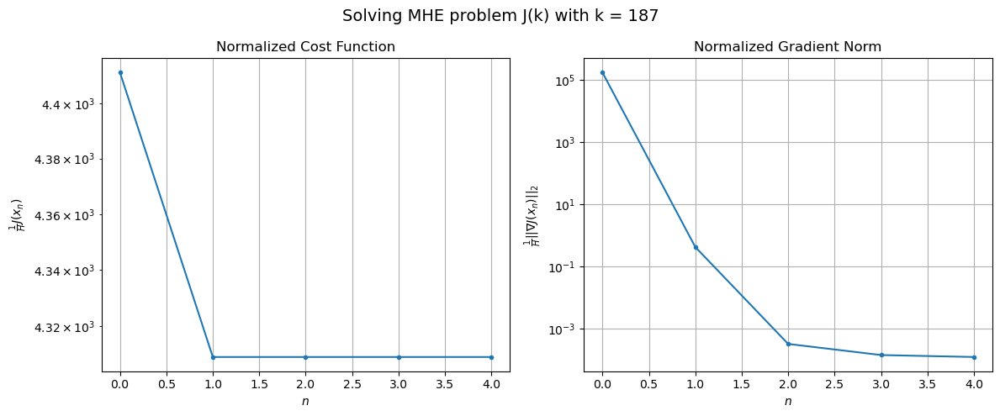

Windows:  43%|████▎     | 159/366 [1:28:12<1:35:34, 27.70s/it]

[Hybrid] Before applying the algorithm
Cost function: 136872.22134205946
Gradient norm: 5029848.429412475
Global estimation error: 51.052571986839595
Initial conditions estimation errors: 9.714166104863732 m, 18.044587484589712 m, 10.78755426091886 m, 45.49737466129897 m
Position estimation errors: 16.52606365057513 m, 14.586828841587876 m, 19.497283883721256 m, 22.910049982345626 m

[Hybrid] Iteration 1
Cost function: 133845.04707685427 (-2.21%)
Gradient norm: 81.20546335877553 (-100.00%)
Global estimation error: 39.97193497302868 (-21.70%)
Initial conditions estimation errors: 11.238027005367869 m, 15.950543782731408 m, 10.353942958505542 m, 33.314091246328516 m
Position estimation errors: 13.846006527720295 m, 13.078612883006935 m, 18.117504288661774 m, 16.895170185883337 m

[Hybrid] Iteration 2
Cost function: 133845.0466417714 (-0.00%)
Gradient norm: 0.1924011121558297 (-99.76%)
Global estimation error: 40.1125576672691 (0.35%)
Initial conditions estimation errors: 11.2380267166635

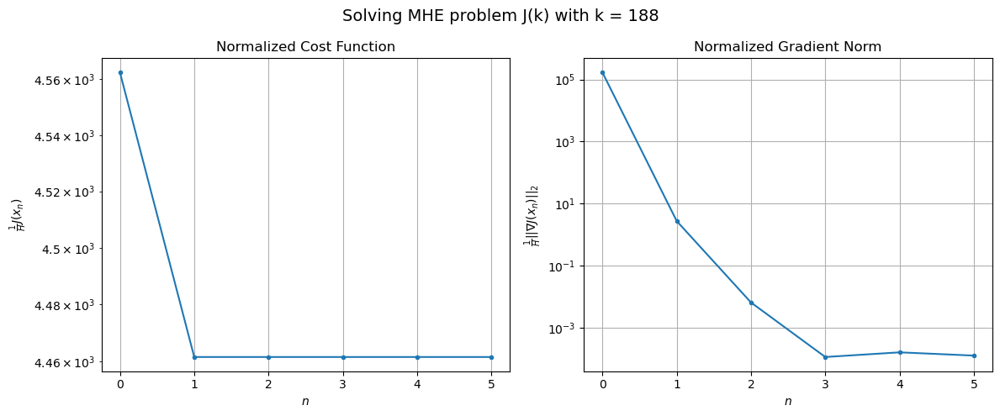

Windows:  44%|████▎     | 160/366 [1:28:37<1:32:05, 26.82s/it]

[Hybrid] Before applying the algorithm
Cost function: 141151.15035355624
Gradient norm: 4820199.721087521
Global estimation error: 36.996738576213
Initial conditions estimation errors: 10.109372472175084 m, 14.550438550933066 m, 10.457983677477543 m, 30.748417949948124 m
Position estimation errors: 16.45966708070872 m, 15.365809734573322 m, 21.54126189795097 m, 16.412512319292006 m

[Hybrid] Iteration 1
Cost function: 137922.41501299545 (-2.29%)
Gradient norm: 761.9038577760434 (-99.98%)
Global estimation error: 51.40241253431862 (38.94%)
Initial conditions estimation errors: 11.85182002519974 m, 18.378723431494176 m, 12.416419859734274 m, 44.83067506217708 m
Position estimation errors: 13.741169125648332 m, 16.101977804992558 m, 14.123436137803303 m, 10.341358445103694 m

[Hybrid] Iteration 2
Cost function: 137922.4111539294 (-0.00%)
Gradient norm: 0.5246479129213134 (-99.93%)
Global estimation error: 52.282689388711546 (1.71%)
Initial conditions estimation errors: 11.851819656606857 

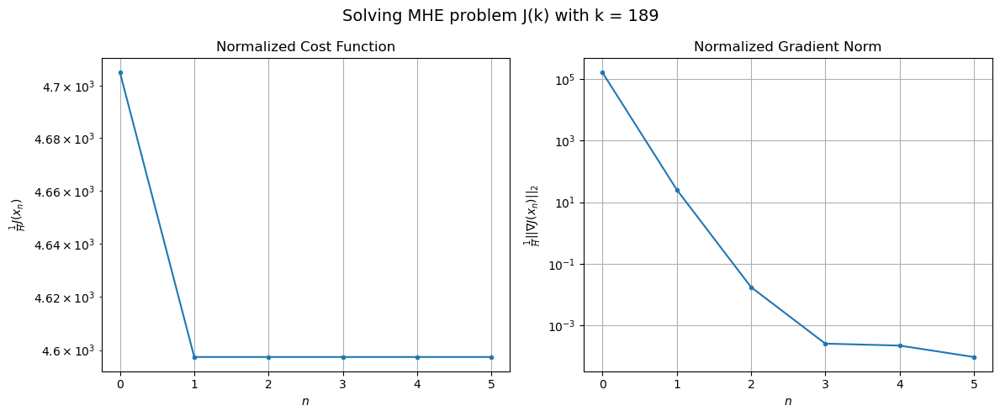

Windows:  44%|████▍     | 161/366 [1:29:02<1:29:31, 26.20s/it]

[Hybrid] Before applying the algorithm
Cost function: 144340.34623116354
Gradient norm: 4548620.598650655
Global estimation error: 49.94961238082122
Initial conditions estimation errors: 10.730647838383325 m, 17.30059444208887 m, 12.513342676062127 m, 43.86245228869362 m
Position estimation errors: 16.442468137193796 m, 18.51231318730977 m, 17.448611637765133 m, 11.285941352778533 m

[Hybrid] Iteration 1
Cost function: 140852.25781523628 (-2.42%)
Gradient norm: 48.80137650047845 (-100.00%)
Global estimation error: 64.05653397013323 (28.24%)
Initial conditions estimation errors: 12.795963035680236 m, 21.255147571640627 m, 15.233318919234243 m, 57.05838656214324 m
Position estimation errors: 13.735548558428535 m, 15.762542093347966 m, 17.292808029371745 m, 14.018516726148665 m

[Hybrid] Iteration 2
Cost function: 140852.25770064595 (-0.00%)
Gradient norm: 0.004813799337908875 (-99.99%)
Global estimation error: 64.04229222132516 (-0.02%)
Initial conditions estimation errors: 12.7959627568

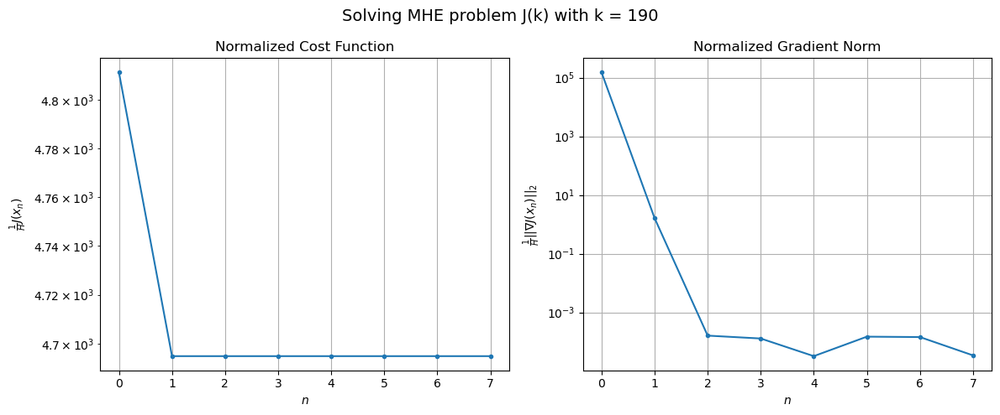

Windows:  44%|████▍     | 162/366 [1:29:36<1:37:32, 28.69s/it]

[Hybrid] Before applying the algorithm
Cost function: 146710.34919250576
Gradient norm: 4256298.370750325
Global estimation error: 61.29434463461697
Initial conditions estimation errors: 11.468509585566864 m, 19.60444793404912 m, 15.120877717785906 m, 54.88611894218083 m
Position estimation errors: 16.513640824656616 m, 18.249397765796186 m, 21.00629719953628 m, 14.59849630453948 m

[Hybrid] Iteration 1
Cost function: 142848.66972142685 (-2.63%)
Gradient norm: 582.4188611346938 (-99.99%)
Global estimation error: 43.059511927865174 (-29.75%)
Initial conditions estimation errors: 13.889564822198269 m, 13.251902701525488 m, 12.086097754595095 m, 36.59925814798682 m
Position estimation errors: 13.809321607372738 m, 14.39240951202527 m, 17.43860484241012 m, 13.99999060022132 m

[Hybrid] Iteration 2
Cost function: 142848.66158404425 (-0.00%)
Gradient norm: 1.4303504067045179 (-99.75%)
Global estimation error: 44.335146818349074 (2.96%)
Initial conditions estimation errors: 13.889564677725254

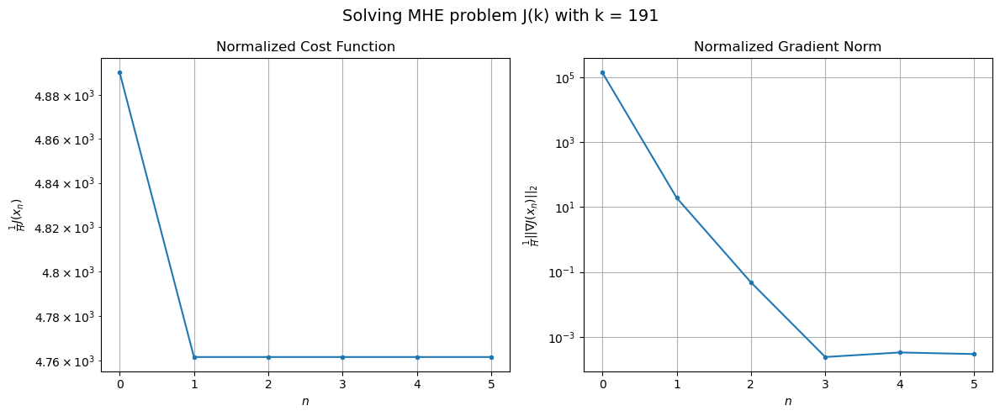

Windows:  45%|████▍     | 163/366 [1:30:02<1:34:25, 27.91s/it]

[Hybrid] Before applying the algorithm
Cost function: 146992.09953904475
Gradient norm: 3973326.00200222
Global estimation error: 40.38357258483088
Initial conditions estimation errors: 12.183760364373045 m, 11.682553684814883 m, 10.171354716522666 m, 35.24826707468726 m
Position estimation errors: 16.64702458563587 m, 17.218690029518342 m, 20.44399452844872 m, 13.565656889553104 m

[Hybrid] Iteration 1
Cost function: 142780.41615315166 (-2.87%)
Gradient norm: 2088.955604834975 (-99.95%)
Global estimation error: 103.88999814943084 (157.26%)
Initial conditions estimation errors: 14.948206496268146 m, 30.34239998266364 m, 15.24841332336693 m, 97.03863744253874 m
Position estimation errors: 13.990126058859312 m, 11.751337355571394 m, 13.395209952108774 m, 27.887326046727345 m

[Hybrid] Iteration 2
Cost function: 142780.25284540802 (-0.00%)
Gradient norm: 79.04566423354858 (-96.22%)
Global estimation error: 91.55805937303575 (-11.87%)
Initial conditions estimation errors: 14.94820669070368

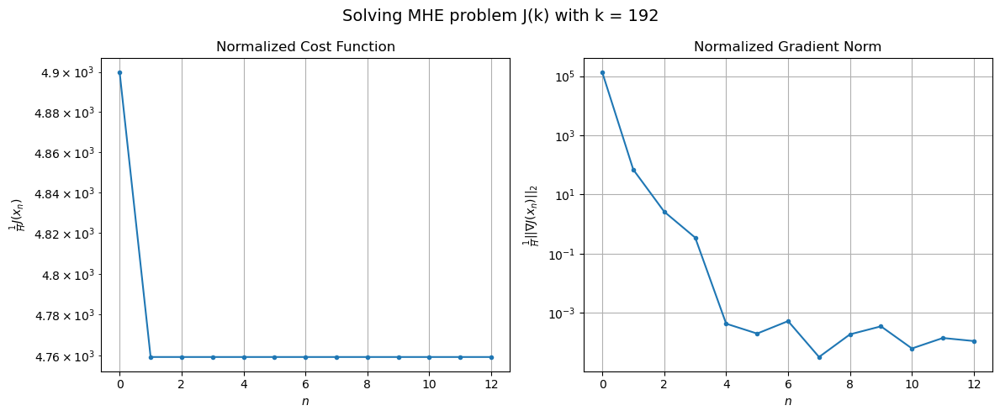

Windows:  45%|████▍     | 164/366 [1:30:52<1:55:49, 34.40s/it]

[Hybrid] Before applying the algorithm
Cost function: 145928.2387233328
Gradient norm: 3787426.2349367104
Global estimation error: 83.87318714846903
Initial conditions estimation errors: 12.790901837031102 m, 23.236743747555387 m, 11.392542589956594 m, 78.74869123886087 m
Position estimation errors: 16.892710327854388 m, 13.983625962941652 m, 17.118786486828597 m, 25.124402100827577 m

[Hybrid] Iteration 1
Cost function: 141191.88883146812 (-3.25%)
Gradient norm: 621.6498305021071 (-99.98%)
Global estimation error: 60.90866431274923 (-27.38%)
Initial conditions estimation errors: 15.89265671537539 m, 22.309285190065662 m, 12.940191905774897 m, 52.8405230524456 m
Position estimation errors: 14.221348662129813 m, 9.827306474870698 m, 14.925385692585245 m, 25.61764774771368 m

[Hybrid] Iteration 2
Cost function: 141191.84489705777 (-0.00%)
Gradient norm: 117.32694107562207 (-81.13%)
Global estimation error: 48.95696421992046 (-19.62%)
Initial conditions estimation errors: 15.8926570540352

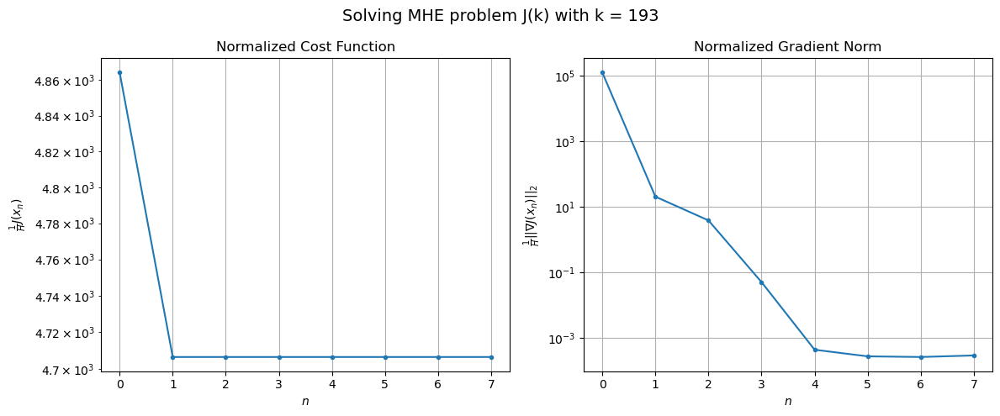

Windows:  45%|████▌     | 165/366 [1:31:24<1:53:11, 33.79s/it]

[Hybrid] Before applying the algorithm
Cost function: 143525.50875043383
Gradient norm: 3571933.098323159
Global estimation error: 41.75207910241973
Initial conditions estimation errors: 13.280866726622596 m, 15.14096912477998 m, 11.239418508535941 m, 34.80322358193506 m
Position estimation errors: 17.20270628599935 m, 12.225133812403502 m, 18.953544951439042 m, 20.215018640607703 m

[Hybrid] Iteration 1
Cost function: 138339.70219951303 (-3.61%)
Gradient norm: 200.0450174187619 (-99.99%)
Global estimation error: 42.49399394081604 (1.78%)
Initial conditions estimation errors: 16.64000850504984 m, 15.086819343431387 m, 19.55447028468841 m, 30.31238160496 m
Position estimation errors: 14.514882606452007 m, 8.242107324062816 m, 11.866249190941028 m, 26.57743003071405 m

[Hybrid] Iteration 2
Cost function: 138339.7014129097 (-0.00%)
Gradient norm: 0.19435798340320037 (-99.90%)
Global estimation error: 42.873354737056665 (0.89%)
Initial conditions estimation errors: 16.64000873866022 m, 15.

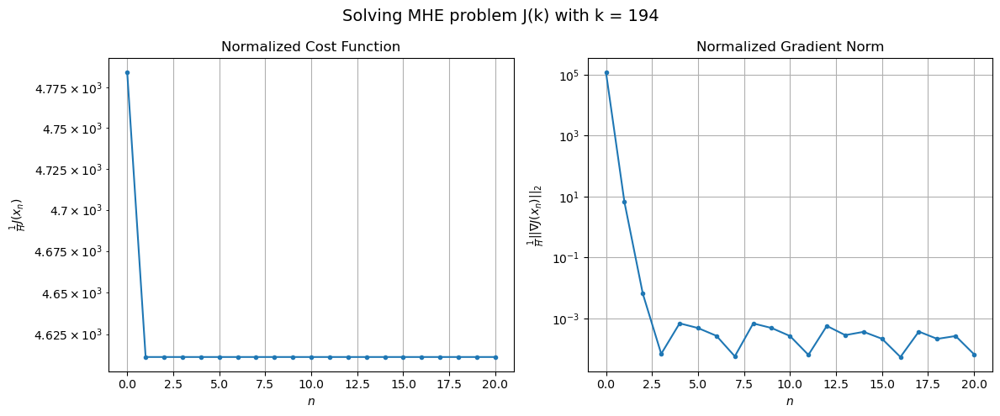

Windows:  45%|████▌     | 166/366 [1:32:45<2:40:04, 48.02s/it]

[Hybrid] Before applying the algorithm
Cost function: 140202.6115020511
Gradient norm: 3458329.148969484
Global estimation error: 35.94840692506903
Initial conditions estimation errors: 13.61538034244576 m, 11.888613720848104 m, 16.93041627161062 m, 26.05590674903105 m
Position estimation errors: 17.586024232351424 m, 10.59006583799009 m, 14.466562323065201 m, 24.395051132606724 m

[Hybrid] Iteration 1
Cost function: 134576.85350209646 (-4.01%)
Gradient norm: 2134.9564421971813 (-99.94%)
Global estimation error: 48.97719386682368 (36.24%)
Initial conditions estimation errors: 17.17665524144699 m, 14.831554346500107 m, 33.30208216333364 m, 27.833413680773944 m
Position estimation errors: 14.859812584538217 m, 7.32662595295713 m, 22.49264568634859 m, 19.058010018330805 m

[Hybrid] Iteration 2
Cost function: 134576.74187115888 (-0.00%)
Gradient norm: 126.49984769440799 (-94.07%)
Global estimation error: 41.12430111643388 (-16.03%)
Initial conditions estimation errors: 17.176655329187458 m

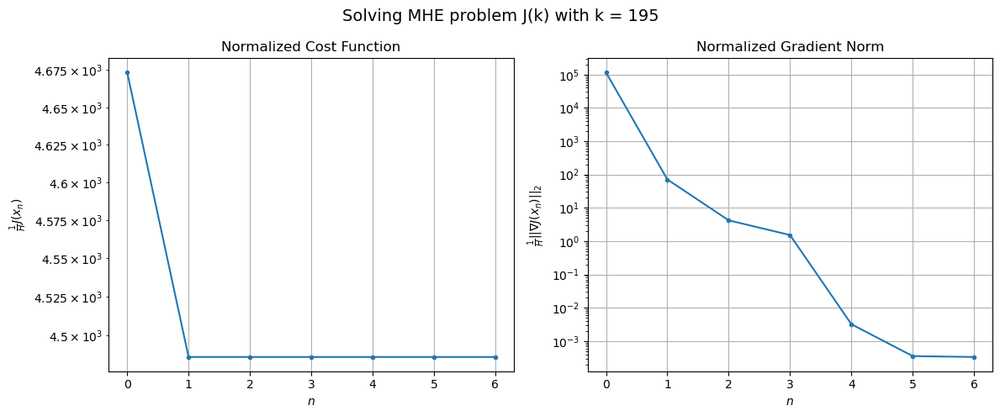

Windows:  46%|████▌     | 167/366 [1:33:18<2:23:49, 43.36s/it]

[Hybrid] Before applying the algorithm
Cost function: 136038.0890436908
Gradient norm: 3309523.784018912
Global estimation error: 33.75998970992638
Initial conditions estimation errors: 13.807982781395715 m, 10.764315825502976 m, 24.900811488282116 m, 14.59899643432659 m
Position estimation errors: 18.022457388045268 m, 7.941692666772097 m, 21.743275078935827 m, 19.692975137534955 m

[Hybrid] Iteration 1
Cost function: 130047.33789989966 (-4.40%)
Gradient norm: 310.4959374389964 (-99.99%)
Global estimation error: 55.506100915775924 (64.41%)
Initial conditions estimation errors: 17.5022317045263 m, 15.986453648503423 m, 39.177475444371815 m, 31.37086948105497 m
Position estimation errors: 15.252583753471372 m, 6.361136627083856 m, 14.952387074135432 m, 9.837641940357281 m

[Hybrid] Iteration 2
Cost function: 130047.32339234542 (-0.00%)
Gradient norm: 81.96395436092293 (-73.60%)
Global estimation error: 63.267953606621994 (13.98%)
Initial conditions estimation errors: 17.502231817575428 

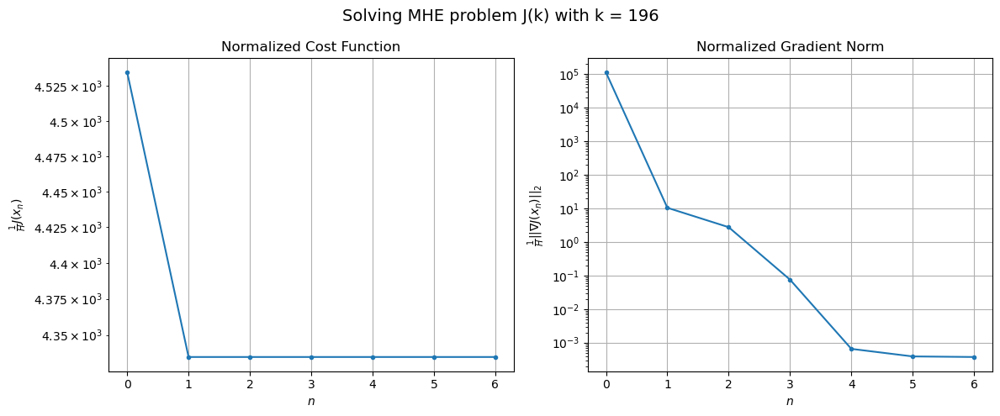

Windows:  46%|████▌     | 168/366 [1:33:48<2:09:54, 39.36s/it]

[Hybrid] Before applying the algorithm
Cost function: 132376.77297991776
Gradient norm: 3268604.196398193
Global estimation error: 64.7251209832238
Initial conditions estimation errors: 13.892660583620021 m, 19.762476601423355 m, 42.166484996224014 m, 42.75210153169796 m
Position estimation errors: 18.496446835546863 m, 9.864960049891662 m, 17.628690325899534 m, 7.7535185413593934 m

[Hybrid] Iteration 1
Cost function: 126138.39263464471 (-4.71%)
Gradient norm: 2898.686998569797 (-99.91%)
Global estimation error: 41.06187208681379 (-36.56%)
Initial conditions estimation errors: 17.59900227105139 m, 11.87130048969568 m, 32.1691453149361 m, 14.161407296358082 m
Position estimation errors: 15.619794112846494 m, 11.850538526828423 m, 1.4494936521294757 m, 8.038108283556145 m

[Hybrid] Iteration 2
Cost function: 126138.30320435643 (-0.00%)
Gradient norm: 87.40715528842536 (-96.98%)
Global estimation error: 46.229989035138914 (12.59%)
Initial conditions estimation errors: 17.59900220057652 m

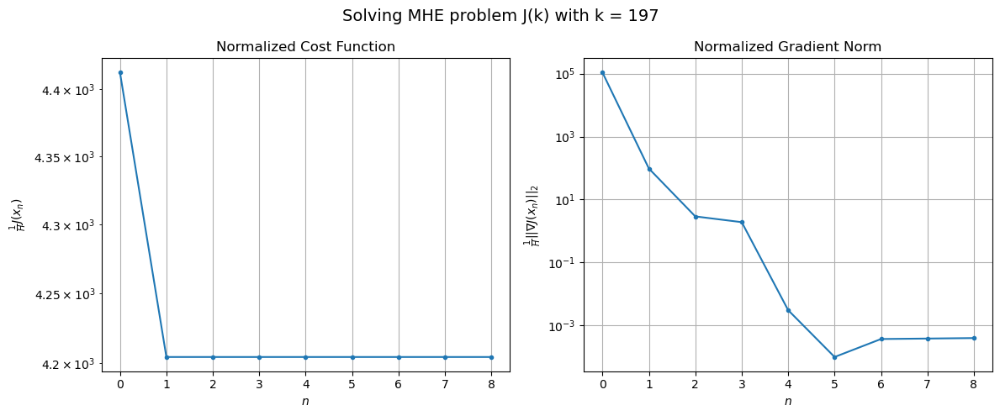

Windows:  46%|████▌     | 169/366 [1:34:24<2:05:36, 38.25s/it]

[Hybrid] Before applying the algorithm
Cost function: 128466.2239257842
Gradient norm: 3105656.496473975
Global estimation error: 48.86235803422496
Initial conditions estimation errors: 13.898122232715192 m, 13.494732749026628 m, 35.82164346267512 m, 27.000952159685077 m
Position estimation errors: 18.91649539418273 m, 15.325635720354311 m, 6.22493528910747 m, 15.840919786385955 m

[Hybrid] Iteration 1
Cost function: 122246.11680612288 (-4.84%)
Gradient norm: 422.2207232927107 (-99.99%)
Global estimation error: 55.38758721122739 (13.35%)
Initial conditions estimation errors: 17.54485021020582 m, 17.08858057275451 m, 34.19563264049498 m, 36.03575275713908 m
Position estimation errors: 16.019435199612932 m, 12.091723725984785 m, 17.191233068665877 m, 14.482016091329474 m

[Hybrid] Iteration 2
Cost function: 122246.11496235807 (-0.00%)
Gradient norm: 14.684637285449119 (-96.52%)
Global estimation error: 58.62399214825435 (5.84%)
Initial conditions estimation errors: 17.544849969259754 m, 

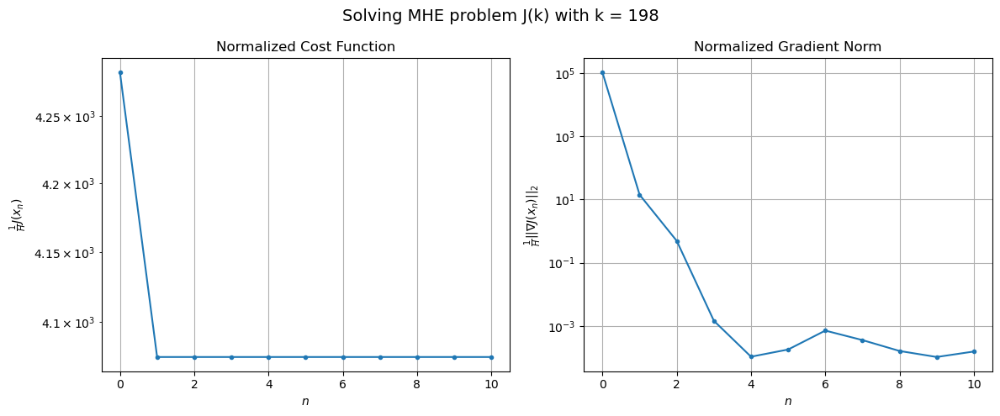

Windows:  46%|████▋     | 170/366 [1:35:06<2:09:16, 39.57s/it]

[Hybrid] Before applying the algorithm
Cost function: 125547.10242616384
Gradient norm: 3104697.229793429
Global estimation error: 57.36100364507542
Initial conditions estimation errors: 13.874469576083797 m, 17.384894207842926 m, 33.76926541448024 m, 40.68369849864927 m
Position estimation errors: 19.347513503510317 m, 16.60118883758862 m, 19.440416229408036 m, 21.18184347588082 m

[Hybrid] Iteration 1
Cost function: 119159.18545877095 (-5.09%)
Gradient norm: 205.19455191435296 (-99.99%)
Global estimation error: 43.690261628990946 (-23.83%)
Initial conditions estimation errors: 17.483593427390062 m, 13.618622175477354 m, 29.277422899107506 m, 23.6749491963838 m
Position estimation errors: 16.346762548712036 m, 10.305133321755621 m, 18.272178578832612 m, 15.007203405115991 m

[Hybrid] Iteration 2
Cost function: 119159.18335247938 (-0.00%)
Gradient norm: 3.70677934484061 (-98.19%)
Global estimation error: 42.19855209642065 (-3.41%)
Initial conditions estimation errors: 17.48359303514193

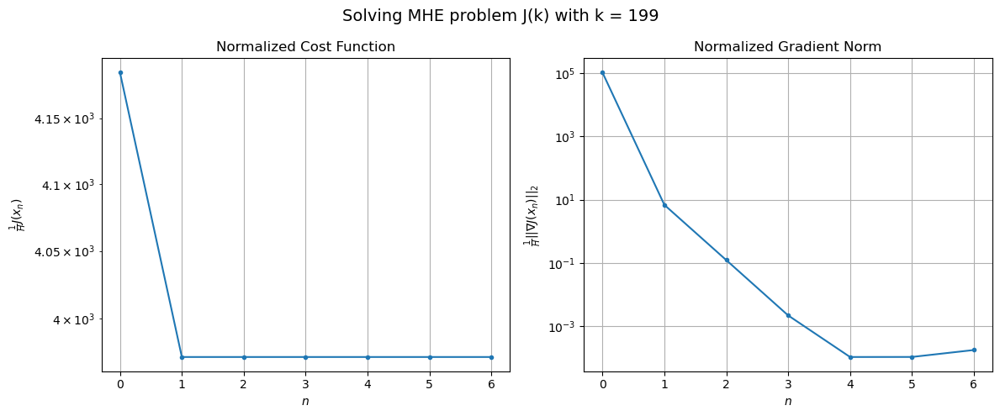

Windows:  47%|████▋     | 171/366 [1:35:36<1:58:53, 36.58s/it]

[Hybrid] Before applying the algorithm
Cost function: 123177.50449707333
Gradient norm: 3065866.4919240824
Global estimation error: 38.36017885029532
Initial conditions estimation errors: 13.923637589084931 m, 10.725927205600119 m, 25.8865822747833 m, 22.191305812850608 m
Position estimation errors: 19.71078433609634 m, 14.687975382145616 m, 20.3633614869316 m, 19.994062064656248 m

[Hybrid] Iteration 1
Cost function: 116802.92096187948 (-5.18%)
Gradient norm: 510.60492402140795 (-99.98%)
Global estimation error: 52.34445140233532 (36.46%)
Initial conditions estimation errors: 17.440019039962852 m, 14.761988921737327 m, 32.33263941832303 m, 34.24101264312162 m
Position estimation errors: 16.644454198004297 m, 9.411569220287415 m, 25.11755210038092 m, 15.50926611756728 m

[Hybrid] Iteration 2
Cost function: 116802.91750605858 (-0.00%)
Gradient norm: 10.06223861935838 (-98.03%)
Global estimation error: 55.14988913254929 (5.36%)
Initial conditions estimation errors: 17.44001855664666 m, 1

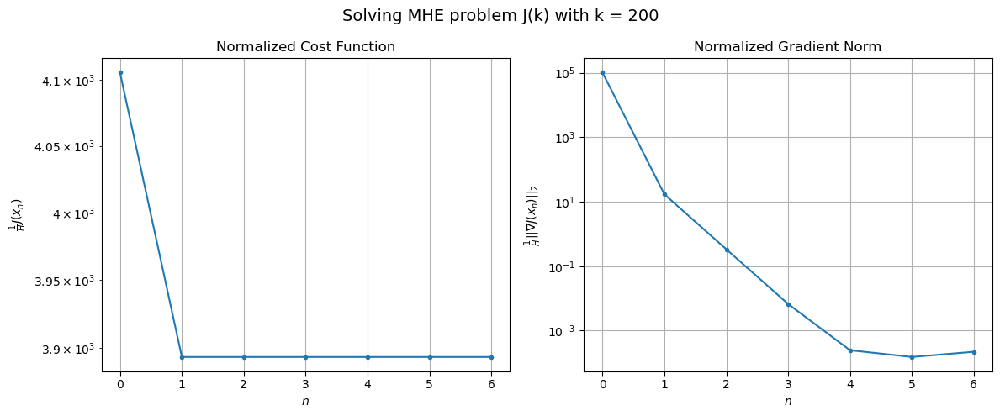

Windows:  47%|████▋     | 172/366 [1:36:07<1:52:45, 34.88s/it]

[Hybrid] Before applying the algorithm
Cost function: 121910.06437567555
Gradient norm: 3143368.813749612
Global estimation error: 54.64505500385161
Initial conditions estimation errors: 14.027024853636359 m, 14.581583832921863 m, 32.522663251100965 m, 38.97381536812642 m
Position estimation errors: 20.09606733951185 m, 14.123287833610728 m, 27.337180351190906 m, 22.390079530859957 m

[Hybrid] Iteration 1
Cost function: 115454.16462769131 (-5.30%)
Gradient norm: 412.81278815384724 (-99.99%)
Global estimation error: 52.45591685793485 (-4.01%)
Initial conditions estimation errors: 17.476614597078566 m, 13.41332609588425 m, 31.053070651627248 m, 36.08268545093533 m
Position estimation errors: 16.9406816020598 m, 14.646663649798429 m, 21.691676035820265 m, 30.393342839932004 m

[Hybrid] Iteration 2
Cost function: 115454.16285235398 (-0.00%)
Gradient norm: 10.437250274865812 (-97.47%)
Global estimation error: 49.90952292587871 (-4.85%)
Initial conditions estimation errors: 17.4766140613334 

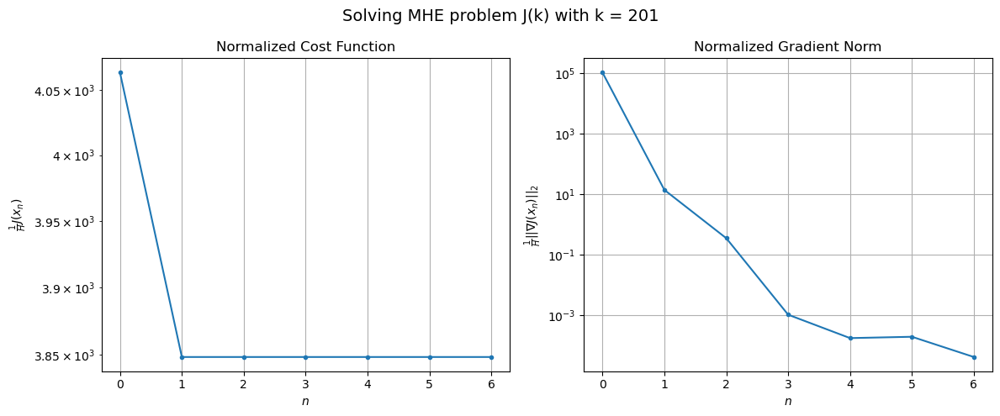

Windows:  47%|████▋     | 173/366 [1:36:39<1:49:06, 33.92s/it]

[Hybrid] Before applying the algorithm
Cost function: 120961.78767588446
Gradient norm: 3250386.779900355
Global estimation error: 48.05582333411936
Initial conditions estimation errors: 14.200643565738673 m, 11.176069792660519 m, 27.86212554449481 m, 34.734489071091645 m
Position estimation errors: 20.546593709967908 m, 19.743696250937322 m, 23.31656505425799 m, 36.90596567042285 m

[Hybrid] Iteration 1
Cost function: 114362.26469719251 (-5.46%)
Gradient norm: 2742.26252406112 (-99.92%)
Global estimation error: 82.34965305609764 (71.36%)
Initial conditions estimation errors: 17.60894650000544 m, 20.72126386684639 m, 50.158205535959794 m, 59.38140523340521 m
Position estimation errors: 17.29070604287737 m, 7.994774674768476 m, 29.034016796969897 m, 22.34512882659265 m

[Hybrid] Iteration 2
Cost function: 114362.19670949715 (-0.00%)
Gradient norm: 5.801461914162444 (-99.79%)
Global estimation error: 80.3973857173705 (-2.37%)
Initial conditions estimation errors: 17.60894594122994 m, 20.

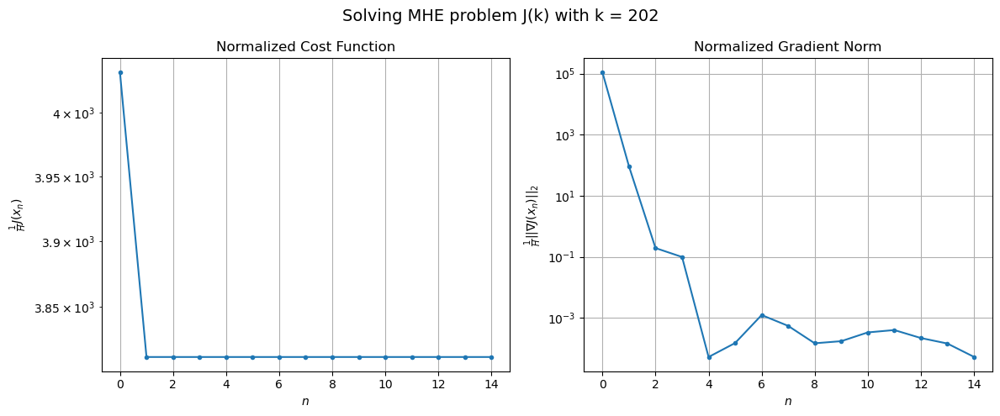

Windows:  48%|████▊     | 174/366 [1:37:42<2:16:56, 42.79s/it]

[Hybrid] Before applying the algorithm
Cost function: 120919.19778961089
Gradient norm: 3529244.4010422872
Global estimation error: 80.39765461736658
Initial conditions estimation errors: 14.42042770099847 m, 20.81753180271815 m, 47.65099986483695 m, 59.597215155673375 m
Position estimation errors: 21.095756898759213 m, 14.313744611619942 m, 29.00420805861223 m, 31.13859135536682 m

[Hybrid] Iteration 1
Cost function: 114097.09397575952 (-5.64%)
Gradient norm: 340.85458465822506 (-99.99%)
Global estimation error: 74.22356879095972 (-7.68%)
Initial conditions estimation errors: 17.80068070082861 m, 17.946355714528057 m, 45.29140115171417 m, 53.09302745437107 m
Position estimation errors: 17.71087679259917 m, 11.109622110711152 m, 38.32242432116716 m, 23.407609144482432 m

[Hybrid] Iteration 2
Cost function: 114097.092985347 (-0.00%)
Gradient norm: 0.326461897139767 (-99.90%)
Global estimation error: 73.53630930513106 (-0.93%)
Initial conditions estimation errors: 17.800680145758047 m, 1

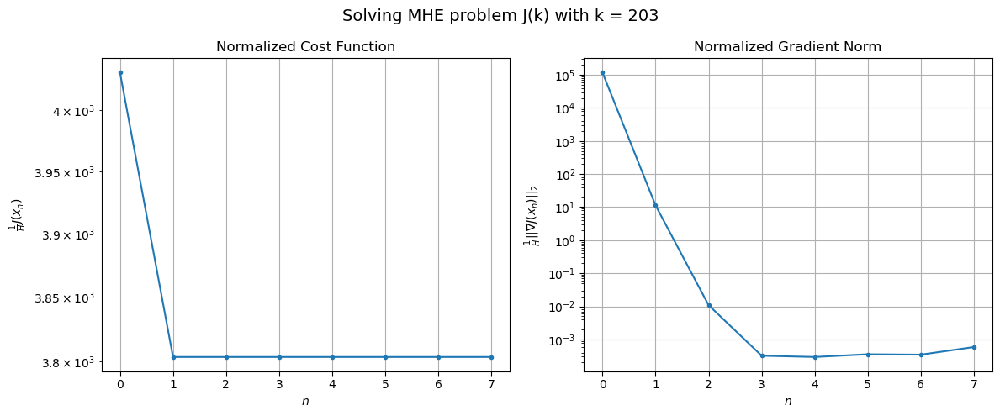

Windows:  48%|████▊     | 175/366 [1:38:16<2:07:37, 40.09s/it]

[Hybrid] Before applying the algorithm
Cost function: 121915.6344447104
Gradient norm: 3728368.793147135
Global estimation error: 74.95166585846891
Initial conditions estimation errors: 14.63971687809152 m, 18.338746611761927 m, 44.648088492157285 m, 55.440519263309646 m
Position estimation errors: 21.720648832330237 m, 16.8879048519757 m, 39.457627120342195 m, 31.40704225797418 m

[Hybrid] Iteration 1
Cost function: 114977.12274895336 (-5.69%)
Gradient norm: 1477.9166410972348 (-99.96%)
Global estimation error: 63.931208769832274 (-14.70%)
Initial conditions estimation errors: 17.973562127121323 m, 11.520576296411441 m, 47.42199522216631 m, 37.18284003742146 m
Position estimation errors: 18.240462939597375 m, 18.300734884627857 m, 20.273965917179666 m, 34.296503638350316 m

[Hybrid] Iteration 2
Cost function: 114977.11188967904 (-0.00%)
Gradient norm: 0.8390923456932947 (-99.94%)
Global estimation error: 65.09920634952013 (1.83%)
Initial conditions estimation errors: 17.97356160942465

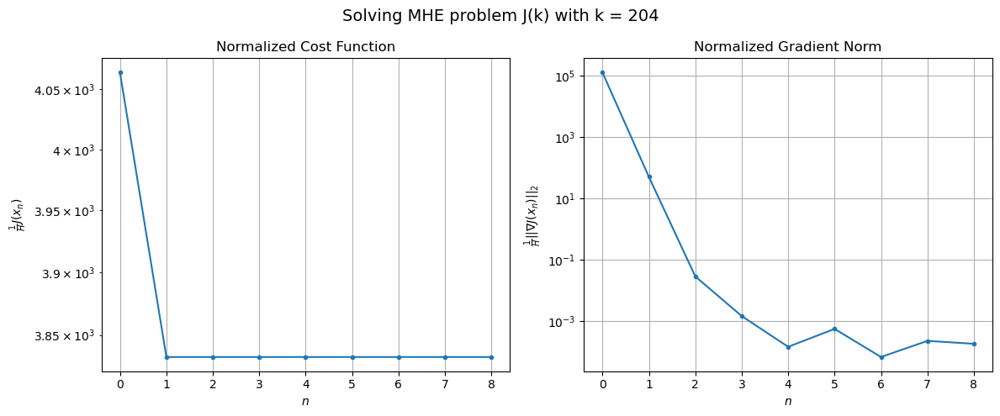

Windows:  48%|████▊     | 176/366 [1:38:53<2:04:20, 39.26s/it]

[Hybrid] Before applying the algorithm
Cost function: 124020.13403328529
Gradient norm: 4001572.0280354316
Global estimation error: 64.312358364387
Initial conditions estimation errors: 14.803382104159725 m, 11.767877931350146 m, 46.146260668339096 m, 40.60743907864729 m
Position estimation errors: 22.449182501044824 m, 23.940167291987382 m, 21.595146645151942 m, 42.32916984153447 m

[Hybrid] Iteration 1
Cost function: 116666.54745759412 (-5.93%)
Gradient norm: 298.75843371085637 (-99.99%)
Global estimation error: 47.5714544726086 (-26.03%)
Initial conditions estimation errors: 18.173456244292396 m, 8.556917175910204 m, 36.99608420843955 m, 22.15450031256814 m
Position estimation errors: 18.81310651802226 m, 19.576511628418217 m, 20.926156508150633 m, 37.70813267997715 m

[Hybrid] Iteration 2
Cost function: 116666.5431025606 (-0.00%)
Gradient norm: 18.716032643340935 (-93.74%)
Global estimation error: 49.427299827379656 (3.90%)
Initial conditions estimation errors: 18.173455752812607 m

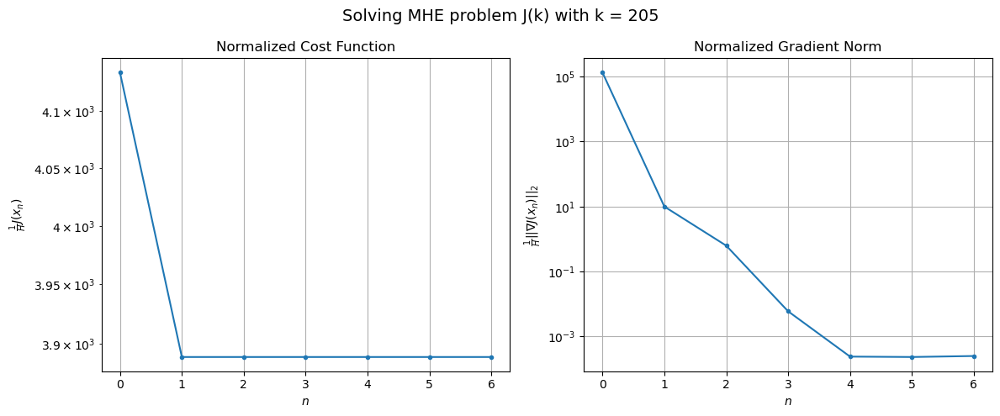

Windows:  48%|████▊     | 177/366 [1:39:22<1:53:55, 36.17s/it]

[Hybrid] Before applying the algorithm
Cost function: 127623.40596320444
Gradient norm: 4310573.06188389
Global estimation error: 47.48248699266068
Initial conditions estimation errors: 14.97440537911771 m, 5.916141297383064 m, 36.21439886416491 m, 26.15065900394008 m
Position estimation errors: 23.23466473443828 m, 24.154138303069388 m, 24.379177011997037 m, 43.28513486982987 m

[Hybrid] Iteration 1
Cost function: 120035.10950056257 (-5.95%)
Gradient norm: 3073.8834174467866 (-99.93%)
Global estimation error: 32.20864932420567 (-32.17%)
Initial conditions estimation errors: 18.3341113744873 m, 21.4255186114063 m, 10.095385550280293 m, 11.84374641784034 m
Position estimation errors: 19.488582356009072 m, 25.63298851100918 m, 19.005217811745595 m, 49.99643236184072 m

[Hybrid] Iteration 2
Cost function: 120034.97732649607 (-0.00%)
Gradient norm: 17.422260615578224 (-99.43%)
Global estimation error: 32.530133069960584 (1.00%)
Initial conditions estimation errors: 18.334110938843928 m, 21

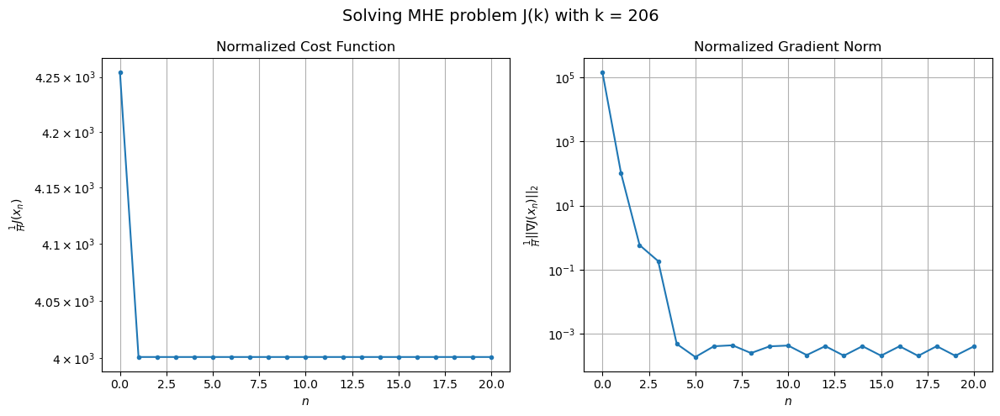

Windows:  49%|████▊     | 178/366 [1:40:46<2:37:47, 50.36s/it]

[Hybrid] Before applying the algorithm
Cost function: 132818.64604915128
Gradient norm: 4625738.941281836
Global estimation error: 28.183735385591966
Initial conditions estimation errors: 15.099083704803844 m, 19.697634045621342 m, 5.624249108291202 m, 12.11198889860947 m
Position estimation errors: 24.175641655996166 m, 30.7884669725519 m, 22.59967462524068 m, 56.997265981675774 m

[Hybrid] Iteration 1
Cost function: 124795.49384809914 (-6.04%)
Gradient norm: 82.02790757544423 (-100.00%)
Global estimation error: 34.96951420917802 (24.08%)
Initial conditions estimation errors: 18.51031853377395 m, 22.593596303915668 m, 9.599754826467667 m, 16.661222507514083 m
Position estimation errors: 20.286433881257256 m, 26.277995603457242 m, 20.906673889021366 m, 47.37835796408873 m

[Hybrid] Iteration 2
Cost function: 124795.49365330974 (-0.00%)
Gradient norm: 3.170452977753167 (-96.13%)
Global estimation error: 34.78904330588529 (-0.52%)
Initial conditions estimation errors: 18.51031811889597 m

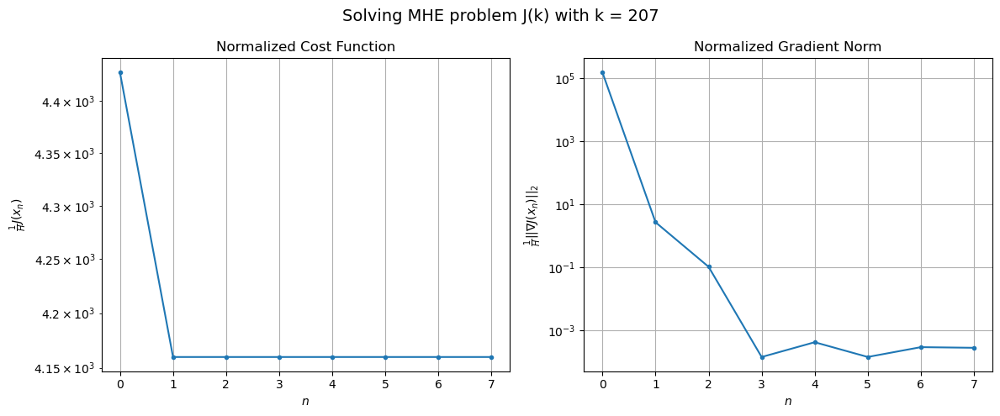

Windows:  49%|████▉     | 179/366 [1:41:17<2:18:53, 44.57s/it]

[Hybrid] Before applying the algorithm
Cost function: 139628.8120340465
Gradient norm: 4960652.146005988
Global estimation error: 29.722225325503334
Initial conditions estimation errors: 15.210976943310166 m, 19.712875881552748 m, 6.204354579050143 m, 14.997811040048527 m
Position estimation errors: 25.319048325754082 m, 30.14895734568956 m, 26.946945887234477 m, 50.68075485816682 m

[Hybrid] Iteration 1
Cost function: 131118.5714576942 (-6.09%)
Gradient norm: 7516.437249109848 (-99.85%)
Global estimation error: 43.10377438309725 (45.02%)
Initial conditions estimation errors: 18.68991896039618 m, 30.174165799030103 m, 8.06448366860204 m, 23.088723679226987 m
Position estimation errors: 21.282337822847005 m, 44.58494037105438 m, 9.414235435388097 m, 89.44574997653694 m

[Hybrid] Iteration 2
Cost function: 131118.33816627707 (-0.00%)
Gradient norm: 207.71806613247782 (-97.24%)
Global estimation error: 41.80439085859887 (-3.01%)
Initial conditions estimation errors: 18.689918546130745 m, 

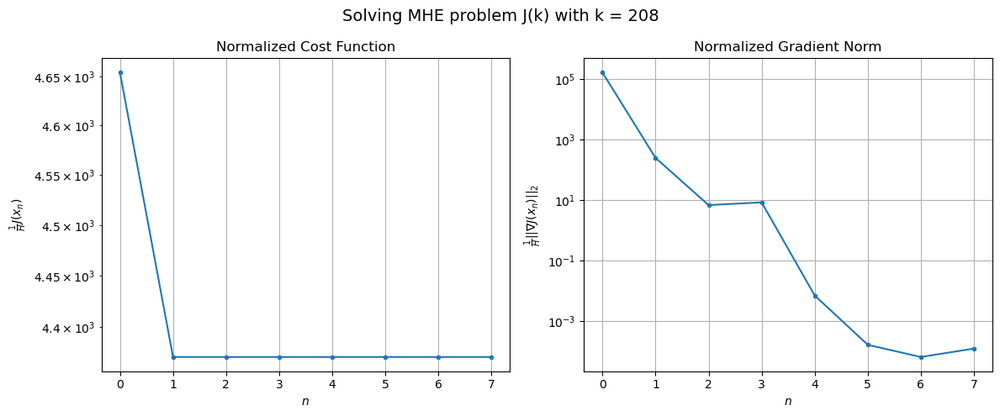

Windows:  49%|████▉     | 180/366 [1:41:47<2:04:50, 40.27s/it]

[Hybrid] Before applying the algorithm
Cost function: 148957.0159197014
Gradient norm: 5430402.43459807
Global estimation error: 36.29139143028316
Initial conditions estimation errors: 15.297261693616635 m, 25.504526569085904 m, 6.197035735219557 m, 19.853511097187322 m
Position estimation errors: 26.72082023793807 m, 41.75479713794947 m, 14.05804996061248 m, 77.36400813250613 m

[Hybrid] Iteration 1
Cost function: 139836.47046613088 (-6.12%)
Gradient norm: 2761.0207504175723 (-99.95%)
Global estimation error: 41.780000891985914 (15.12%)
Initial conditions estimation errors: 18.85732499727252 m, 30.542583266545094 m, 10.939131342823686 m, 18.369441315207208 m
Position estimation errors: 22.501313838488457 m, 50.61563410504141 m, 17.276092449110084 m, 104.80957631803962 m

[Hybrid] Iteration 2
Cost function: 139836.42705695523 (-0.00%)
Gradient norm: 314.9669983997434 (-88.59%)
Global estimation error: 44.197316440922975 (5.79%)
Initial conditions estimation errors: 18.857324589939775 m

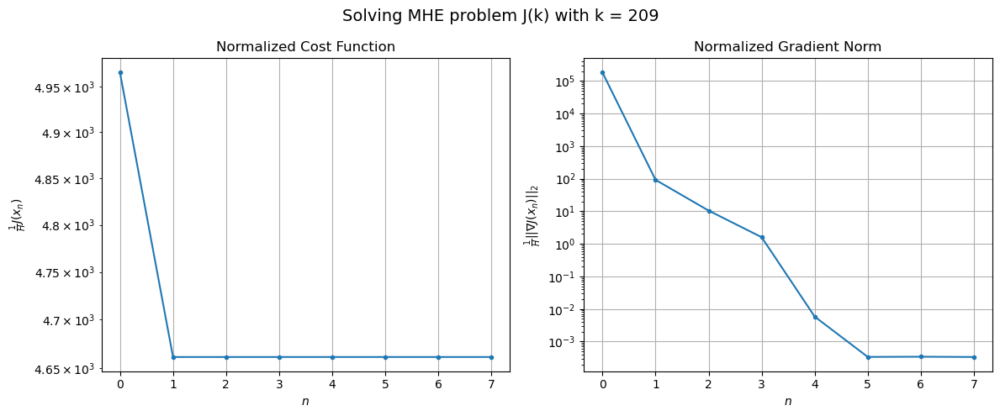

Windows:  49%|████▉     | 181/366 [1:42:21<1:58:34, 38.45s/it]

[Hybrid] Before applying the algorithm
Cost function: 162517.16513042484
Gradient norm: 6199879.407099728
Global estimation error: 44.45658359064075
Initial conditions estimation errors: 15.371812308477269 m, 32.522078912202225 m, 11.778155345609328 m, 23.316588427121424 m
Position estimation errors: 28.34838049605067 m, 59.057326543912325 m, 20.202671245479632 m, 120.0201194297503 m

[Hybrid] Iteration 1
Cost function: 152483.4057929611 (-6.17%)
Gradient norm: 230.96448663324117 (-100.00%)
Global estimation error: 59.97482830000604 (34.91%)
Initial conditions estimation errors: 19.032346067698985 m, 40.692817115966776 m, 12.930364370750427 m, 37.57160346982484 m
Position estimation errors: 23.855547956070602 m, 56.121767944320375 m, 28.059033385709764 m, 115.00535412863724 m

[Hybrid] Iteration 2
Cost function: 152483.40408817757 (-0.00%)
Gradient norm: 27.84878078084213 (-87.94%)
Global estimation error: 60.797408536250536 (1.37%)
Initial conditions estimation errors: 19.032345597615

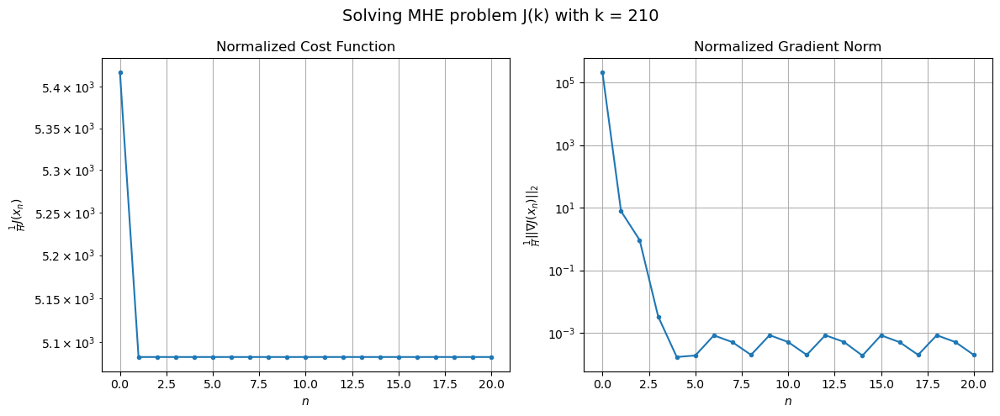

Windows:  50%|████▉     | 182/366 [1:43:53<2:47:29, 54.62s/it]

[Hybrid] Before applying the algorithm
Cost function: 179715.72753157624
Gradient norm: 6730601.35419156
Global estimation error: 62.21101081166572
Initial conditions estimation errors: 15.485571684205485 m, 40.72291682300503 m, 16.672498409254842 m, 41.158901574628885 m
Position estimation errors: 30.03884984283595 m, 60.286267800174095 m, 25.86021641255108 m, 119.27737713896079 m

[Hybrid] Iteration 1
Cost function: 168870.63447603764 (-6.03%)
Gradient norm: 689.5099214443779 (-99.99%)
Global estimation error: 60.86012693863498 (-2.17%)
Initial conditions estimation errors: 19.24942713162829 m, 41.44108893270643 m, 11.497400864659113 m, 38.52062736117379 m
Position estimation errors: 25.316010632557813 m, 51.267577933320084 m, 26.130196240715858 m, 101.04427089546027 m

[Hybrid] Iteration 2
Cost function: 168870.6253225589 (-0.00%)
Gradient norm: 150.2925548044903 (-78.20%)
Global estimation error: 61.10940930215701 (0.41%)
Initial conditions estimation errors: 19.24942658433011 m, 4

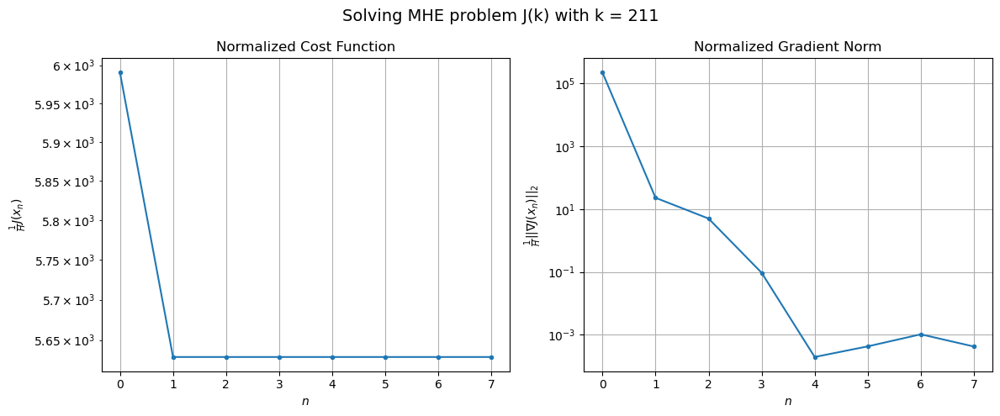

Windows:  50%|█████     | 183/366 [1:44:26<2:26:43, 48.11s/it]

[Hybrid] Before applying the algorithm
Cost function: 200607.70172370016
Gradient norm: 7461011.9406749625
Global estimation error: 61.53522021468138
Initial conditions estimation errors: 15.689128960844961 m, 41.162541512174506 m, 13.74124279954959 m, 40.70916727437088 m
Position estimation errors: 31.738121267130314 m, 57.933015206220446 m, 26.909108611026916 m, 110.82960825884281 m

[Hybrid] Iteration 1
Cost function: 188782.72519500743 (-5.89%)
Gradient norm: 101711.52307989051 (-98.64%)
Global estimation error: 66.33982771363803 (7.81%)
Initial conditions estimation errors: 19.563991186540882 m, 16.875889610083725 m, 46.14993238702844 m, 40.044556599096715 m
Position estimation errors: 26.73027252933869 m, 23.051911352544856 m, 61.979843812758766 m, 74.24525254834084 m

[Hybrid] Iteration 2
Cost function: 188747.19561119162 (-0.02%)
Gradient norm: 54.2754302188966 (-99.95%)
Global estimation error: 64.84349970186815 (-2.26%)
Initial conditions estimation errors: 19.563990519238498

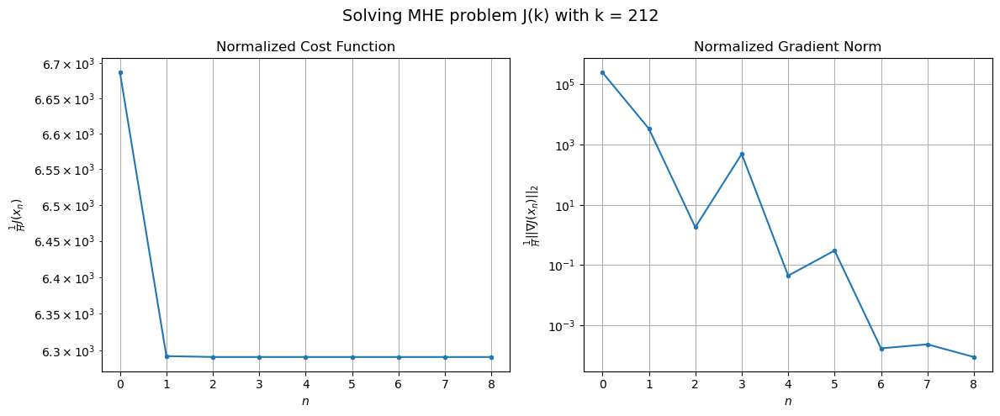

Windows:  50%|█████     | 184/366 [1:45:01<2:13:27, 44.00s/it]

[Hybrid] Before applying the algorithm
Cost function: 224943.51985556676
Gradient norm: 8157263.881384649
Global estimation error: 45.18468595511461
Initial conditions estimation errors: 16.018660673929798 m, 19.471859623010218 m, 25.933635759034345 m, 27.080164450235102 m
Position estimation errors: 33.268006191596605 m, 25.347691196263284 m, 34.422288910354666 m, 22.163202355161932 m

[Hybrid] Iteration 1
Cost function: 212087.8272633123 (-5.72%)
Gradient norm: 1415.580818964731 (-99.98%)
Global estimation error: 65.04636933214358 (43.96%)
Initial conditions estimation errors: 19.99527145712443 m, 31.51929547367148 m, 17.433473565820414 m, 50.33697724266277 m
Position estimation errors: 27.982916263420627 m, 24.384593674713777 m, 24.757209698179174 m, 22.414491505142617 m

[Hybrid] Iteration 2
Cost function: 212087.80947778435 (-0.00%)
Gradient norm: 0.05558345107445108 (-100.00%)
Global estimation error: 65.17945834658579 (0.20%)
Initial conditions estimation errors: 19.995270691201

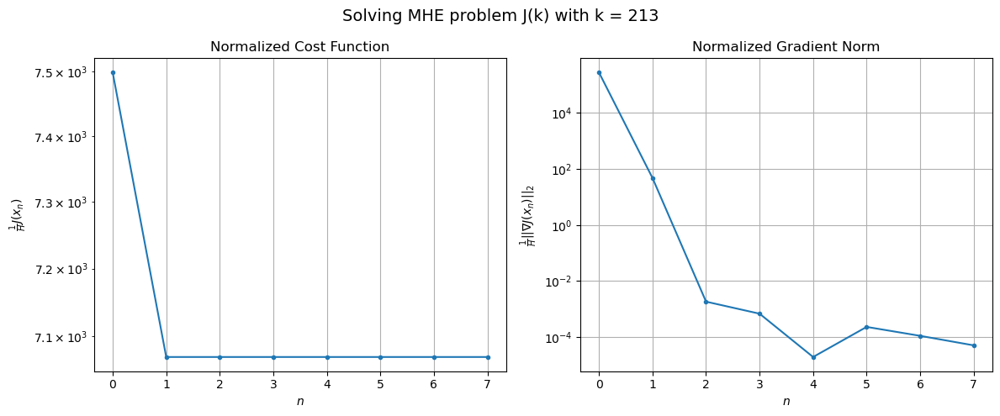

Windows:  51%|█████     | 185/366 [1:45:31<2:00:02, 39.79s/it]

[Hybrid] Before applying the algorithm
Cost function: 251063.23762275834
Gradient norm: 8763996.291435326
Global estimation error: 58.74198607956861
Initial conditions estimation errors: 16.45876294673526 m, 27.98110432577212 m, 13.441027868618722 m, 47.0756028717498 m
Position estimation errors: 34.506782615821095 m, 30.328860280151236 m, 31.90013062636978 m, 27.064650261788756 m

[Hybrid] Iteration 1
Cost function: 237212.700199195 (-5.52%)
Gradient norm: 239.24139193963026 (-100.00%)
Global estimation error: 82.35136674281699 (40.19%)
Initial conditions estimation errors: 20.56674974867911 m, 38.56193365080618 m, 19.496823617311392 m, 67.019317265431 m
Position estimation errors: 28.96870065703319 m, 21.09583386488291 m, 27.81852600665067 m, 14.936496440223685 m

[Hybrid] Iteration 2
Cost function: 237212.69987248554 (-0.00%)
Gradient norm: 0.03729904875502002 (-99.98%)
Global estimation error: 82.45773408638306 (0.13%)
Initial conditions estimation errors: 20.56674885472852 m, 38.5

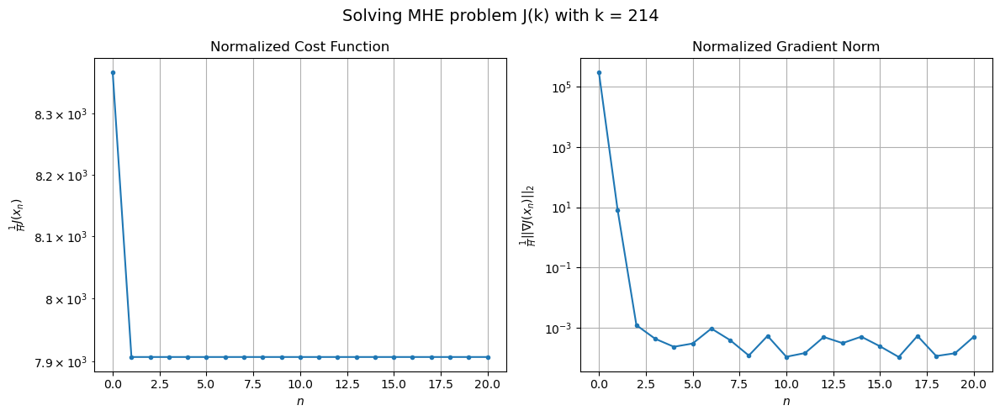

Windows:  51%|█████     | 186/366 [1:46:53<2:37:28, 52.49s/it]

[Hybrid] Before applying the algorithm
Cost function: 278530.33348662156
Gradient norm: 9166580.150044927
Global estimation error: 75.23735306505459
Initial conditions estimation errors: 17.00901995121551 m, 34.60119203458715 m, 15.698353405576567 m, 62.671002056853574 m
Position estimation errors: 35.342382356973914 m, 27.073434111109847 m, 34.790546266498104 m, 19.692346709425177 m

[Hybrid] Iteration 1
Cost function: 263718.98684691015 (-5.32%)
Gradient norm: 731.5162061808913 (-99.99%)
Global estimation error: 73.21142680249434 (-2.69%)
Initial conditions estimation errors: 21.25289523900376 m, 31.496446806997536 m, 20.594523830696417 m, 59.093525943913306 m
Position estimation errors: 29.569608798215185 m, 20.641658386364305 m, 34.09622801140907 m, 23.537060179930844 m

[Hybrid] Iteration 2
Cost function: 263718.980269544 (-0.00%)
Gradient norm: 56.8939277463944 (-92.22%)
Global estimation error: 72.22033531604967 (-1.35%)
Initial conditions estimation errors: 21.2528942158329 m, 

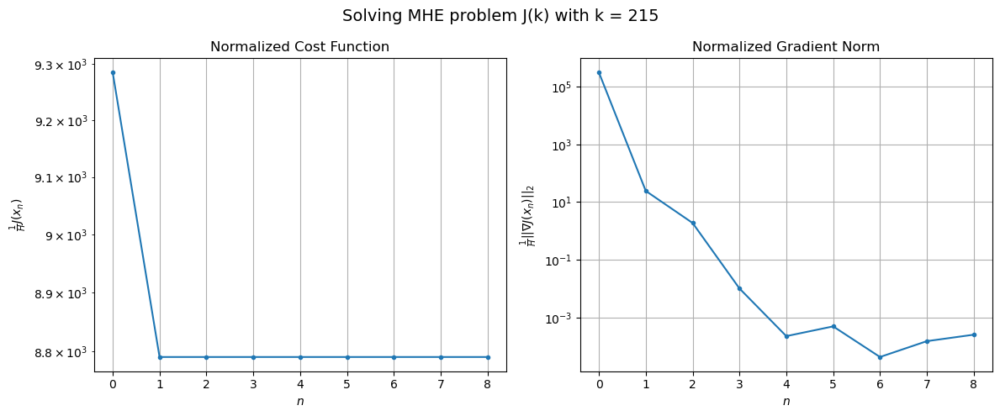

Windows:  51%|█████     | 187/366 [1:47:31<2:23:41, 48.17s/it]

[Hybrid] Before applying the algorithm
Cost function: 304502.94555191434
Gradient norm: 9419787.215918936
Global estimation error: 64.00509713471433
Initial conditions estimation errors: 17.647335479308552 m, 27.375008386316505 m, 16.421208175213156 m, 52.59427099922384 m
Position estimation errors: 35.642380871223565 m, 27.534284622006744 m, 38.8070786745151 m, 24.00010827101841 m

[Hybrid] Iteration 1
Cost function: 289105.28653134644 (-5.06%)
Gradient norm: 6187.853973481948 (-99.93%)
Global estimation error: 99.07792290152895 (54.80%)
Initial conditions estimation errors: 22.01240164328518 m, 33.977347485527346 m, 33.588505131809335 m, 83.95952807711272 m
Position estimation errors: 29.73257118268327 m, 22.273445847990022 m, 43.81655790113122 m, 76.45926817467101 m

[Hybrid] Iteration 2
Cost function: 289105.1830710145 (-0.00%)
Gradient norm: 12.022155419937421 (-99.81%)
Global estimation error: 98.9121135326653 (-0.17%)
Initial conditions estimation errors: 22.01240052117707 m, 34

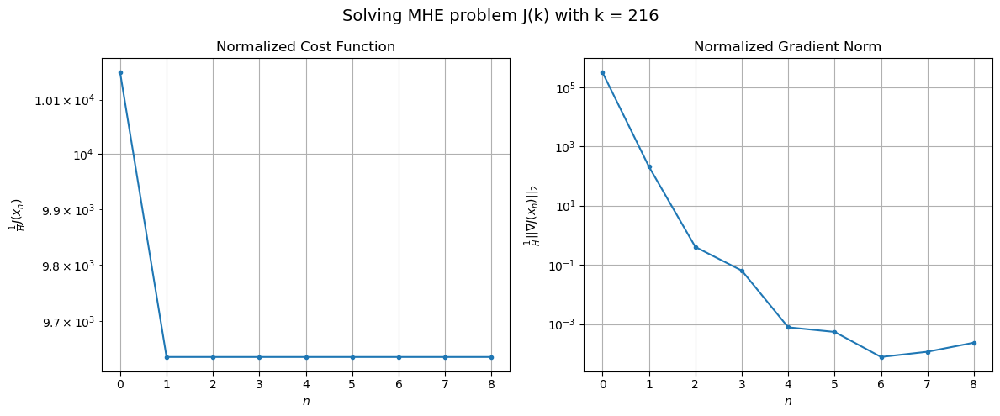

Windows:  51%|█████▏    | 188/366 [1:48:09<2:13:54, 45.14s/it]

[Hybrid] Before applying the algorithm
Cost function: 326997.2556686521
Gradient norm: 9533975.200065114
Global estimation error: 87.52842501084086
Initial conditions estimation errors: 18.354290449466742 m, 28.760757100781703 m, 30.6473363152058 m, 74.55111299777 m
Position estimation errors: 35.378043481240695 m, 25.636933175399815 m, 46.849426821965615 m, 74.15054906734895 m

[Hybrid] Iteration 1
Cost function: 311266.2331855535 (-4.81%)
Gradient norm: 1236.6117167349973 (-99.99%)
Global estimation error: 77.69868680429141 (-11.23%)
Initial conditions estimation errors: 22.815281099140993 m, 29.73364384803187 m, 29.52432857490219 m, 61.324899294559415 m
Position estimation errors: 29.385968814288063 m, 20.232756030372673 m, 36.433486935951315 m, 48.34657332684643 m

[Hybrid] Iteration 2
Cost function: 311266.21181340405 (-0.00%)
Gradient norm: 149.92463018575768 (-87.88%)
Global estimation error: 75.93456116116397 (-2.27%)
Initial conditions estimation errors: 22.81527987895741 m, 2

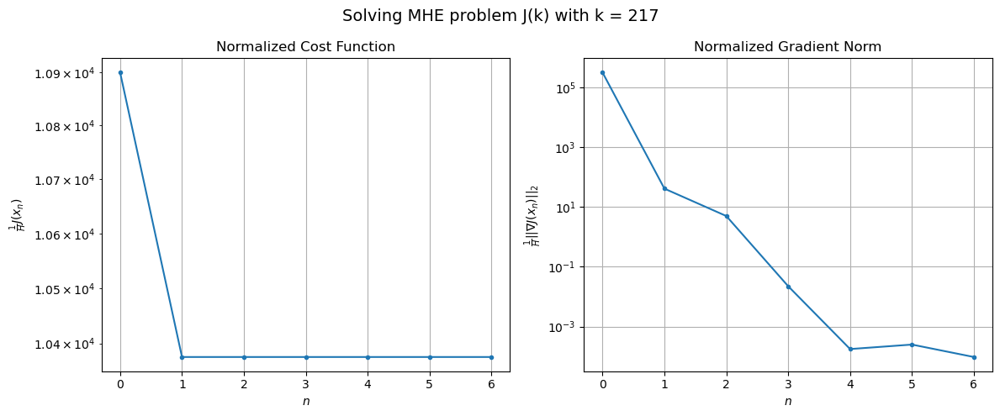

Windows:  52%|█████▏    | 189/366 [1:48:37<1:57:56, 39.98s/it]

[Hybrid] Before applying the algorithm
Cost function: 344701.1269081473
Gradient norm: 9504090.214857284
Global estimation error: 66.20970985430068
Initial conditions estimation errors: 19.097782724906907 m, 25.212379254339954 m, 25.139928868407438 m, 52.452778705961265 m
Position estimation errors: 34.54272695888702 m, 25.77157575831332 m, 38.86530495383309 m, 41.75084329959917 m

[Hybrid] Iteration 1
Cost function: 328917.0199836746 (-4.58%)
Gradient norm: 212.49042675759395 (-100.00%)
Global estimation error: 70.54653524709187 (6.55%)
Initial conditions estimation errors: 23.64305517936679 m, 28.265477594062073 m, 25.10098503779772 m, 54.669840944200466 m
Position estimation errors: 28.539397829510353 m, 21.012932257275484 m, 36.876089066879956 m, 50.49328708547729 m

[Hybrid] Iteration 2
Cost function: 328917.0176141138 (-0.00%)
Gradient norm: 17.378311191955145 (-91.82%)
Global estimation error: 69.76138224947334 (-1.11%)
Initial conditions estimation errors: 23.643053915862772 m,

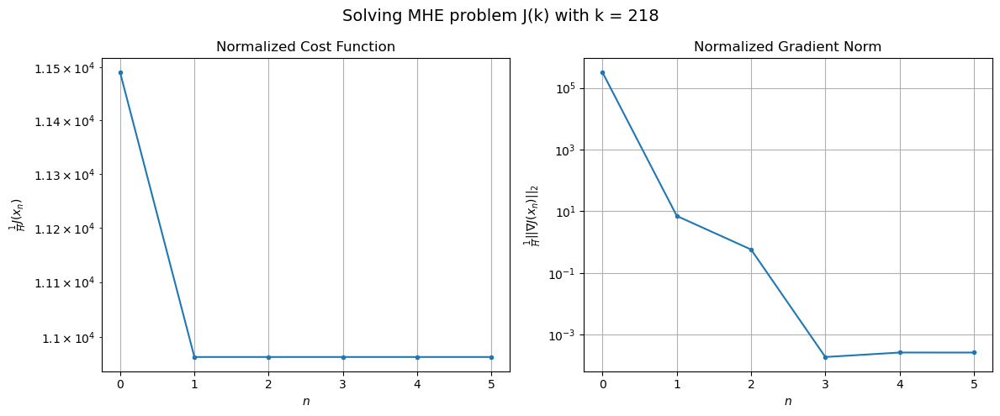

Windows:  52%|█████▏    | 190/366 [1:49:02<1:44:17, 35.55s/it]

[Hybrid] Before applying the algorithm
Cost function: 356467.46888697543
Gradient norm: 9423085.062016636
Global estimation error: 59.60668559676243
Initial conditions estimation errors: 19.82449046684906 m, 23.316975309457387 m, 21.744314873030238 m, 46.29708702837159 m
Position estimation errors: 33.264125606892215 m, 25.965944873784075 m, 40.15215837149944 m, 49.048119653590355 m

[Hybrid] Iteration 1
Cost function: 340712.1237568908 (-4.42%)
Gradient norm: 563.1627873726763 (-99.99%)
Global estimation error: 70.97487409654683 (19.07%)
Initial conditions estimation errors: 24.46629296745625 m, 30.547639192326223 m, 19.385125368311428 m, 55.94518439782954 m
Position estimation errors: 27.283964337181974 m, 21.234586342164746 m, 32.80475504221579 m, 37.909333908182795 m

[Hybrid] Iteration 2
Cost function: 340712.12112602824 (-0.00%)
Gradient norm: 6.724142681516448 (-98.81%)
Global estimation error: 70.52008356369356 (-0.64%)
Initial conditions estimation errors: 24.466291687794914 m

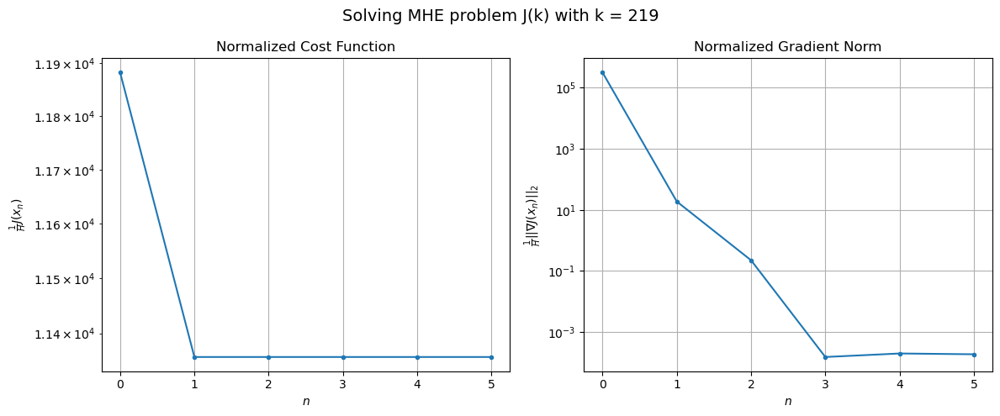

Windows:  52%|█████▏    | 191/366 [1:49:28<1:35:00, 32.57s/it]

[Hybrid] Before applying the algorithm
Cost function: 361492.32470134425
Gradient norm: 9322772.09271077
Global estimation error: 60.98715406183198
Initial conditions estimation errors: 20.477455776094043 m, 25.8774455803033 m, 15.67980721315361 m, 48.832168385811684 m
Position estimation errors: 31.731228938221253 m, 26.253822315280424 m, 36.840152621993795 m, 38.76016694369206 m

[Hybrid] Iteration 1
Cost function: 346007.8499412696 (-4.28%)
Gradient norm: 2801.150705056788 (-99.97%)
Global estimation error: 76.6044841579344 (25.61%)
Initial conditions estimation errors: 25.175332861284126 m, 30.393234235724726 m, 27.117486556426083 m, 59.793812990230734 m
Position estimation errors: 25.818765018490367 m, 22.676348321898626 m, 36.97867977232377 m, 75.13043606016487 m

[Hybrid] Iteration 2
Cost function: 346007.82310258155 (-0.00%)
Gradient norm: 18.943754239321333 (-99.32%)
Global estimation error: 75.69487457678552 (-1.19%)
Initial conditions estimation errors: 25.17533159176767 m, 

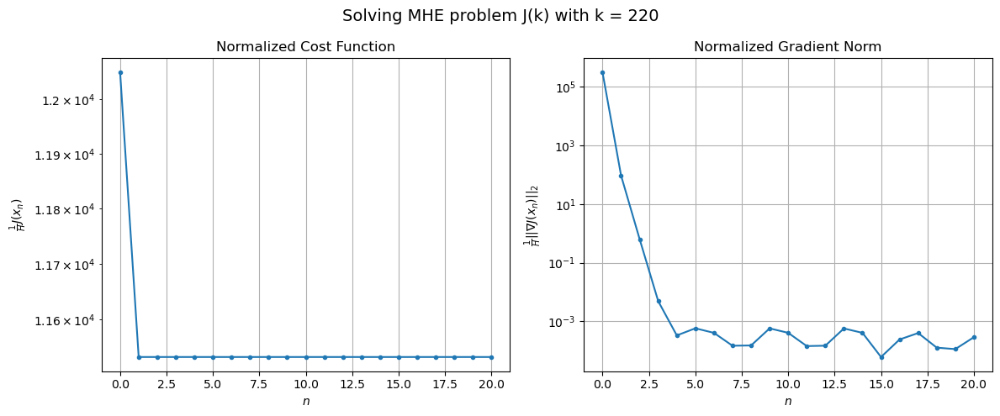

Windows:  52%|█████▏    | 192/366 [1:50:57<2:24:08, 49.70s/it]

[Hybrid] Before applying the algorithm
Cost function: 359379.24421279633
Gradient norm: 9167295.385895887
Global estimation error: 63.83242089689188
Initial conditions estimation errors: 20.96876686119013 m, 24.734769752639163 m, 23.79231665173338 m, 49.56777331944198 m
Position estimation errors: 30.148195312574813 m, 26.327430634350883 m, 39.09205872943277 m, 72.95826014461626 m

[Hybrid] Iteration 1
Cost function: 344326.84321478393 (-4.19%)
Gradient norm: 390.37316268905363 (-100.00%)
Global estimation error: 77.47894392294745 (21.38%)
Initial conditions estimation errors: 25.69472216290389 m, 33.579566383861035 m, 24.064309128076353 m, 60.2996575408971 m
Position estimation errors: 24.33721509998224 m, 22.315105850333758 m, 32.36362105415666 m, 64.78196797269892 m

[Hybrid] Iteration 2
Cost function: 344326.84172351775 (-0.00%)
Gradient norm: 2.9403518427816264 (-99.25%)
Global estimation error: 77.15582848794438 (-0.42%)
Initial conditions estimation errors: 25.69472095563802 m, 

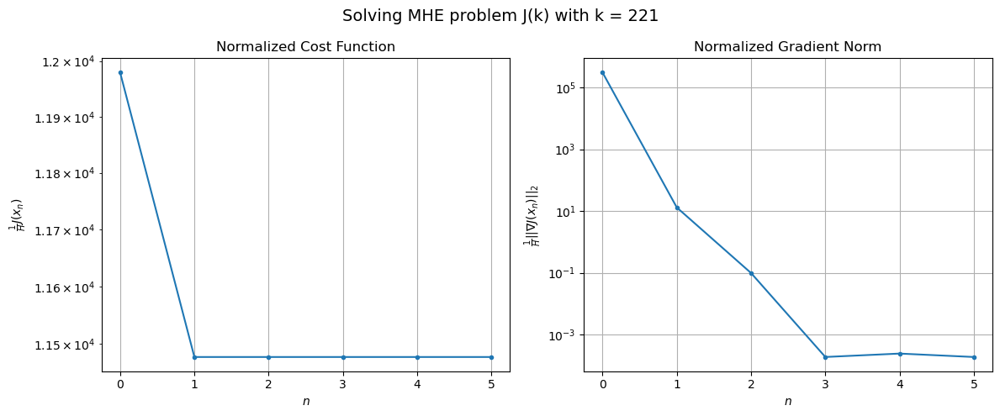

Windows:  53%|█████▎    | 193/366 [1:51:24<2:03:42, 42.90s/it]

[Hybrid] Before applying the algorithm
Cost function: 352783.9574902607
Gradient norm: 9041413.82438304
Global estimation error: 65.48741418093073
Initial conditions estimation errors: 21.269978712178748 m, 27.904019214907407 m, 20.387004666355683 m, 51.39927016969651 m
Position estimation errors: 28.626719930646093 m, 26.515612307026235 m, 35.43344382463091 m, 65.81481783268589 m

[Hybrid] Iteration 1
Cost function: 338368.56716782844 (-4.09%)
Gradient norm: 595.6435492000969 (-99.99%)
Global estimation error: 62.06166941540455 (-5.23%)
Initial conditions estimation errors: 25.954086745757078 m, 27.806590685802536 m, 24.094095424826595 m, 42.71143544389985 m
Position estimation errors: 22.939830328846572 m, 21.729217929764992 m, 27.428725745074164 m, 45.84348384800006 m

[Hybrid] Iteration 2
Cost function: 338368.5656496508 (-0.00%)
Gradient norm: 2.0570944711669186 (-99.65%)
Global estimation error: 62.22007013992754 (0.26%)
Initial conditions estimation errors: 25.95408565997157 m, 

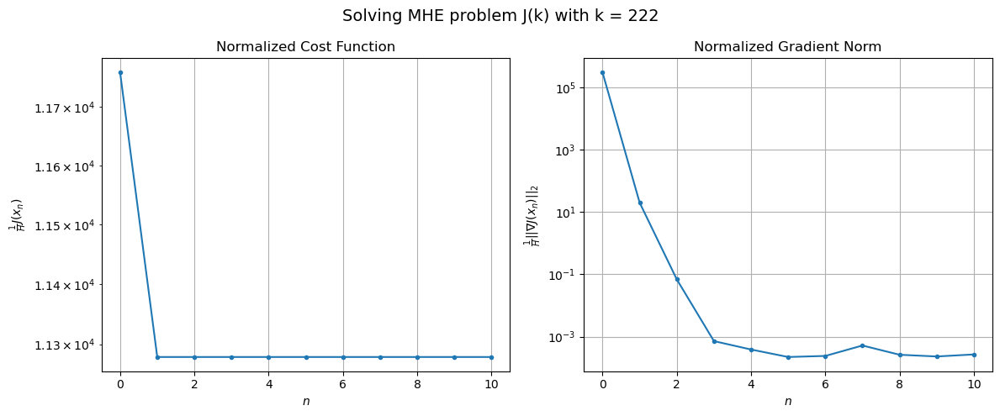

Windows:  53%|█████▎    | 194/366 [1:52:07<2:02:32, 42.75s/it]

[Hybrid] Before applying the algorithm
Cost function: 342132.15511287405
Gradient norm: 9002790.567636317
Global estimation error: 51.07072771800949
Initial conditions estimation errors: 21.339091838143634 m, 22.39268236125621 m, 20.144626027023804 m, 35.29288384836736 m
Position estimation errors: 27.16600631341513 m, 26.663882895475936 m, 30.898425558769166 m, 49.69754179961717 m

[Hybrid] Iteration 1
Cost function: 328045.7672936154 (-4.12%)
Gradient norm: 501.78515686751416 (-99.99%)
Global estimation error: 57.74194982070473 (13.06%)
Initial conditions estimation errors: 26.029748288744724 m, 25.85152350384746 m, 25.700525921607408 m, 36.4379244207521 m
Position estimation errors: 21.564907701808036 m, 23.141231717464255 m, 27.64583595418823 m, 60.87874252075728 m

[Hybrid] Iteration 2
Cost function: 328045.7644262121 (-0.00%)
Gradient norm: 5.201620010714557 (-98.96%)
Global estimation error: 57.462167669084884 (-0.48%)
Initial conditions estimation errors: 26.029747315150583 m, 

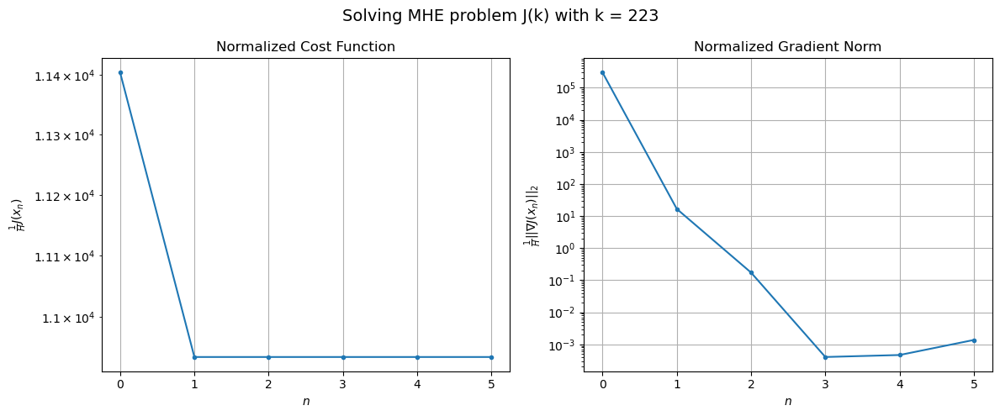

Windows:  53%|█████▎    | 195/366 [1:52:35<1:48:57, 38.23s/it]

[Hybrid] Before applying the algorithm
Cost function: 327033.8411299508
Gradient norm: 8706834.020084342
Global estimation error: 45.80770916009174
Initial conditions estimation errors: 21.25157643566394 m, 20.06283549407403 m, 21.783669499371186 m, 27.742193729917982 m
Position estimation errors: 25.65774176522809 m, 27.240880664193917 m, 29.1386998979673 m, 61.46594575209289 m

[Hybrid] Iteration 1
Cost function: 313703.29398782435 (-4.08%)
Gradient norm: 31.12802106327245 (-100.00%)
Global estimation error: 53.83810496162633 (17.53%)
Initial conditions estimation errors: 25.89405964013622 m, 26.42287498767304 m, 25.720357685363172 m, 29.466744421749276 m
Position estimation errors: 20.27811987648154 m, 24.19486566246026 m, 23.987638138573338 m, 58.533346909732174 m

[Hybrid] Iteration 2
Cost function: 313703.2938776615 (-0.00%)
Gradient norm: 0.25310806650106005 (-99.19%)
Global estimation error: 53.849110462397604 (0.02%)
Initial conditions estimation errors: 25.894058864784522 m, 

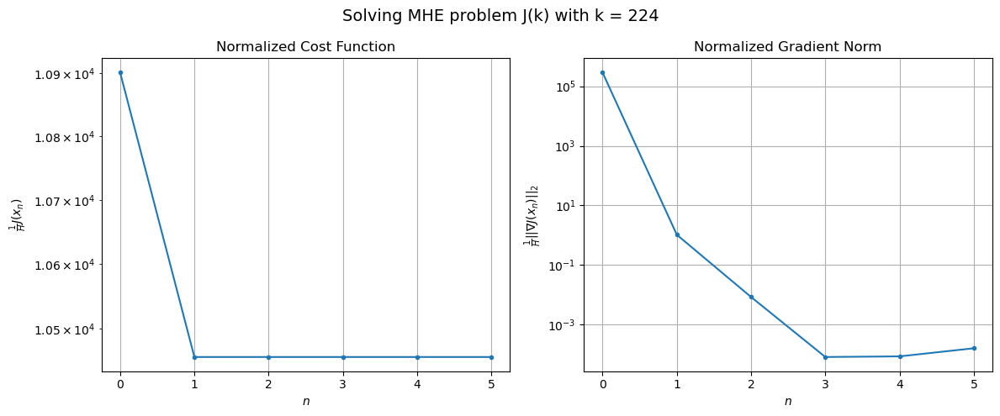

Windows:  54%|█████▎    | 196/366 [1:52:58<1:36:07, 33.93s/it]

[Hybrid] Before applying the algorithm
Cost function: 308871.8580803623
Gradient norm: 8300474.53232489
Global estimation error: 42.3457280979977
Initial conditions estimation errors: 20.994833470104112 m, 20.584740497897045 m, 21.49128181772633 m, 21.603903631254283 m
Position estimation errors: 24.182701748563385 m, 28.3347526149833 m, 25.86200850157909 m, 60.44345735593669 m

[Hybrid] Iteration 1
Cost function: 296438.01035421947 (-4.03%)
Gradient norm: 1281.3136867655865 (-99.98%)
Global estimation error: 49.03506706198088 (15.80%)
Initial conditions estimation errors: 25.565243216178718 m, 22.84376323268315 m, 27.473383412440164 m, 21.77598036688253 m
Position estimation errors: 19.10888367866718 m, 20.478826473481128 m, 18.719314891925492 m, 32.38419071584949 m

[Hybrid] Iteration 2
Cost function: 296437.9998343938 (-0.00%)
Gradient norm: 12.492743308066913 (-99.03%)
Global estimation error: 48.78821195404109 (-0.50%)
Initial conditions estimation errors: 25.565242627356042 m, 22

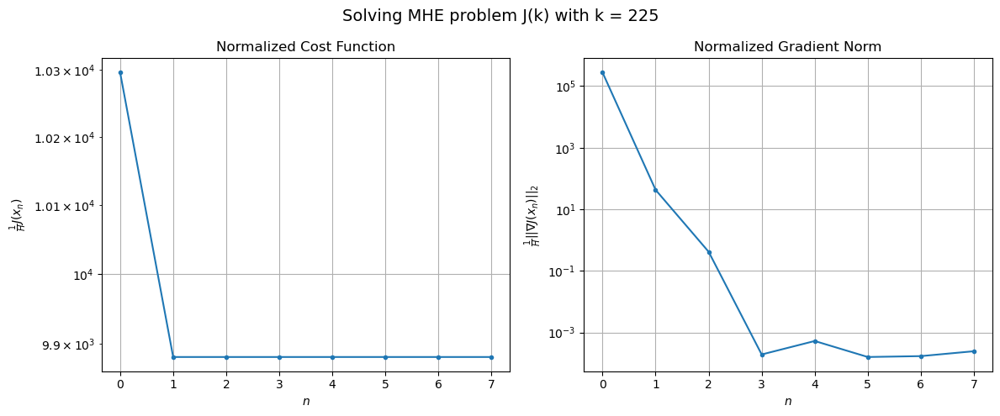

Windows:  54%|█████▍    | 197/366 [1:53:31<1:34:17, 33.47s/it]

[Hybrid] Before applying the algorithm
Cost function: 290091.0011440667
Gradient norm: 7944364.509072759
Global estimation error: 38.85063299817509
Initial conditions estimation errors: 20.59913389503773 m, 17.573457778328713 m, 22.55786891657925 m, 16.35018737850124 m
Position estimation errors: 22.787989850004358 m, 24.31427497766649 m, 21.312253398889194 m, 33.14763133191109 m

[Hybrid] Iteration 1
Cost function: 278494.9929869463 (-4.00%)
Gradient norm: 10.91936130454188 (-100.00%)
Global estimation error: 48.115773443299595 (23.85%)
Initial conditions estimation errors: 25.06974913077518 m, 22.76154035430898 m, 27.498130709595 m, 20.306684735248343 m
Position estimation errors: 18.01667277457871 m, 20.351895126450124 m, 16.446669219042438 m, 30.183599314874737 m

[Hybrid] Iteration 2
Cost function: 278494.9929882298 (0.00%)
Gradient norm: 0.022332425707525257 (-99.80%)
Global estimation error: 48.117901761108044 (0.00%)
Initial conditions estimation errors: 25.069748810116415 m, 2

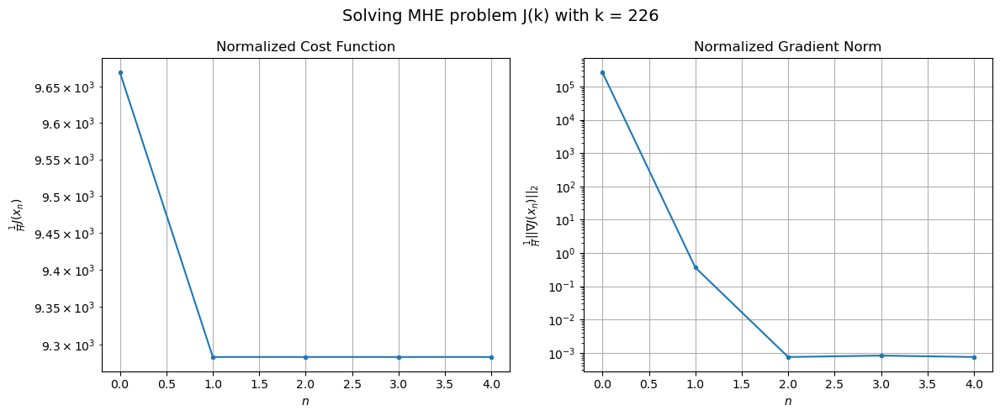

Windows:  54%|█████▍    | 198/366 [1:53:55<1:25:40, 30.60s/it]

[Hybrid] Before applying the algorithm
Cost function: 269476.4877611714
Gradient norm: 7234004.626003108
Global estimation error: 38.97564791898417
Initial conditions estimation errors: 20.071170950133624 m, 17.724021766708653 m, 22.531426619024106 m, 17.158286263471773 m
Position estimation errors: 21.441000112721003 m, 24.03136290783021 m, 19.057549362139955 m, 33.00377291977352 m

[Hybrid] Iteration 1
Cost function: 258954.09045616005 (-3.90%)
Gradient norm: 127.73291405953988 (-100.00%)
Global estimation error: 48.25951020412787 (23.82%)
Initial conditions estimation errors: 24.45757387246223 m, 23.365686846992446 m, 23.936399112171465 m, 24.735800805384248 m
Position estimation errors: 17.166589046371413 m, 21.741391700394615 m, 13.359169396806243 m, 41.2516241036121 m

[Hybrid] Iteration 2
Cost function: 258954.08999703155 (-0.00%)
Gradient norm: 0.2520955841099089 (-99.80%)
Global estimation error: 48.29031657967357 (0.06%)
Initial conditions estimation errors: 24.45757379827165

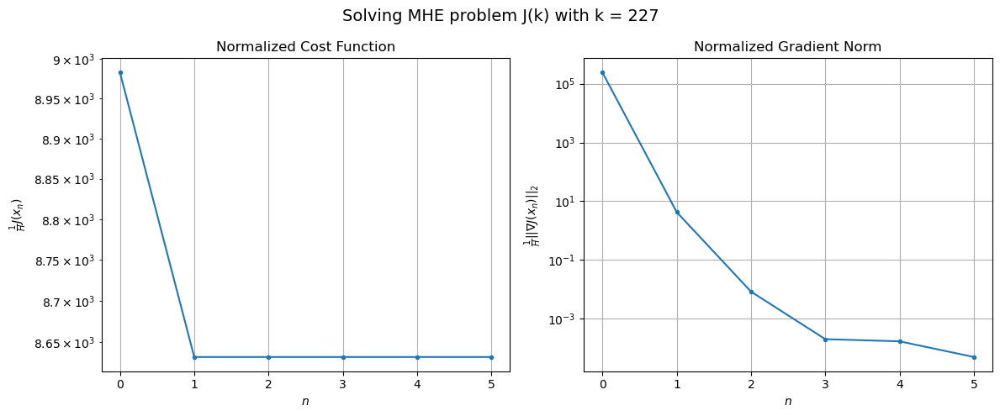

Windows:  54%|█████▍    | 199/366 [1:54:20<1:20:52, 29.06s/it]

[Hybrid] Before applying the algorithm
Cost function: 249590.46318191048
Gradient norm: 6521131.66389147
Global estimation error: 37.74968078644827
Initial conditions estimation errors: 19.402510798658252 m, 18.09385297814549 m, 19.227487817027612 m, 18.74721241178427 m
Position estimation errors: 20.357384622982604 m, 24.998585402396895 m, 15.020003178278975 m, 43.850506416732884 m

[Hybrid] Iteration 1
Cost function: 240177.15218059166 (-3.77%)
Gradient norm: 268.5663992009919 (-100.00%)
Global estimation error: 46.15264369491874 (22.26%)
Initial conditions estimation errors: 23.647766414382005 m, 23.514890912999604 m, 22.868752195576867 m, 22.245880899241143 m
Position estimation errors: 16.579286961360292 m, 21.54210726806843 m, 12.392773670752533 m, 30.21698081294853 m

[Hybrid] Iteration 2
Cost function: 240177.15177469185 (-0.00%)
Gradient norm: 0.37714053332519576 (-99.86%)
Global estimation error: 46.174199170499406 (0.05%)
Initial conditions estimation errors: 23.647766551626

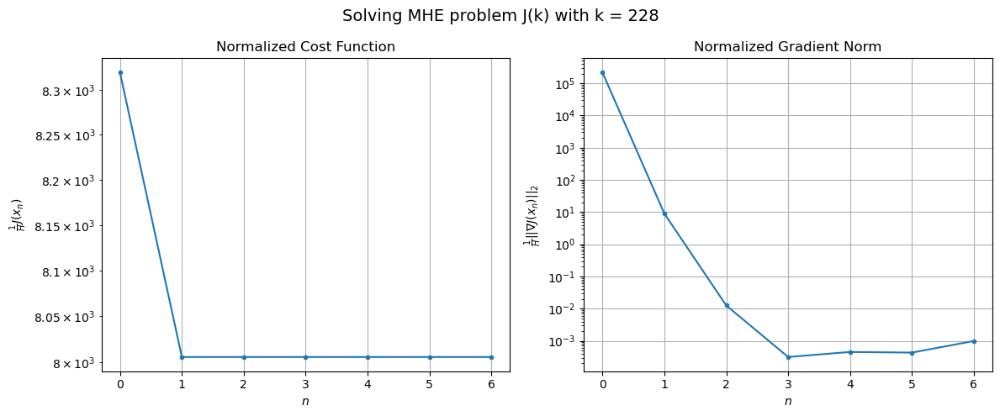

Windows:  55%|█████▍    | 200/366 [1:54:52<1:22:54, 29.97s/it]

[Hybrid] Before applying the algorithm
Cost function: 231510.6931180534
Gradient norm: 5820782.066260628
Global estimation error: 36.054729126222476
Initial conditions estimation errors: 18.51950549514817 m, 18.20100779360197 m, 17.955779763226325 m, 17.41396696744881 m
Position estimation errors: 19.60618543061448 m, 24.667992765824984 m, 14.752936513724153 m, 32.753837094694866 m

[Hybrid] Iteration 1
Cost function: 222932.1787788882 (-3.71%)
Gradient norm: 201.46048297987497 (-100.00%)
Global estimation error: 48.30408239647084 (33.97%)
Initial conditions estimation errors: 22.659575037674983 m, 20.897661585799472 m, 24.92158464179449 m, 27.604138033272502 m
Position estimation errors: 16.26432619266206 m, 19.475452939783242 m, 11.011301202567143 m, 26.198456741807732 m

[Hybrid] Iteration 2
Cost function: 222932.1764827965 (-0.00%)
Gradient norm: 0.45868295577835 (-99.77%)
Global estimation error: 47.9650250842788 (-0.70%)
Initial conditions estimation errors: 22.659575353053043 m,

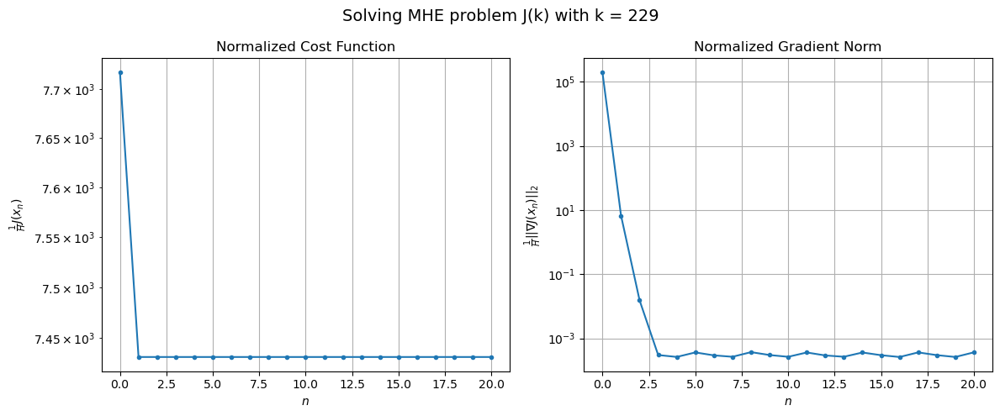

Windows:  55%|█████▍    | 201/366 [1:56:12<2:03:28, 44.90s/it]

[Hybrid] Before applying the algorithm
Cost function: 215993.53024731853
Gradient norm: 5097833.972023377
Global estimation error: 41.800627821175006
Initial conditions estimation errors: 17.52384881231444 m, 17.12099793831886 m, 19.51985395046169 m, 27.67699193223973 m
Position estimation errors: 19.24242400910913 m, 22.043546848013776 m, 13.93528146483853 m, 27.658819159418037 m

[Hybrid] Iteration 1
Cost function: 208290.7725758474 (-3.57%)
Gradient norm: 384.1978889645665 (-99.99%)
Global estimation error: 46.9002362887517 (12.20%)
Initial conditions estimation errors: 21.521122711058457 m, 20.95334702126378 m, 22.33524876752148 m, 28.258233685560615 m
Position estimation errors: 16.28979910854149 m, 18.173910288043295 m, 15.646851671889888 m, 14.675189791898022 m

[Hybrid] Iteration 2
Cost function: 208290.77135159017 (-0.00%)
Gradient norm: 0.7609957320296085 (-99.80%)
Global estimation error: 46.87527488992038 (-0.05%)
Initial conditions estimation errors: 21.52112307632264 m, 2

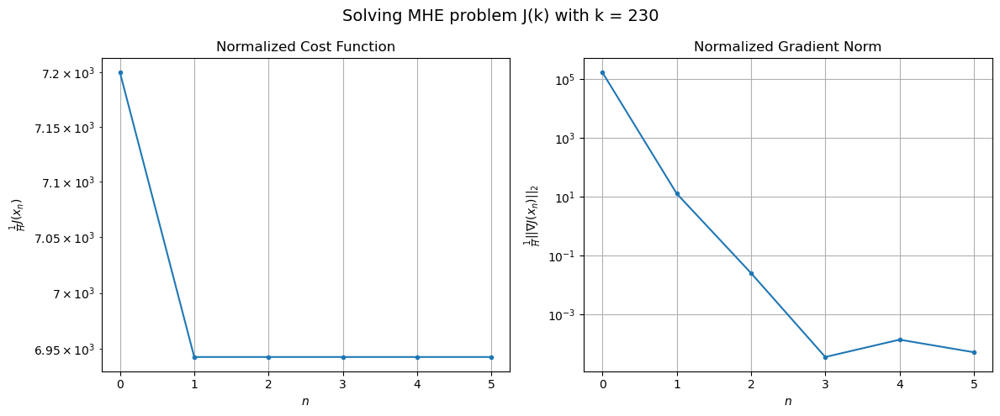

Windows:  55%|█████▌    | 202/366 [1:56:37<1:46:31, 38.97s/it]

[Hybrid] Before applying the algorithm
Cost function: 203457.56935104294
Gradient norm: 4460126.11860473
Global estimation error: 40.38468621717517
Initial conditions estimation errors: 16.557809519629195 m, 17.090917892267637 m, 16.982615793509762 m, 27.860714246926676 m
Position estimation errors: 19.34924843343767 m, 20.76675666613346 m, 18.948189394103224 m, 15.957462777959764 m

[Hybrid] Iteration 1
Cost function: 196246.61041013457 (-3.54%)
Gradient norm: 153.82678076080978 (-100.00%)
Global estimation error: 52.88698155865352 (30.96%)
Initial conditions estimation errors: 20.491137179236635 m, 22.429776956977417 m, 22.17262132222437 m, 37.1804750178062 m
Position estimation errors: 16.632241246426574 m, 17.344033888692906 m, 17.746809191747065 m, 17.86560563319467 m

[Hybrid] Iteration 2
Cost function: 196246.61017190976 (-0.00%)
Gradient norm: 0.0929632431863557 (-99.94%)
Global estimation error: 52.788604067702515 (-0.19%)
Initial conditions estimation errors: 20.4911375590959

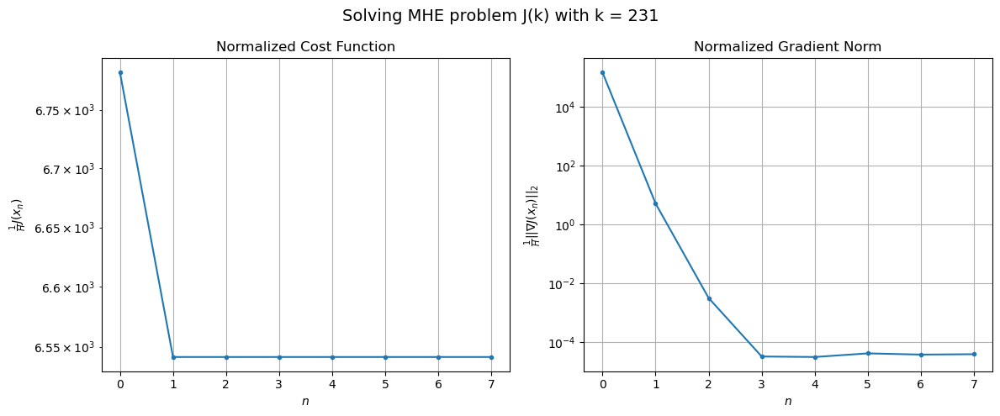

Windows:  55%|█████▌    | 203/366 [1:57:01<1:33:28, 34.41s/it]

[Hybrid] Before applying the algorithm
Cost function: 194418.64303408828
Gradient norm: 3845366.946111686
Global estimation error: 48.55738898465658
Initial conditions estimation errors: 15.893711733627764 m, 19.707093196052124 m, 16.79651494373288 m, 37.87725187702747 m
Position estimation errors: 19.86074253482724 m, 19.89962045284503 m, 21.309295814603068 m, 18.952889058196437 m

[Hybrid] Iteration 1
Cost function: 187651.60479176947 (-3.48%)
Gradient norm: 205.80003253725548 (-99.99%)
Global estimation error: 48.50034583122913 (-0.12%)
Initial conditions estimation errors: 19.72973918730194 m, 22.388614299308102 m, 20.22025248429981 m, 32.448096808553906 m
Position estimation errors: 17.241486247094144 m, 15.127121111638044 m, 19.085586616132844 m, 10.522883225257297 m

[Hybrid] Iteration 2
Cost function: 187651.60438992808 (-0.00%)
Gradient norm: 0.01902342351101662 (-99.99%)
Global estimation error: 48.6336836732737 (0.27%)
Initial conditions estimation errors: 19.72973945419606 

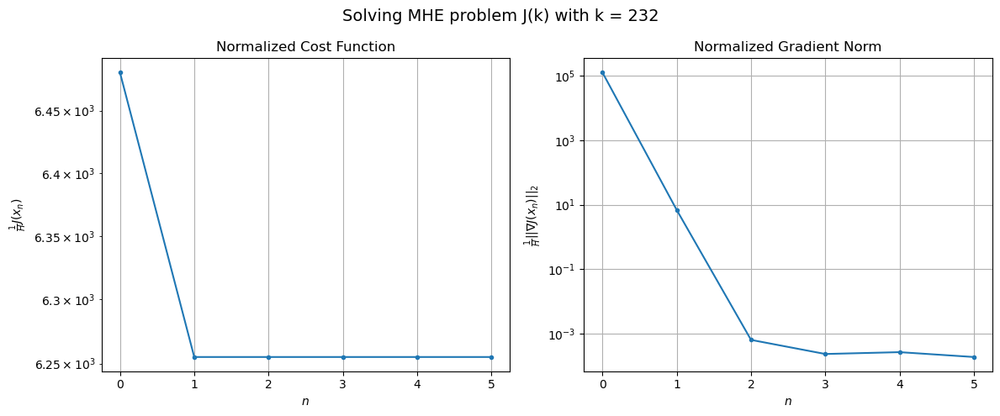

Windows:  56%|█████▌    | 204/366 [1:57:17<1:17:42, 28.78s/it]

[Hybrid] Before applying the algorithm
Cost function: 189774.08852624646
Gradient norm: 3617801.7960460093
Global estimation error: 43.547507795203835
Initial conditions estimation errors: 15.605307969107471 m, 19.784283103637115 m, 15.509877735094495 m, 31.95087653345792 m
Position estimation errors: 20.651975843512265 m, 17.911773984193893 m, 22.636926235812503 m, 12.259896982717182 m

[Hybrid] Iteration 1
Cost function: 182923.33044029825 (-3.61%)
Gradient norm: 261.2490414941736 (-99.99%)
Global estimation error: 66.39027031175864 (52.45%)
Initial conditions estimation errors: 19.42584794838617 m, 27.978147401535324 m, 19.349193608583438 m, 53.60136291556158 m
Position estimation errors: 17.927128459117252 m, 14.071177668560754 m, 18.48761759231613 m, 7.753719626174136 m

[Hybrid] Iteration 2
Cost function: 182923.3285737083 (-0.00%)
Gradient norm: 0.06218521952453753 (-99.98%)
Global estimation error: 66.72313577665508 (0.50%)
Initial conditions estimation errors: 19.4258480154660

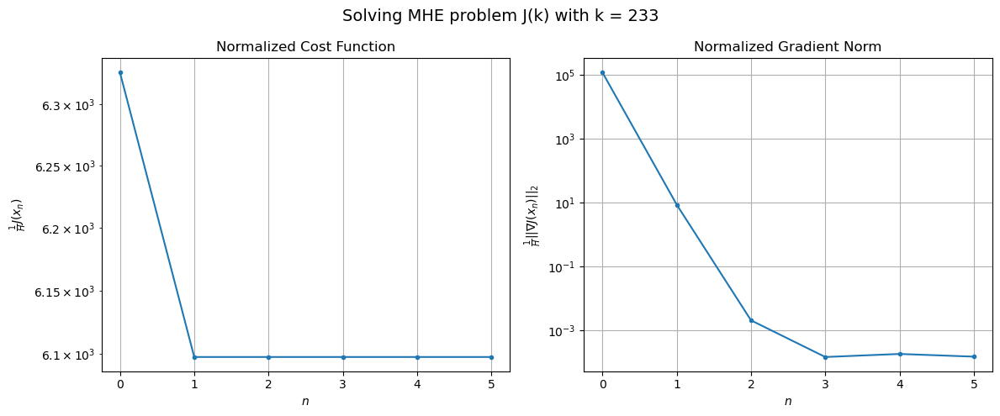

Windows:  56%|█████▌    | 205/366 [1:57:30<1:04:41, 24.11s/it]

[Hybrid] Before applying the algorithm
Cost function: 187123.82751672805
Gradient norm: 3409416.9256343315
Global estimation error: 64.12346398893837
Initial conditions estimation errors: 15.72733191930187 m, 26.461688398836376 m, 14.589830974059572 m, 54.326420414529196 m
Position estimation errors: 21.473930210746392 m, 16.595126313611004 m, 22.347130631556425 m, 8.470229956759175 m

[Hybrid] Iteration 1
Cost function: 179907.745964377 (-3.86%)
Gradient norm: 59.94403282637656 (-100.00%)
Global estimation error: 62.075919375654195 (-3.19%)
Initial conditions estimation errors: 19.611747135026917 m, 28.498860757236155 m, 18.64385084077455 m, 48.05197078758863 m
Position estimation errors: 18.59097897663725 m, 15.758446466330382 m, 19.055708282936568 m, 14.6132891325697 m

[Hybrid] Iteration 2
Cost function: 179907.74592846096 (-0.00%)
Gradient norm: 0.007955168668333856 (-99.99%)
Global estimation error: 62.11958293990002 (0.07%)
Initial conditions estimation errors: 19.61174695106191

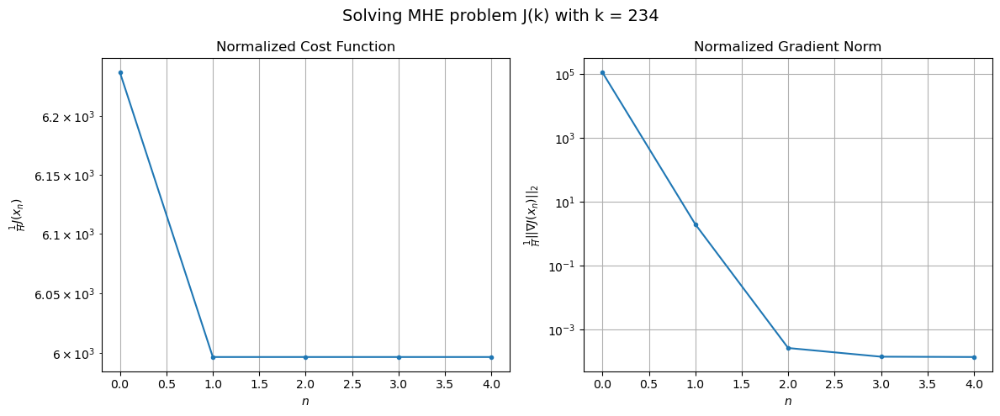

Windows:  56%|█████▋    | 206/366 [1:57:42<54:33, 20.46s/it]  

[Hybrid] Before applying the algorithm
Cost function: 184992.217342076
Gradient norm: 3208330.9944154397
Global estimation error: 58.98870722085658
Initial conditions estimation errors: 16.17263402239439 m, 26.602118228913348 m, 14.204194104432013 m, 48.04847426670804 m
Position estimation errors: 22.21440624657328 m, 18.491605363148004 m, 22.923178083275538 m, 15.830558184647984 m

[Hybrid] Iteration 1
Cost function: 177477.6510453759 (-4.06%)
Gradient norm: 37.69901374828767 (-100.00%)
Global estimation error: 74.73731297532687 (26.70%)
Initial conditions estimation errors: 20.08103442841611 m, 32.56834009171494 m, 18.091736197024023 m, 61.598549221055734 m
Position estimation errors: 19.18325300508992 m, 14.438502498669253 m, 20.03921949980067 m, 9.826129183596937 m

[Hybrid] Iteration 2
Cost function: 177477.6508633807 (-0.00%)
Gradient norm: 0.144644162366293 (-99.62%)
Global estimation error: 75.12403371420675 (0.52%)
Initial conditions estimation errors: 20.081033994441025 m, 32

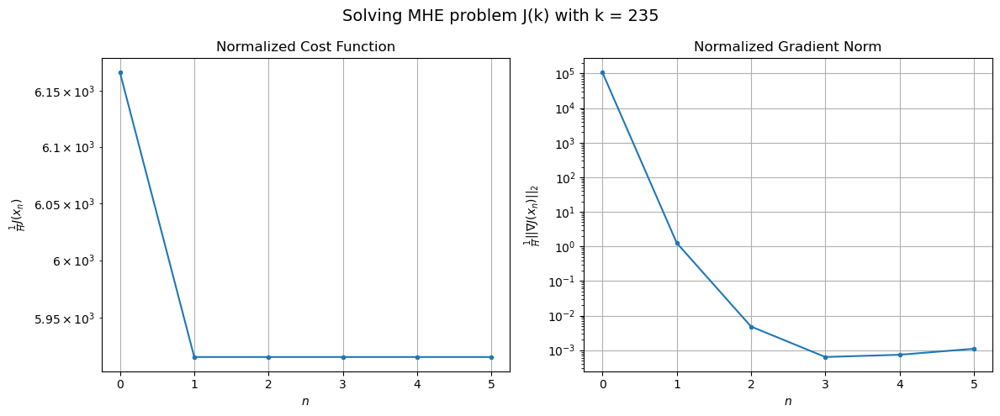

Windows:  57%|█████▋    | 207/366 [1:58:00<52:51, 19.95s/it]

[Hybrid] Before applying the algorithm
Cost function: 183062.83053679546
Gradient norm: 3061685.1061553992
Global estimation error: 72.03548819485086
Initial conditions estimation errors: 16.714834900732754 m, 30.699237517189726 m, 13.502697638878905 m, 61.521809971136626 m
Position estimation errors: 22.835686121161096 m, 17.031828820362758 m, 23.97280651179691 m, 10.500080579631051 m

[Hybrid] Iteration 1
Cost function: 175057.14306837213 (-4.37%)
Gradient norm: 383.16168806535063 (-99.99%)
Global estimation error: 66.31557539641426 (-7.94%)
Initial conditions estimation errors: 20.663816281770643 m, 32.85197971057343 m, 16.128512493174686 m, 51.29670716626508 m
Position estimation errors: 19.600361364110505 m, 16.141166369923344 m, 20.990032339460715 m, 28.468507936419215 m

[Hybrid] Iteration 2
Cost function: 175057.14267474765 (-0.00%)
Gradient norm: 0.018621417896179934 (-100.00%)
Global estimation error: 66.47684664767465 (0.24%)
Initial conditions estimation errors: 20.66381563

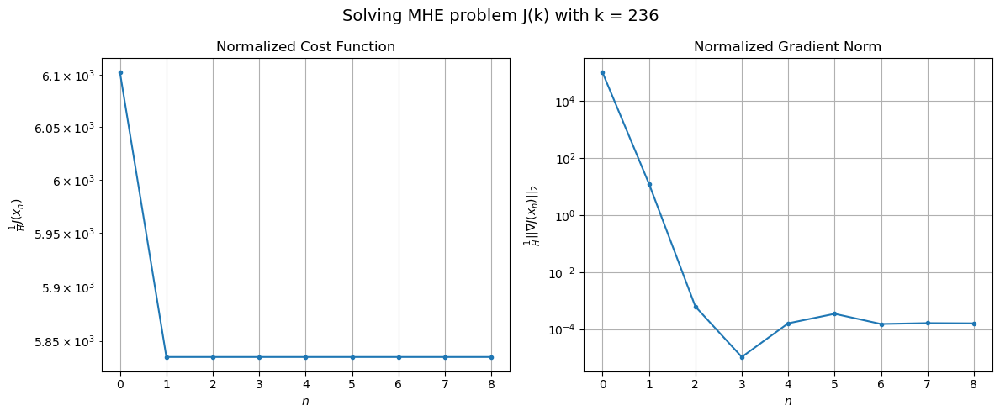

Windows:  57%|█████▋    | 208/366 [1:58:23<54:40, 20.76s/it]

[Hybrid] Before applying the algorithm
Cost function: 181106.55495551764
Gradient norm: 3120250.805172824
Global estimation error: 63.59670762677694
Initial conditions estimation errors: 17.22939510915252 m, 30.95469870130713 m, 11.585627481280227 m, 51.529050809321255 m
Position estimation errors: 23.23342385210894 m, 18.659728906177886 m, 24.95802348600646 m, 29.22859450169935 m

[Hybrid] Iteration 1
Cost function: 172577.9486582239 (-4.71%)
Gradient norm: 50.71260918789453 (-100.00%)
Global estimation error: 67.41494323212697 (6.00%)
Initial conditions estimation errors: 21.20681036054207 m, 34.39698960374712 m, 16.773179499518356 m, 51.288638474534245 m
Position estimation errors: 19.77813623782433 m, 14.057339879911803 m, 21.153791616009478 m, 21.76342313392989 m

[Hybrid] Iteration 2
Cost function: 172577.94863035769 (-0.00%)
Gradient norm: 0.023413934919241573 (-99.95%)
Global estimation error: 67.48044405827513 (0.10%)
Initial conditions estimation errors: 21.206809584438627 m,

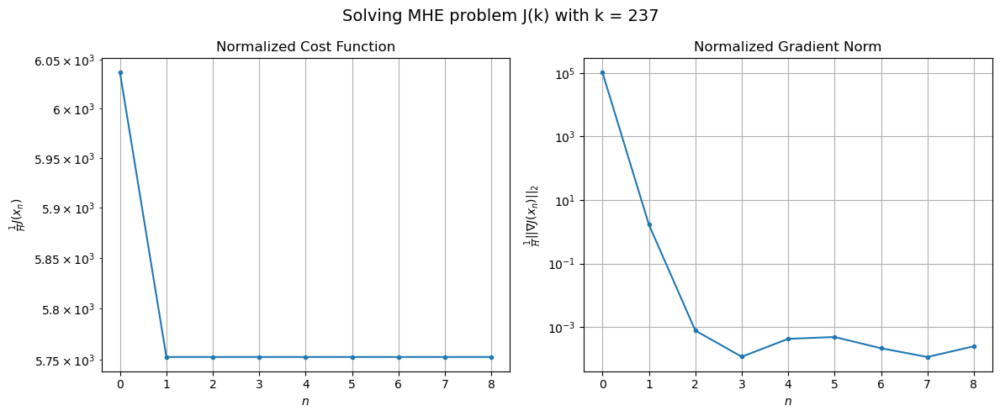

Windows:  57%|█████▋    | 209/366 [1:58:42<52:49, 20.19s/it]

[Hybrid] Before applying the algorithm
Cost function: 177167.19199350363
Gradient norm: 3067465.7384905424
Global estimation error: 63.32719793547524
Initial conditions estimation errors: 17.64146930981401 m, 31.860543258778346 m, 12.550771168632815 m, 50.26401130665751 m
Position estimation errors: 23.34068859871971 m, 16.68250487771825 m, 24.947680613961836 m, 22.943686717937442 m

[Hybrid] Iteration 1
Cost function: 168391.71709403797 (-4.95%)
Gradient norm: 784.3909400295128 (-99.97%)
Global estimation error: 47.005247808878515 (-25.77%)
Initial conditions estimation errors: 21.60275077205603 m, 29.67696356757544 m, 19.706534372293966 m, 21.765011264995774 m
Position estimation errors: 19.746728706952982 m, 11.531475669520528 m, 20.178334973386654 m, 15.797551650597537 m

[Hybrid] Iteration 2
Cost function: 168391.7043962927 (-0.00%)
Gradient norm: 0.5418720765502185 (-99.93%)
Global estimation error: 46.67914216723427 (-0.69%)
Initial conditions estimation errors: 21.6027499533582

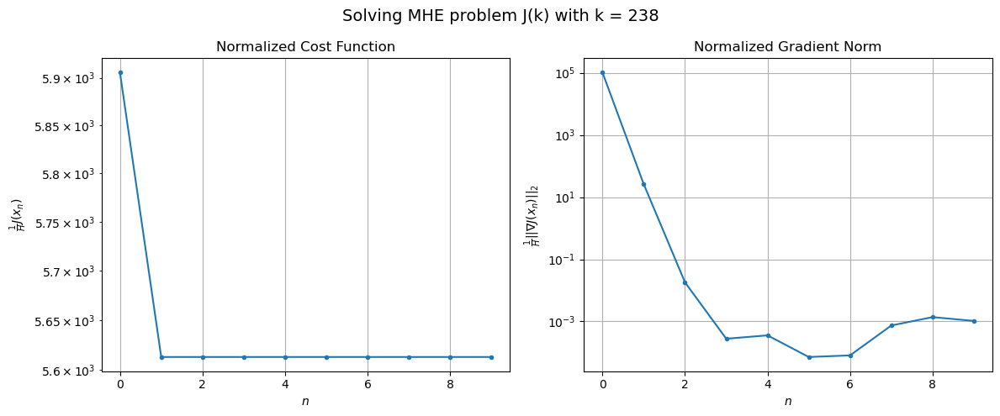

Windows:  57%|█████▋    | 210/366 [1:59:03<52:55, 20.36s/it]

[Hybrid] Before applying the algorithm
Cost function: 171593.44496155417
Gradient norm: 3037661.244680725
Global estimation error: 39.559036586578316
Initial conditions estimation errors: 17.89713382536151 m, 26.05962733614534 m, 16.36662970564355 m, 17.251482271832888 m
Position estimation errors: 23.210778423041877 m, 14.53517074470464 m, 23.613495319024384 m, 19.171602647224226 m

[Hybrid] Iteration 1
Cost function: 162713.7440586783 (-5.17%)
Gradient norm: 9.734986716475365 (-100.00%)
Global estimation error: 49.26451909419919 (24.53%)
Initial conditions estimation errors: 21.820695591963883 m, 29.837117234832544 m, 20.337762555907265 m, 25.435087757619083 m
Position estimation errors: 19.515397770614722 m, 12.236805220080345 m, 19.904749119851136 m, 14.20229766987525 m

[Hybrid] Iteration 2
Cost function: 162713.7440532294 (-0.00%)
Gradient norm: 0.026417689562052194 (-99.73%)
Global estimation error: 49.31153835137442 (0.10%)
Initial conditions estimation errors: 21.8206948174487

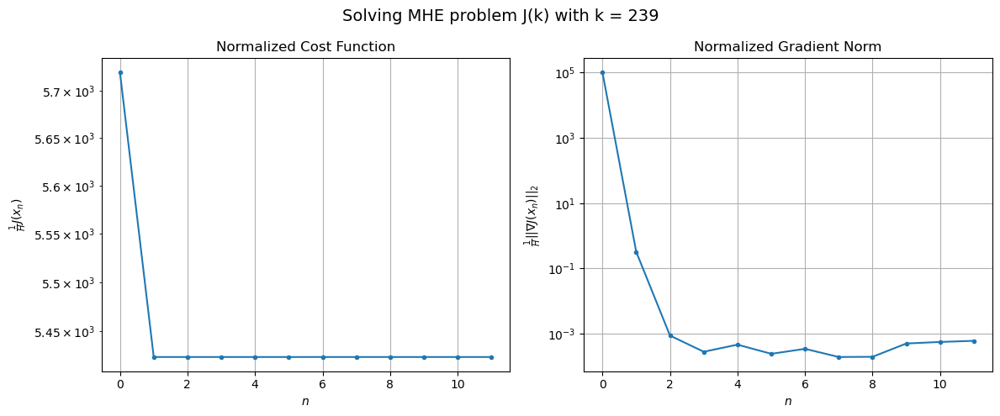

Windows:  58%|█████▊    | 211/366 [1:59:25<54:07, 20.95s/it]

[Hybrid] Before applying the algorithm
Cost function: 165127.86805484755
Gradient norm: 3013925.4034678363
Global estimation error: 41.86625052258671
Initial conditions estimation errors: 17.988100535696052 m, 26.15981361275942 m, 16.70707807547437 m, 21.58064596858704 m
Position estimation errors: 22.889366337365228 m, 15.152137814193797 m, 23.287477379537993 m, 17.439374995729246 m

[Hybrid] Iteration 1
Cost function: 156325.03446606157 (-5.33%)
Gradient norm: 219.9154032087984 (-99.99%)
Global estimation error: 46.29916418138873 (10.59%)
Initial conditions estimation errors: 21.839697327536527 m, 28.69632021944993 m, 20.97111940657925 m, 20.0834487910544 m
Position estimation errors: 19.138297144321484 m, 9.785613028245612 m, 19.366701095324746 m, 4.680446884707434 m

[Hybrid] Iteration 2
Cost function: 156325.0341967768 (-0.00%)
Gradient norm: 0.032438600869766805 (-99.99%)
Global estimation error: 46.389875142939694 (0.20%)
Initial conditions estimation errors: 21.83969664159454 m

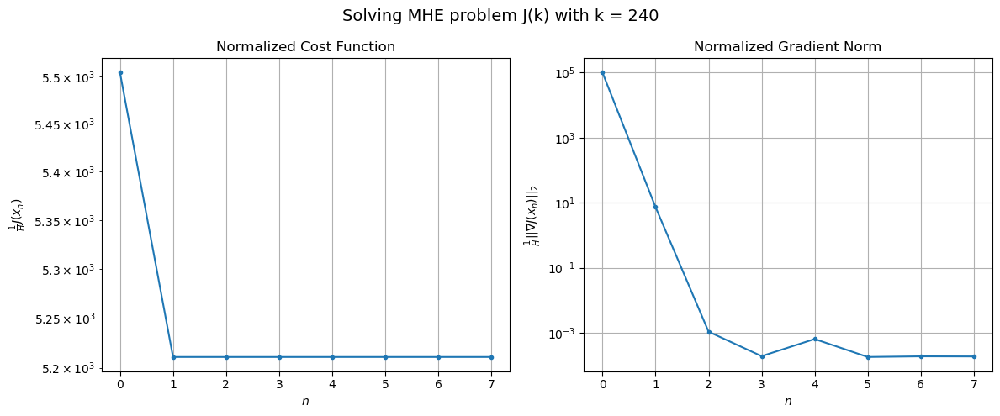

Windows:  58%|█████▊    | 212/366 [1:59:41<49:32, 19.30s/it]

[Hybrid] Before applying the algorithm
Cost function: 158202.58119902303
Gradient norm: 3118604.588304625
Global estimation error: 38.16279229489405
Initial conditions estimation errors: 17.89628258356339 m, 24.634157709563475 m, 17.297934600859854 m, 15.166937313953067 m
Position estimation errors: 22.461248383632743 m, 12.76698374413571 m, 22.6765068310725 m, 7.7492436819893555 m

[Hybrid] Iteration 1
Cost function: 149529.68835967855 (-5.48%)
Gradient norm: 204.70139463161556 (-99.99%)
Global estimation error: 44.53632400973201 (16.70%)
Initial conditions estimation errors: 21.68237577224189 m, 26.18327887397224 m, 22.387506740545085 m, 18.07107033950103 m
Position estimation errors: 18.689535960375636 m, 9.387125103519143 m, 18.29559131908209 m, 10.456102400394123 m

[Hybrid] Iteration 2
Cost function: 149529.68814419306 (-0.00%)
Gradient norm: 0.5258476892544304 (-99.74%)
Global estimation error: 44.30938661314093 (-0.51%)
Initial conditions estimation errors: 21.68237518937171 m,

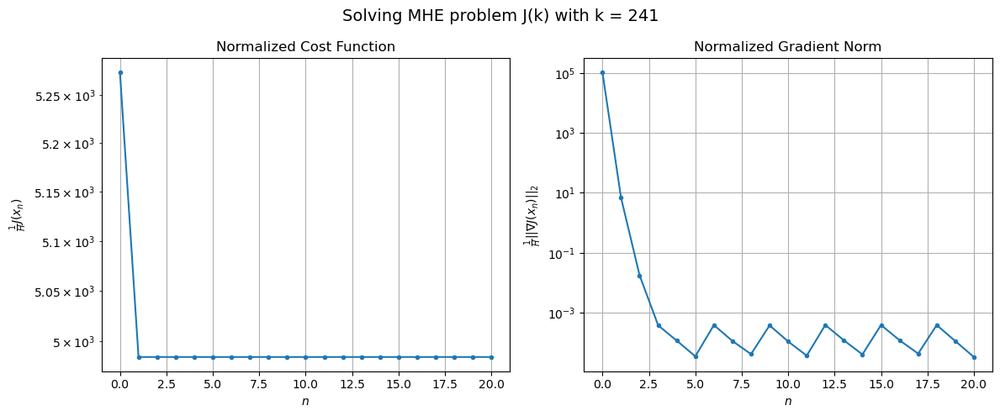

Windows:  58%|█████▊    | 213/366 [2:00:20<1:04:22, 25.24s/it]

[Hybrid] Before applying the algorithm
Cost function: 150160.1180986819
Gradient norm: 3095282.5827349075
Global estimation error: 35.37811113423179
Initial conditions estimation errors: 17.64950932258684 m, 21.55131008089558 m, 18.616905108423264 m, 11.35912666632292 m
Position estimation errors: 22.004487567455357 m, 12.538303246668491 m, 21.49068856523976 m, 7.749428425559134 m

[Hybrid] Iteration 1
Cost function: 141777.0664393619 (-5.58%)
Gradient norm: 2986.465492235922 (-99.90%)
Global estimation error: 49.17818937384966 (39.01%)
Initial conditions estimation errors: 21.353319221453706 m, 29.879436989140544 m, 19.111600181173415 m, 26.541941241434028 m
Position estimation errors: 18.266729309324194 m, 13.274327020526638 m, 19.33941187908094 m, 34.13316464765644 m

[Hybrid] Iteration 2
Cost function: 141777.03509494103 (-0.00%)
Gradient norm: 3.419325648743852 (-99.89%)
Global estimation error: 49.0615654547451 (-0.24%)
Initial conditions estimation errors: 21.35331872357365 m, 2

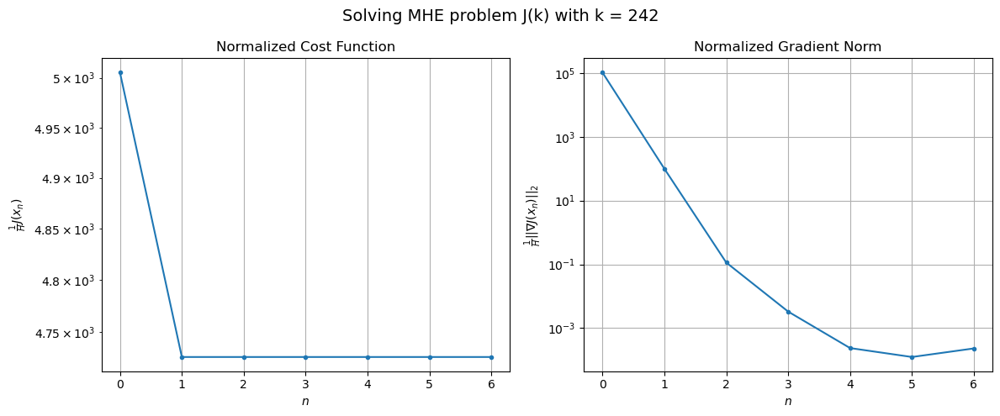

Windows:  58%|█████▊    | 214/366 [2:00:33<54:51, 21.66s/it]  

[Hybrid] Before applying the algorithm
Cost function: 142570.99835101143
Gradient norm: 3078216.595361007
Global estimation error: 41.63138132702988
Initial conditions estimation errors: 17.269722054358056 m, 25.605709490050707 m, 15.274307683810845 m, 23.36564107929127 m
Position estimation errors: 21.62039576978622 m, 15.893517479758017 m, 22.697427094690045 m, 35.00529942558156 m

[Hybrid] Iteration 1
Cost function: 134372.22367016334 (-5.75%)
Gradient norm: 711.2429705089531 (-99.98%)
Global estimation error: 40.29897930315851 (-3.20%)
Initial conditions estimation errors: 20.91752126822113 m, 25.56326307762867 m, 21.112869657566723 m, 9.338499563165415 m
Position estimation errors: 17.897850788868958 m, 10.440535836151662 m, 17.73370712120739 m, 16.5517797548865 m

[Hybrid] Iteration 2
Cost function: 134372.22018468622 (-0.00%)
Gradient norm: 0.8264895905422321 (-99.88%)
Global estimation error: 40.121912386585386 (-0.44%)
Initial conditions estimation errors: 20.917520863096215 m

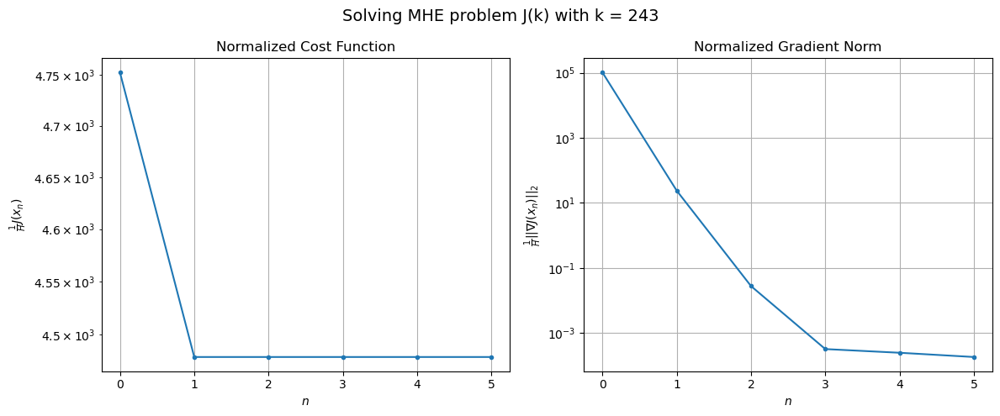

Windows:  59%|█████▊    | 215/366 [2:00:45<47:04, 18.71s/it]

[Hybrid] Before applying the algorithm
Cost function: 134665.36187557605
Gradient norm: 3092378.0831316323
Global estimation error: 32.14736139943712
Initial conditions estimation errors: 16.832448164672773 m, 20.893290524615487 m, 17.187674763013955 m, 4.260869643175962 m
Position estimation errors: 21.330933054083022 m, 13.647269616411116 m, 21.074684600465684 m, 20.367265676349714 m

[Hybrid] Iteration 1
Cost function: 126772.87965853313 (-5.86%)
Gradient norm: 290.53824662463643 (-99.99%)
Global estimation error: 37.92015363914333 (17.96%)
Initial conditions estimation errors: 20.404674260229495 m, 17.804115425678777 m, 22.606598420503676 m, 13.9110796426539 m
Position estimation errors: 17.662248714236267 m, 12.06983173370146 m, 16.452161840932245 m, 14.215754249775342 m

[Hybrid] Iteration 2
Cost function: 126772.87819223502 (-0.00%)
Gradient norm: 0.24518584885831757 (-99.92%)
Global estimation error: 37.79818530368063 (-0.32%)
Initial conditions estimation errors: 20.4046739214

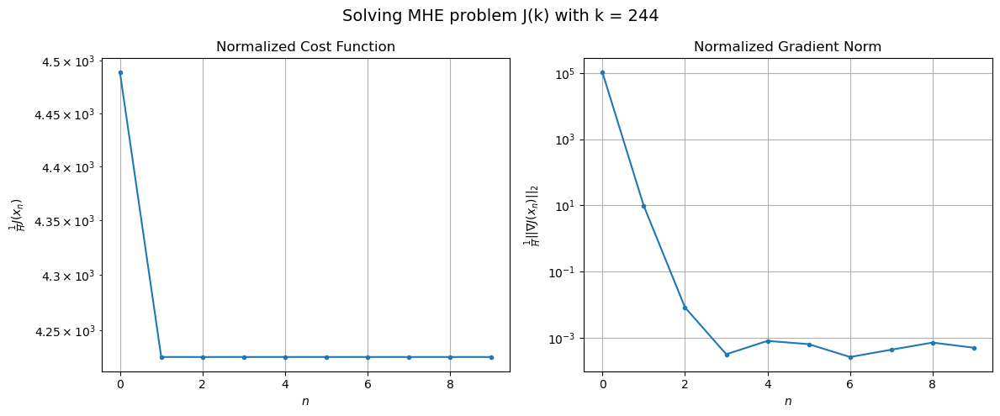

Windows:  59%|█████▉    | 216/366 [2:01:04<47:26, 18.98s/it]

[Hybrid] Before applying the algorithm
Cost function: 128535.28251713116
Gradient norm: 3029141.2547285813
Global estimation error: 33.488273948728946
Initial conditions estimation errors: 16.36973269980544 m, 13.394081767441117 m, 18.499908023400515 m, 18.216133322655562 m
Position estimation errors: 21.2028621132902 m, 15.876184407278053 m, 19.870611083927855 m, 20.29787534454067 m

[Hybrid] Iteration 1
Cost function: 120968.3240992592 (-5.89%)
Gradient norm: 125.35912712823985 (-100.00%)
Global estimation error: 37.11536696712417 (10.83%)
Initial conditions estimation errors: 19.856264876995134 m, 21.804717119013148 m, 19.891806154753823 m, 10.588964636386413 m
Position estimation errors: 17.595639689061276 m, 10.342922852123706 m, 17.678389548982487 m, 6.687440062641143 m

[Hybrid] Iteration 2
Cost function: 120968.31914692944 (-0.00%)
Gradient norm: 53.5705225609523 (-57.27%)
Global estimation error: 40.01926720552688 (7.82%)
Initial conditions estimation errors: 19.85626457378009

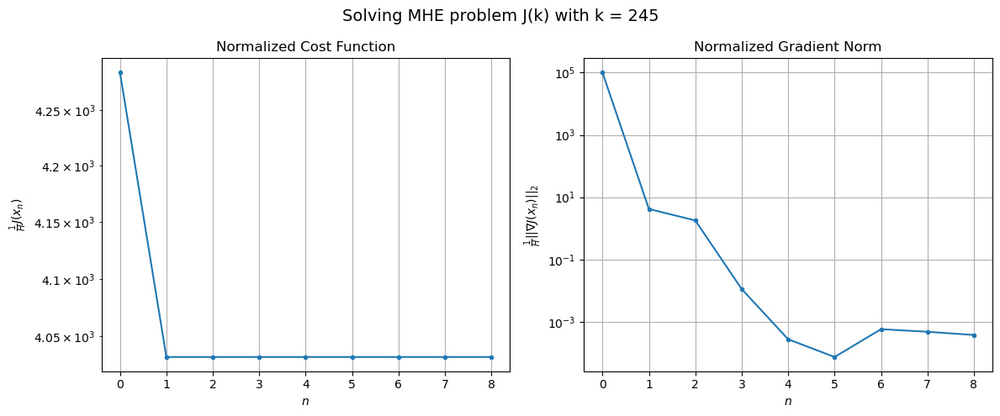

Windows:  59%|█████▉    | 217/366 [2:01:22<45:56, 18.50s/it]

[Hybrid] Before applying the algorithm
Cost function: 124026.50619373372
Gradient norm: 2999560.6545318267
Global estimation error: 31.91014519197457
Initial conditions estimation errors: 15.901282258207418 m, 19.046056545931627 m, 15.281201519432656 m, 13.004613025507894 m
Position estimation errors: 21.25210649403034 m, 14.104359815037679 m, 21.876302521137617 m, 12.237042828600122 m

[Hybrid] Iteration 1
Cost function: 116637.2021378072 (-5.96%)
Gradient norm: 20.089639532152002 (-100.00%)
Global estimation error: 38.324049801856184 (20.10%)
Initial conditions estimation errors: 19.33623222081372 m, 20.794767122238763 m, 19.493298475552482 m, 16.805075776121676 m
Position estimation errors: 17.672679665085113 m, 12.857645984038346 m, 17.56858806602031 m, 7.514175853711352 m

[Hybrid] Iteration 2
Cost function: 116637.20213063898 (-0.00%)
Gradient norm: 0.01670127379946337 (-99.92%)
Global estimation error: 38.28225384600511 (-0.11%)
Initial conditions estimation errors: 19.336231934

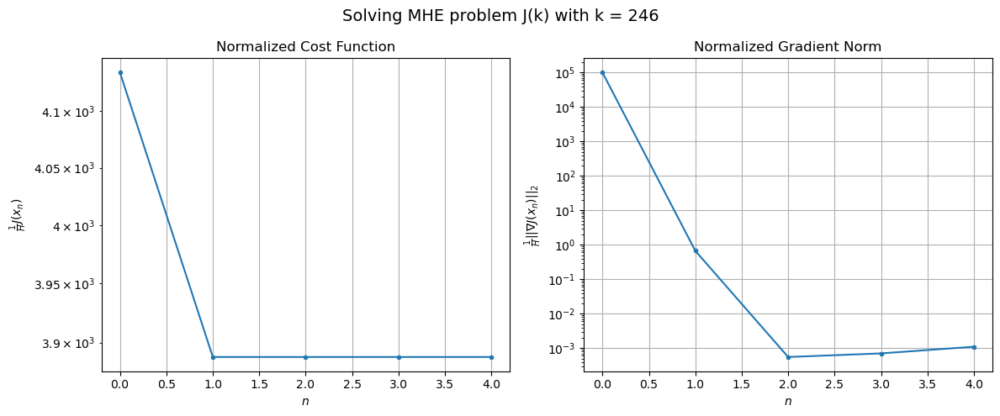

Windows:  60%|█████▉    | 218/366 [2:01:33<40:12, 16.30s/it]

[Hybrid] Before applying the algorithm
Cost function: 120437.10780749579
Gradient norm: 2879077.8583521536
Global estimation error: 30.043500380714985
Initial conditions estimation errors: 15.468325317955951 m, 16.58023846625733 m, 15.65775356726163 m, 11.968897124889057 m
Position estimation errors: 21.428052193417646 m, 16.601856251698305 m, 21.298984996926713 m, 11.249620895347375 m

[Hybrid] Iteration 1
Cost function: 113175.12642936983 (-6.03%)
Gradient norm: 2190.4759123549443 (-99.92%)
Global estimation error: 65.76278128721667 (118.89%)
Initial conditions estimation errors: 18.871602324379374 m, 28.95524311333999 m, 18.027195197261243 m, 52.96418961888161 m
Position estimation errors: 17.875657356924414 m, 13.893781342002141 m, 19.02643230332595 m, 28.46839060878401 m

[Hybrid] Iteration 2
Cost function: 113175.08658039132 (-0.00%)
Gradient norm: 3.079955077467006 (-99.86%)
Global estimation error: 63.85224459951394 (-2.91%)
Initial conditions estimation errors: 18.871602051092

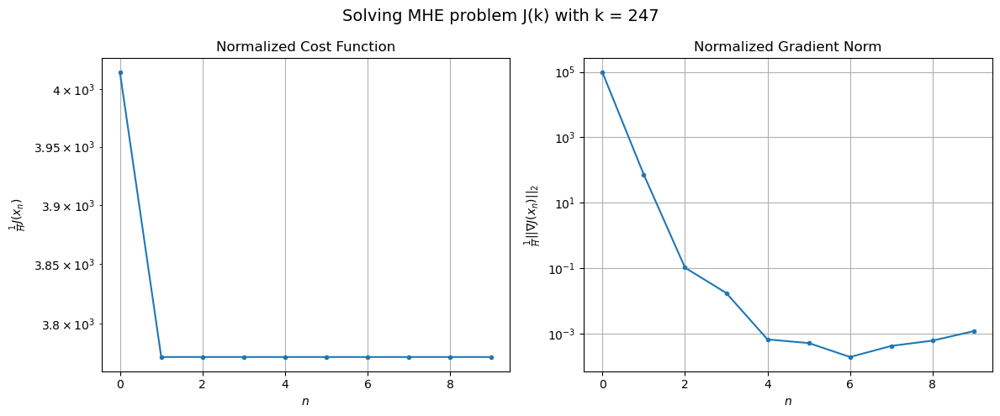

Windows:  60%|█████▉    | 219/366 [2:01:51<41:29, 16.93s/it]

[Hybrid] Before applying the algorithm
Cost function: 118600.0283977014
Gradient norm: 2849157.8261799635
Global estimation error: 57.57809678826085
Initial conditions estimation errors: 15.083489941562949 m, 24.509149669528156 m, 14.503778237989286 m, 47.714297838525226 m
Position estimation errors: 21.70048211347964 m, 17.13202180114224 m, 22.785092619481063 m, 29.246265498751473 m

[Hybrid] Iteration 1
Cost function: 111394.98926998214 (-6.08%)
Gradient norm: 479.4907983210468 (-99.98%)
Global estimation error: 55.58242058992631 (-3.47%)
Initial conditions estimation errors: 18.456989596993136 m, 26.46061559779047 m, 17.477857140619232 m, 41.75030430158084 m
Position estimation errors: 18.14949035197438 m, 11.889951603829914 m, 19.40566225679161 m, 10.55824283904687 m

[Hybrid] Iteration 2
Cost function: 111394.98732032429 (-0.00%)
Gradient norm: 5.278373321482794 (-98.90%)
Global estimation error: 54.32536179170044 (-2.26%)
Initial conditions estimation errors: 18.456989330977173 m

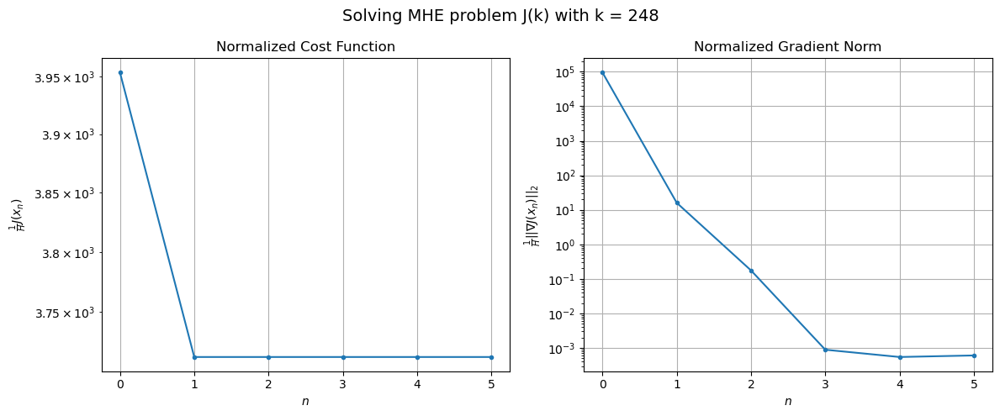

Windows:  60%|██████    | 220/366 [2:02:04<38:07, 15.67s/it]

[Hybrid] Before applying the algorithm
Cost function: 118568.82577572485
Gradient norm: 2688955.243572185
Global estimation error: 47.049797594582955
Initial conditions estimation errors: 14.745289886812323 m, 22.095352154620695 m, 13.947567522448319 m, 36.24230587715733 m
Position estimation errors: 22.011263417040006 m, 15.216407559030735 m, 23.277422401271828 m, 11.740725737561839 m

[Hybrid] Iteration 1
Cost function: 111470.26234160691 (-5.99%)
Gradient norm: 1229.942449208355 (-99.95%)
Global estimation error: 73.7911858925255 (56.84%)
Initial conditions estimation errors: 18.078763038090013 m, 30.593872931440995 m, 16.70998092634294 m, 62.47460176251551 m
Position estimation errors: 18.479068318608647 m, 15.436190761394172 m, 21.222439325643645 m, 29.37582168871292 m

[Hybrid] Iteration 2
Cost function: 111470.25237775613 (-0.00%)
Gradient norm: 1.9204931817478577 (-99.84%)
Global estimation error: 72.20974496699405 (-2.14%)
Initial conditions estimation errors: 18.0787627968633

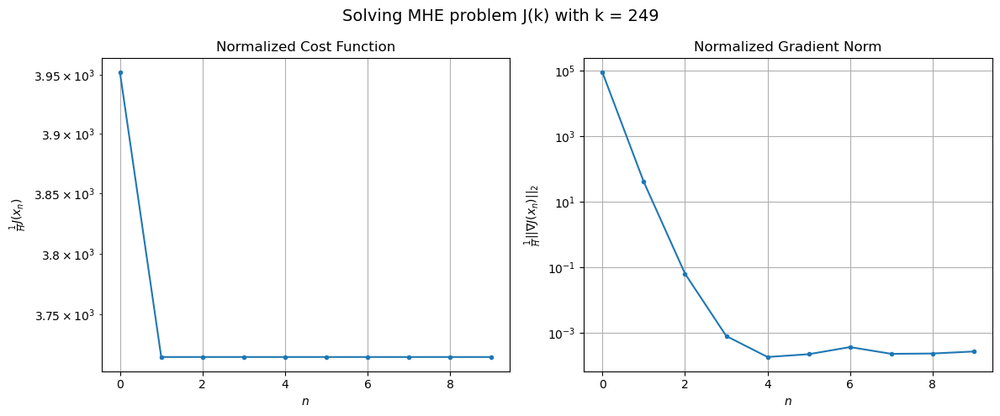

Windows:  60%|██████    | 221/366 [2:02:23<39:55, 16.52s/it]

[Hybrid] Before applying the algorithm
Cost function: 120069.79779341325
Gradient norm: 2498441.469293962
Global estimation error: 67.40157857195359
Initial conditions estimation errors: 14.455466912094913 m, 26.67297708442216 m, 13.445078464526828 m, 58.66671049246544 m
Position estimation errors: 22.352984633873387 m, 18.4856184571223 m, 25.205656700845307 m, 29.621061681876526 m

[Hybrid] Iteration 1
Cost function: 113016.03666586353 (-5.87%)
Gradient norm: 263.405175567649 (-99.99%)
Global estimation error: 79.73834569729176 (18.30%)
Initial conditions estimation errors: 17.76260075834818 m, 28.921603764622557 m, 17.279861560577856 m, 70.05447551327607 m
Position estimation errors: 18.82881112319625 m, 18.813441939270806 m, 21.2446197178509 m, 37.29857516706605 m

[Hybrid] Iteration 2
Cost function: 113016.0361973831 (-0.00%)
Gradient norm: 0.1201724503363285 (-99.95%)
Global estimation error: 80.09726947484361 (0.45%)
Initial conditions estimation errors: 17.762600538234064 m, 28.

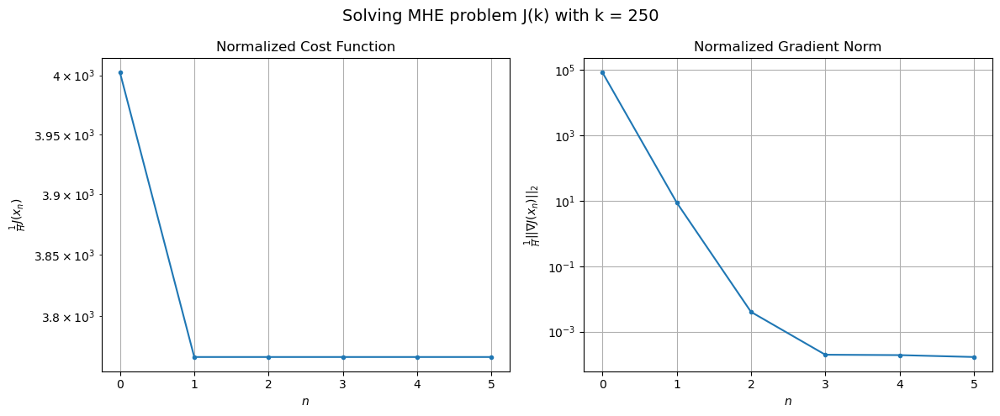

Windows:  61%|██████    | 222/366 [2:02:34<36:03, 15.02s/it]

[Hybrid] Before applying the algorithm
Cost function: 123457.53606243418
Gradient norm: 2396413.0661869016
Global estimation error: 76.54311224865229
Initial conditions estimation errors: 14.248455937172091 m, 25.6984742175396 m, 14.065534265621746 m, 69.26448512838243 m
Position estimation errors: 22.694968693523286 m, 21.846866017881503 m, 25.377183809236943 m, 36.57699201997221 m

[Hybrid] Iteration 1
Cost function: 116291.34144794269 (-5.80%)
Gradient norm: 284.1431401984957 (-99.99%)
Global estimation error: 52.91880274338326 (-30.86%)
Initial conditions estimation errors: 17.555949294901385 m, 19.335010203517477 m, 20.20539759345094 m, 41.353071384437506 m
Position estimation errors: 19.140289754926037 m, 24.61594448290958 m, 16.508306454854676 m, 42.45201402513861 m

[Hybrid] Iteration 2
Cost function: 116291.33675577013 (-0.00%)
Gradient norm: 2.0450721852467066 (-99.28%)
Global estimation error: 54.60592992139237 (3.19%)
Initial conditions estimation errors: 17.555949088649943

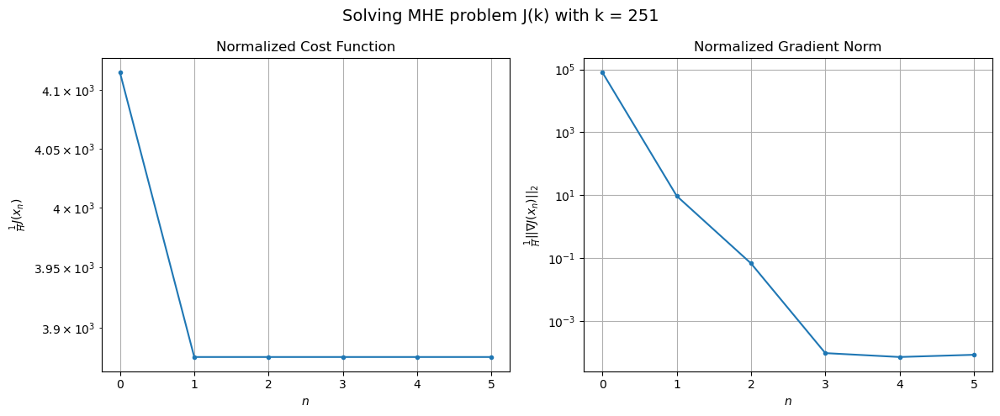

Windows:  61%|██████    | 223/366 [2:02:46<33:27, 14.04s/it]

[Hybrid] Before applying the algorithm
Cost function: 127109.14209024991
Gradient norm: 2173229.7048671776
Global estimation error: 50.322645324054584
Initial conditions estimation errors: 14.163568453988349 m, 16.74939806471202 m, 16.64907851225572 m, 42.11909923799633 m
Position estimation errors: 22.98638552918277 m, 28.172696944668495 m, 20.561778858467036 m, 44.021725313951265 m

[Hybrid] Iteration 1
Cost function: 120093.27428723163 (-5.52%)
Gradient norm: 853.055810759187 (-99.96%)
Global estimation error: 45.39282942475962 (-9.80%)
Initial conditions estimation errors: 17.423390121324605 m, 17.12786701766728 m, 23.201967995241016 m, 30.41758483936121 m
Position estimation errors: 19.48233204269702 m, 32.54923339623828 m, 12.749926795317077 m, 71.19767463690347 m

[Hybrid] Iteration 2
Cost function: 120093.2708431827 (-0.00%)
Gradient norm: 8.134319921441323 (-99.05%)
Global estimation error: 45.363046243533745 (-0.07%)
Initial conditions estimation errors: 17.423389904538226 m,

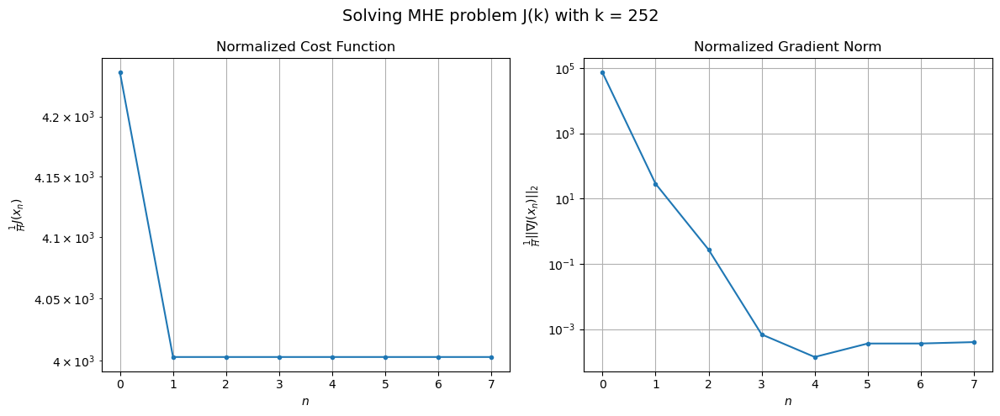

Windows:  61%|██████    | 224/366 [2:03:01<33:53, 14.32s/it]

[Hybrid] Before applying the algorithm
Cost function: 132230.3204345534
Gradient norm: 2110075.3698436487
Global estimation error: 41.677489303010375
Initial conditions estimation errors: 14.154134825868518 m, 14.786568898704331 m, 19.327667565037665 m, 30.732130542237467 m
Position estimation errors: 23.3021100778614 m, 35.439926944470606 m, 16.912549809772422 m, 70.05643119109251 m

[Hybrid] Iteration 1
Cost function: 125131.8192123377 (-5.37%)
Gradient norm: 14845.659747141814 (-99.30%)
Global estimation error: 33.65570533536584 (-19.25%)
Initial conditions estimation errors: 17.417722028450008 m, 10.06463067987347 m, 17.0913910949955 m, 20.878033397677132 m
Position estimation errors: 19.794238292214807 m, 14.296845746934826 m, 19.967819533329926 m, 23.012238888126713 m

[Hybrid] Iteration 2
Cost function: 125130.82690137513 (-0.00%)
Gradient norm: 250.07632435493198 (-98.32%)
Global estimation error: 34.23173644973479 (1.71%)
Initial conditions estimation errors: 17.41772182112684

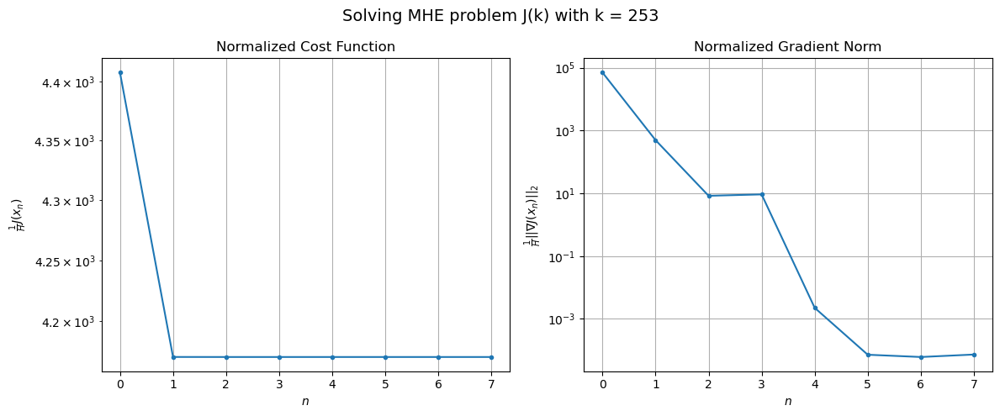

Windows:  61%|██████▏   | 225/366 [2:03:17<35:14, 15.00s/it]

[Hybrid] Before applying the algorithm
Cost function: 137599.0931422251
Gradient norm: 2235683.700031804
Global estimation error: 30.5993455659975
Initial conditions estimation errors: 14.251616544095343 m, 6.755875582412846 m, 15.553230588775063 m, 21.110468481359234 m
Position estimation errors: 23.594458842760968 m, 24.851213240812495 m, 20.930751726473023 m, 15.500123545647348 m

[Hybrid] Iteration 1
Cost function: 130514.33794720811 (-5.15%)
Gradient norm: 46.152529961485705 (-100.00%)
Global estimation error: 29.12108762720885 (-4.83%)
Initial conditions estimation errors: 17.494907441688923 m, 9.550385014116952 m, 19.058032240437722 m, 9.355763133722304 m
Position estimation errors: 20.104419434107044 m, 20.861014352679497 m, 16.95243048738994 m, 7.29642333066646 m

[Hybrid] Iteration 2
Cost function: 130514.33728012742 (-0.00%)
Gradient norm: 11.314366060045428 (-75.48%)
Global estimation error: 29.18663046034752 (0.23%)
Initial conditions estimation errors: 17.49490721286459 m

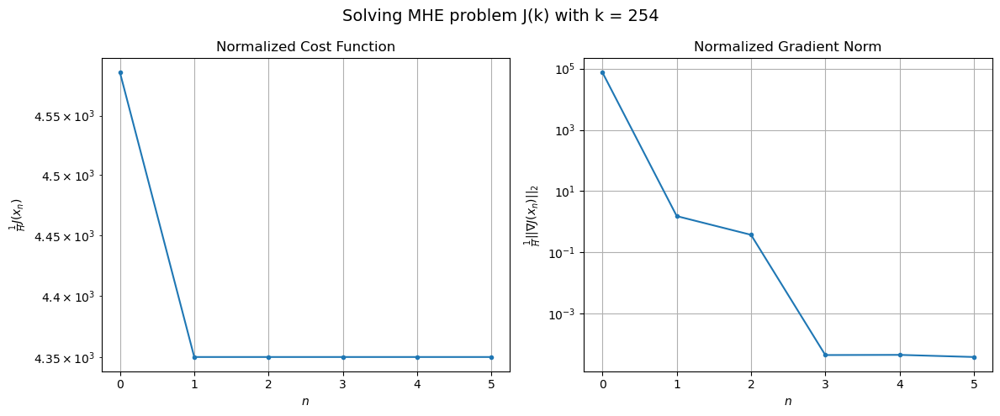

Windows:  62%|██████▏   | 226/366 [2:03:29<32:35, 13.97s/it]

[Hybrid] Before applying the algorithm
Cost function: 143625.2271656395
Gradient norm: 2638495.4317590054
Global estimation error: 26.143027939528256
Initial conditions estimation errors: 14.398053738444482 m, 6.194334220900352 m, 15.64522211933641 m, 13.892281829503812 m
Position estimation errors: 23.925134208187718 m, 24.743552507126154 m, 21.303181243493366 m, 9.607727709553552 m

[Hybrid] Iteration 1
Cost function: 136488.82810623222 (-4.97%)
Gradient norm: 2554.0998633384866 (-99.90%)
Global estimation error: 29.96673268380604 (14.63%)
Initial conditions estimation errors: 17.623396652591328 m, 9.933455807035832 m, 21.600391770664686 m, 4.707453779326889 m
Position estimation errors: 20.423034875239058 m, 30.774085943754706 m, 14.126430011424308 m, 43.21582358362178 m

[Hybrid] Iteration 2
Cost function: 136488.80609764042 (-0.00%)
Gradient norm: 32.28739308047048 (-98.74%)
Global estimation error: 30.134709966441072 (0.56%)
Initial conditions estimation errors: 17.62339642290578

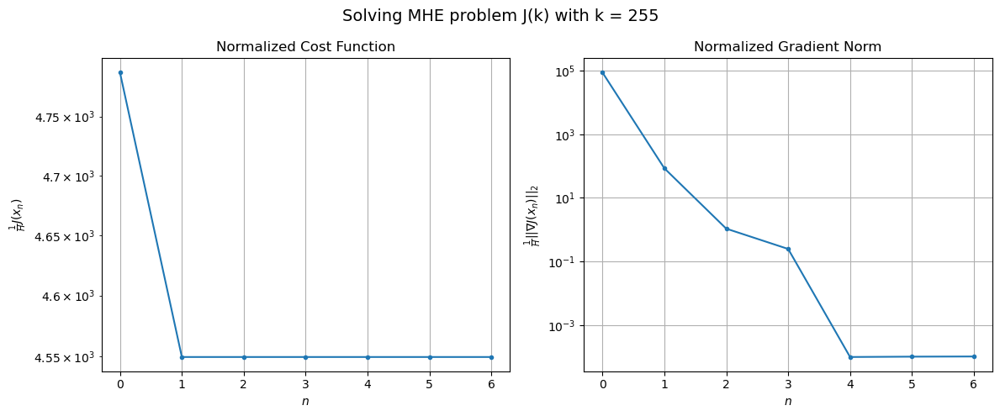

Windows:  62%|██████▏   | 227/366 [2:03:44<33:06, 14.29s/it]

[Hybrid] Before applying the algorithm
Cost function: 150718.18018201928
Gradient norm: 3237881.042569357
Global estimation error: 24.981078165694573
Initial conditions estimation errors: 14.559876896481267 m, 7.654345533454722 m, 18.471196068715315 m, 3.50446945636714 m
Position estimation errors: 24.32673639272817 m, 36.404372494581516 m, 18.06242853826322 m, 53.83125066405005 m

[Hybrid] Iteration 1
Cost function: 143392.60465628107 (-4.86%)
Gradient norm: 3445.350568902802 (-99.89%)
Global estimation error: 44.42812198915245 (77.85%)
Initial conditions estimation errors: 17.796827677540293 m, 14.92458764970659 m, 23.97690065028852 m, 29.31697760076326 m
Position estimation errors: 20.771994161977066 m, 41.99385906698533 m, 14.46764662056809 m, 91.17965383883839 m

[Hybrid] Iteration 2
Cost function: 143392.456018942 (-0.00%)
Gradient norm: 1222.6270859153437 (-64.51%)
Global estimation error: 51.34527504482575 (15.57%)
Initial conditions estimation errors: 17.796827452642592 m, 15.

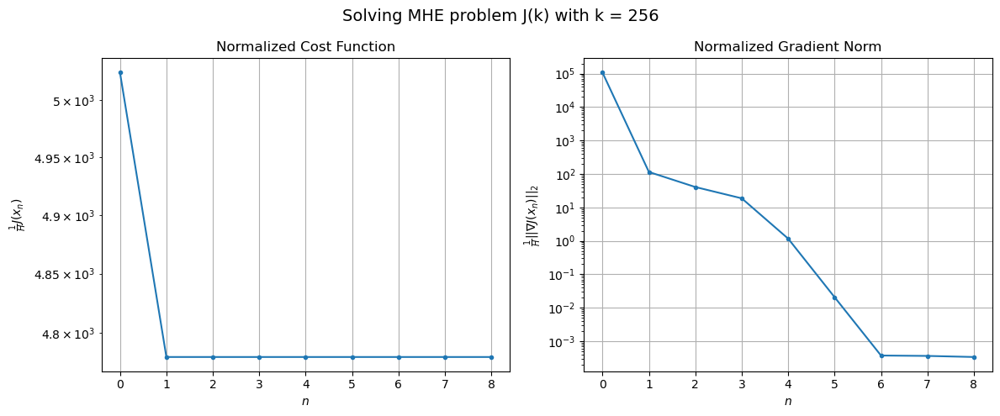

Windows:  62%|██████▏   | 228/366 [2:04:06<38:11, 16.61s/it]

[Hybrid] Before applying the algorithm
Cost function: 158063.0706123847
Gradient norm: 3989951.5455225785
Global estimation error: 61.18238503349347
Initial conditions estimation errors: 14.741196223383673 m, 16.128660506391743 m, 22.78168708157704 m, 52.41013163825912 m
Position estimation errors: 24.805121433477623 m, 56.945224315896574 m, 19.270589529119114 m, 141.3787954071745 m

[Hybrid] Iteration 1
Cost function: 150603.9743184137 (-4.72%)
Gradient norm: 7131.014866140206 (-99.82%)
Global estimation error: 34.54854438863053 (-43.53%)
Initial conditions estimation errors: 17.95492883506272 m, 13.261580885767382 m, 22.196610975249925 m, 14.235643751090644 m
Position estimation errors: 21.17999908911593 m, 38.902437392773464 m, 15.583378799488857 m, 80.35309387163942 m

[Hybrid] Iteration 2
Cost function: 150603.74443563912 (-0.00%)
Gradient norm: 12.636227084435108 (-99.82%)
Global estimation error: 35.065547722760115 (1.50%)
Initial conditions estimation errors: 17.95492862776945 

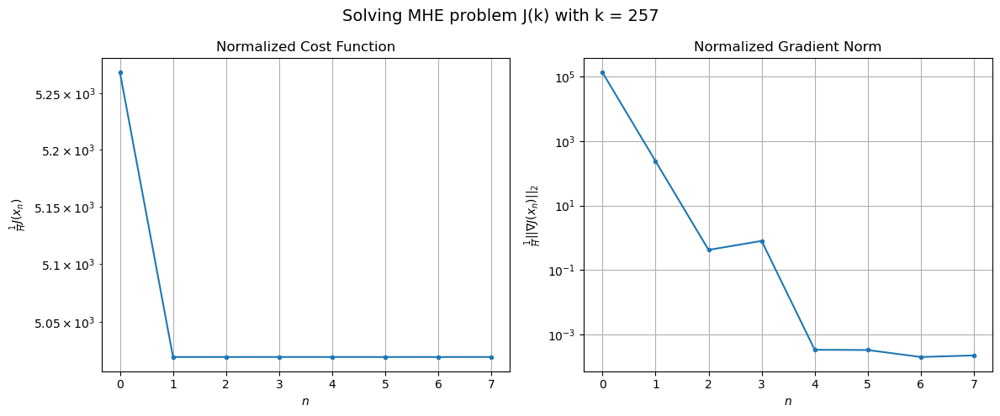

Windows:  63%|██████▎   | 229/366 [2:04:28<41:40, 18.25s/it]

[Hybrid] Before applying the algorithm
Cost function: 166661.34380812073
Gradient norm: 4722786.227912435
Global estimation error: 32.15446603333989
Initial conditions estimation errors: 14.90296858861678 m, 11.869273379879141 m, 18.57143635512764 m, 18.05612302280946 m
Position estimation errors: 25.330401905970575 m, 44.12946939548962 m, 19.480510136305135 m, 88.71628419258674 m

[Hybrid] Iteration 1
Cost function: 158987.85215736984 (-4.60%)
Gradient norm: 2421.9497952840557 (-99.95%)
Global estimation error: 50.0797144335428 (55.75%)
Initial conditions estimation errors: 18.0949542748559 m, 16.919553036987587 m, 23.171955968614988 m, 36.84187334141382 m
Position estimation errors: 21.594127191480947 m, 49.186087287294555 m, 17.854218764099326 m, 122.82855725406078 m

[Hybrid] Iteration 2
Cost function: 158987.82230371283 (-0.00%)
Gradient norm: 88.92906169790841 (-96.33%)
Global estimation error: 48.022517116674294 (-4.11%)
Initial conditions estimation errors: 18.09495411052283 m,

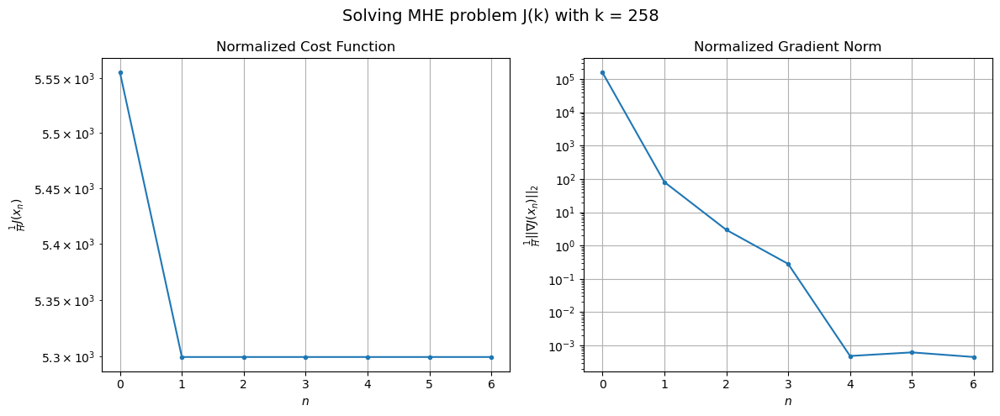

Windows:  63%|██████▎   | 230/366 [2:04:48<42:47, 18.88s/it]

[Hybrid] Before applying the algorithm
Cost function: 175666.15682398272
Gradient norm: 5537184.072609868
Global estimation error: 46.735557516658794
Initial conditions estimation errors: 15.060842202421647 m, 15.32885110775498 m, 18.450962731386728 m, 37.174699842724486 m
Position estimation errors: 25.792518962097823 m, 50.08071734534281 m, 20.44307297611969 m, 112.88312870550402 m

[Hybrid] Iteration 1
Cost function: 167600.02576645702 (-4.59%)
Gradient norm: 1424.9374065338197 (-99.97%)
Global estimation error: 68.2777704098281 (46.09%)
Initial conditions estimation errors: 18.263270904569136 m, 20.679178596992912 m, 22.596406362103686 m, 58.22422637007423 m
Position estimation errors: 21.88816986218289 m, 53.55159427205851 m, 20.236381874700683 m, 134.95157792686007 m

[Hybrid] Iteration 2
Cost function: 167600.01540420012 (-0.00%)
Gradient norm: 15.383317407616564 (-98.92%)
Global estimation error: 69.41006245465736 (1.66%)
Initial conditions estimation errors: 18.263270819632606

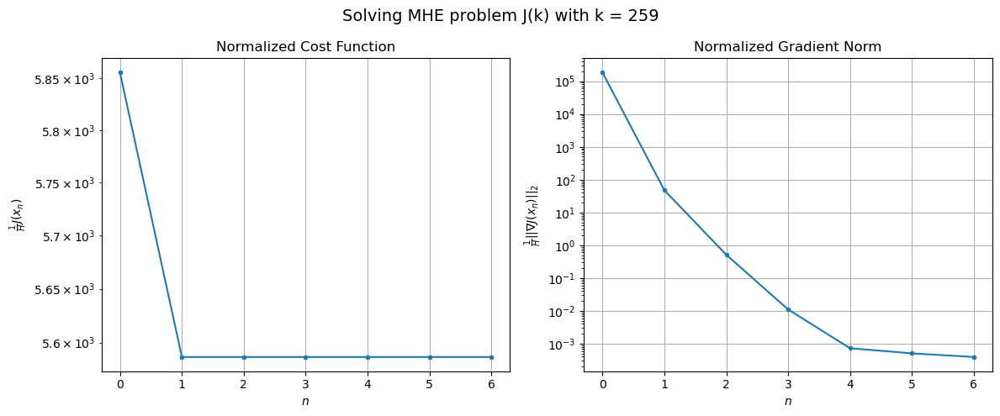

Windows:  63%|██████▎   | 231/366 [2:05:06<41:26, 18.42s/it]

[Hybrid] Before applying the algorithm
Cost function: 184878.12097889677
Gradient norm: 6167796.973973708
Global estimation error: 72.80557177912206
Initial conditions estimation errors: 15.270669563803985 m, 20.458394257292653 m, 17.97774612095179 m, 65.769996977224 m
Position estimation errors: 26.023074943051103 m, 56.78065895815423 m, 22.100554181110507 m, 135.5977983536173 m

[Hybrid] Iteration 1
Cost function: 176623.34313238115 (-4.46%)
Gradient norm: 269.1434429145878 (-100.00%)
Global estimation error: 72.07786977824938 (-1.00%)
Initial conditions estimation errors: 18.43362548828846 m, 23.61117867708296 m, 20.782182681941805 m, 62.17729942132968 m
Position estimation errors: 21.984346778049698 m, 46.958882636890294 m, 19.414140251877523 m, 121.80194101746036 m

[Hybrid] Iteration 2
Cost function: 176623.3426096446 (-0.00%)
Gradient norm: 2.3749171313322 (-99.12%)
Global estimation error: 72.50469446094664 (0.59%)
Initial conditions estimation errors: 18.43362551164782 m, 23.6

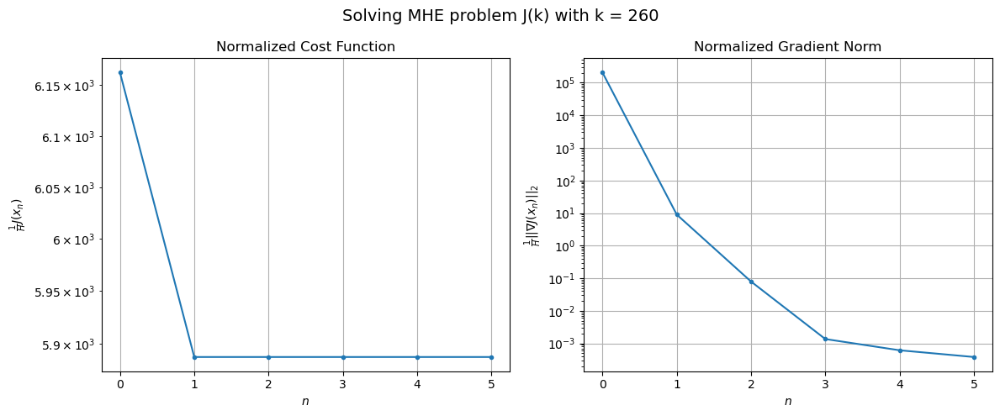

Windows:  63%|██████▎   | 232/366 [2:05:18<37:12, 16.66s/it]

[Hybrid] Before applying the algorithm
Cost function: 193186.57510224084
Gradient norm: 6658706.4448752105
Global estimation error: 75.0122621923584
Initial conditions estimation errors: 15.49852424550201 m, 22.813567691943945 m, 16.34685380888066 m, 67.81548724103956 m
Position estimation errors: 25.936875785740014 m, 49.53519113563083 m, 20.978036132312603 m, 120.36144733528843 m

[Hybrid] Iteration 1
Cost function: 184812.20644167485 (-4.33%)
Gradient norm: 1628.143086584193 (-99.98%)
Global estimation error: 79.1181565712493 (5.47%)
Initial conditions estimation errors: 18.622893241860297 m, 25.955930349815155 m, 19.247356979847005 m, 69.77598846120867 m
Position estimation errors: 21.7819626245588 m, 37.45686695064011 m, 17.588687874744494 m, 81.27185714959995 m

[Hybrid] Iteration 2
Cost function: 184812.1965344701 (-0.00%)
Gradient norm: 12.255576388675879 (-99.25%)
Global estimation error: 80.1482037587359 (1.30%)
Initial conditions estimation errors: 18.622893405150037 m, 26.1

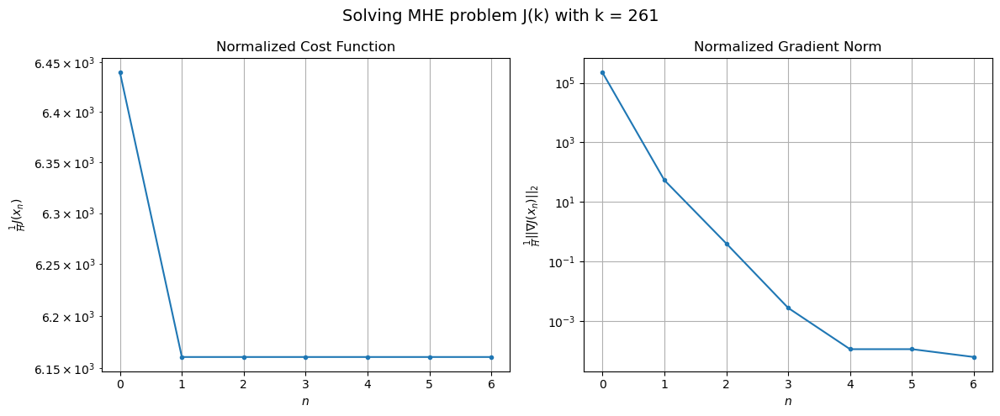

Windows:  64%|██████▎   | 233/366 [2:05:32<34:41, 15.65s/it]

[Hybrid] Before applying the algorithm
Cost function: 199938.3647142274
Gradient norm: 6905555.262059562
Global estimation error: 80.73975212770587
Initial conditions estimation errors: 15.739407525652688 m, 24.70846001155756 m, 15.267834740988118 m, 73.6719326027603 m
Position estimation errors: 25.444655690697807 m, 40.39848828940914 m, 19.457887089977284 m, 82.10273603259479 m

[Hybrid] Iteration 1
Cost function: 191489.15694557066 (-4.23%)
Gradient norm: 1850.7516474037539 (-99.97%)
Global estimation error: 69.75449155549778 (-13.61%)
Initial conditions estimation errors: 18.853353704719122 m, 25.67423741139294 m, 18.539406494838193 m, 59.222929738290034 m
Position estimation errors: 21.20399998105989 m, 29.091241260750802 m, 16.57637738828288 m, 48.58131886504552 m

[Hybrid] Iteration 2
Cost function: 191489.14221879496 (-0.00%)
Gradient norm: 2.267883117055831 (-99.88%)
Global estimation error: 70.18900675463097 (0.62%)
Initial conditions estimation errors: 18.853354022675738 m, 

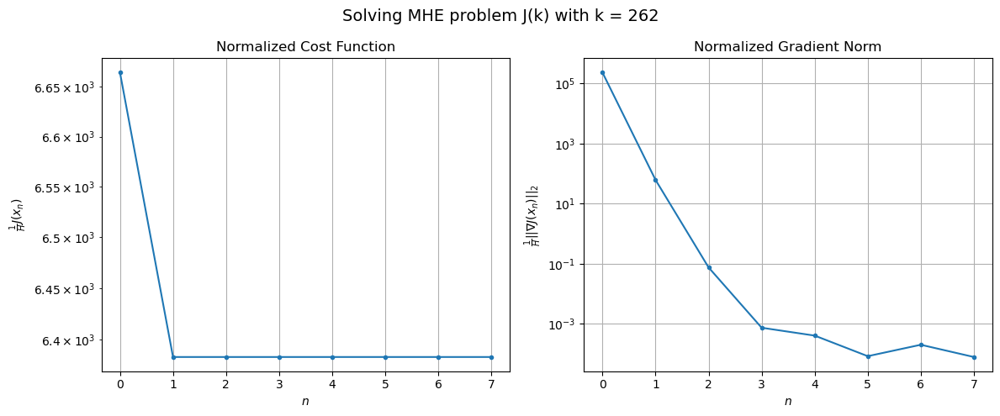

Windows:  64%|██████▍   | 234/366 [2:05:47<34:02, 15.48s/it]

[Hybrid] Before applying the algorithm
Cost function: 203776.09917342046
Gradient norm: 6869571.4445429
Global estimation error: 67.94585076531553
Initial conditions estimation errors: 15.995997038471817 m, 23.709152025728795 m, 15.013794336652683 m, 59.77642396762721 m
Position estimation errors: 24.508706004036583 m, 31.875357795178143 m, 18.758910772198522 m, 49.775579052807124 m

[Hybrid] Iteration 1
Cost function: 195576.46602083507 (-4.02%)
Gradient norm: 56.87350763870828 (-100.00%)
Global estimation error: 62.65478342455691 (-7.79%)
Initial conditions estimation errors: 19.076301948813583 m, 27.163554191127343 m, 18.351203288609796 m, 49.870659076146616 m
Position estimation errors: 20.2995534870795 m, 27.519826007257695 m, 15.420582460535357 m, 47.63691348653336 m

[Hybrid] Iteration 2
Cost function: 195576.46589916528 (-0.00%)
Gradient norm: 0.08531203292985434 (-99.85%)
Global estimation error: 62.76548517422084 (0.18%)
Initial conditions estimation errors: 19.07630240046452

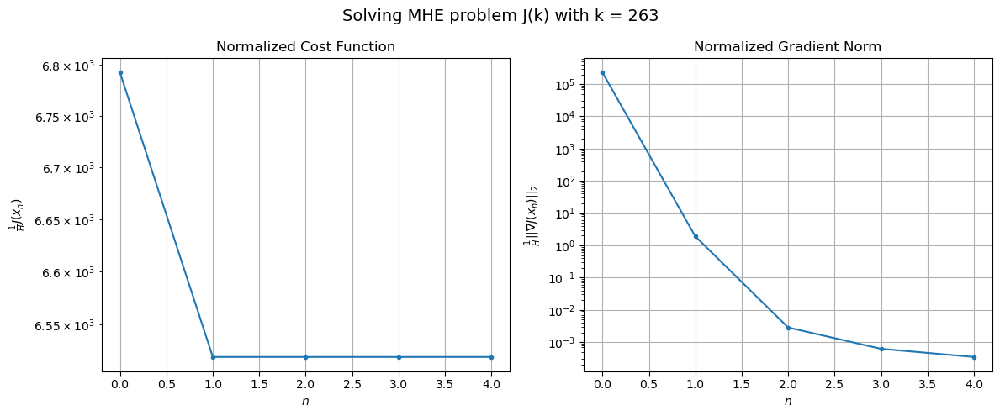

Windows:  64%|██████▍   | 235/366 [2:05:58<30:45, 14.09s/it]

[Hybrid] Before applying the algorithm
Cost function: 204339.98974212696
Gradient norm: 6570836.870278032
Global estimation error: 59.78047730094853
Initial conditions estimation errors: 16.198002527733085 m, 24.99823684417332 m, 14.865510473128094 m, 49.65306391495463 m
Position estimation errors: 23.221221589806724 m, 29.847254969985165 m, 17.218372141362586 m, 48.370683005554525 m

[Hybrid] Iteration 1
Cost function: 196468.7734460023 (-3.85%)
Gradient norm: 9602.241681370258 (-99.85%)
Global estimation error: 34.77081472521284 (-41.84%)
Initial conditions estimation errors: 19.27443546476995 m, 20.988836364604794 m, 19.145941491165583 m, 5.512490562973733 m
Position estimation errors: 19.10615098191046 m, 14.615357044551592 m, 22.877167697187794 m, 27.326241048541863 m

[Hybrid] Iteration 2
Cost function: 196468.21343334953 (-0.00%)
Gradient norm: 414.71961883862014 (-95.68%)
Global estimation error: 35.929865675514854 (3.33%)
Initial conditions estimation errors: 19.27443609272352

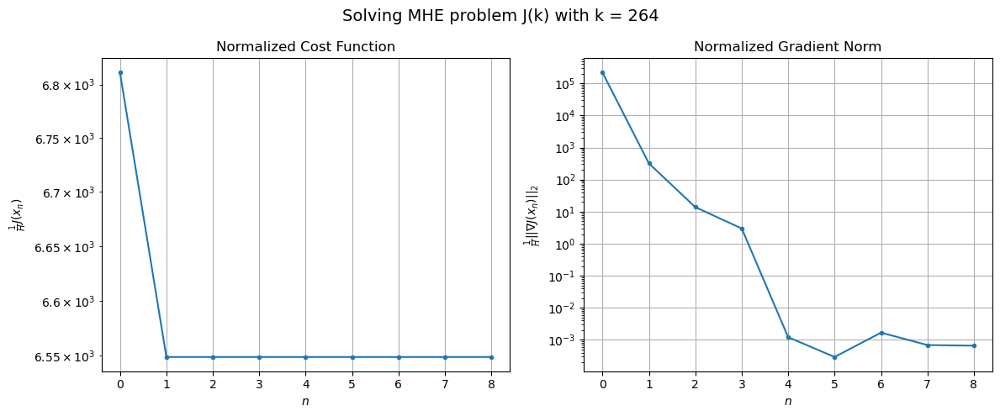

Windows:  64%|██████▍   | 236/366 [2:06:18<34:44, 16.03s/it]

[Hybrid] Before applying the algorithm
Cost function: 201756.69959248582
Gradient norm: 6069583.628885215
Global estimation error: 31.125388348778632
Initial conditions estimation errors: 16.311113978270217 m, 18.99987336107637 m, 16.161032194333043 m, 8.974931353365955 m
Position estimation errors: 21.644514682539747 m, 19.008608561314368 m, 21.666455166949802 m, 15.818863900447981 m

[Hybrid] Iteration 1
Cost function: 194519.79105879454 (-3.59%)
Gradient norm: 168.02360535477715 (-100.00%)
Global estimation error: 39.38914636989403 (26.55%)
Initial conditions estimation errors: 19.343489332821004 m, 21.73512685544506 m, 18.709777473628883 m, 18.83734659206772 m
Position estimation errors: 17.733136750996938 m, 13.927046605311292 m, 19.248265017008272 m, 19.821616909533994 m

[Hybrid] Iteration 2
Cost function: 194519.78995706586 (-0.00%)
Gradient norm: 6.236242176298481 (-96.29%)
Global estimation error: 39.71246964947506 (0.82%)
Initial conditions estimation errors: 19.343489992437

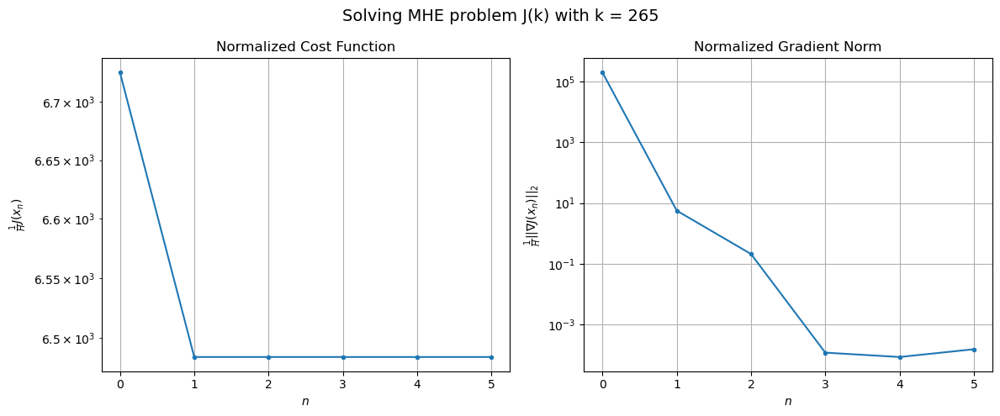

Windows:  65%|██████▍   | 237/366 [2:06:32<33:01, 15.36s/it]

[Hybrid] Before applying the algorithm
Cost function: 195775.92630943513
Gradient norm: 5501420.73096063
Global estimation error: 32.54228159698655
Initial conditions estimation errors: 16.223456939273326 m, 18.217451021668186 m, 15.739710302375393 m, 14.702677165040903 m
Position estimation errors: 19.911880356281827 m, 15.988372359824584 m, 21.159548942638317 m, 17.52148063277927 m

[Hybrid] Iteration 1
Cost function: 189008.81934366917 (-3.46%)
Gradient norm: 8.578696908850455 (-100.00%)
Global estimation error: 40.881100996366996 (25.62%)
Initial conditions estimation errors: 19.292353436177642 m, 21.25080334607168 m, 20.571018640241704 m, 20.59824519542248 m
Position estimation errors: 16.22315844301203 m, 13.520169221694259 m, 16.596134911014044 m, 20.032258111726886 m

[Hybrid] Iteration 2
Cost function: 189008.8192852753 (-0.00%)
Gradient norm: 0.26315237387040136 (-96.93%)
Global estimation error: 40.97796198331579 (0.24%)
Initial conditions estimation errors: 19.2923541269305

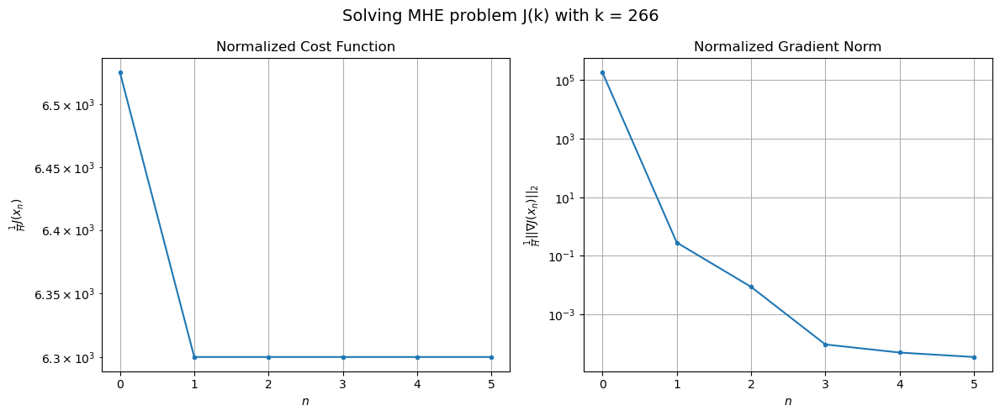

Windows:  65%|██████▌   | 238/366 [2:06:44<30:42, 14.39s/it]

[Hybrid] Before applying the algorithm
Cost function: 186713.11430258345
Gradient norm: 4808084.1811082885
Global estimation error: 33.29931694556991
Initial conditions estimation errors: 15.969010485094673 m, 17.539093188317786 m, 17.260693253295162 m, 15.756434856523923 m
Position estimation errors: 18.10691339319776 m, 15.20765529013082 m, 18.41151886385292 m, 18.280585776836254 m

[Hybrid] Iteration 1
Cost function: 180506.54628298312 (-3.32%)
Gradient norm: 2863.4249694811438 (-99.94%)
Global estimation error: 33.96753038700266 (2.01%)
Initial conditions estimation errors: 19.03729116291559 m, 19.755953589009305 m, 16.57784803670332 m, 11.234758035799944 m
Position estimation errors: 14.679077383925557 m, 14.937134439401468 m, 28.507988297105065 m, 57.166007772017686 m

[Hybrid] Iteration 2
Cost function: 180506.52078780218 (-0.00%)
Gradient norm: 0.11569966609196308 (-100.00%)
Global estimation error: 33.959081628932445 (-0.02%)
Initial conditions estimation errors: 19.0372918268

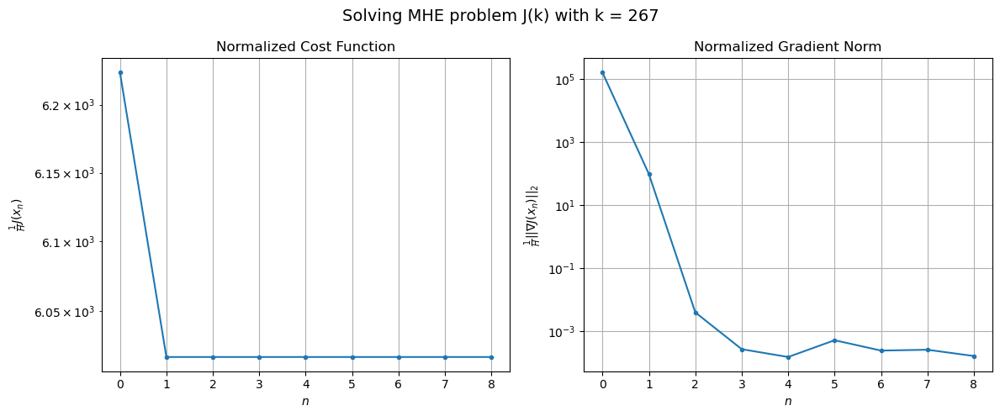

Windows:  65%|██████▌   | 239/366 [2:07:04<33:45, 15.95s/it]

[Hybrid] Before applying the algorithm
Cost function: 175878.12557568355
Gradient norm: 4100279.240260539
Global estimation error: 26.29088872257593
Initial conditions estimation errors: 15.52079140477485 m, 15.014896340310381 m, 13.907213821713228 m, 5.605921191021992 m
Position estimation errors: 16.357316519624092 m, 13.987221813738005 m, 30.301805101427643 m, 52.92222652476546 m

[Hybrid] Iteration 1
Cost function: 170251.2420170829 (-3.20%)
Gradient norm: 10112.35894915067 (-99.75%)
Global estimation error: 34.27296764718788 (30.36%)
Initial conditions estimation errors: 18.582221497706936 m, 25.2997621399162 m, 12.784522891810417 m, 5.073660982847924 m
Position estimation errors: 13.231793626068157 m, 42.493879534738625 m, 56.92078344974327 m, 135.83176573493446 m

[Hybrid] Iteration 2
Cost function: 170250.8593403292 (-0.00%)
Gradient norm: 360.1199076660133 (-96.44%)
Global estimation error: 33.574197856068174 (-2.04%)
Initial conditions estimation errors: 18.582222138618583 m,

KeyboardInterrupt: 

In [7]:
first_round_stop_iteration = []
K_minus_H_next_rounds_stop_iteration = []

# Cold-start
x_init = X_initial + np.random.multivariate_normal(np.zeros(n), P_0).reshape((n, 1))

# Apply the algorithm
X_est = np.zeros((n, 1, K))
for k in tqdm(range(H - 1, K), desc="Windows", leave=False):
    centralized_newton.cost_values, centralized_newton.gradient_norm_values = [], []
    x_init, x_est = centralized_newton.solve_MHE_problem(k, dt, Y, x_init, X_true[:, :, k - H + 1],  X_true[:, :, k])
    X_est[:, :, k] = x_est
    
    plots(k, centralized_newton)

    # Warm-start
    x_init = dyn.f(dt, x_init)

# After each Monte Carlo Run compute the RMSE_m for each K - H + 1 timestamps
position_estimation_error_1, position_estimation_error_2, position_estimation_error_3, position_estimation_error_4 = [], [], [], []
for k in range(H - 1, K):
    position_estimation_error_1.append(np.linalg.norm(X_est[:n_p, :, k] - X_true[:n_p, :, k]))
    position_estimation_error_2.append(np.linalg.norm(X_est[n_x:n_x + n_p, :, k] - X_true[n_x:n_x + n_p, :, k]))
    position_estimation_error_3.append(np.linalg.norm(X_est[2*n_x:2*n_x + n_p, :, k] - X_true[2*n_x:2*n_x + n_p, :, k]))
    position_estimation_error_4.append(np.linalg.norm(X_est[3*n_x:3*n_x + n_p, :, k] - X_true[3*n_x:3*n_x + n_p, :, k]))
rmse_1 = np.sqrt(np.mean(np.array(position_estimation_error_1) ** 2))
rmse_2 = np.sqrt(np.mean(np.array(position_estimation_error_2) ** 2))
rmse_3 = np.sqrt(np.mean(np.array(position_estimation_error_3) ** 2))
rmse_4 = np.sqrt(np.mean(np.array(position_estimation_error_4) ** 2))
print(f'This Monte Carlo run RMSE for {K - H + 1} timestamps:')
print(f'RMSE_1 = {np.mean(rmse_1)}\nRMSE_2 = {np.mean(rmse_2)}\nRMSE_3 = {np.mean(rmse_3)}\nRMSE_4 = {np.mean(rmse_4)}')
print(f'CentralizedNewton applied to J(H - 1) converged with {first_round_stop_iteration} iterations.')
print(f'CentralizedNewton applied to J(k) with k = H, ..., K - 1 converged with {np.mean(K_minus_H_next_rounds_stop_iteration)} iterations on average.')

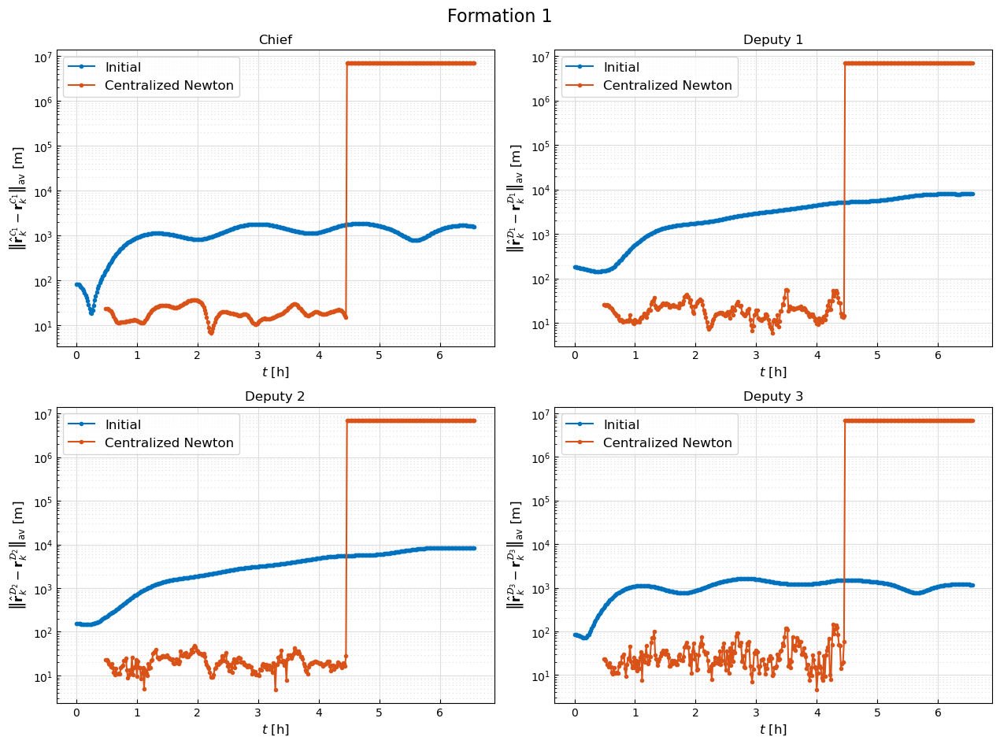

In [15]:
# MATLAB default color cycle
matlab_default_colors = [
    [0, 0.4470, 0.7410],  # blue
    [0.8500, 0.3250, 0.0980],  # orange
    [0.9290, 0.6940, 0.1250],  # yellow
    [0.4940, 0.1840, 0.5560],  # purple
    [0.4660, 0.6740, 0.1880],  # green
    [0.3010, 0.7450, 0.9330],  # light blue
    [0.6350, 0.0780, 0.1840],  # red
]
# Set the color cycle in Matplotlib to match MATLAB's default
plt.rcParams["axes.prop_cycle"] = plt.cycler(color=matlab_default_colors)

time = np.arange(0, K) / dt
algorithm = "Centralized Newton"

# Plot positions based on screen size
fig_width = 2 * 6.4  # in inchesa
fig_height = 2 * 4.8  # in inches

# Create a 2 by 2 figure
fig, axs = plt.subplots(2, 2, figsize=(fig_width, fig_height))

# Plot 1: Chief
axs[0, 0].plot(time, position_estimation_error_1_initial, ".-", label="Initial")
axs[0, 0].plot(time[H - 1:], position_estimation_error_1, ".-", label=algorithm)
axs[0, 0].grid(which="major", color="#DDDDDD", zorder=1)
axs[0, 0].grid(which="minor", color="#DDDDDD", linestyle=(0, (1, 3)), zorder=2)
axs[0, 0].grid(True, which="both")
axs[0, 0].set_yscale("log")
axs[0, 0].set_xlabel("$t$ [h]", fontsize=12)
axs[0, 0].set_ylabel(
    "$\\left\\|\\hat{\\mathbf{r}}_k^{\\mathcal{C}_1} - \\mathbf{r}_k^{\\mathcal{C}_1}\\right\\|_\\mathrm{av}$ [m]",
    fontsize=12,
)
# axs[0, 0].set_ylim([1e-2, 1e3])
axs[0, 0].tick_params(axis="both", which="both", direction="in")
axs[0, 0].legend(fontsize=12)
axs[0, 0].set_title("Chief")

# Plot 2: Deputy 1
axs[0, 1].plot(time, position_estimation_error_2_initial, ".-", label="Initial")
axs[0, 1].plot(time[H - 1:], position_estimation_error_2, ".-", label=algorithm)
axs[0, 1].grid(which="major", color="#DDDDDD", zorder=1)
axs[0, 1].grid(which="minor", color="#DDDDDD", linestyle=(0, (1, 3)), zorder=2)
axs[0, 1].grid(True, which="both")
axs[0, 1].set_yscale("log")
axs[0, 1].set_xlabel("$t$ [h]", fontsize=12)
axs[0, 1].set_ylabel(
    "$\\left\\|\\hat{\\mathbf{r}}_k^{\\mathcal{D}_1} - \\mathbf{r}_k^{\\mathcal{D}_1}\\right\\|_\\mathrm{av}$ [m]",
    fontsize=12,
)
# axs[0, 1].set_ylim([1e-1, 1e3])
axs[0, 1].tick_params(axis="both", which="both", direction="in")
axs[0, 1].legend(fontsize=12)
axs[0, 1].set_title("Deputy 1")

# Plot 3: Deputy 2
axs[1, 0].plot(time, position_estimation_error_3_initial, ".-", label="Initial")
axs[1, 0].plot(time[H - 1:], position_estimation_error_3, ".-", label=algorithm)
axs[1, 0].grid(which="major", color="#DDDDDD", zorder=1)
axs[1, 0].grid(which="minor", color="#DDDDDD", linestyle=(0, (1, 3)), zorder=2)
axs[1, 0].grid(True, which="both")
axs[1, 0].set_yscale("log")
axs[1, 0].set_xlabel("$t$ [h]", fontsize=12)
axs[1, 0].set_ylabel(
    "$\\left\\|\\hat{\\mathbf{r}}_k^{\\mathcal{D}_2} - \\mathbf{r}_k^{\\mathcal{D}_2}\\right\\|_\\mathrm{av}$ [m]",
    fontsize=12,
)
# axs[1, 0].set_ylim([1e-1, 1e3])
axs[1, 0].tick_params(axis="both", which="both", direction="in")
axs[1, 0].legend(fontsize=12)
axs[1, 0].set_title("Deputy 2")

# Plot 4: Deputy 3
axs[1, 1].plot(time, position_estimation_error_4_initial, ".-", label="Initial")
axs[1, 1].plot(time[H - 1:], position_estimation_error_4, ".-", label=algorithm)
axs[1, 1].grid(which="major", color="#DDDDDD", zorder=1)
axs[1, 1].grid(which="minor", color="#DDDDDD", linestyle=(0, (1, 3)), zorder=2)
axs[1, 1].grid(True, which="both")
axs[1, 1].set_yscale("log")
axs[1, 1].set_xlabel("$t$ [h]", fontsize=12)
axs[1, 1].set_ylabel(
    "$\\left\\|\\hat{\\mathbf{r}}_k^{\\mathcal{D}_3} - \\mathbf{r}_k^{\\mathcal{D}_3}\\right\\|_\\mathrm{av}$ [m]",
    fontsize=12,
)
# axs[1, 1].set_ylim([1e-1, 1e3])
axs[1, 1].tick_params(axis="both", which="both", direction="in")
axs[1, 1].legend(fontsize=12)
axs[1, 1].set_title("Deputy 3")

fig.suptitle(f"Formation {formation}", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 1])
plt.show()